In [3]:
# Standard libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error

# For Machine Learning (PyTorch)
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [4]:
root = "tensile_fatigue_data_ong_bootstrap.xlsx"
main_df = pd.read_excel(root)

### Correlation Table

In [5]:
main_df.tail(3)

,BHN,σu,True Fracture σ,RA,True Fracture Strain,E,σf',b,εf',c
297,280,1000,1220,33,0.41,195,1220,-0.073,0.41,-0.060
298,430,1640,1779,38,0.89,195,1780,-0.067,0.32,-0.056
299,595,2240,2723,41,0.52,205,2725,-0.081,0.07,-0.060


Text(0.5, 1.0, 'Correlation Heatmap of Tensile inputs to Fatigue Constants')

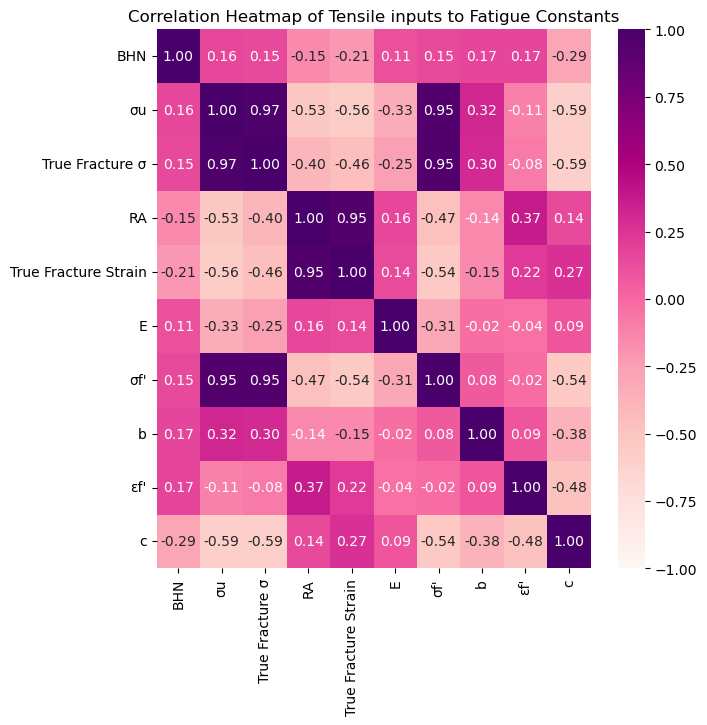

In [6]:
f, axes = plt.subplots(1, 1, figsize = (7, 7), sharey = True)

g2 = sb.heatmap(main_df.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f", cmap = "RdPu")
g2.set_title("Correlation Heatmap of Tensile inputs to Fatigue Constants")

---

# GBR + DNN Model

### Function

In [11]:
def GBR_NN(variable):
    name_list = ["Sigmaf", "b", "Epsilonf", "c"]
    
    # 1. Prepare the data
    df_x = pd.read_excel(root,usecols=[0,1,2,3,4,5])
    df_y = pd.read_excel(root,usecols=[variable])
    
    X_train, X_test, y_train, y_test = train_test_split(df_x, df_y, test_size = 0.2, random_state = 42)
    
    y_train = np.array(y_train,dtype = np.float32).ravel()
    y_test = np.array(y_test,dtype = np.float32).ravel()
    
    # 2. Train the Gradient Boosting Regressor
    gbr = GradientBoostingRegressor(n_estimators = 10000, learning_rate = 0.01, max_depth = 2, random_state = 42, tol = 1e-5)
    gbr.fit(X_train, y_train)
    
    # Get the predictions from Gradient Boosting Regressor
    gbr_train_pred = gbr.predict(X_train)
    gbr_test_pred = gbr.predict(X_test)
    
    # Combine the original features and the GBR predictions as new inputs for the Neural Network
    X_train_nn = np.hstack([X_train, gbr_train_pred.reshape(-1, 1)])
    X_test_nn = np.hstack([X_test, gbr_test_pred.reshape(-1, 1)])
    
    # Convert data to PyTorch tensors
    X_train_tensor = torch.tensor(X_train_nn, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
    X_test_tensor = torch.tensor(X_test_nn, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)
    
    # 3. Define a simple neural network in PyTorch
    class RegressionNN(nn.Module):
        def __init__(self, input_size):
            super(RegressionNN, self).__init__()
            self.fc1 = nn.Linear(input_size, 64)
            self.fc2 = nn.Linear(64, 128)
            self.fc3 = nn.Linear(128, 256)
            self.fc4 = nn.Linear(256, 128)
            self.fc5 = nn.Linear(128, 64)
            self.fc6 = nn.Linear(64, 1)
       
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = torch.relu(self.fc3(x))
            x = torch.relu(self.fc4(x))
            x = torch.relu(self.fc5(x))
            x = self.fc6(x)
            return x
    
    # Create the neural network
    input_size = X_train_nn.shape[1]
    model = RegressionNN(input_size)
    
    # 4. Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Regularization parameters
    lambda_l1 = 0   # L1 penalty strength
    lambda_l2 = 0   # L2 penalty strength

    # L2 can also be directly included in the optimizer as weight_decay
    optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=lambda_l2)
    
    plt.ion()
    
    # 5. Train the Neural Network
    n_epochs = 2000 # Default 1000
    for epoch in range(n_epochs):
        model.train()
       
        # Forward pass
        y_train_pred = model(X_train_tensor)
        y_test_pred  = model(X_test_tensor)
        loss = criterion(y_train_pred, y_train_tensor)
        
        #Note: L2 Regularization already handled in optimizer via weight_decay

        # Add L1 Regularization
        l1_norm = sum(param.abs().sum() for param in model.parameters())
        loss += lambda_l1 * l1_norm
       
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        # Obtaining R2 scores for train and test datasets
        r2_train = r2_score(y_train_tensor.data.numpy(), y_train_pred.detach().numpy())
        r2_test  = r2_score(y_test_tensor.data.numpy(), y_test_pred.detach().numpy())

        if (epoch+1) % 20 == 0:
            print(f'[{name_list[variable-6]}] Epoch [{epoch+1}/{n_epochs}], Loss: {loss.item():.4f}')
            print("Train R²: ", "%.5f" % round(r2_train, 5))
            print("Test R² : ", "%.5f" % round(r2_test, 5))

            fig, axes = plt.subplots(2, 2, figsize = (7,5))
            axes[0, 0].scatter(y_train_tensor, y_train_pred.detach().numpy())
            axes[0, 0].plot([min(y_train_tensor.data.numpy()), max(y_train_tensor.data.numpy())],[min(y_train_tensor.data.numpy()), max(y_train_tensor.data.numpy())], color = 'r')
            axes[0, 0].set_title("Training Data")
            axes[0, 0].set_xlabel("Actual values")
            axes[0, 0].set_ylabel("Predicted values")
    
            axes[0, 1].scatter(y_test_tensor, y_test_pred.detach().numpy())
            axes[0, 1].plot([min(y_test_tensor.data.numpy()), max(y_test_tensor.data.numpy())],[min(y_test_tensor.data.numpy()), max(y_test_tensor.data.numpy())], color = 'r')
            axes[0, 1].set_title("Test Data")
            axes[0, 1].set_xlabel("Actual values")
            axes[0, 1].set_ylabel("Predicted values")
    
            # axes[1, 0].plot(y_train_tensor.data.numpy().squeeze()*10,'tab:orange', label = 'real')
            # axes[1, 0].plot(y_train_pred.detach().numpy()*10,'tab:green',label = 'pred')
            # axes[1, 0].set_xlabel("Sample Number")
            # axes[1, 0].set_ylabel("Fatigue Constant Value")
            # axes[1, 0].legend()
    
            # axes[1, 1].plot(y_test_tensor.data.numpy().squeeze()*10, 'tab:orange',label = 'real')
            # axes[1, 1].plot(y_test_pred.detach().numpy()*10,'tab:green',label = 'pred')
            # axes[1, 1].set_xlabel("Sample Number")
            # axes[1, 1].set_ylabel("Fatigue Constant Value")
            # axes[1, 1].legend()

            plt.tight_layout()
            
            plt.show()
    
            plt.draw();plt.pause(0.05)
    
    plt.ioff()
    plt.show()

### Variable Testing

[Sigmaf] Epoch [20/2000], Loss: 2690697.5000
Train R²:  -6.59793
Test R² :  -6.06910


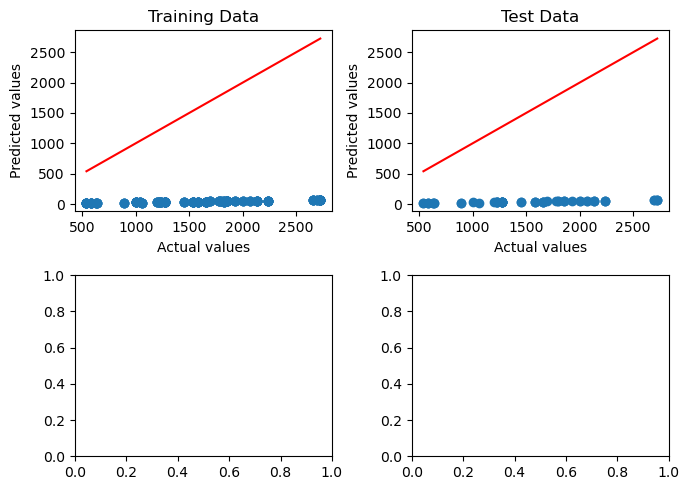

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [40/2000], Loss: 2452505.5000
Train R²:  -5.92533
Test R² :  -5.43851


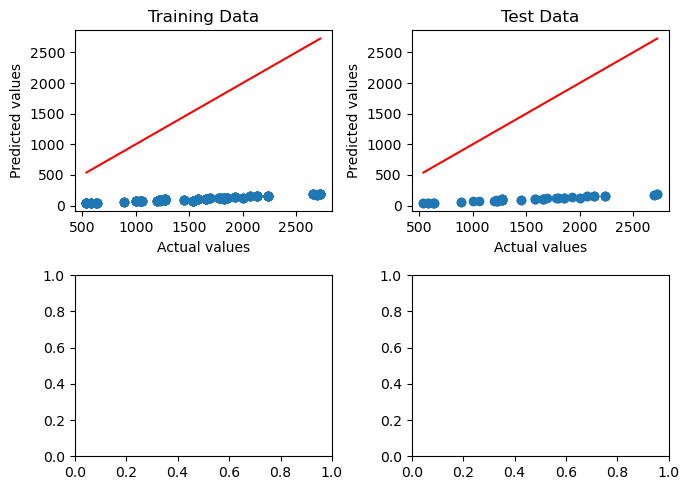

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [60/2000], Loss: 1947583.5000
Train R²:  -4.49954
Test R² :  -4.10161


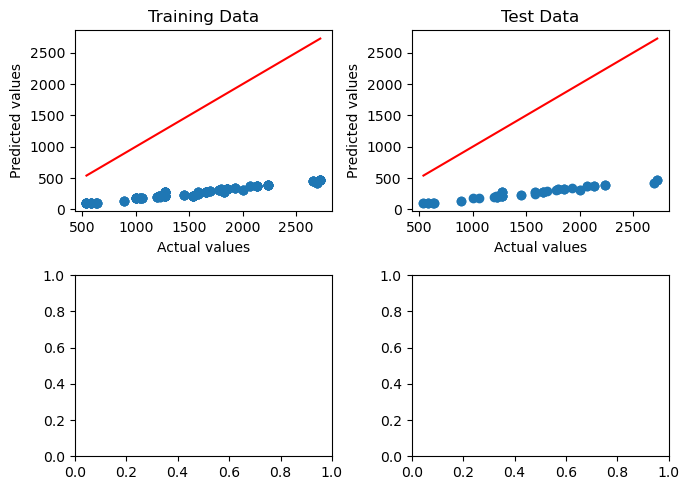

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [80/2000], Loss: 977281.9375
Train R²:  -1.75962
Test R² :  -1.53764


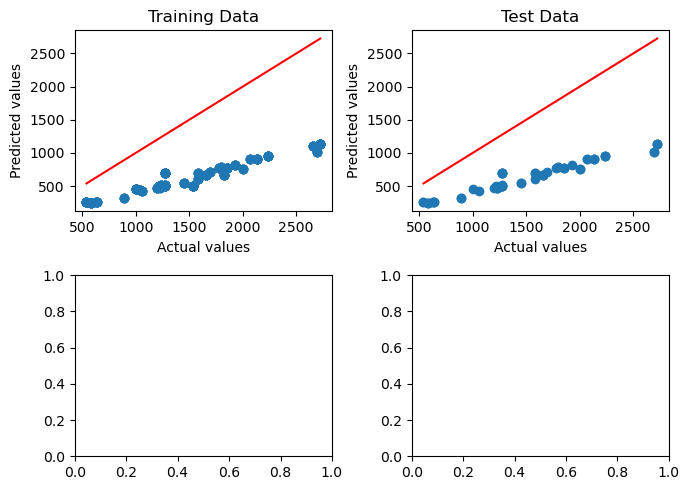

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [100/2000], Loss: 63013.0156
Train R²:  0.82207
Test R² :  0.85120


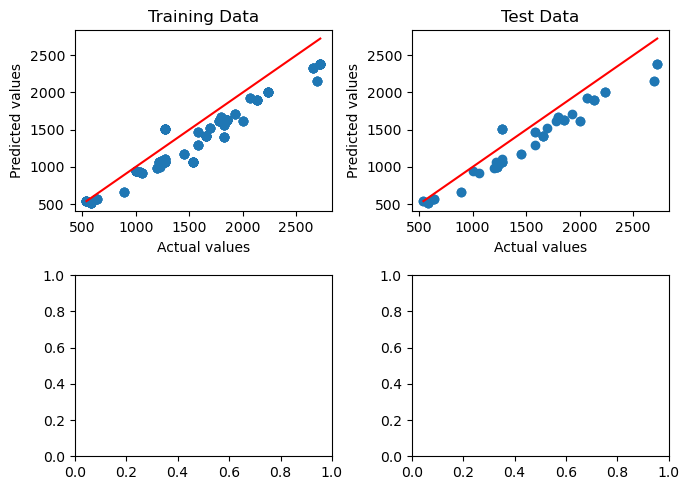

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [120/2000], Loss: 33820.8398
Train R²:  0.90450
Test R² :  0.90911


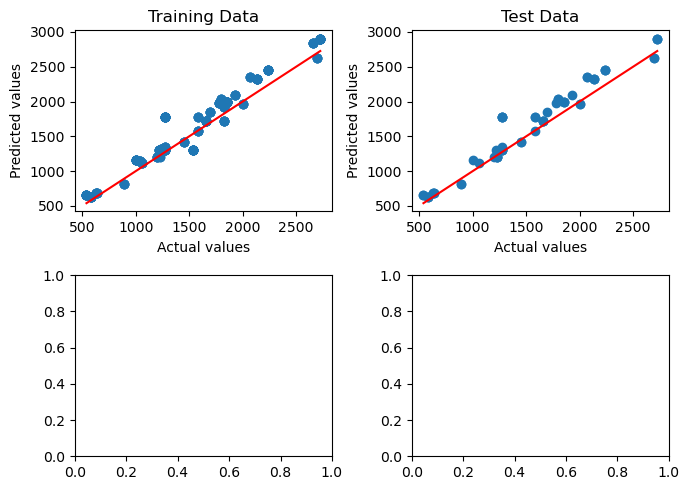

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [140/2000], Loss: 18863.0293
Train R²:  0.94674
Test R² :  0.95986


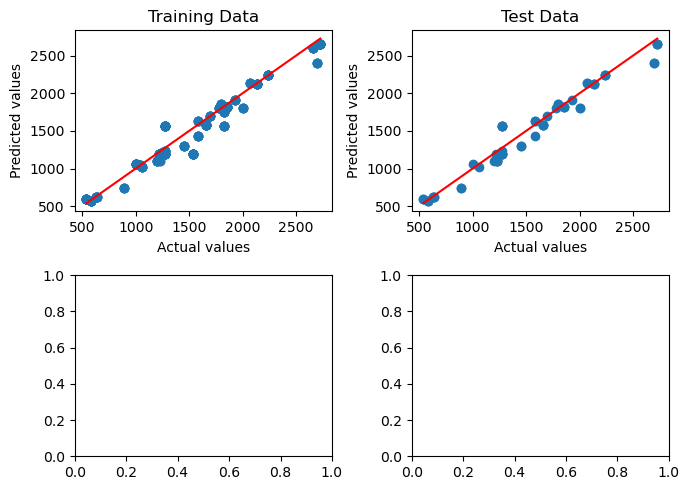

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [160/2000], Loss: 15443.5498
Train R²:  0.95639
Test R² :  0.96650


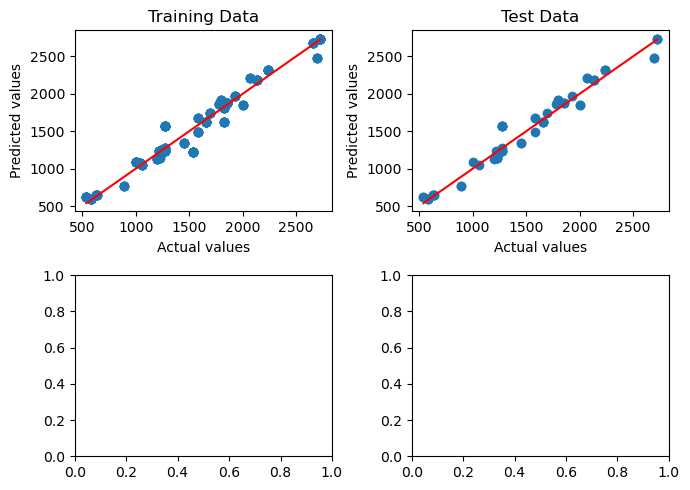

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [180/2000], Loss: 13915.4326
Train R²:  0.96071
Test R² :  0.97126


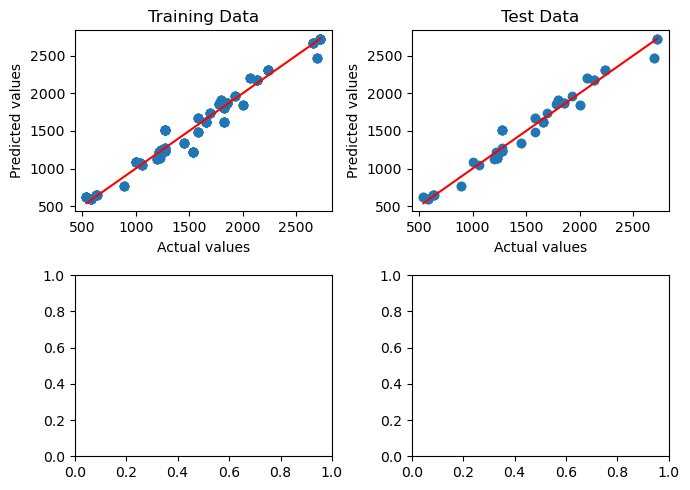

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [200/2000], Loss: 12710.2275
Train R²:  0.96411
Test R² :  0.97444


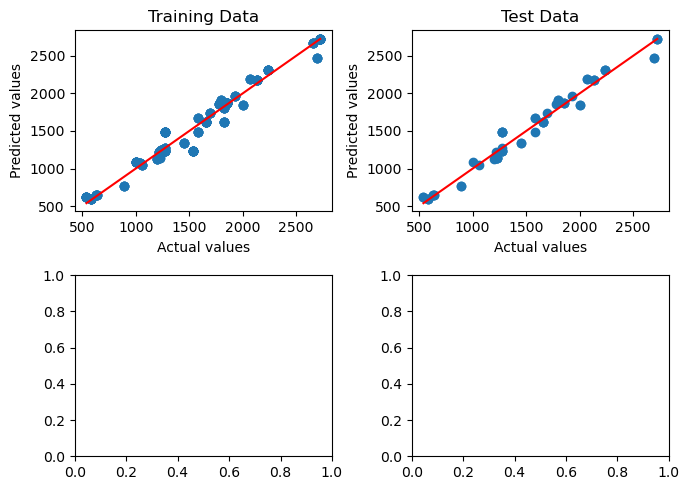

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [220/2000], Loss: 11690.5498
Train R²:  0.96699
Test R² :  0.97693


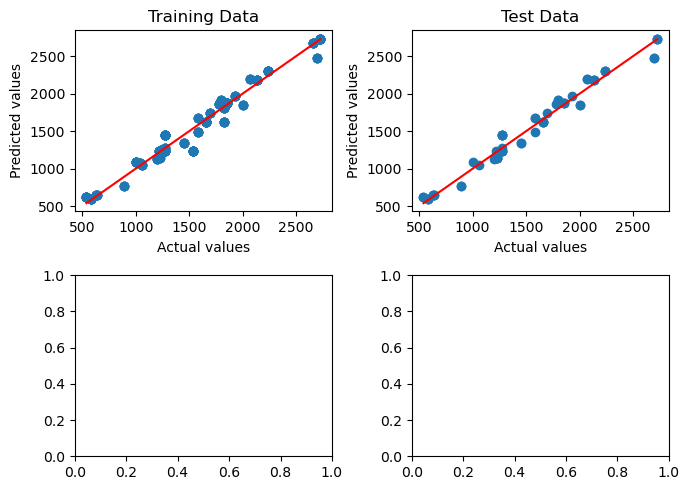

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [240/2000], Loss: 10796.7393
Train R²:  0.96951
Test R² :  0.97903


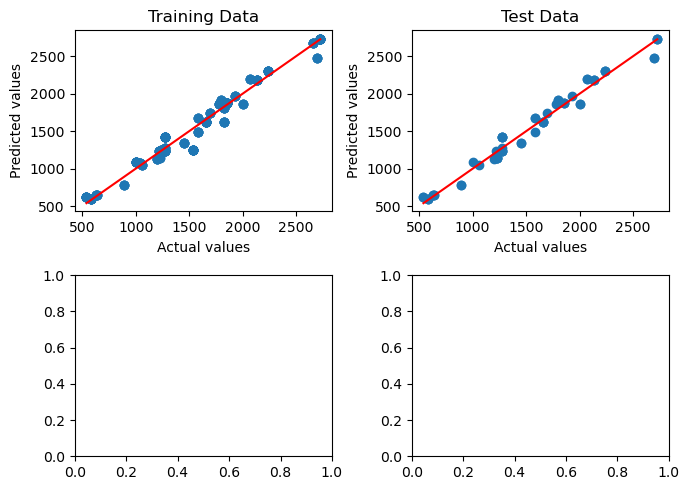

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [260/2000], Loss: 9945.5518
Train R²:  0.97192
Test R² :  0.98094


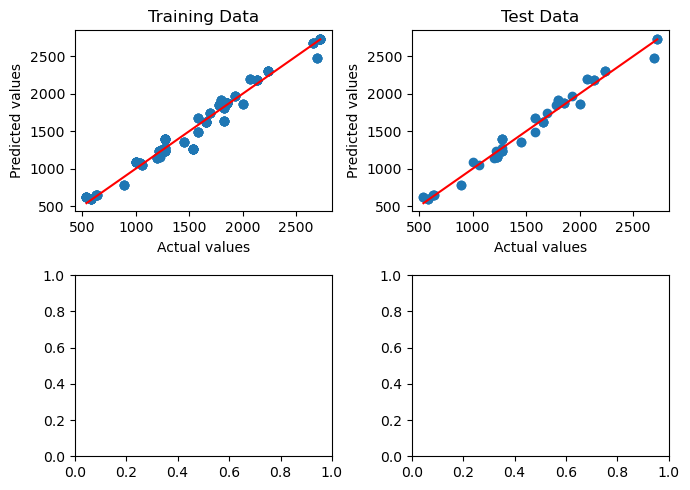

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [280/2000], Loss: 9073.2129
Train R²:  0.97438
Test R² :  0.98289


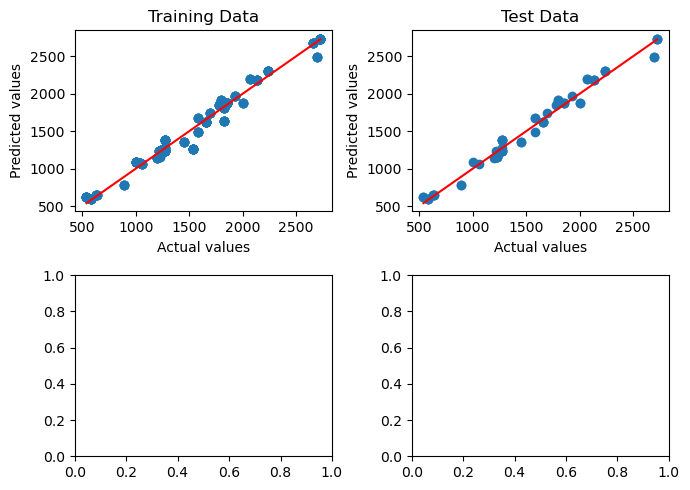

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [300/2000], Loss: 8245.3643
Train R²:  0.97672
Test R² :  0.98467


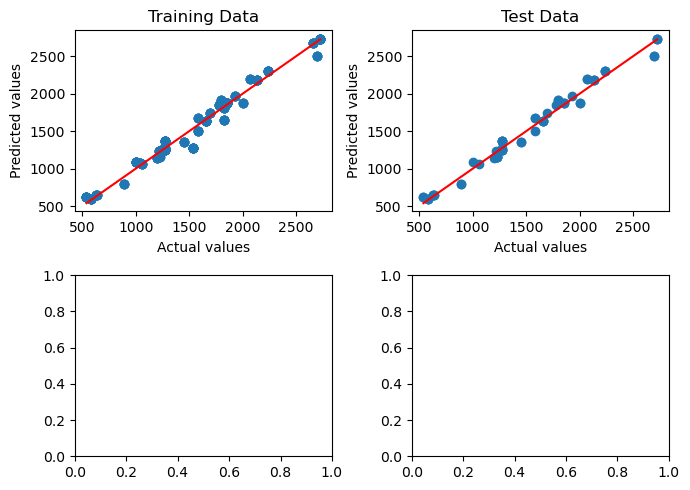

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [320/2000], Loss: 7463.3364
Train R²:  0.97893
Test R² :  0.98630


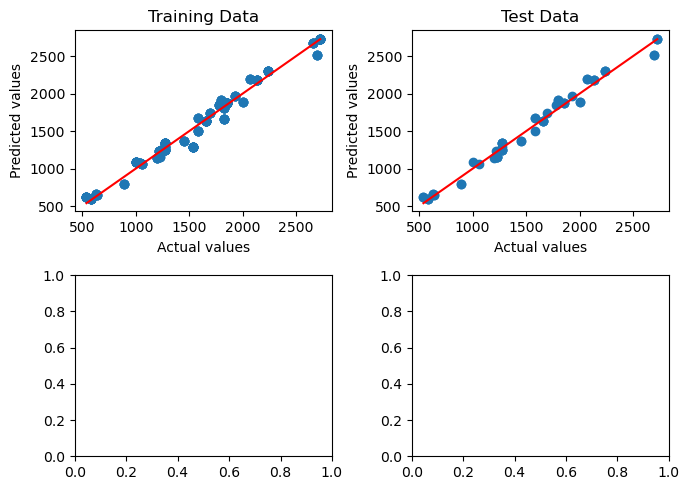

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [340/2000], Loss: 6674.1704
Train R²:  0.98115
Test R² :  0.98792


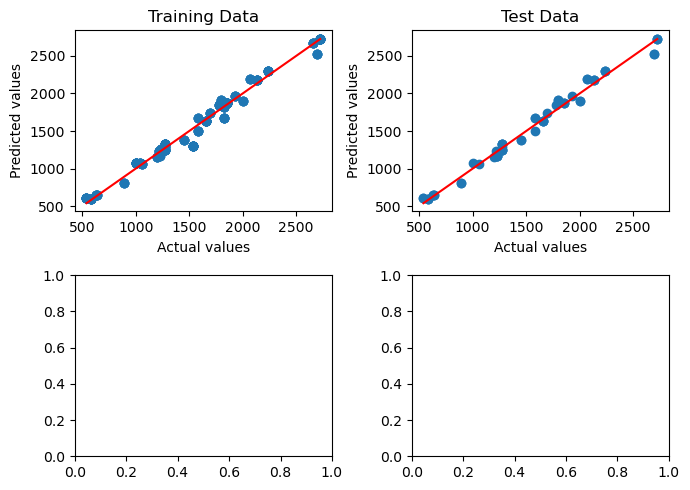

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [360/2000], Loss: 5928.0669
Train R²:  0.98326
Test R² :  0.98943


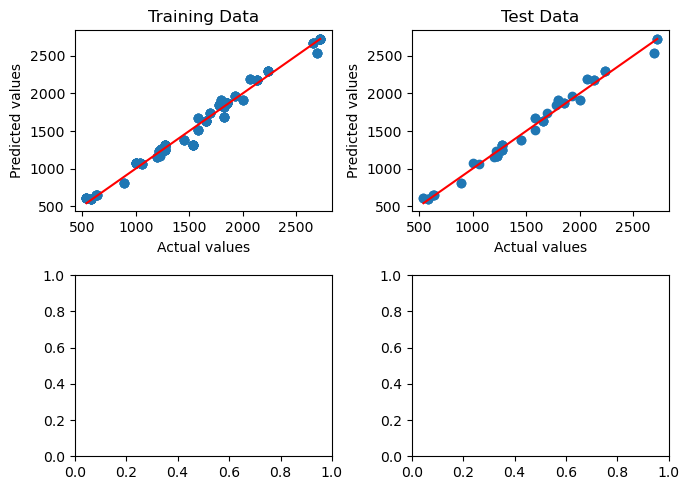

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [380/2000], Loss: 5194.8765
Train R²:  0.98533
Test R² :  0.99111


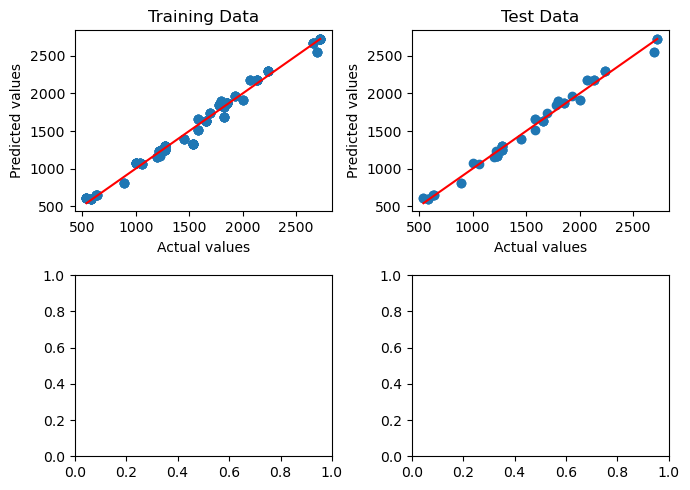

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [400/2000], Loss: 4598.4053
Train R²:  0.98702
Test R² :  0.99223


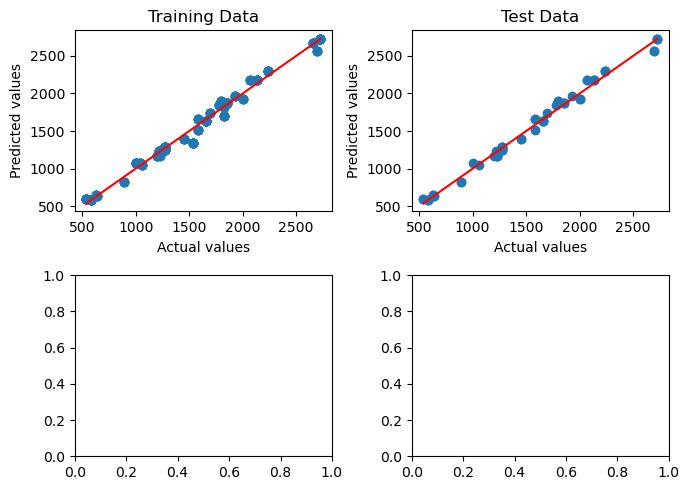

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [420/2000], Loss: 4020.7644
Train R²:  0.98865
Test R² :  0.99324


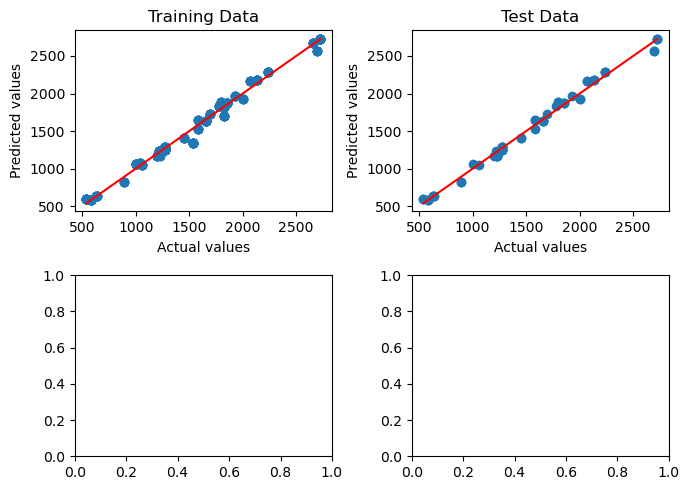

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [440/2000], Loss: 3499.0481
Train R²:  0.99012
Test R² :  0.99410


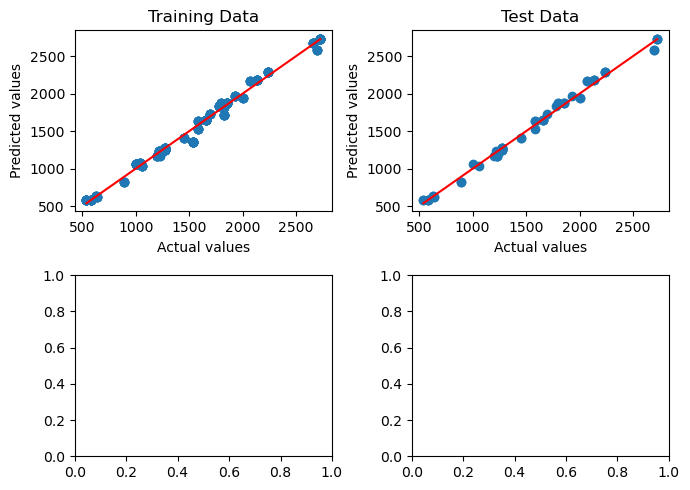

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [460/2000], Loss: 3047.5981
Train R²:  0.99139
Test R² :  0.99480


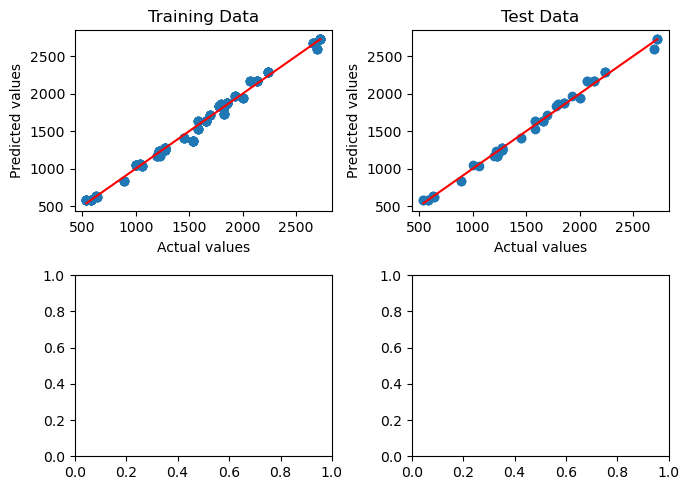

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [480/2000], Loss: 2638.4102
Train R²:  0.99255
Test R² :  0.99545


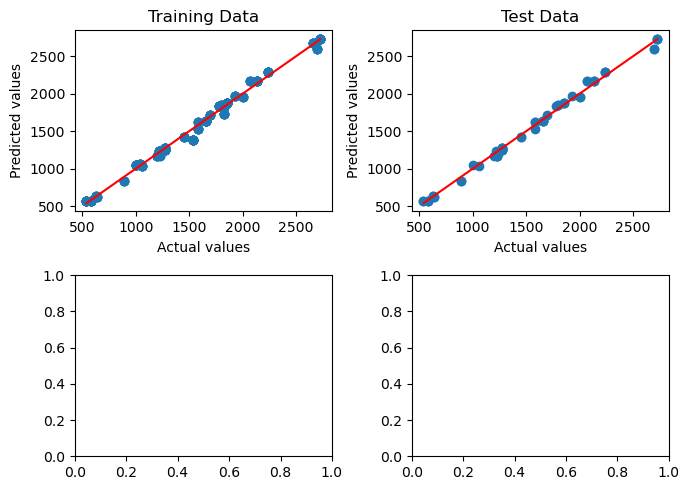

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [500/2000], Loss: 2199.6750
Train R²:  0.99379
Test R² :  0.99609


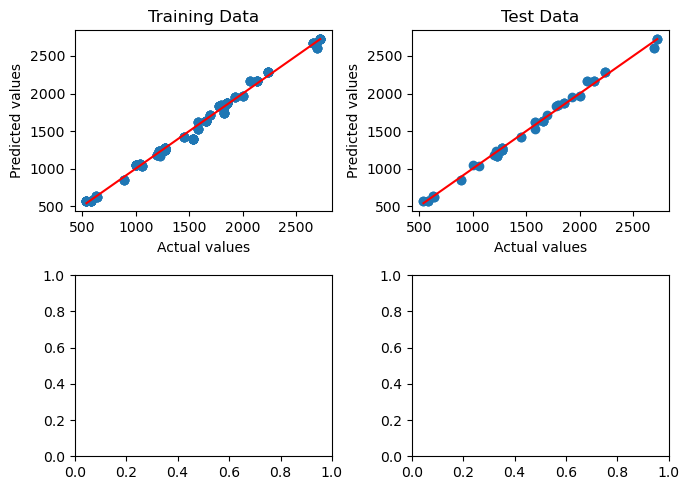

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [520/2000], Loss: 1749.4380
Train R²:  0.99506
Test R² :  0.99684


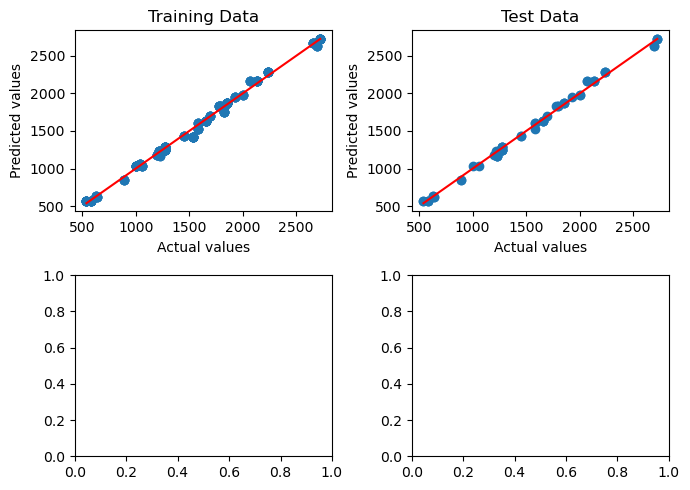

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [540/2000], Loss: 1406.4243
Train R²:  0.99603
Test R² :  0.99741


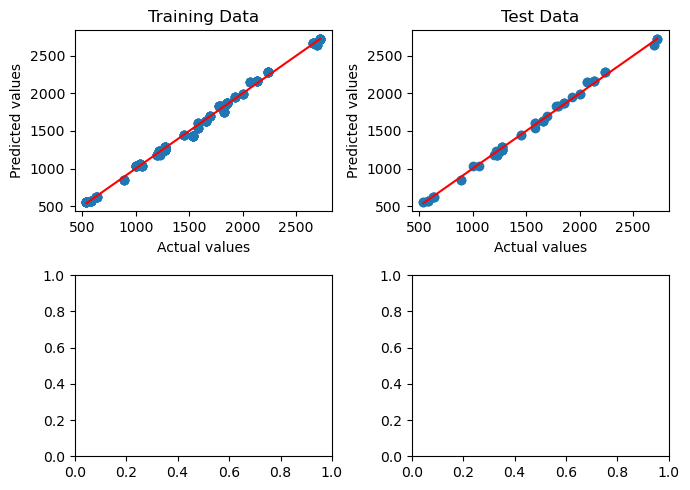

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [560/2000], Loss: 1157.4591
Train R²:  0.99673
Test R² :  0.99782


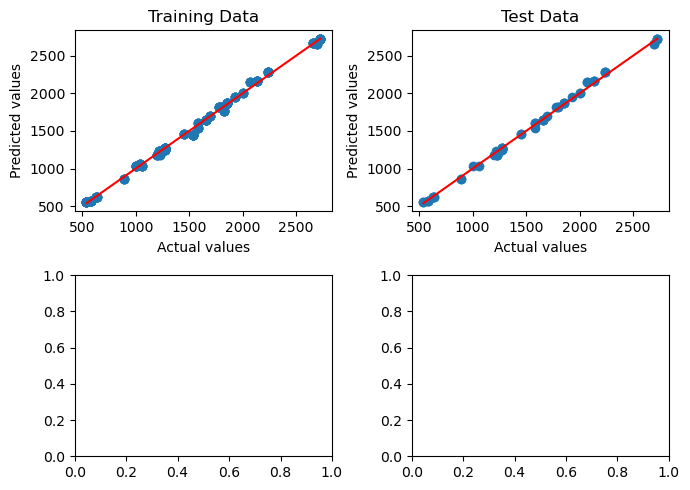

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [580/2000], Loss: 951.0012
Train R²:  0.99731
Test R² :  0.99815


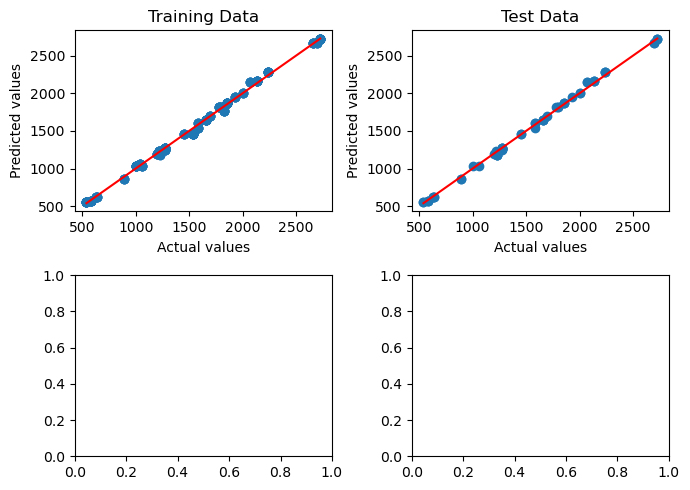

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [600/2000], Loss: 779.0349
Train R²:  0.99780
Test R² :  0.99842


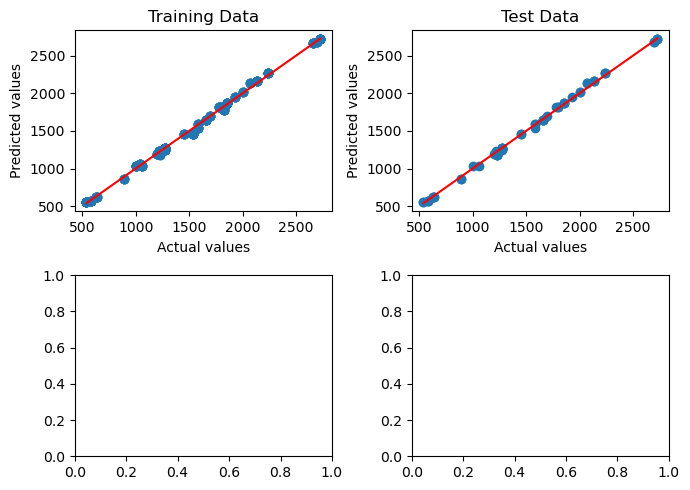

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [620/2000], Loss: 637.0540
Train R²:  0.99820
Test R² :  0.99865


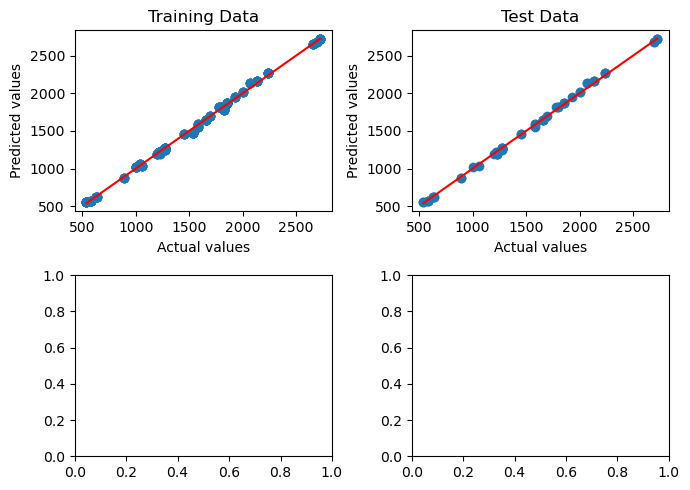

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [640/2000], Loss: 520.3875
Train R²:  0.99853
Test R² :  0.99885


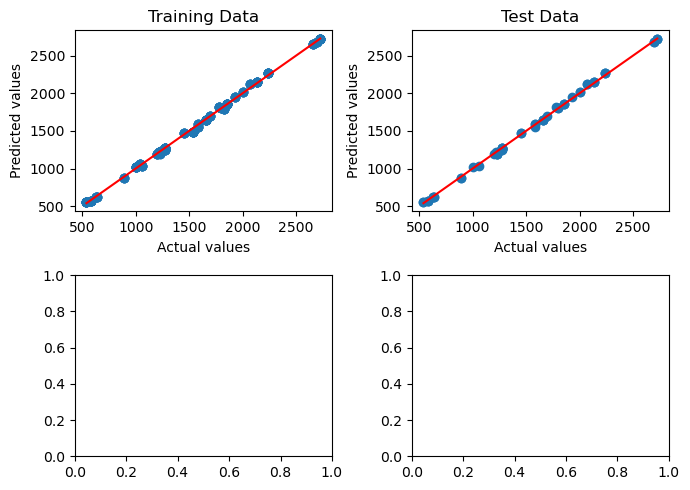

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [660/2000], Loss: 425.7657
Train R²:  0.99880
Test R² :  0.99901


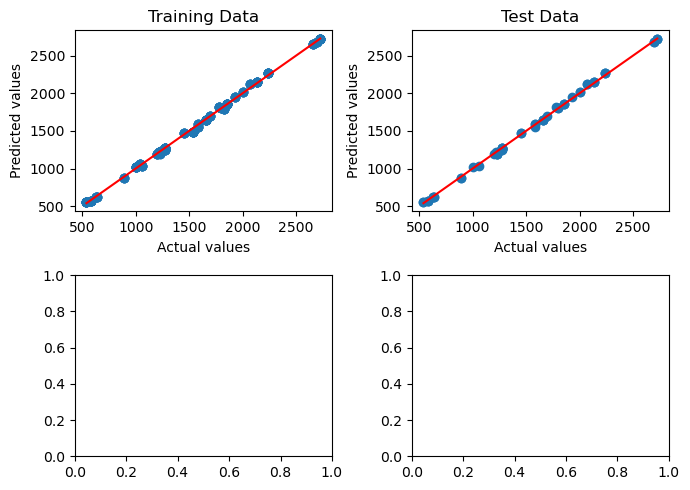

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [680/2000], Loss: 351.1791
Train R²:  0.99901
Test R² :  0.99914


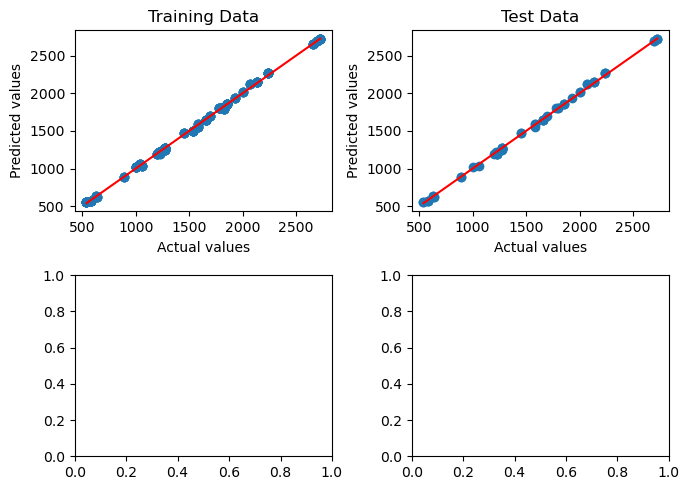

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [700/2000], Loss: 291.7061
Train R²:  0.99918
Test R² :  0.99925


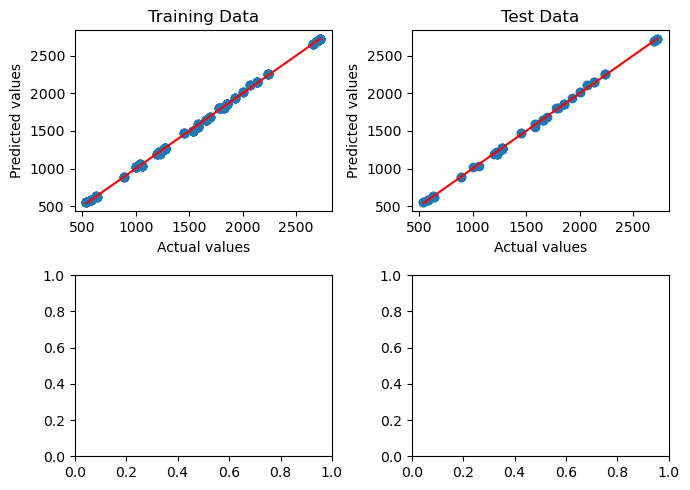

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [720/2000], Loss: 245.1191
Train R²:  0.99931
Test R² :  0.99934


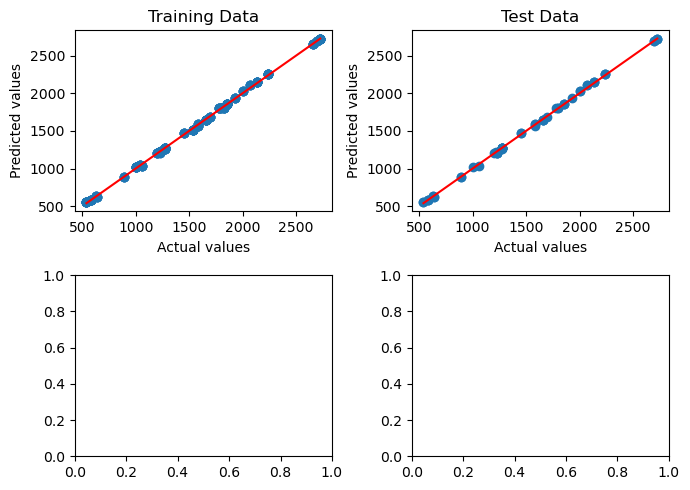

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [740/2000], Loss: 209.8606
Train R²:  0.99941
Test R² :  0.99941


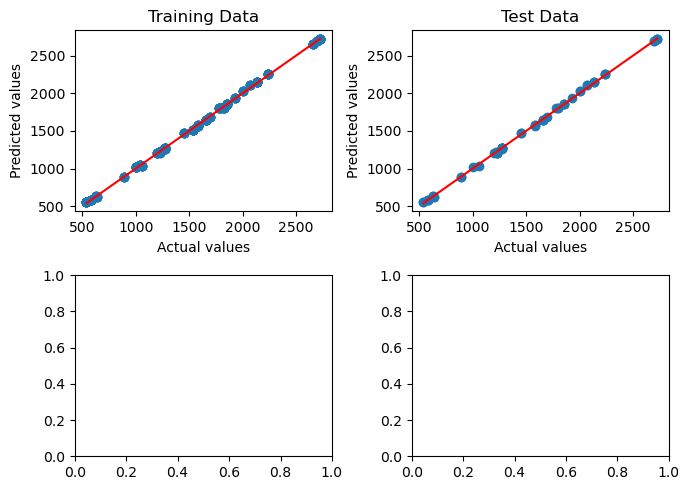

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [760/2000], Loss: 182.7180
Train R²:  0.99948
Test R² :  0.99947


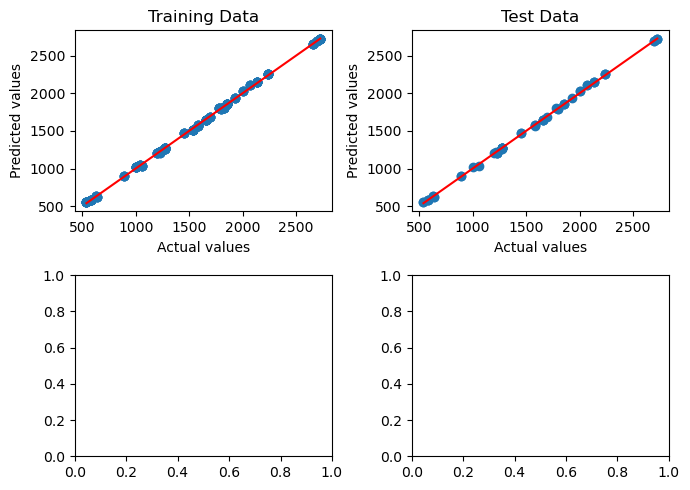

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [780/2000], Loss: 161.1476
Train R²:  0.99954
Test R² :  0.99952


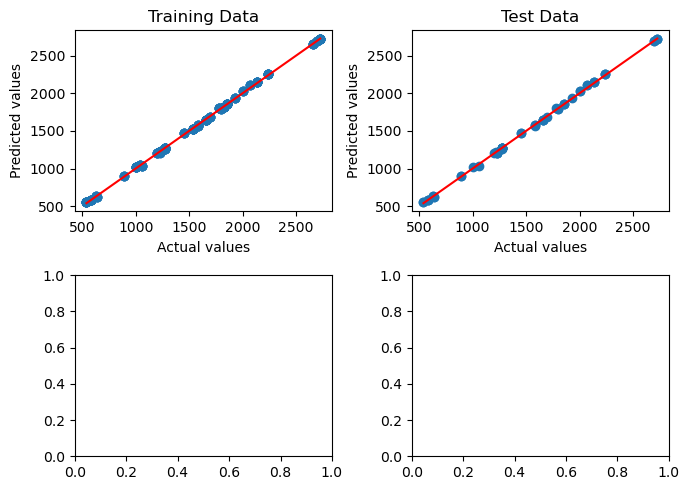

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [800/2000], Loss: 144.6338
Train R²:  0.99959
Test R² :  0.99955


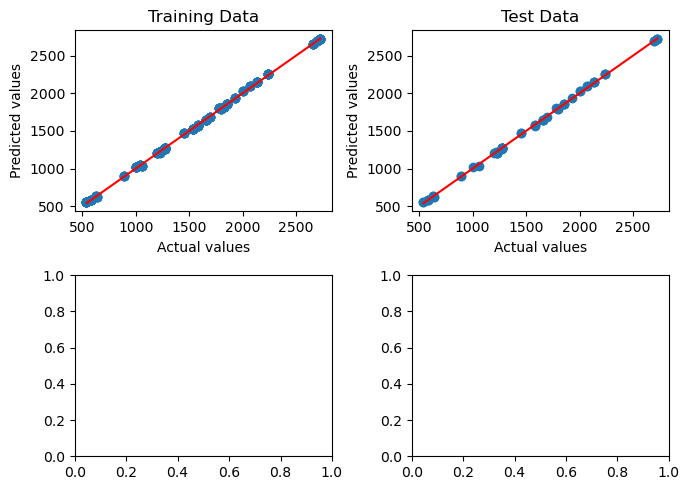

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [820/2000], Loss: 131.3788
Train R²:  0.99963
Test R² :  0.99959


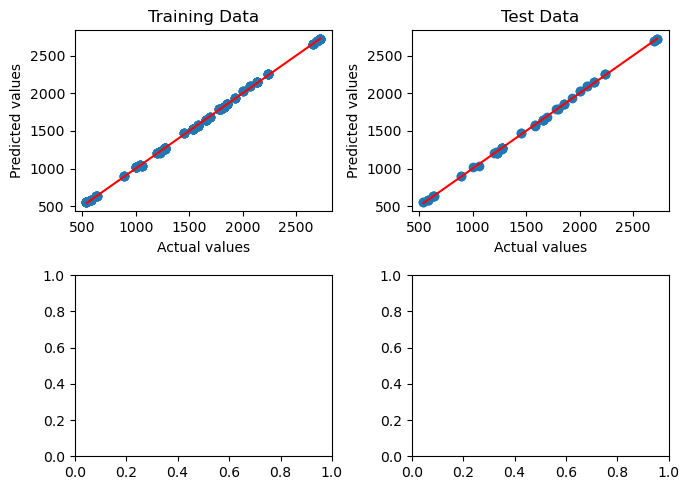

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [840/2000], Loss: 120.5297
Train R²:  0.99966
Test R² :  0.99962


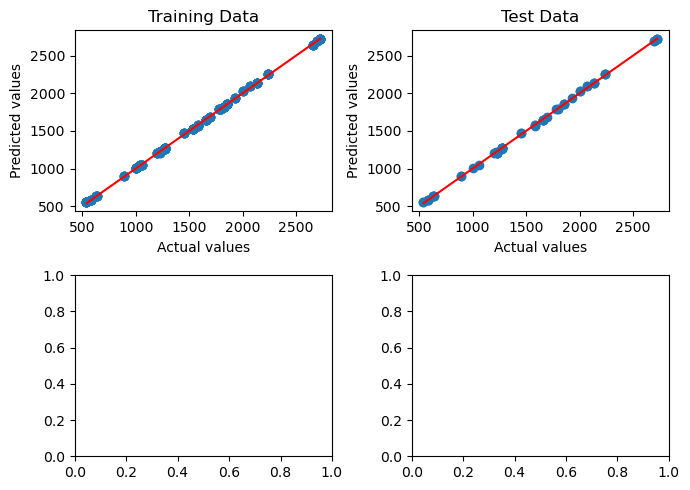

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [860/2000], Loss: 111.3079
Train R²:  0.99969
Test R² :  0.99964


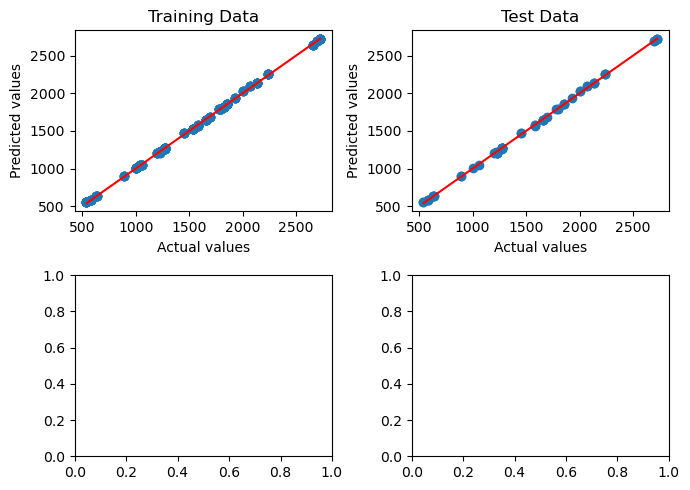

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [880/2000], Loss: 103.3317
Train R²:  0.99971
Test R² :  0.99967


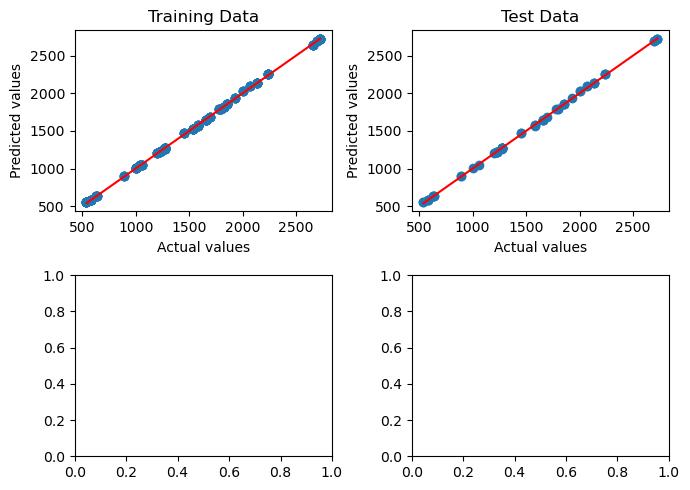

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [900/2000], Loss: 96.3173
Train R²:  0.99973
Test R² :  0.99969


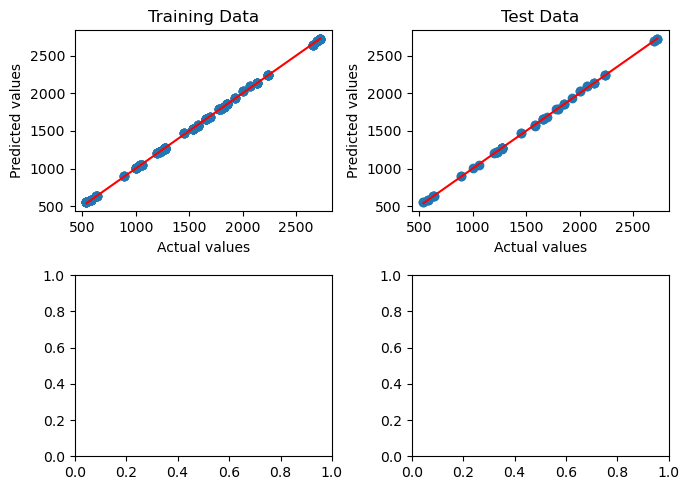

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [920/2000], Loss: 89.4186
Train R²:  0.99975
Test R² :  0.99972


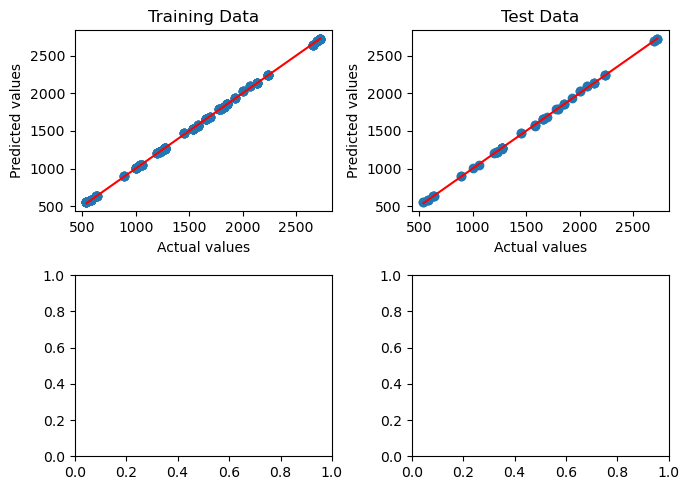

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [940/2000], Loss: 82.6457
Train R²:  0.99977
Test R² :  0.99974


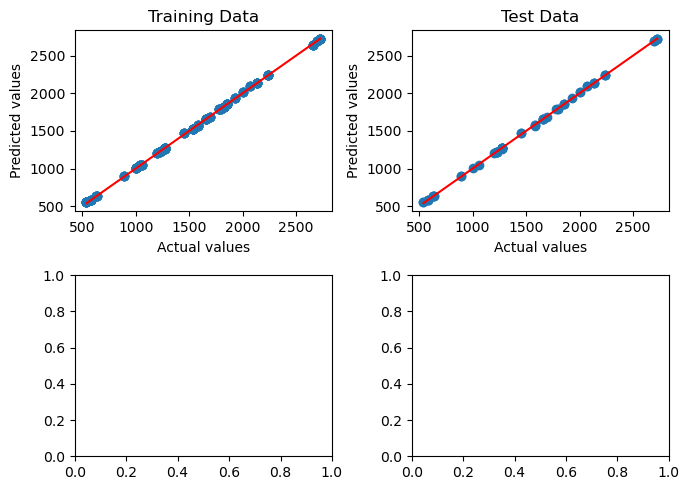

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [960/2000], Loss: 76.6459
Train R²:  0.99978
Test R² :  0.99977


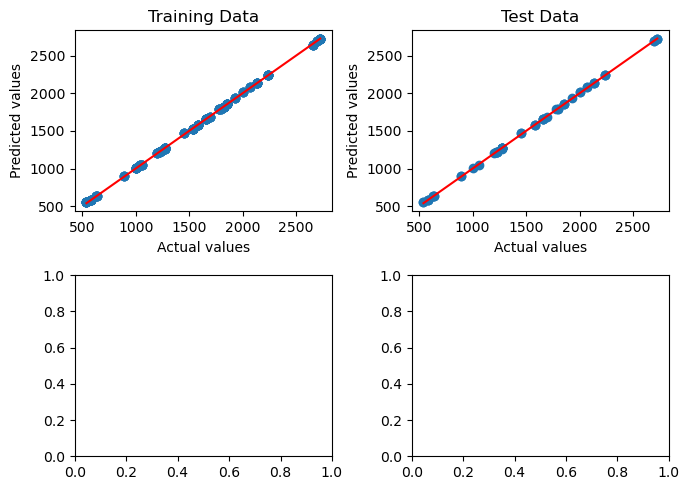

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [980/2000], Loss: 71.3347
Train R²:  0.99980
Test R² :  0.99978


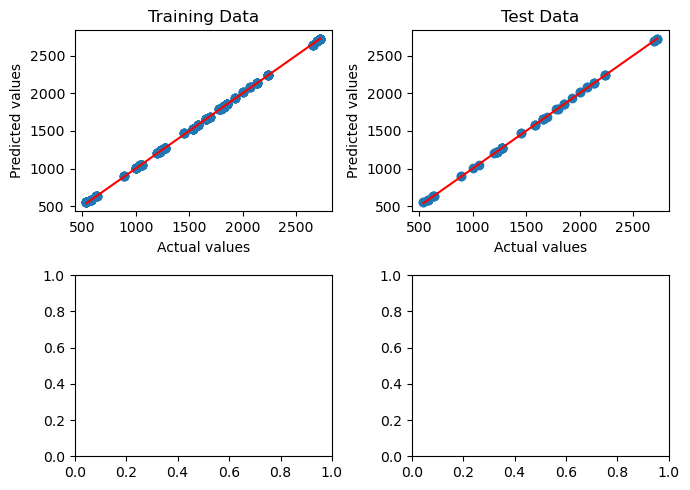

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1000/2000], Loss: 66.5565
Train R²:  0.99981
Test R² :  0.99980


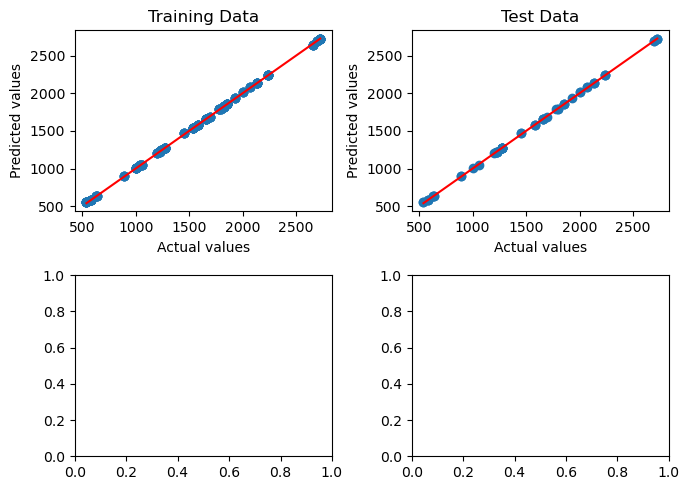

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1020/2000], Loss: 62.0968
Train R²:  0.99982
Test R² :  0.99981


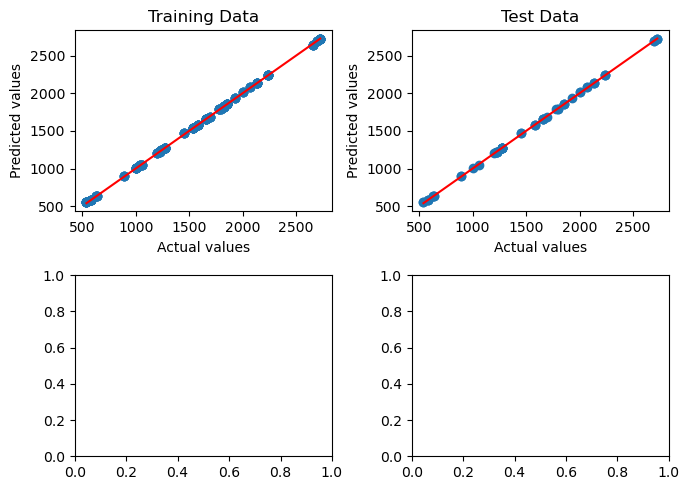

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1040/2000], Loss: 58.1648
Train R²:  0.99984
Test R² :  0.99983


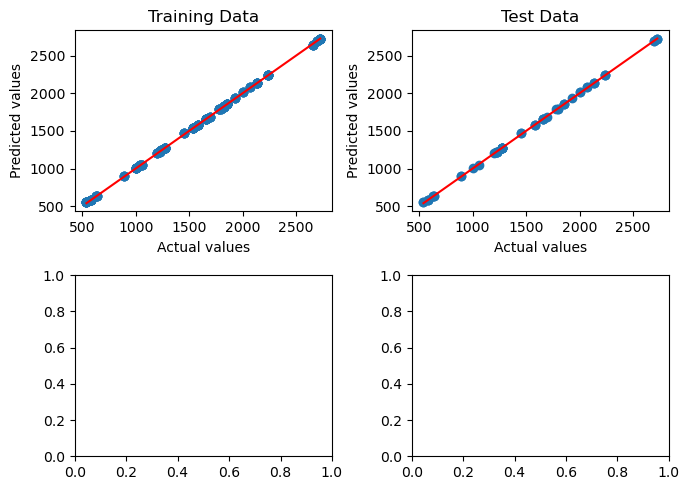

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1060/2000], Loss: 54.7997
Train R²:  0.99985
Test R² :  0.99984


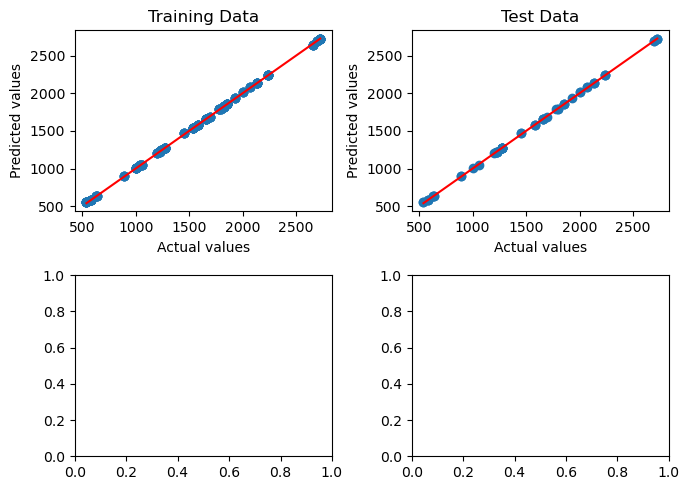

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1080/2000], Loss: 51.2645
Train R²:  0.99986
Test R² :  0.99985


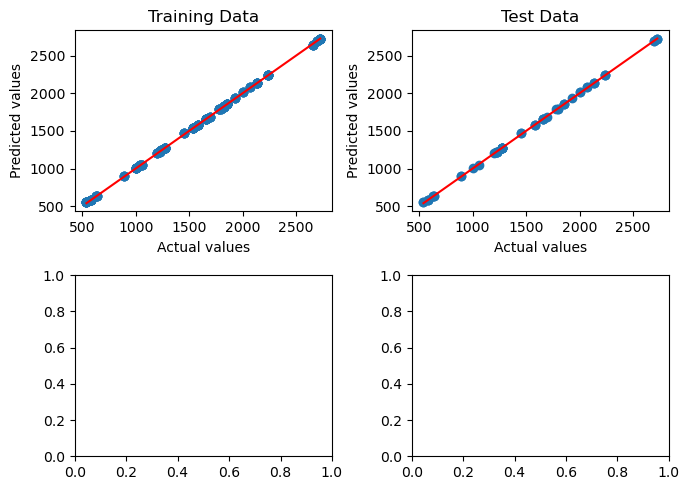

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1100/2000], Loss: 48.4994
Train R²:  0.99986
Test R² :  0.99986


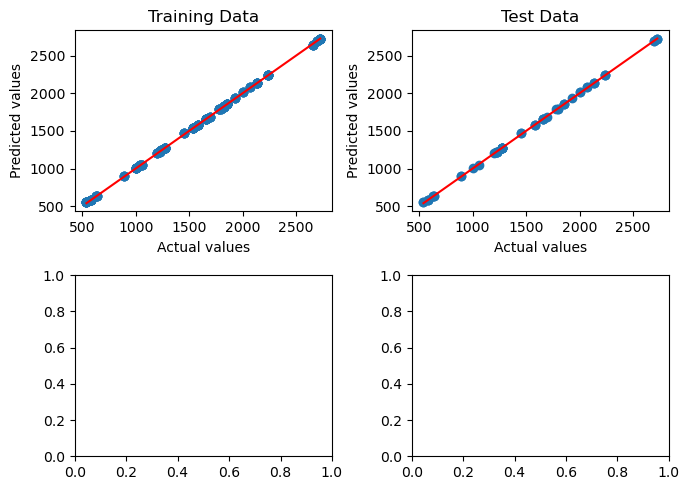

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1120/2000], Loss: 45.9701
Train R²:  0.99987
Test R² :  0.99986


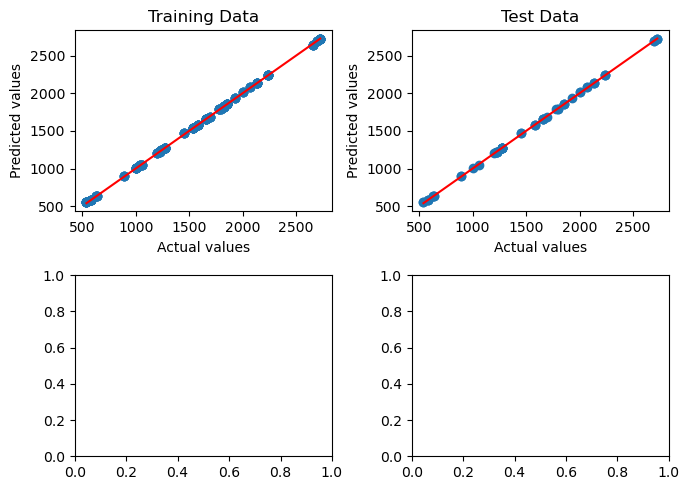

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1140/2000], Loss: 43.6430
Train R²:  0.99988
Test R² :  0.99987


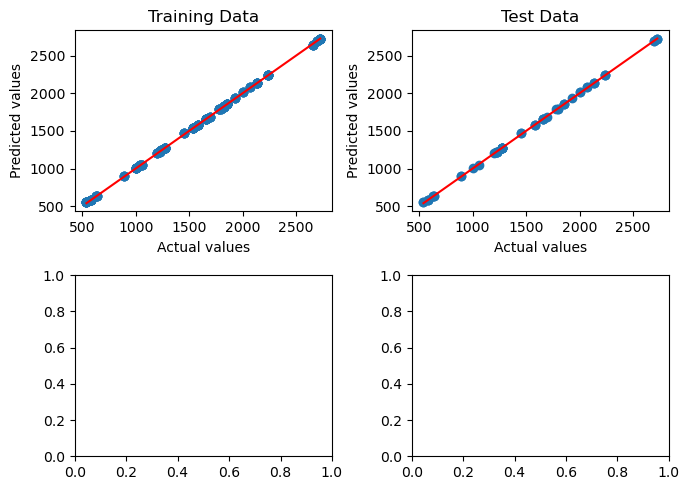

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1160/2000], Loss: 41.5147
Train R²:  0.99988
Test R² :  0.99987


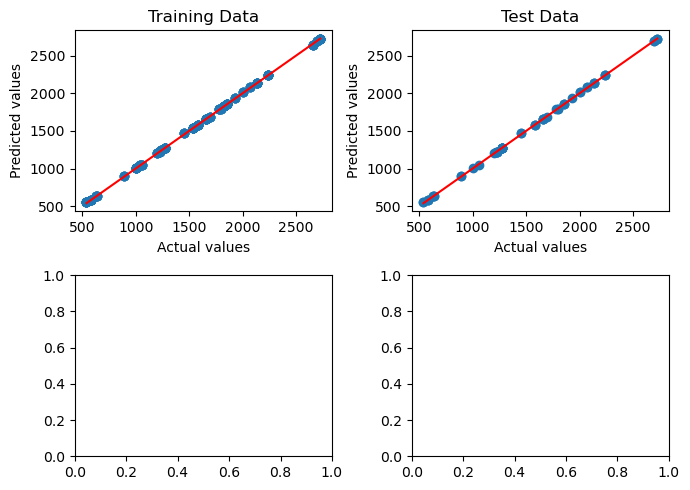

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1180/2000], Loss: 39.5553
Train R²:  0.99989
Test R² :  0.99988


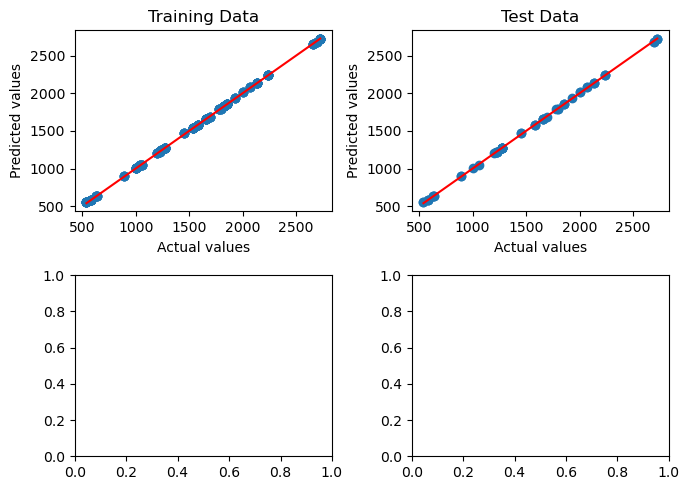

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1200/2000], Loss: 37.7537
Train R²:  0.99989
Test R² :  0.99989


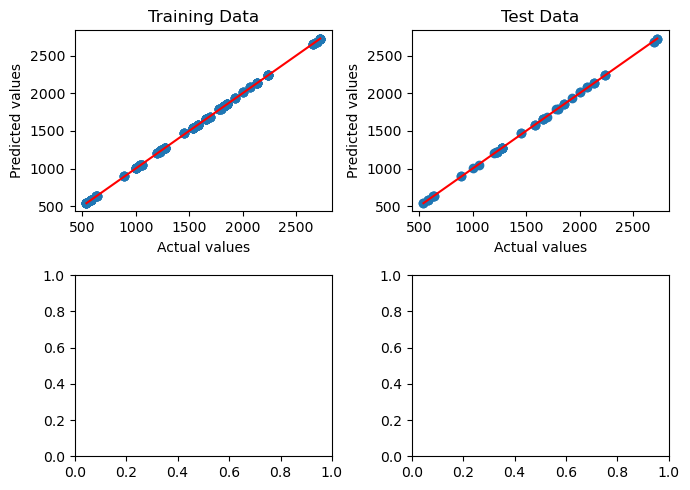

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1220/2000], Loss: 36.1149
Train R²:  0.99990
Test R² :  0.99989


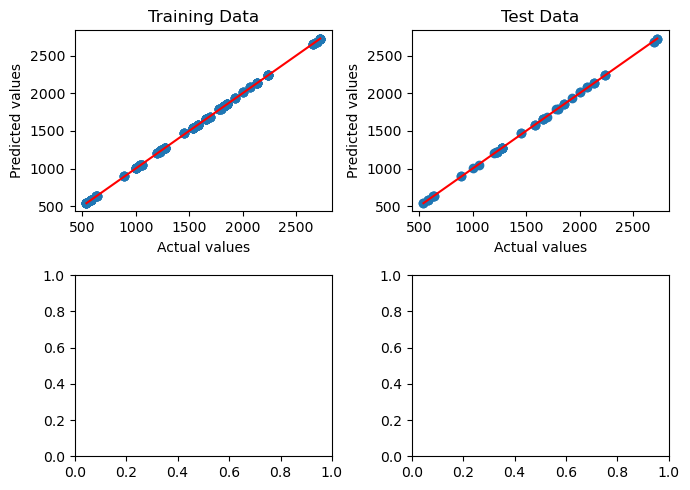

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1240/2000], Loss: 34.6257
Train R²:  0.99990
Test R² :  0.99989


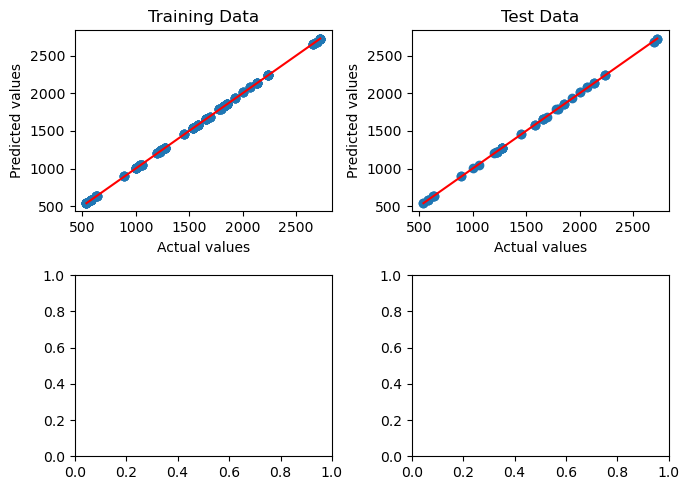

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1260/2000], Loss: 33.2432
Train R²:  0.99991
Test R² :  0.99990


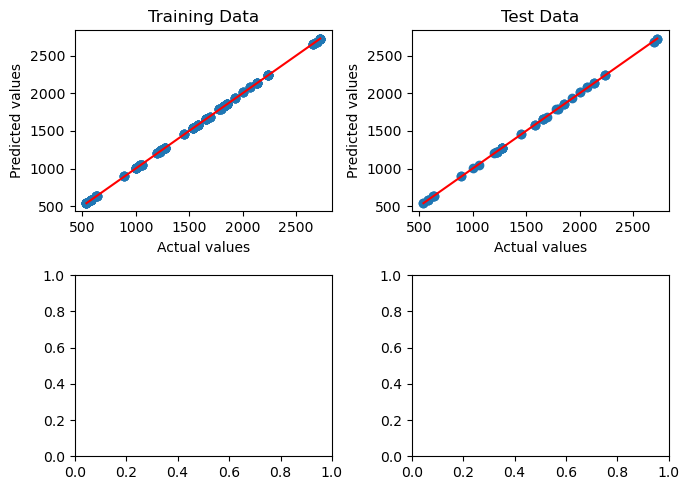

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1280/2000], Loss: 31.9639
Train R²:  0.99991
Test R² :  0.99990


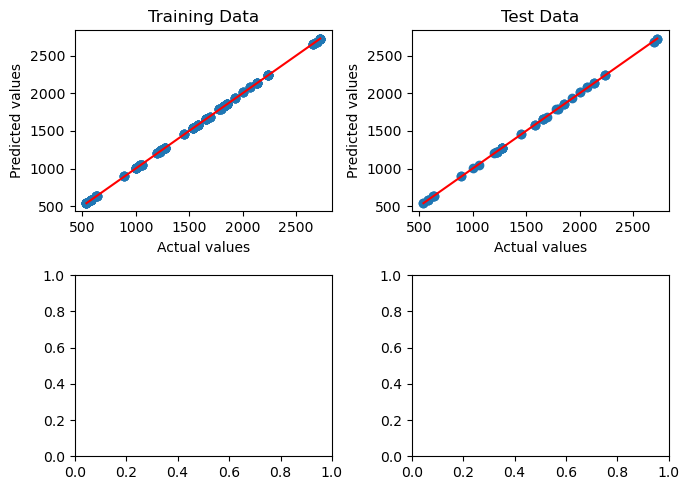

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1300/2000], Loss: 30.7722
Train R²:  0.99991
Test R² :  0.99991


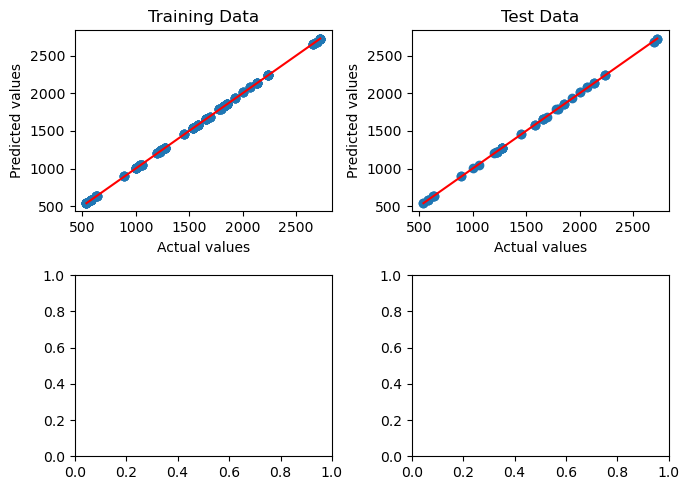

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1320/2000], Loss: 29.6573
Train R²:  0.99992
Test R² :  0.99991


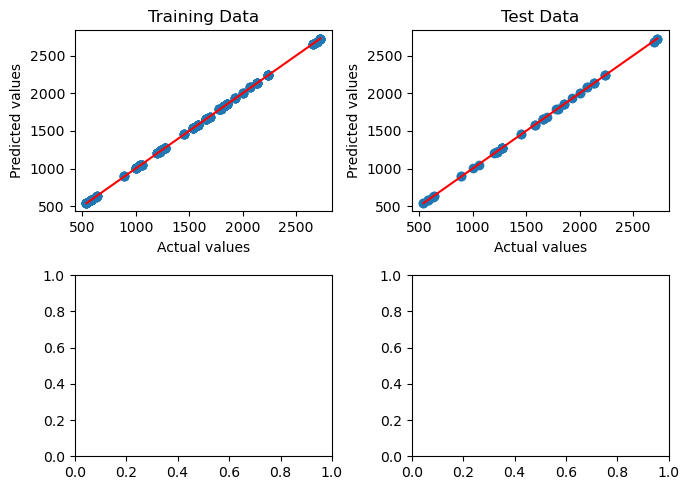

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1340/2000], Loss: 28.6094
Train R²:  0.99992
Test R² :  0.99991


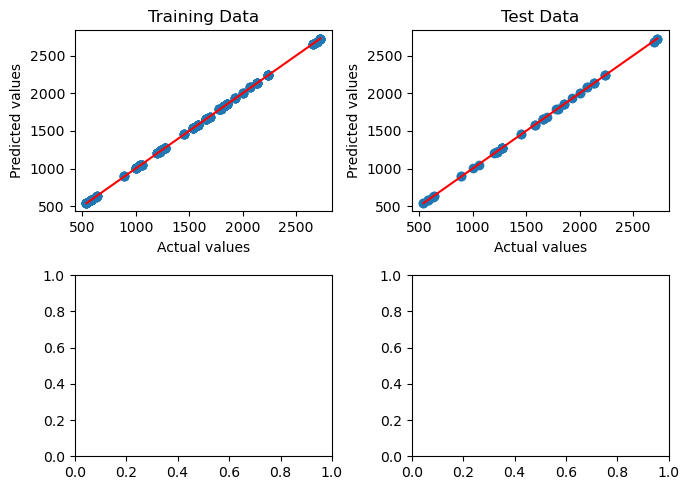

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1360/2000], Loss: 27.6193
Train R²:  0.99992
Test R² :  0.99992


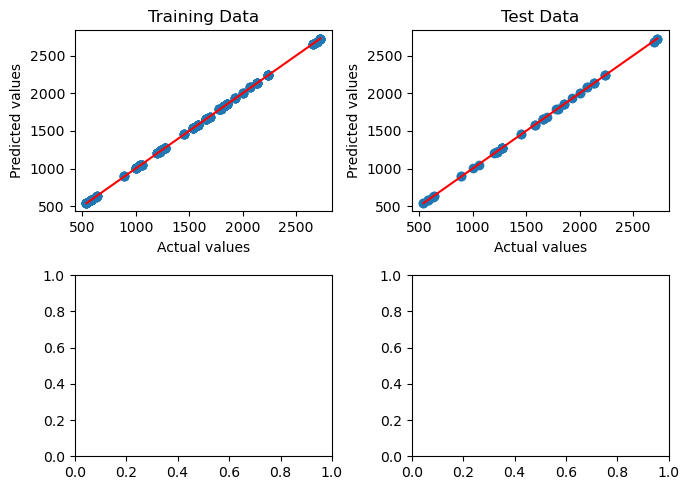

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1380/2000], Loss: 26.6820
Train R²:  0.99992
Test R² :  0.99992


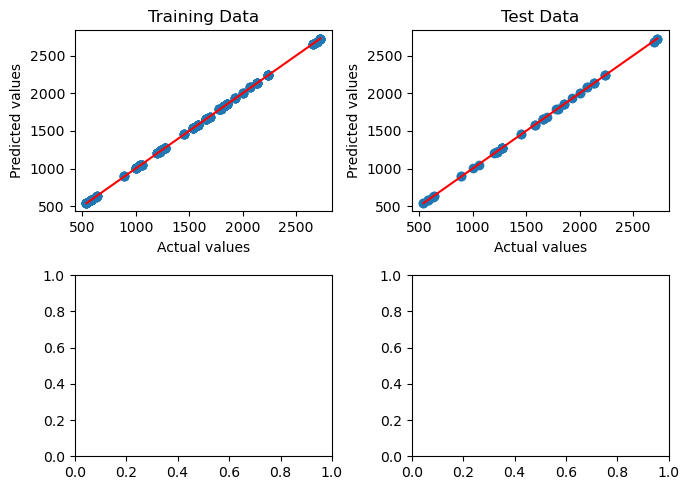

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1400/2000], Loss: 25.8056
Train R²:  0.99993
Test R² :  0.99992


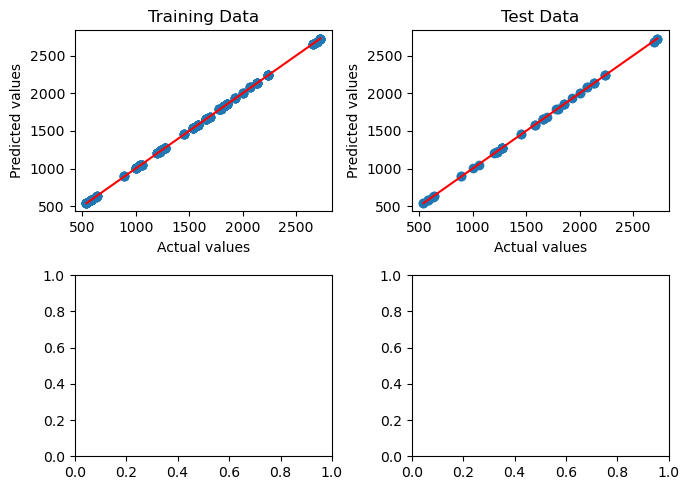

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1420/2000], Loss: 24.9765
Train R²:  0.99993
Test R² :  0.99993


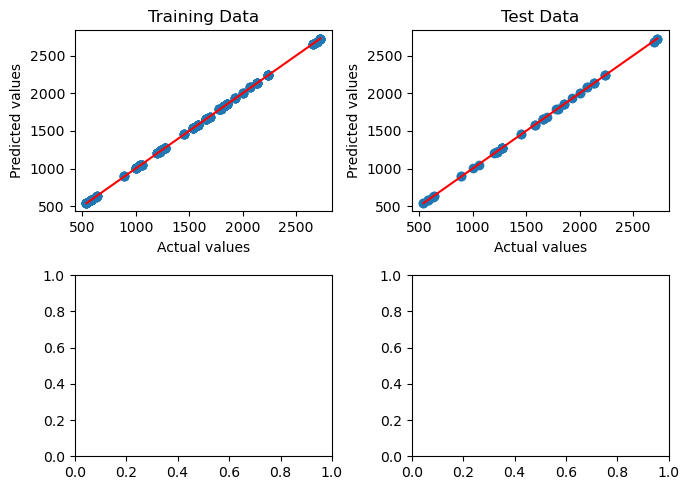

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1440/2000], Loss: 24.1839
Train R²:  0.99993
Test R² :  0.99993


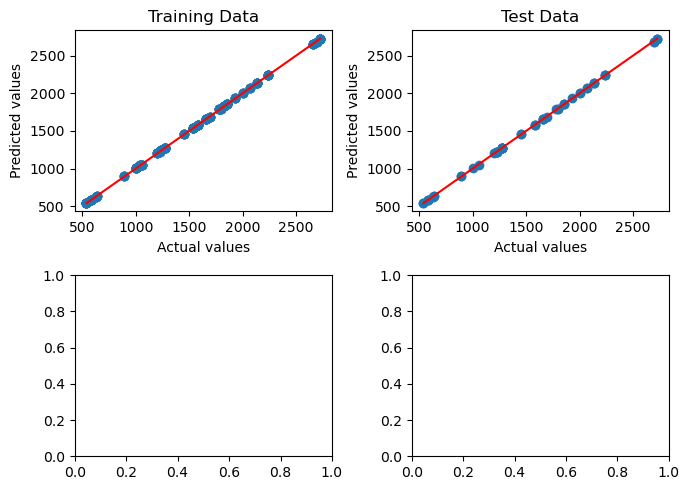

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1460/2000], Loss: 23.4267
Train R²:  0.99993
Test R² :  0.99993


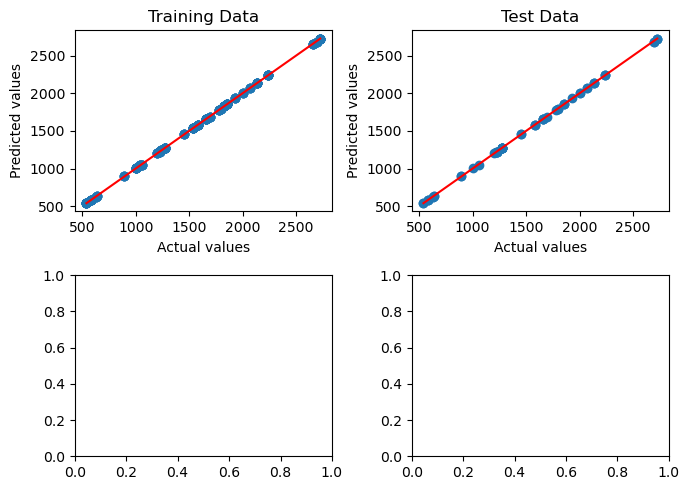

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1480/2000], Loss: 22.7011
Train R²:  0.99994
Test R² :  0.99993


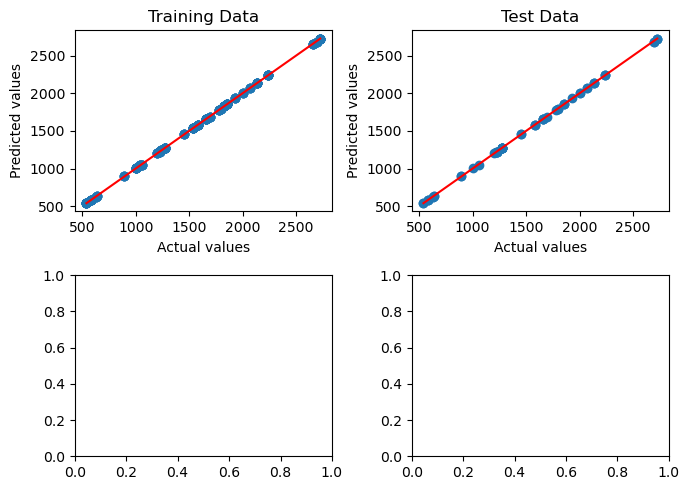

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1500/2000], Loss: 22.0048
Train R²:  0.99994
Test R² :  0.99993


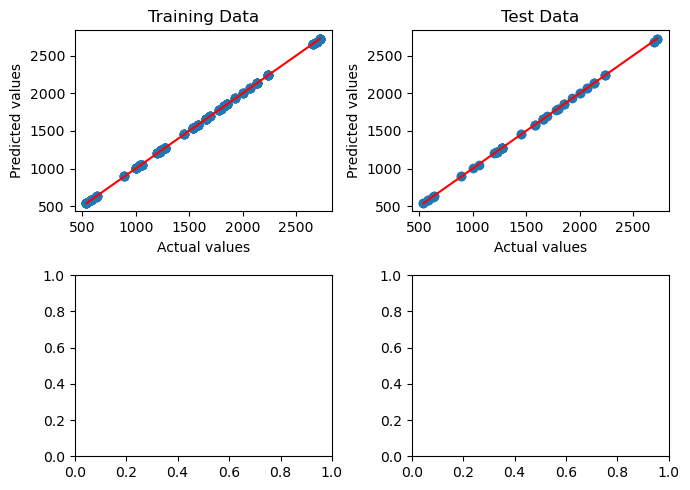

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1520/2000], Loss: 21.3400
Train R²:  0.99994
Test R² :  0.99994


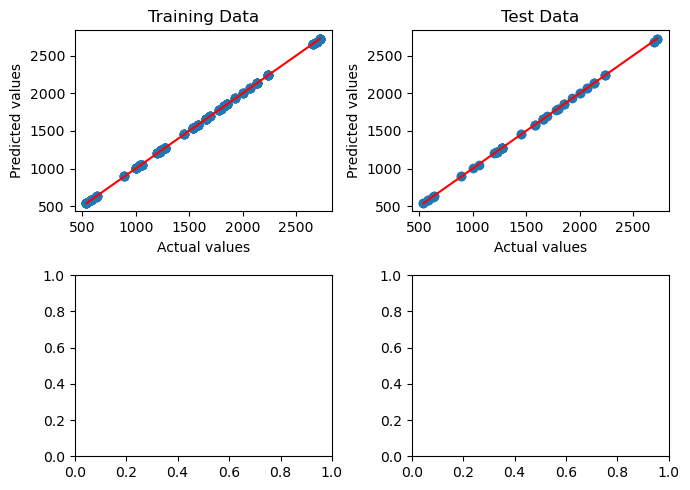

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1540/2000], Loss: 20.6973
Train R²:  0.99994
Test R² :  0.99994


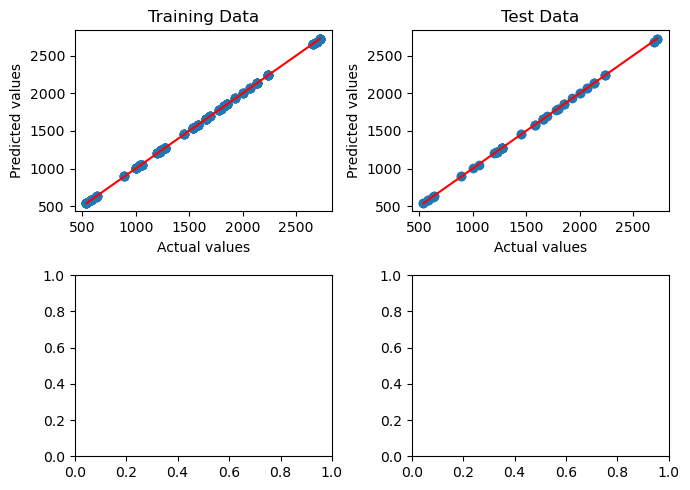

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1560/2000], Loss: 20.0848
Train R²:  0.99994
Test R² :  0.99994


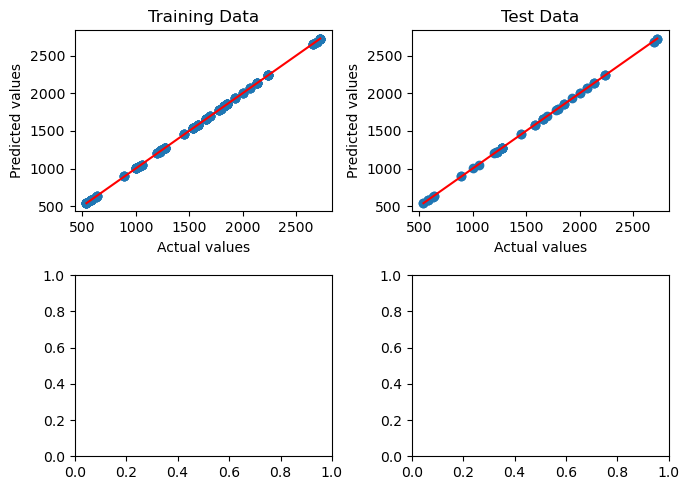

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1580/2000], Loss: 19.4977
Train R²:  0.99994
Test R² :  0.99994


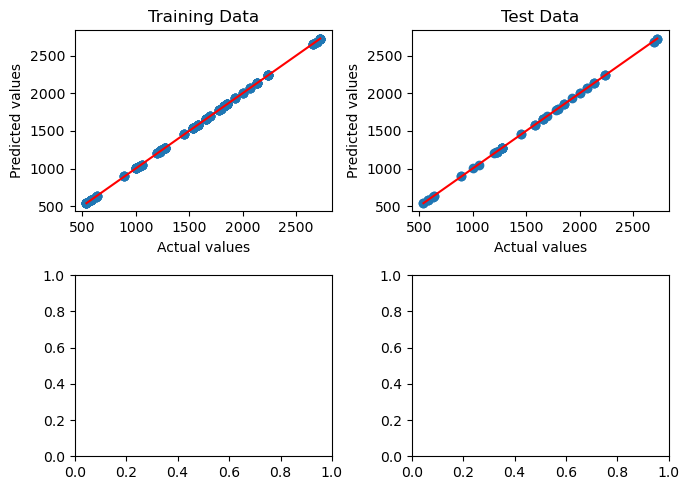

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1600/2000], Loss: 18.9340
Train R²:  0.99995
Test R² :  0.99994


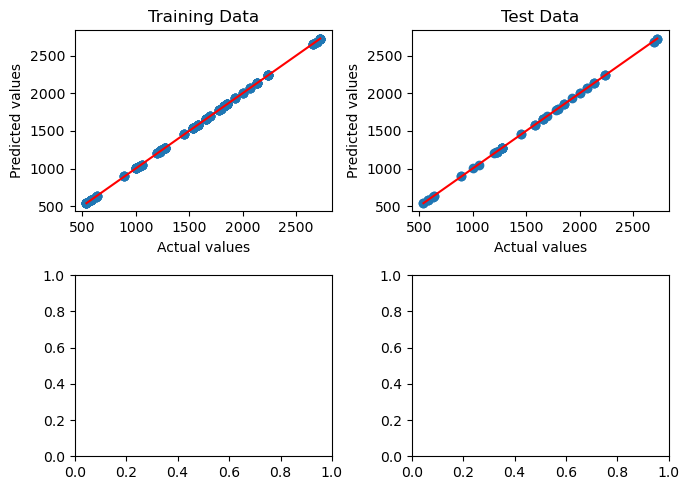

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1620/2000], Loss: 18.3921
Train R²:  0.99995
Test R² :  0.99995


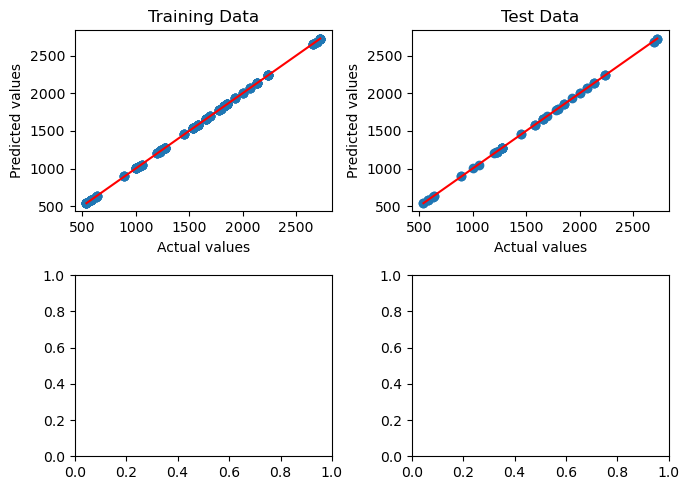

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1640/2000], Loss: 17.8723
Train R²:  0.99995
Test R² :  0.99995


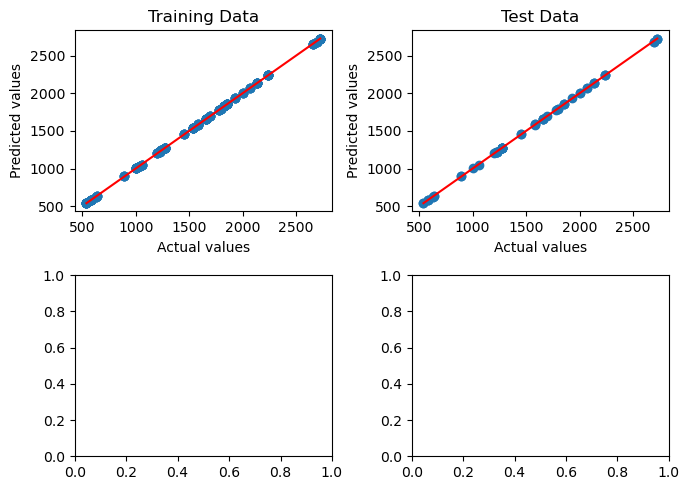

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1660/2000], Loss: 17.3735
Train R²:  0.99995
Test R² :  0.99995


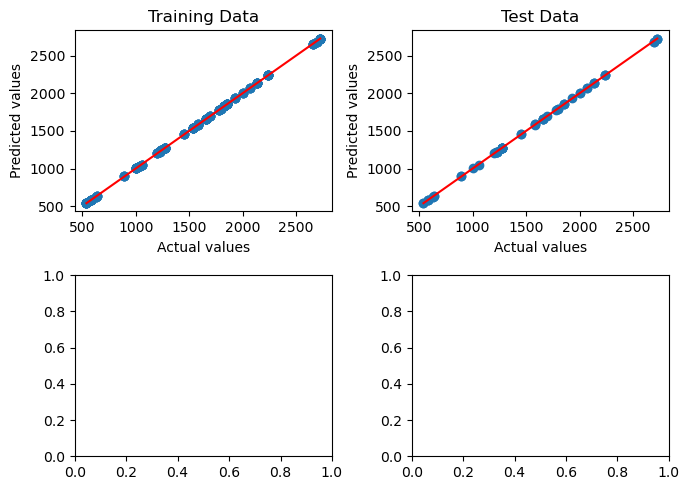

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1680/2000], Loss: 16.8945
Train R²:  0.99995
Test R² :  0.99995


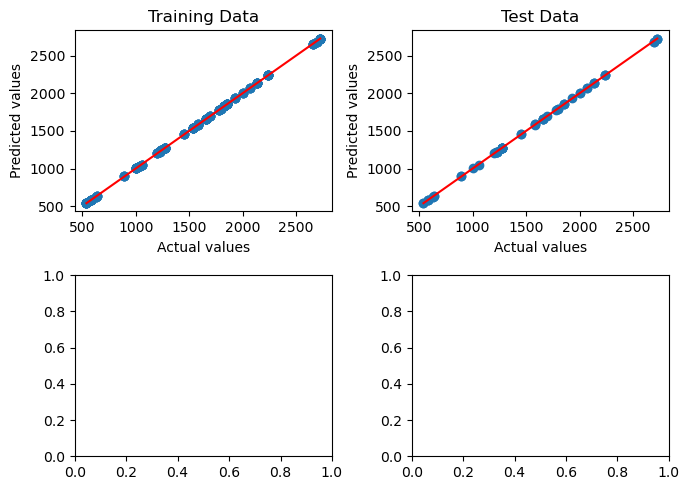

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1700/2000], Loss: 16.4349
Train R²:  0.99995
Test R² :  0.99995


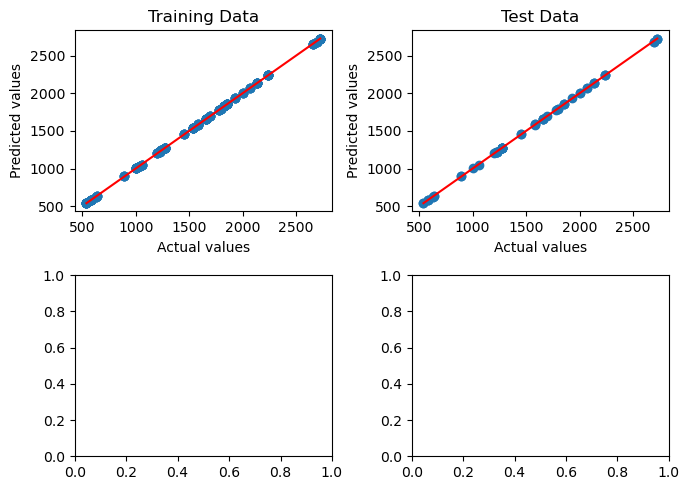

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1720/2000], Loss: 15.9937
Train R²:  0.99995
Test R² :  0.99995


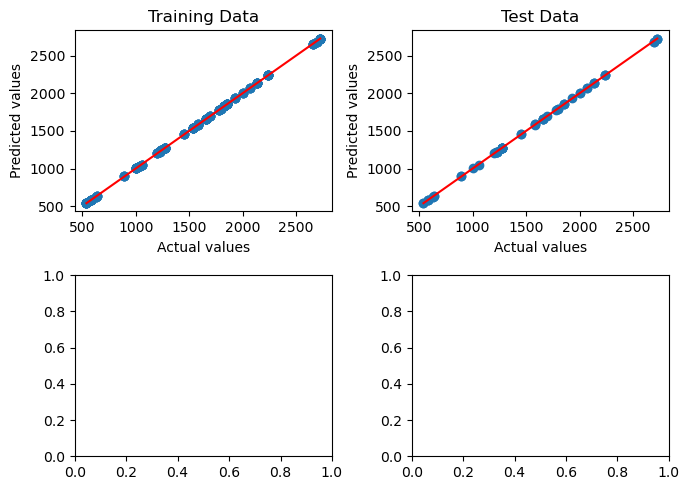

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1740/2000], Loss: 15.5701
Train R²:  0.99996
Test R² :  0.99996


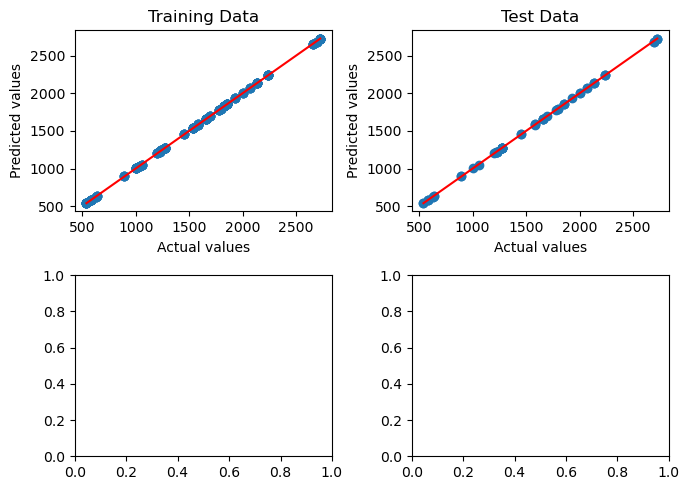

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1760/2000], Loss: 15.1633
Train R²:  0.99996
Test R² :  0.99996


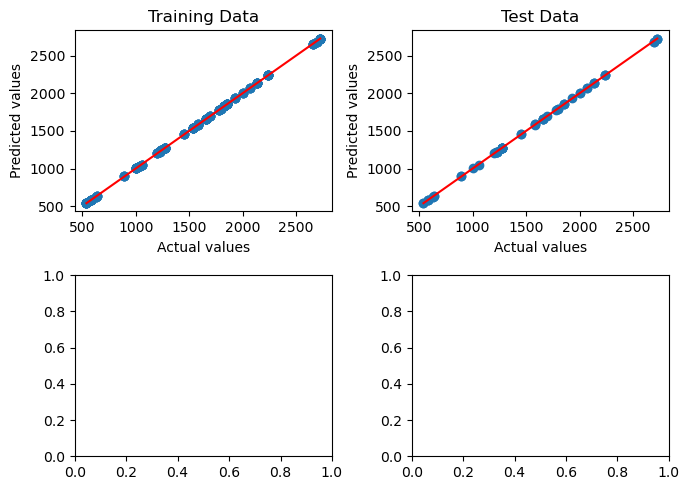

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1780/2000], Loss: 14.7734
Train R²:  0.99996
Test R² :  0.99996


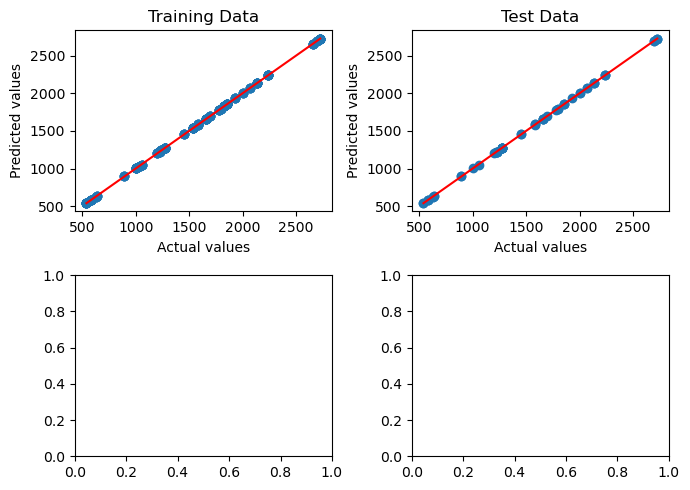

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1800/2000], Loss: 14.3984
Train R²:  0.99996
Test R² :  0.99996


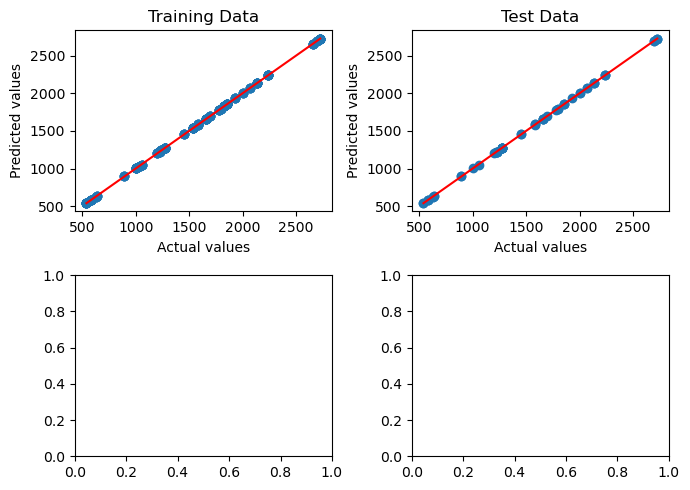

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1820/2000], Loss: 14.0388
Train R²:  0.99996
Test R² :  0.99996


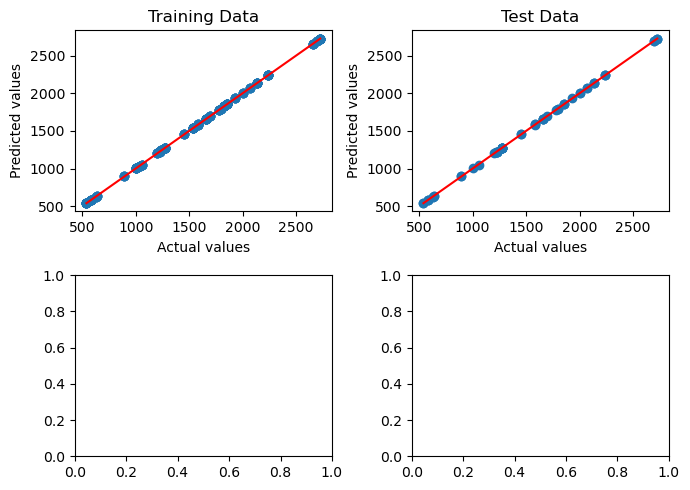

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1840/2000], Loss: 13.6932
Train R²:  0.99996
Test R² :  0.99996


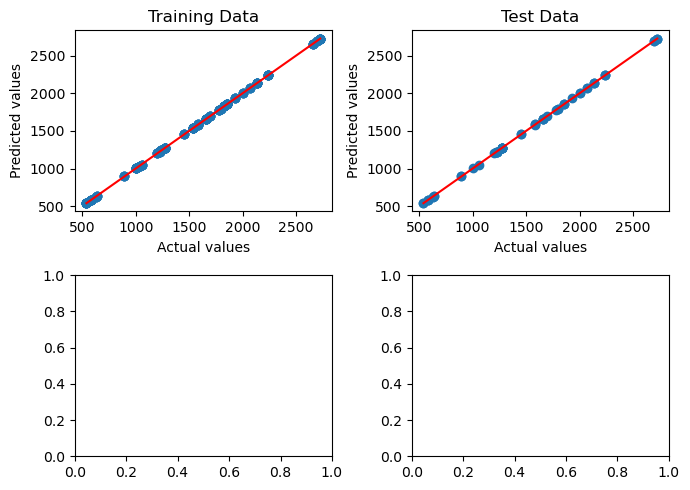

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1860/2000], Loss: 13.3613
Train R²:  0.99996
Test R² :  0.99996


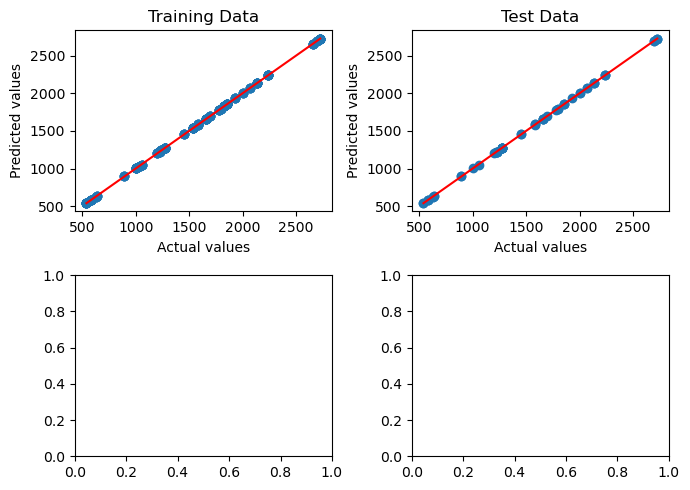

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1880/2000], Loss: 13.0422
Train R²:  0.99996
Test R² :  0.99996


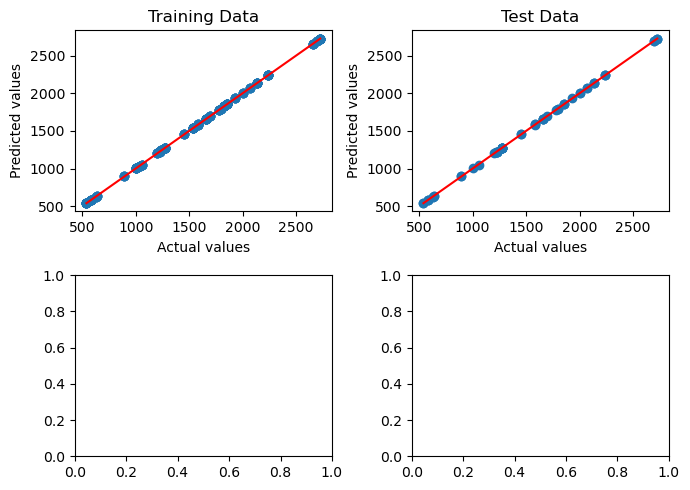

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1900/2000], Loss: 12.7356
Train R²:  0.99996
Test R² :  0.99997


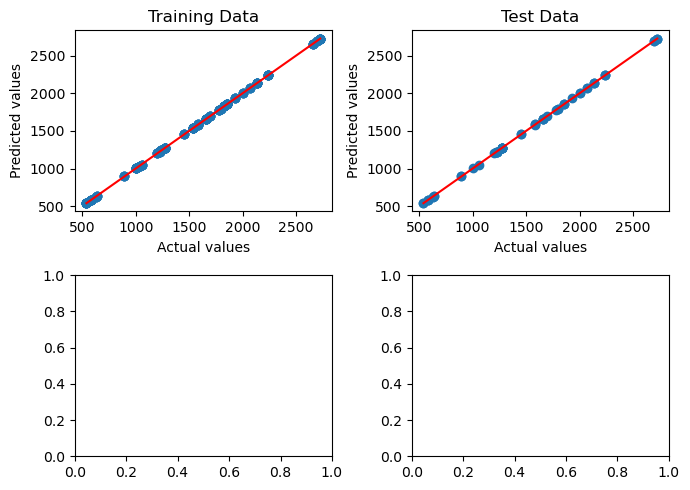

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1920/2000], Loss: 12.4412
Train R²:  0.99996
Test R² :  0.99997


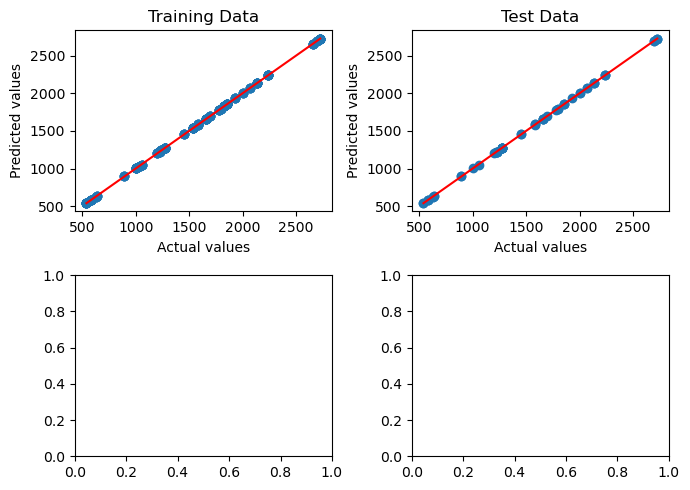

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1940/2000], Loss: 12.1579
Train R²:  0.99997
Test R² :  0.99997


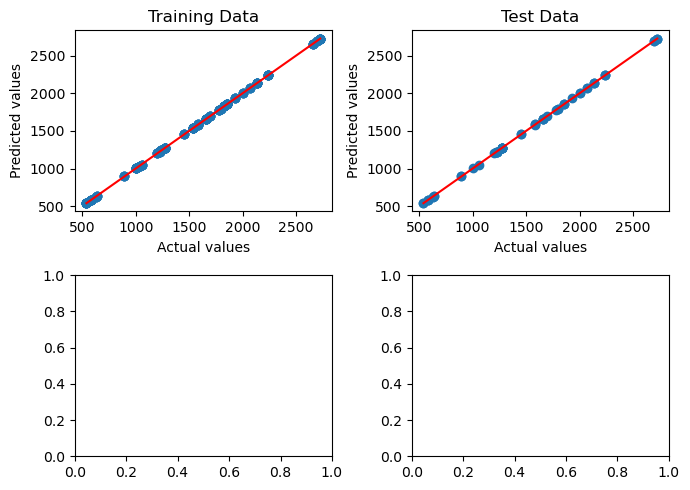

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1960/2000], Loss: 11.8854
Train R²:  0.99997
Test R² :  0.99997


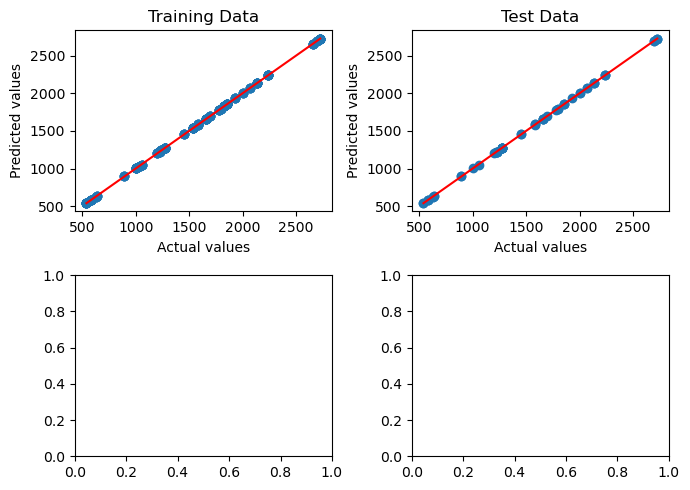

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [1980/2000], Loss: 11.6233
Train R²:  0.99997
Test R² :  0.99997


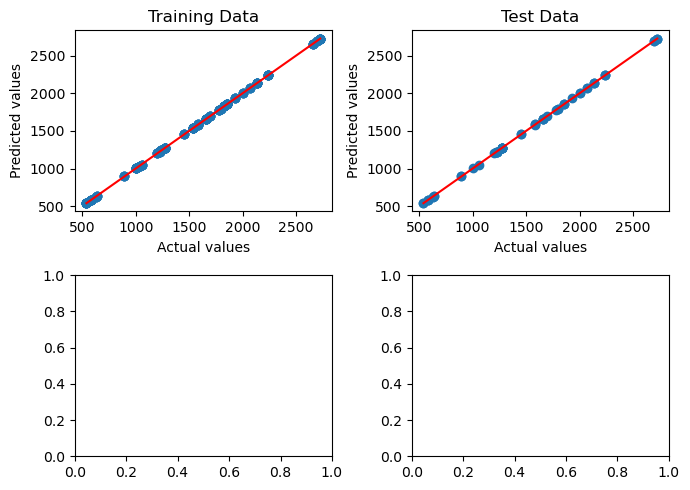

<Figure size 640x480 with 0 Axes>

[Sigmaf] Epoch [2000/2000], Loss: 11.3709
Train R²:  0.99997
Test R² :  0.99997


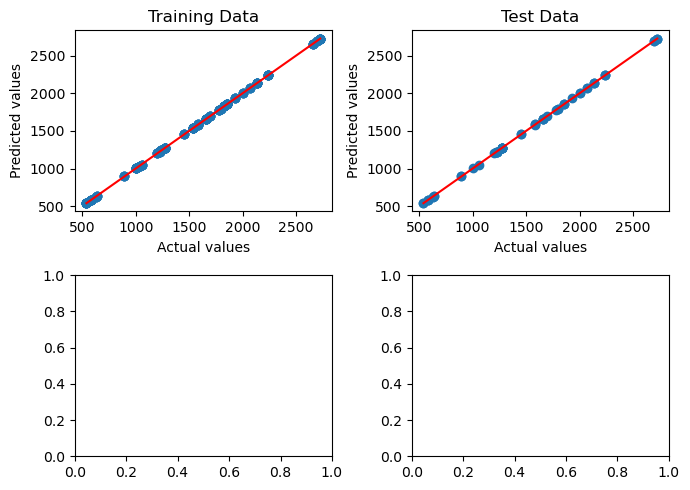

<Figure size 640x480 with 0 Axes>

In [12]:
GBR_NN(6)

[b] Epoch [20/2000], Loss: 0.3508
Train R²:  -1022.45889
Test R² :  -1456.95865


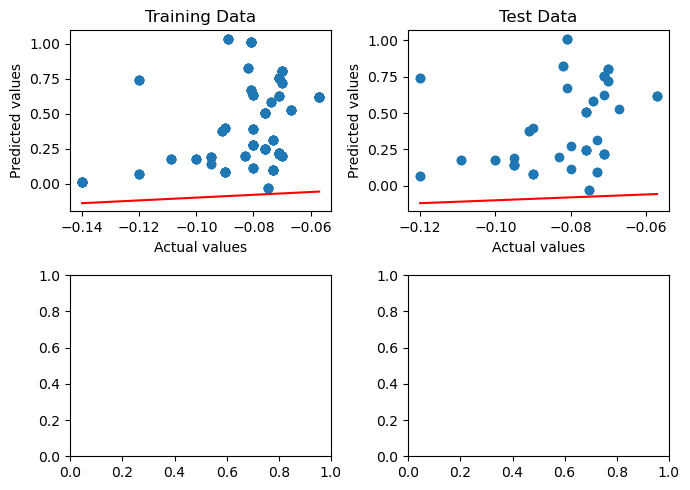

<Figure size 640x480 with 0 Axes>

[b] Epoch [40/2000], Loss: 0.0048
Train R²:  -12.87681
Test R² :  -21.50287


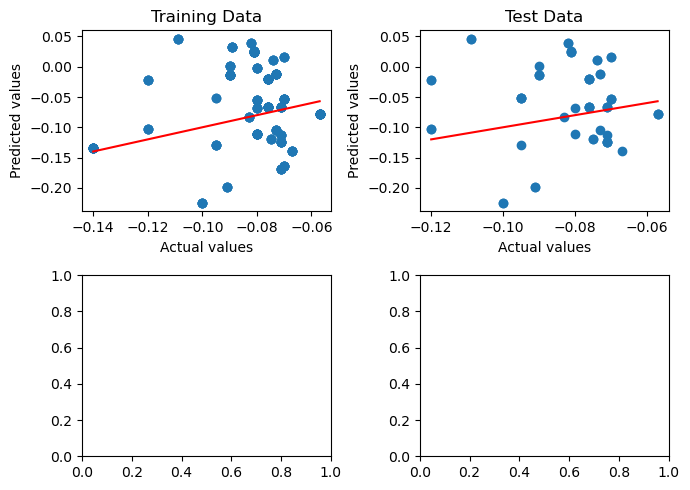

<Figure size 640x480 with 0 Axes>

[b] Epoch [60/2000], Loss: 0.0049
Train R²:  -13.43493
Test R² :  -19.62092


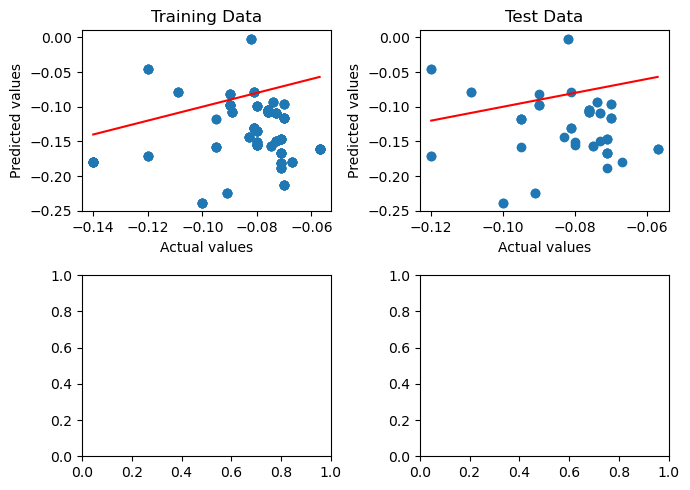

<Figure size 640x480 with 0 Axes>

[b] Epoch [80/2000], Loss: 0.0020
Train R²:  -4.71414
Test R² :  -10.17217


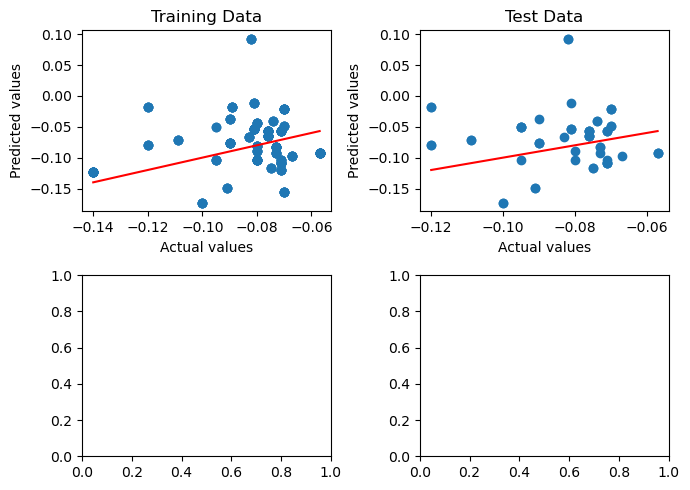

<Figure size 640x480 with 0 Axes>

[b] Epoch [100/2000], Loss: 0.0016
Train R²:  -3.62458
Test R² :  -8.03913


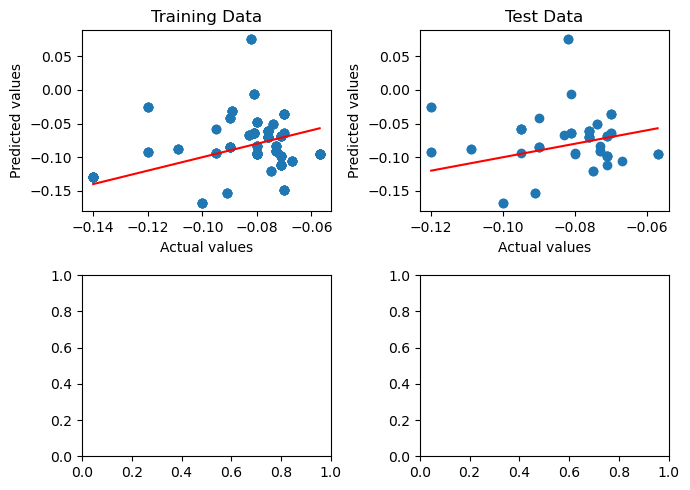

<Figure size 640x480 with 0 Axes>

[b] Epoch [120/2000], Loss: 0.0013
Train R²:  -2.80262
Test R² :  -6.49856


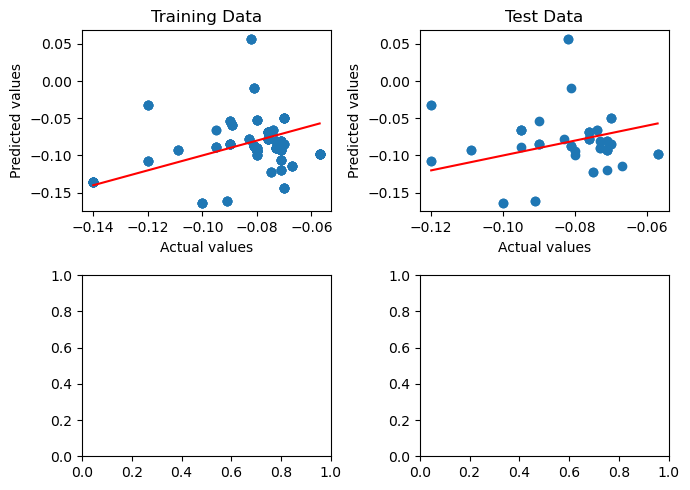

<Figure size 640x480 with 0 Axes>

[b] Epoch [140/2000], Loss: 0.0011
Train R²:  -2.22433
Test R² :  -5.51603


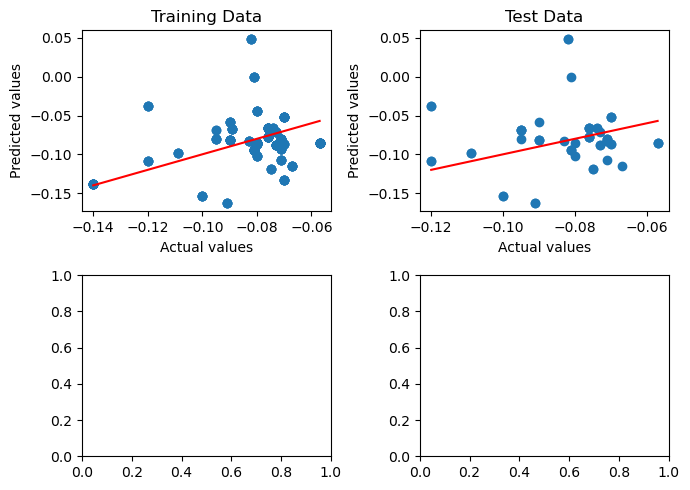

<Figure size 640x480 with 0 Axes>

[b] Epoch [160/2000], Loss: 0.0009
Train R²:  -1.73117
Test R² :  -4.43719


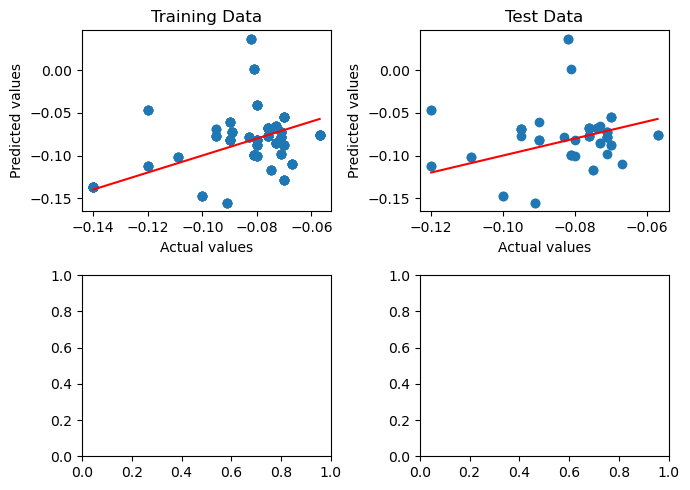

<Figure size 640x480 with 0 Axes>

[b] Epoch [180/2000], Loss: 0.0008
Train R²:  -1.40836
Test R² :  -3.71064


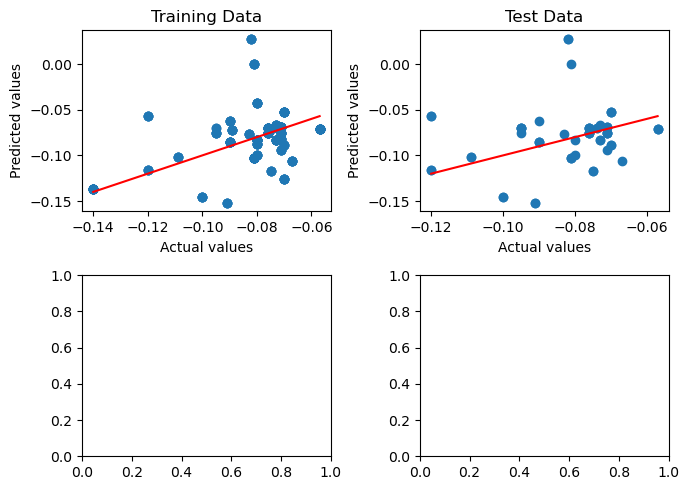

<Figure size 640x480 with 0 Axes>

[b] Epoch [200/2000], Loss: 0.0007
Train R²:  -1.15782
Test R² :  -3.25540


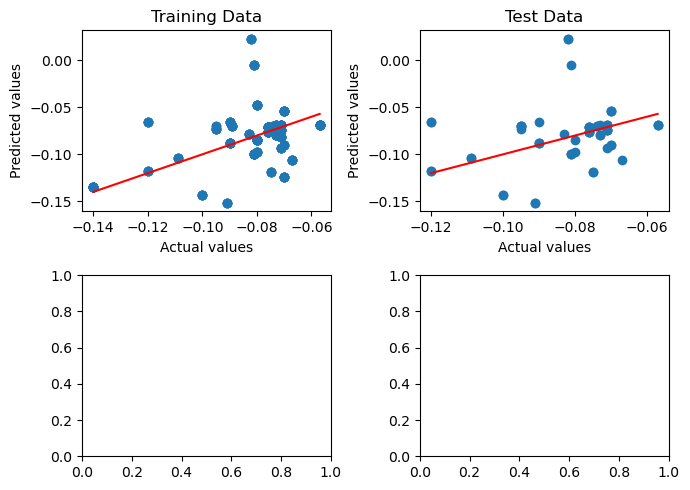

<Figure size 640x480 with 0 Axes>

[b] Epoch [220/2000], Loss: 0.0007
Train R²:  -0.95952
Test R² :  -2.90284


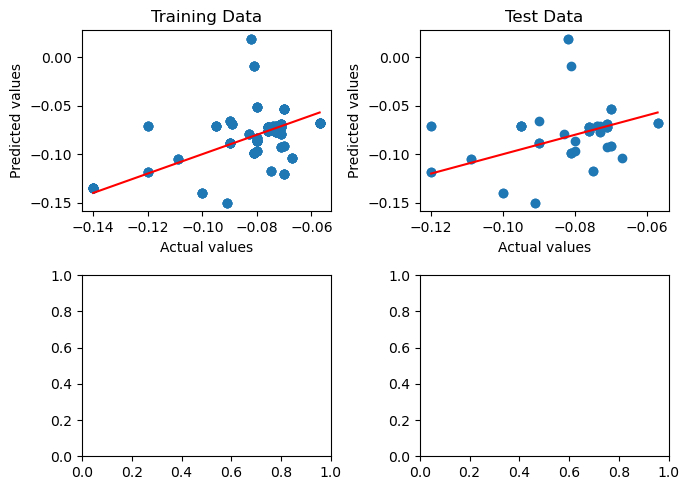

<Figure size 640x480 with 0 Axes>

[b] Epoch [240/2000], Loss: 0.0006
Train R²:  -0.79850
Test R² :  -2.55099


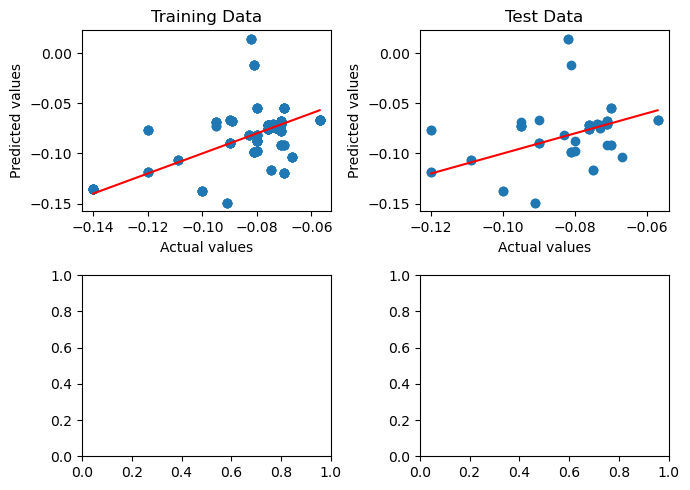

<Figure size 640x480 with 0 Axes>

[b] Epoch [260/2000], Loss: 0.0006
Train R²:  -0.66914
Test R² :  -2.29094


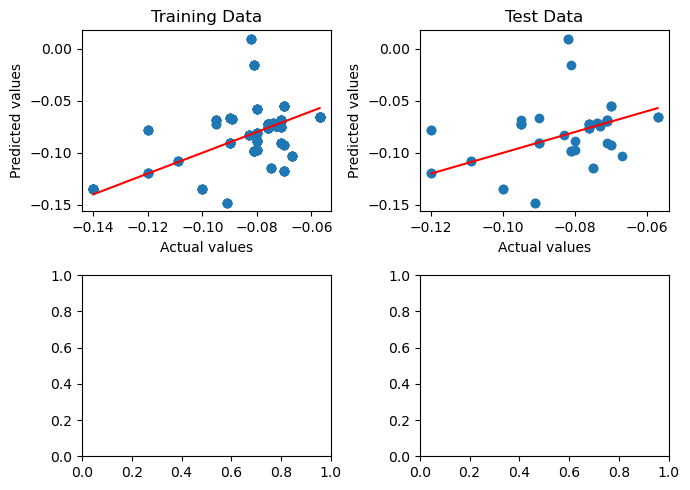

<Figure size 640x480 with 0 Axes>

[b] Epoch [280/2000], Loss: 0.0005
Train R²:  -0.56141
Test R² :  -2.06099


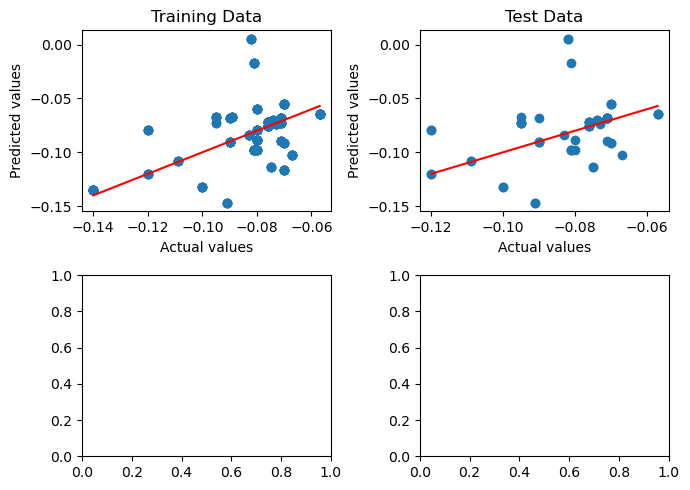

<Figure size 640x480 with 0 Axes>

[b] Epoch [300/2000], Loss: 0.0005
Train R²:  -0.48232
Test R² :  -1.90220


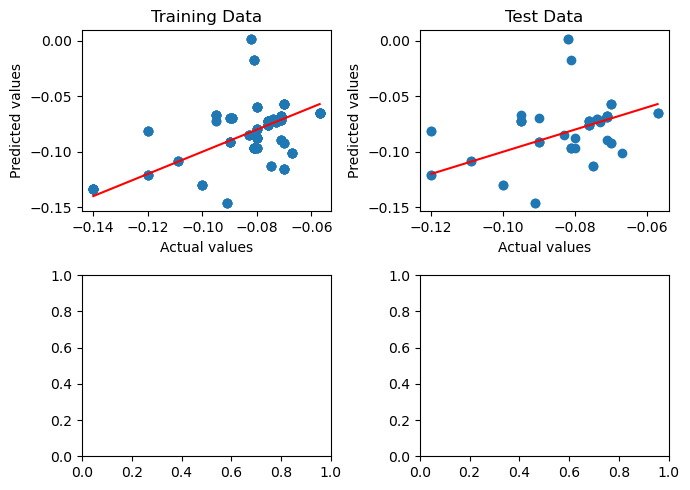

<Figure size 640x480 with 0 Axes>

[b] Epoch [320/2000], Loss: 0.0005
Train R²:  -0.40853
Test R² :  -1.76858


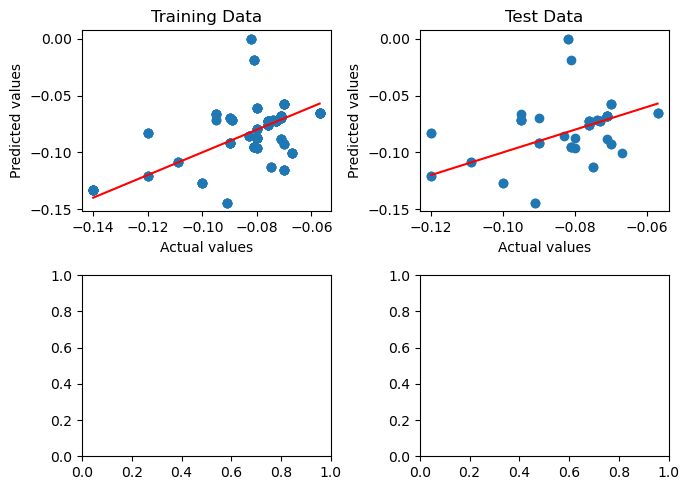

<Figure size 640x480 with 0 Axes>

[b] Epoch [340/2000], Loss: 0.0005
Train R²:  -0.34183
Test R² :  -1.62684


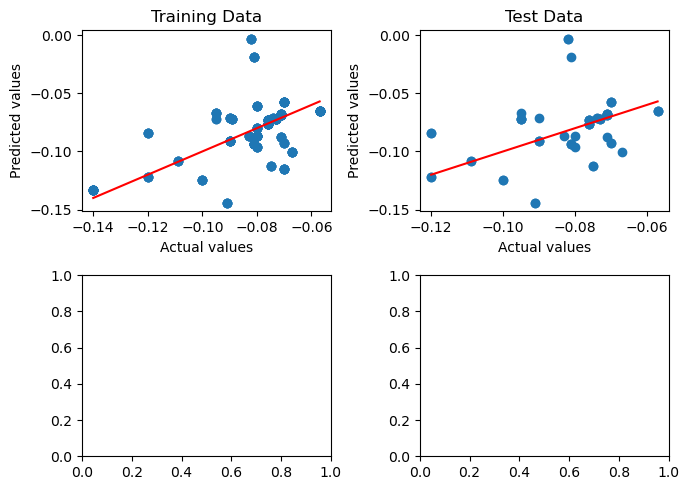

<Figure size 640x480 with 0 Axes>

[b] Epoch [360/2000], Loss: 0.0004
Train R²:  -0.28290
Test R² :  -1.50323


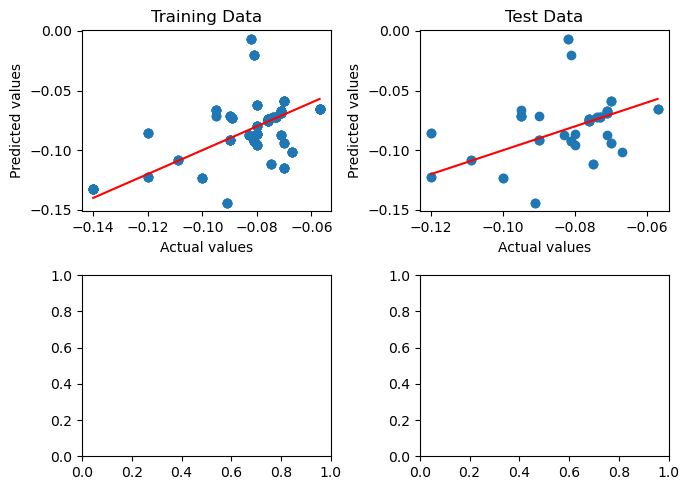

<Figure size 640x480 with 0 Axes>

[b] Epoch [380/2000], Loss: 0.0004
Train R²:  -0.22914
Test R² :  -1.38778


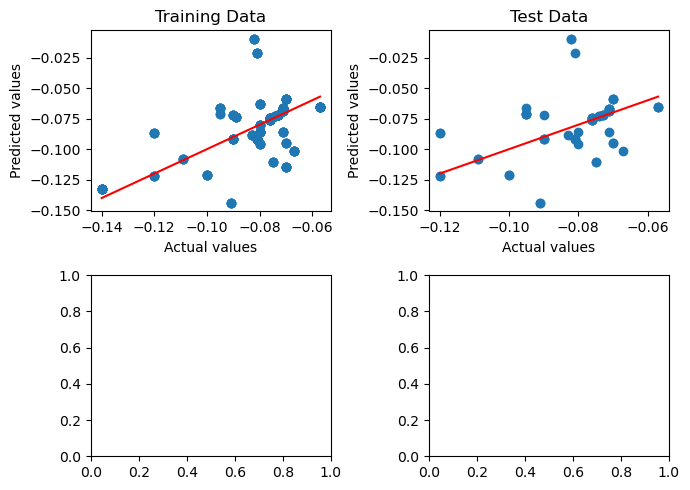

<Figure size 640x480 with 0 Axes>

[b] Epoch [400/2000], Loss: 0.0004
Train R²:  -0.17941
Test R² :  -1.28419


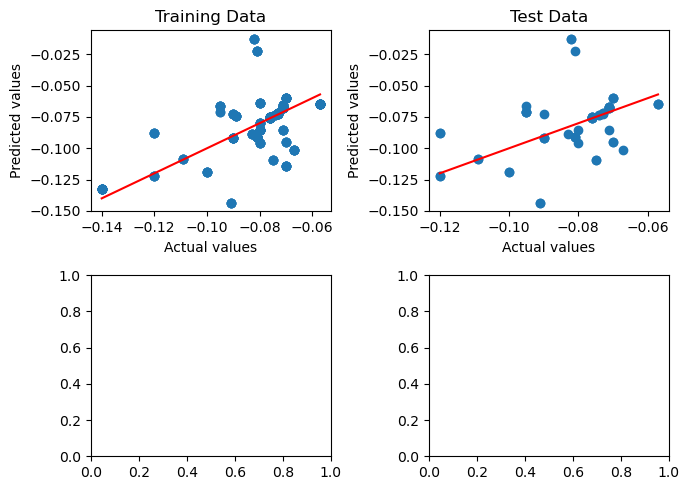

<Figure size 640x480 with 0 Axes>

[b] Epoch [420/2000], Loss: 0.0004
Train R²:  -0.13569
Test R² :  -1.18842


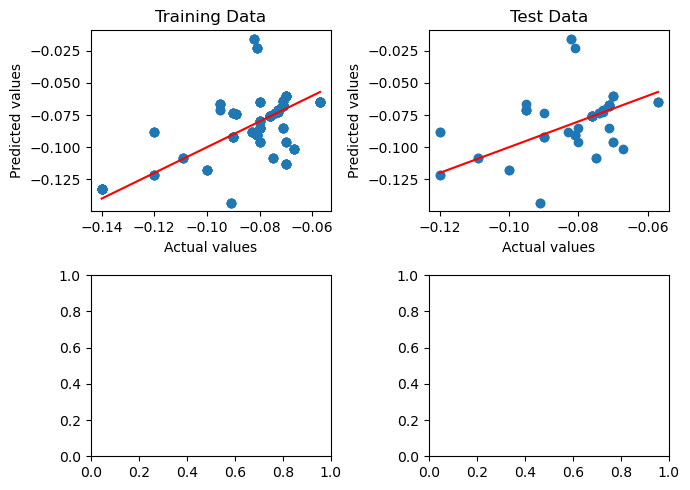

<Figure size 640x480 with 0 Axes>

[b] Epoch [440/2000], Loss: 0.0004
Train R²:  -0.09674
Test R² :  -1.10699


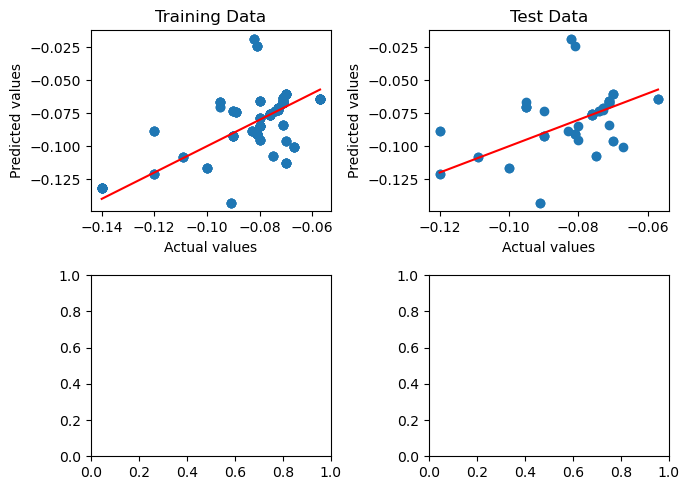

<Figure size 640x480 with 0 Axes>

[b] Epoch [460/2000], Loss: 0.0004
Train R²:  -0.06088
Test R² :  -1.02680


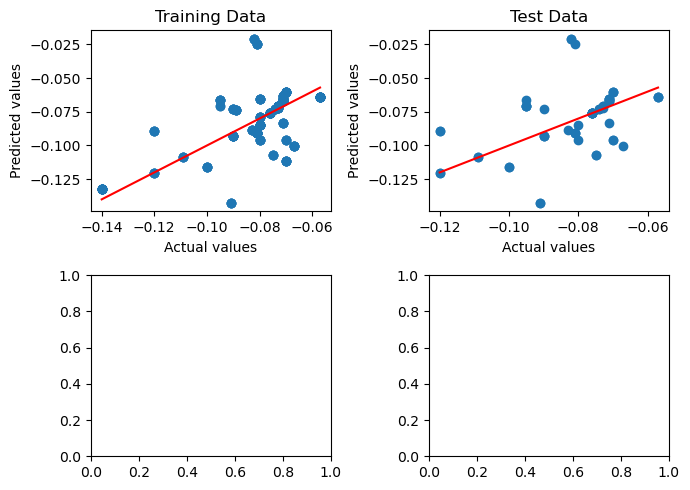

<Figure size 640x480 with 0 Axes>

[b] Epoch [480/2000], Loss: 0.0004
Train R²:  -0.02823
Test R² :  -0.95317


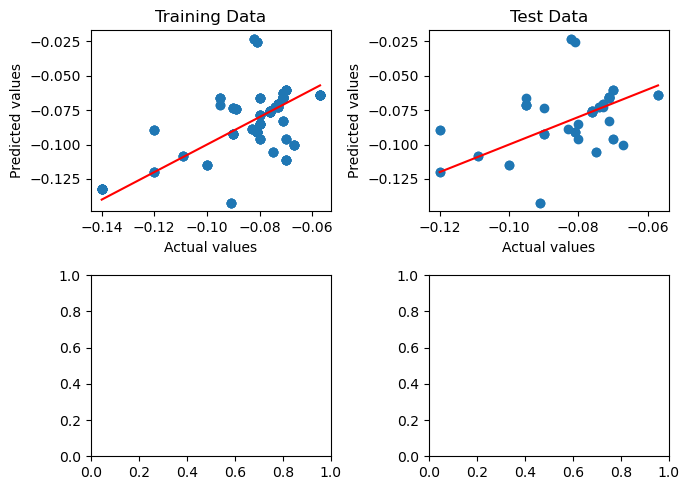

<Figure size 640x480 with 0 Axes>

[b] Epoch [500/2000], Loss: 0.0003
Train R²:  0.00327
Test R² :  -0.88621


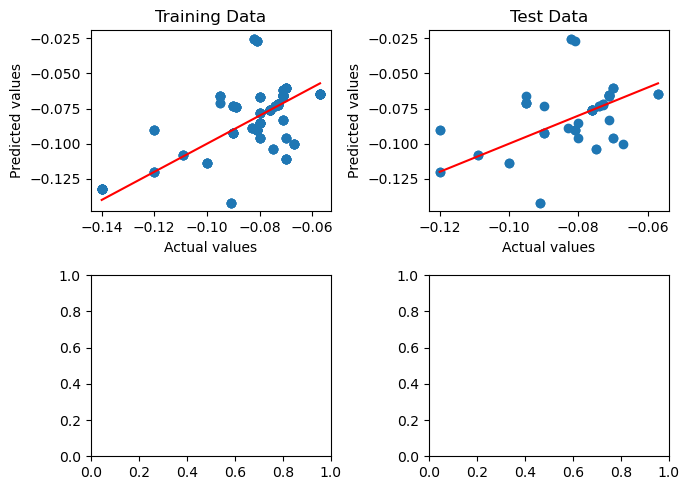

<Figure size 640x480 with 0 Axes>

[b] Epoch [520/2000], Loss: 0.0003
Train R²:  0.03314
Test R² :  -0.82193


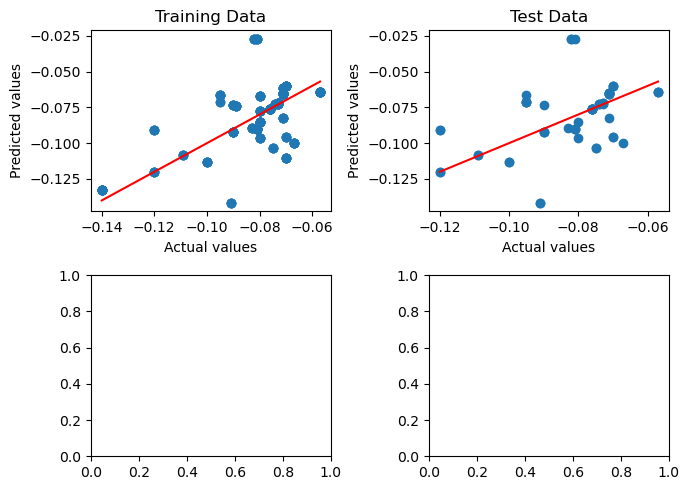

<Figure size 640x480 with 0 Axes>

[b] Epoch [540/2000], Loss: 0.0003
Train R²:  0.06199
Test R² :  -0.76177


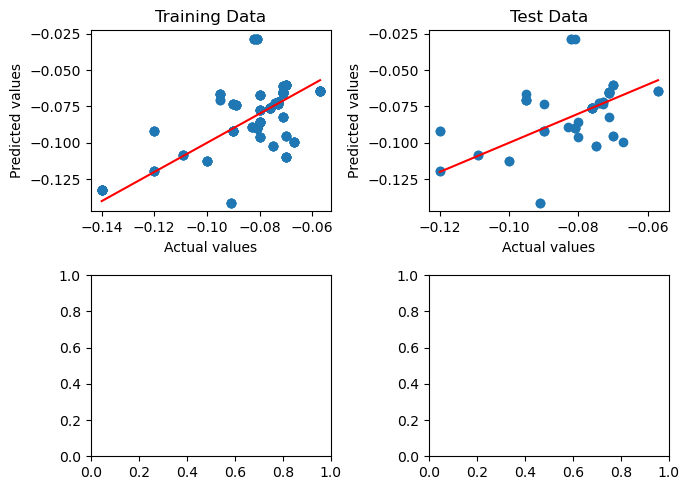

<Figure size 640x480 with 0 Axes>

[b] Epoch [560/2000], Loss: 0.0003
Train R²:  0.16335
Test R² :  -0.42318


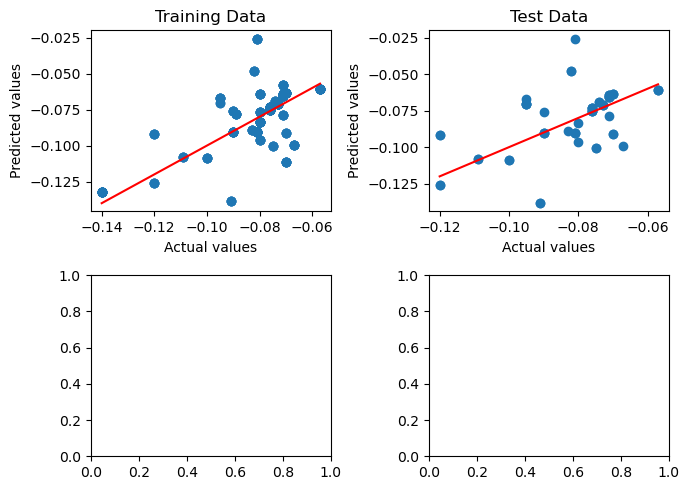

<Figure size 640x480 with 0 Axes>

[b] Epoch [580/2000], Loss: 0.0003
Train R²:  0.21440
Test R² :  -0.36799


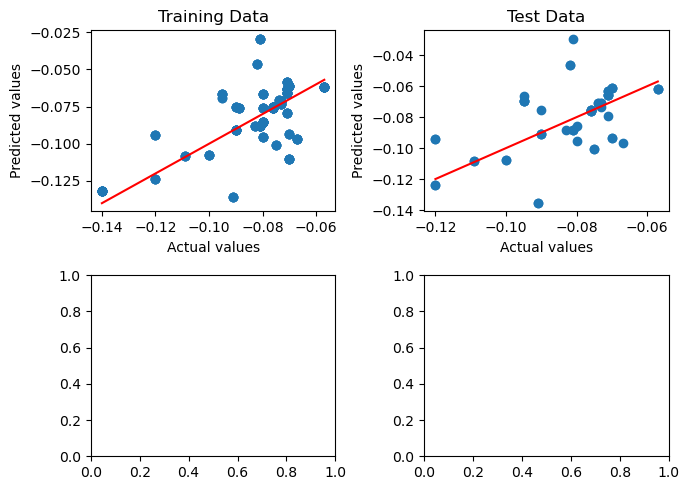

<Figure size 640x480 with 0 Axes>

[b] Epoch [600/2000], Loss: 0.0003
Train R²:  0.25068
Test R² :  -0.31918


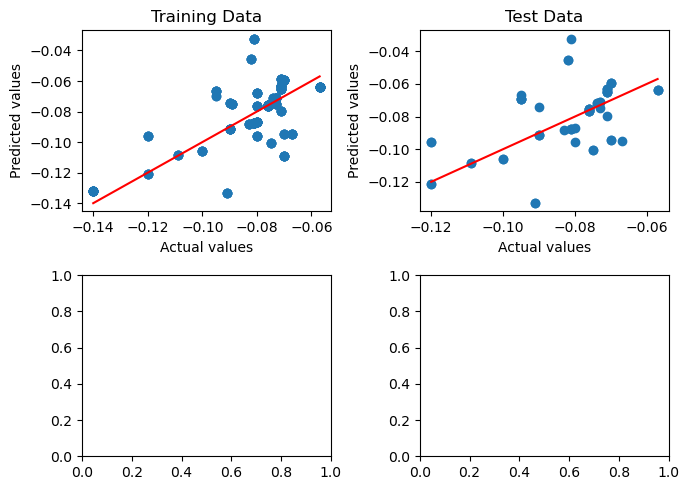

<Figure size 640x480 with 0 Axes>

[b] Epoch [620/2000], Loss: 0.0002
Train R²:  0.28238
Test R² :  -0.25704


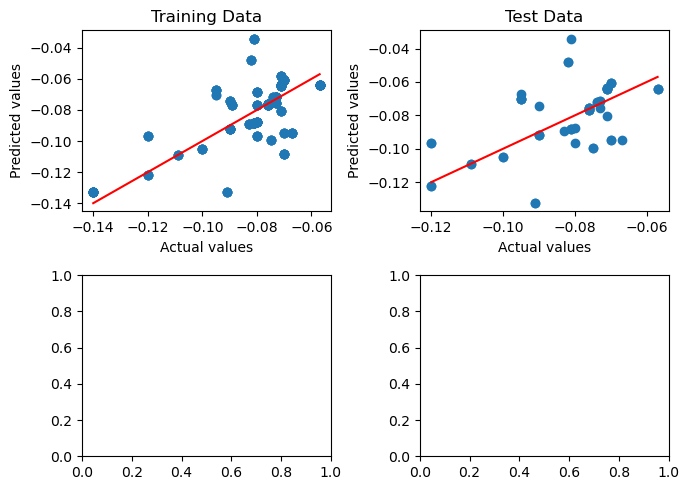

<Figure size 640x480 with 0 Axes>

[b] Epoch [640/2000], Loss: 0.0002
Train R²:  0.30967
Test R² :  -0.19663


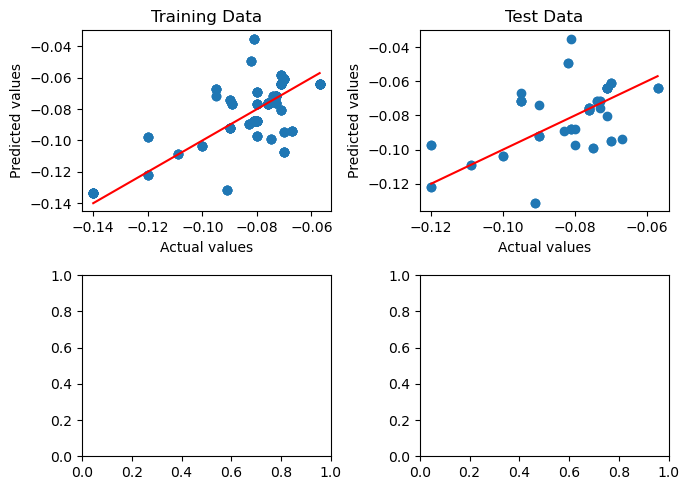

<Figure size 640x480 with 0 Axes>

[b] Epoch [660/2000], Loss: 0.0002
Train R²:  0.33463
Test R² :  -0.14817


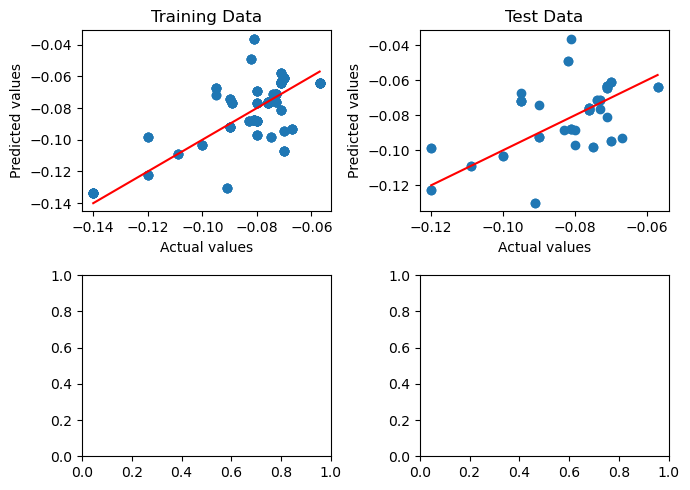

<Figure size 640x480 with 0 Axes>

[b] Epoch [680/2000], Loss: 0.0002
Train R²:  0.35929
Test R² :  -0.10174


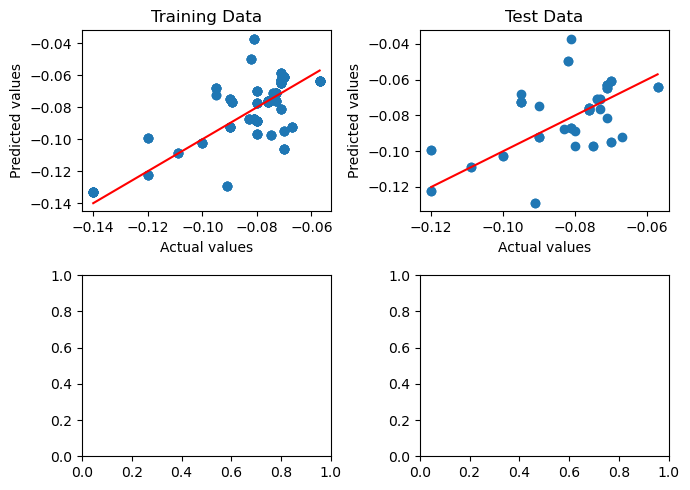

<Figure size 640x480 with 0 Axes>

[b] Epoch [700/2000], Loss: 0.0002
Train R²:  0.38328
Test R² :  -0.05128


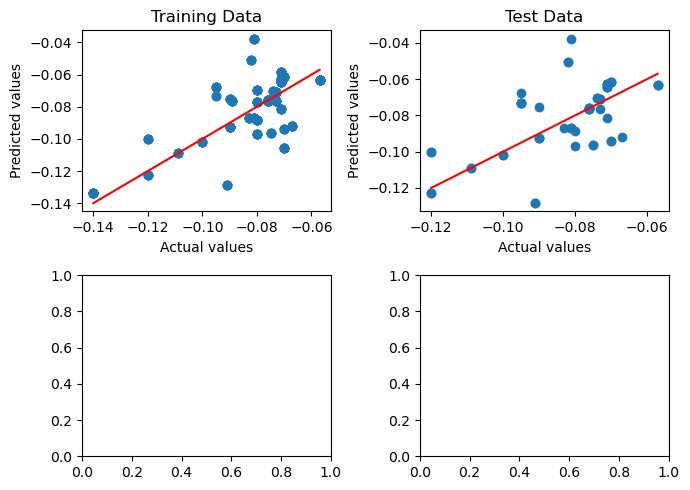

<Figure size 640x480 with 0 Axes>

[b] Epoch [720/2000], Loss: 0.0002
Train R²:  0.40651
Test R² :  -0.00249


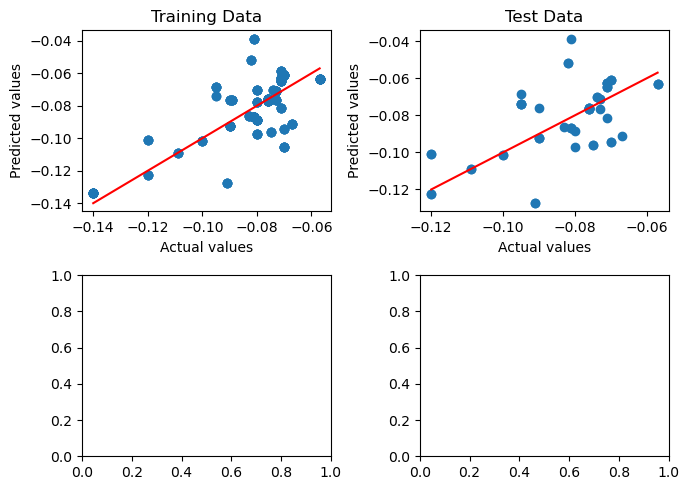

<Figure size 640x480 with 0 Axes>

[b] Epoch [740/2000], Loss: 0.0002
Train R²:  0.42815
Test R² :  0.03794


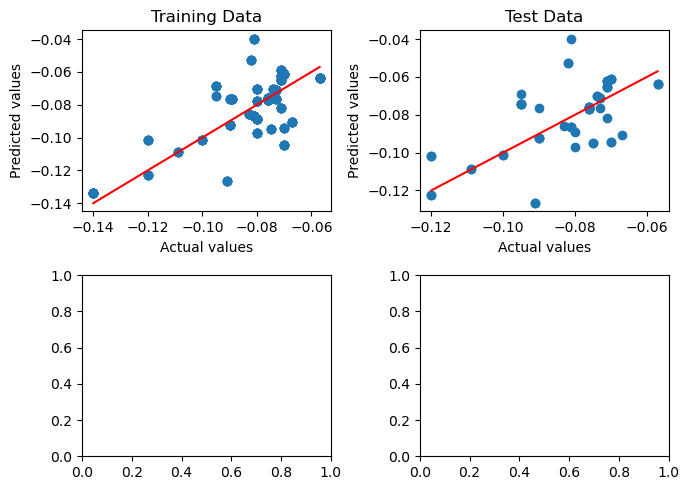

<Figure size 640x480 with 0 Axes>

[b] Epoch [760/2000], Loss: 0.0002
Train R²:  0.44894
Test R² :  0.08559


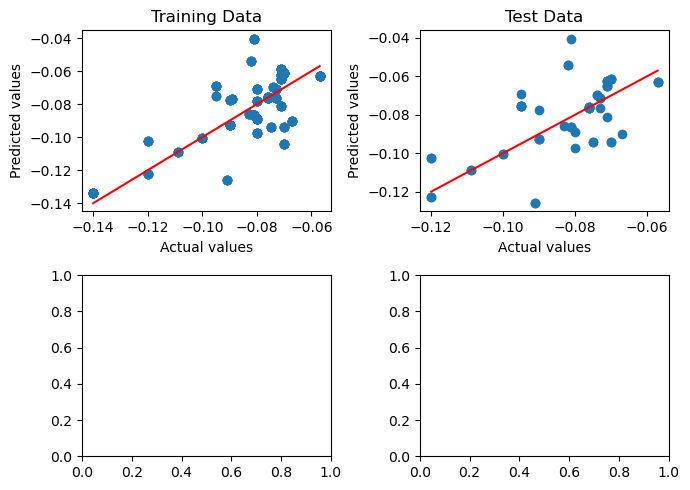

<Figure size 640x480 with 0 Axes>

[b] Epoch [780/2000], Loss: 0.0002
Train R²:  0.46800
Test R² :  0.12032


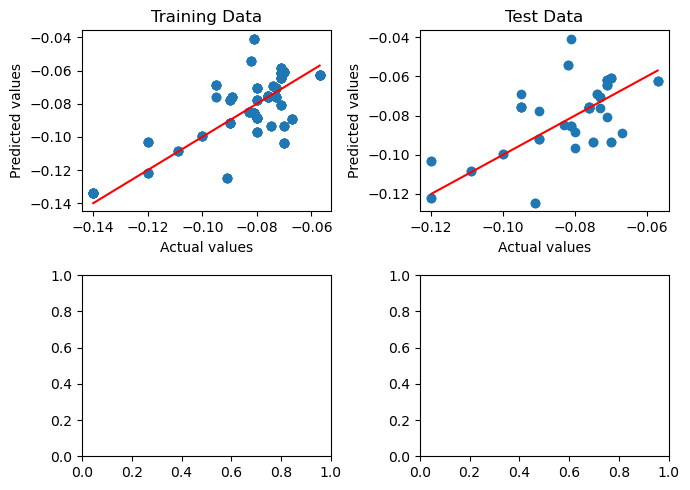

<Figure size 640x480 with 0 Axes>

[b] Epoch [800/2000], Loss: 0.0002
Train R²:  0.48864
Test R² :  0.16183


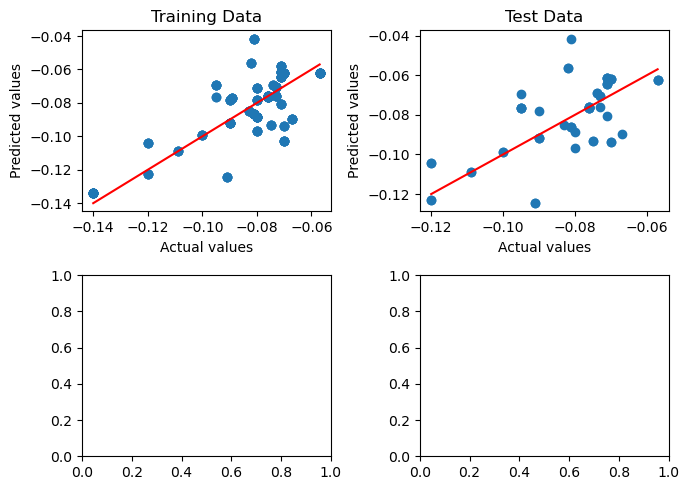

<Figure size 640x480 with 0 Axes>

[b] Epoch [820/2000], Loss: 0.0002
Train R²:  0.50787
Test R² :  0.20238


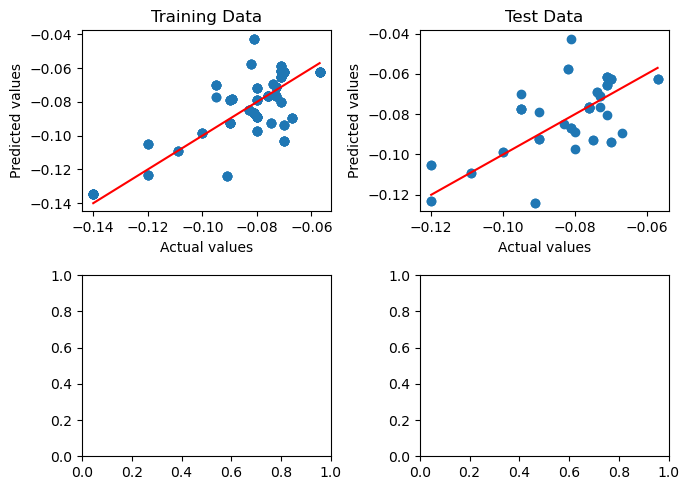

<Figure size 640x480 with 0 Axes>

[b] Epoch [840/2000], Loss: 0.0002
Train R²:  0.52706
Test R² :  0.23557


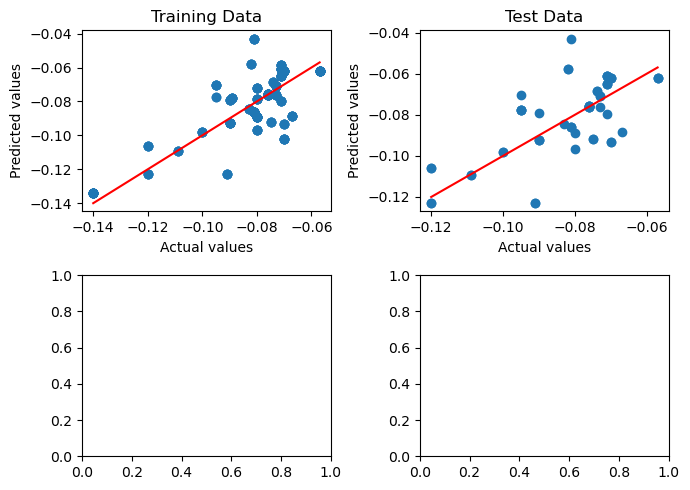

<Figure size 640x480 with 0 Axes>

[b] Epoch [860/2000], Loss: 0.0002
Train R²:  0.54989
Test R² :  0.28156


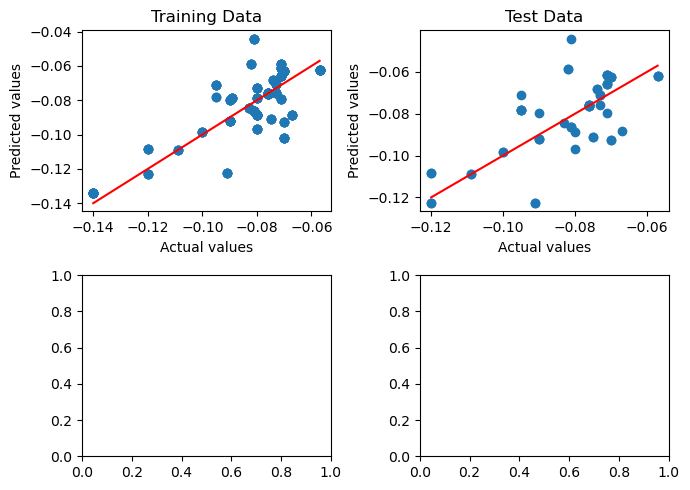

<Figure size 640x480 with 0 Axes>

[b] Epoch [880/2000], Loss: 0.0001
Train R²:  0.56958
Test R² :  0.32431


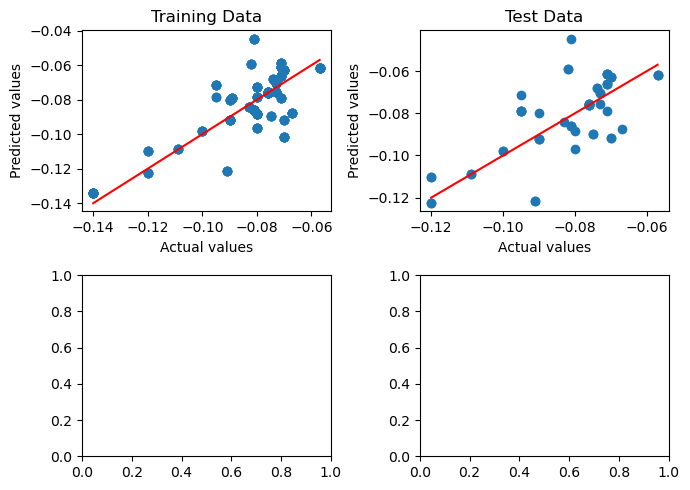

<Figure size 640x480 with 0 Axes>

[b] Epoch [900/2000], Loss: 0.0001
Train R²:  0.58845
Test R² :  0.36447


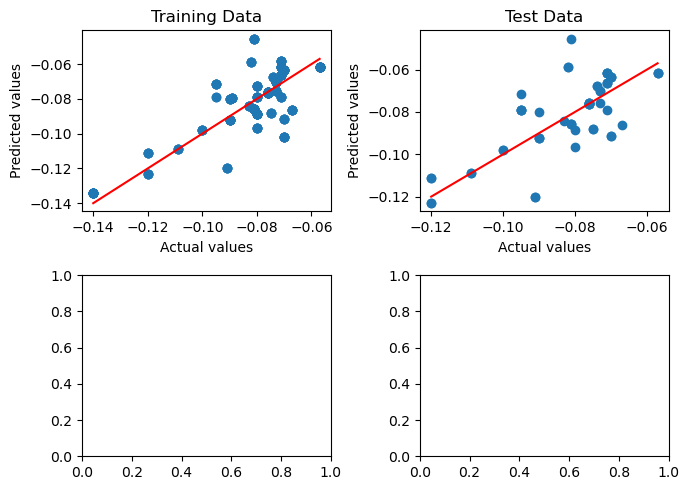

<Figure size 640x480 with 0 Axes>

[b] Epoch [920/2000], Loss: 0.0001
Train R²:  0.60465
Test R² :  0.39466


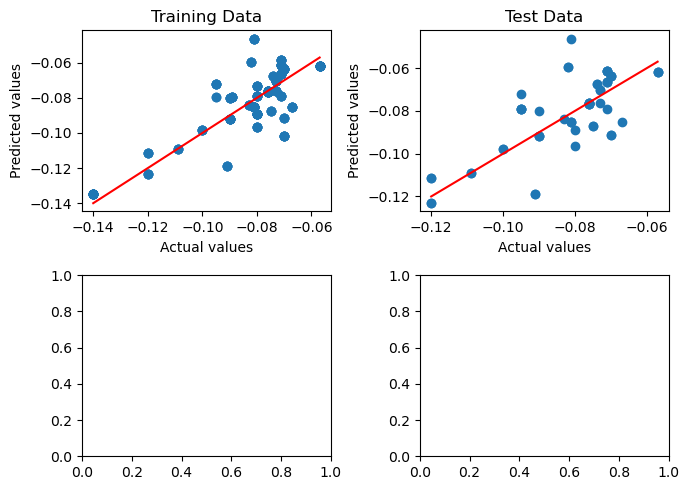

<Figure size 640x480 with 0 Axes>

[b] Epoch [940/2000], Loss: 0.0001
Train R²:  0.62040
Test R² :  0.42373


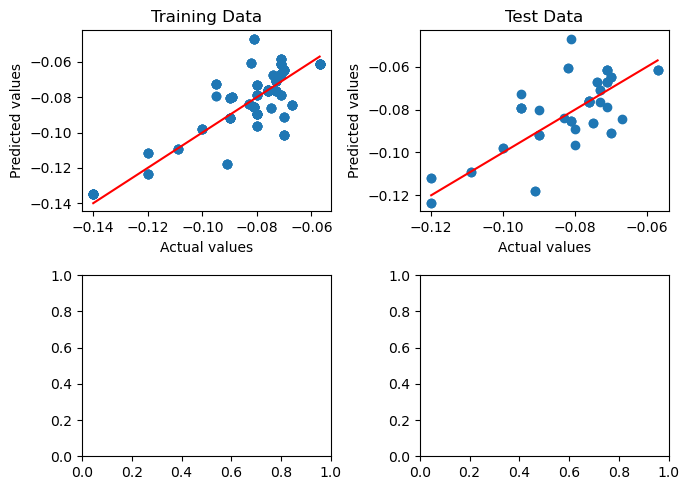

<Figure size 640x480 with 0 Axes>

[b] Epoch [960/2000], Loss: 0.0001
Train R²:  0.63505
Test R² :  0.45378


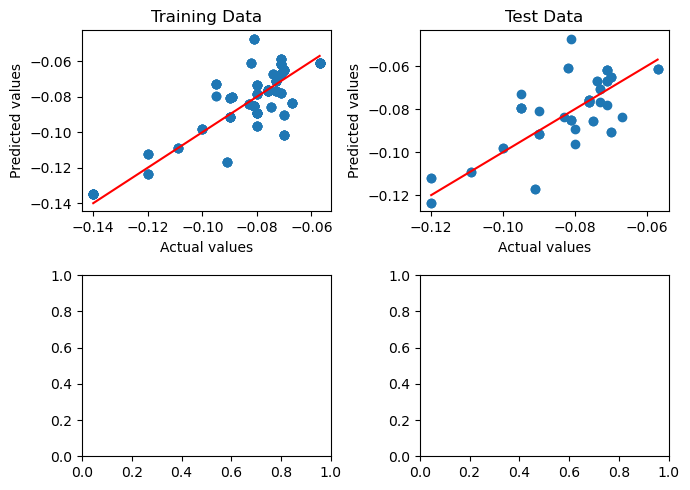

<Figure size 640x480 with 0 Axes>

[b] Epoch [980/2000], Loss: 0.0001
Train R²:  0.64900
Test R² :  0.47617


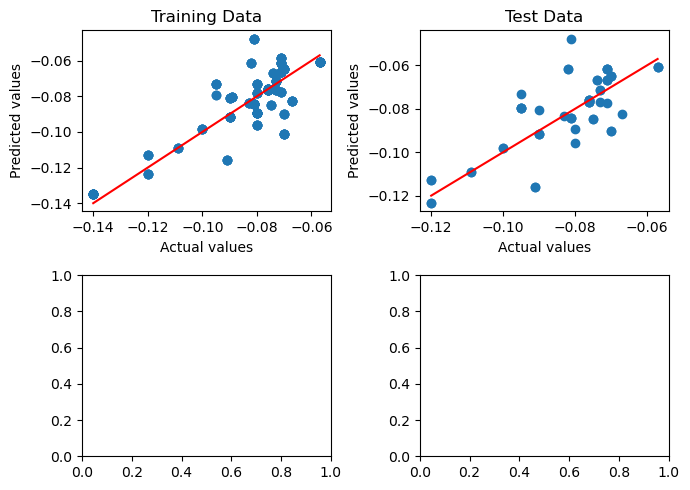

<Figure size 640x480 with 0 Axes>

[b] Epoch [1000/2000], Loss: 0.0001
Train R²:  0.66137
Test R² :  0.50475


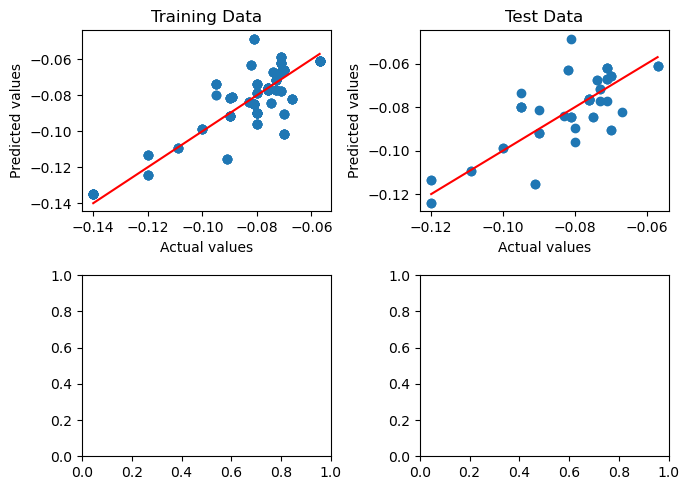

<Figure size 640x480 with 0 Axes>

[b] Epoch [1020/2000], Loss: 0.0001
Train R²:  0.67435
Test R² :  0.52203


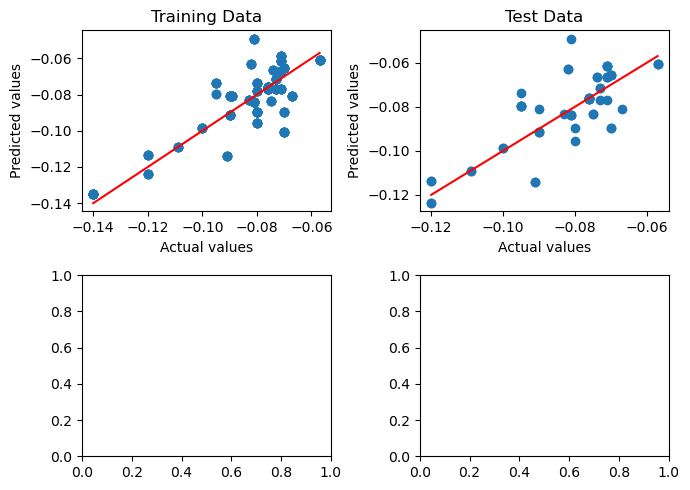

<Figure size 640x480 with 0 Axes>

[b] Epoch [1040/2000], Loss: 0.0001
Train R²:  0.68640
Test R² :  0.54199


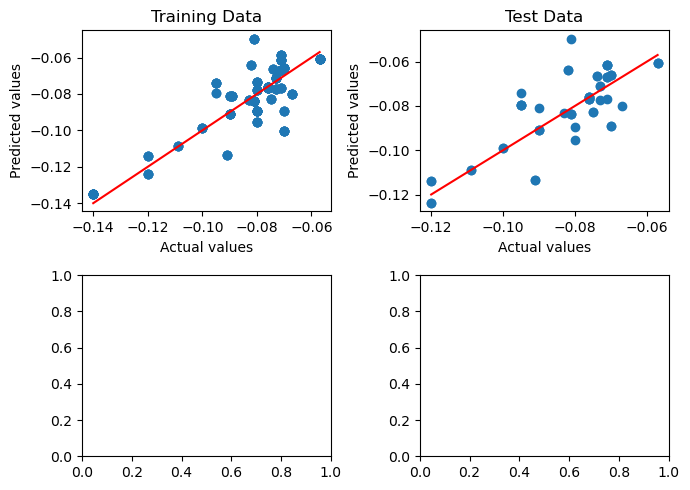

<Figure size 640x480 with 0 Axes>

[b] Epoch [1060/2000], Loss: 0.0001
Train R²:  0.69806
Test R² :  0.56465


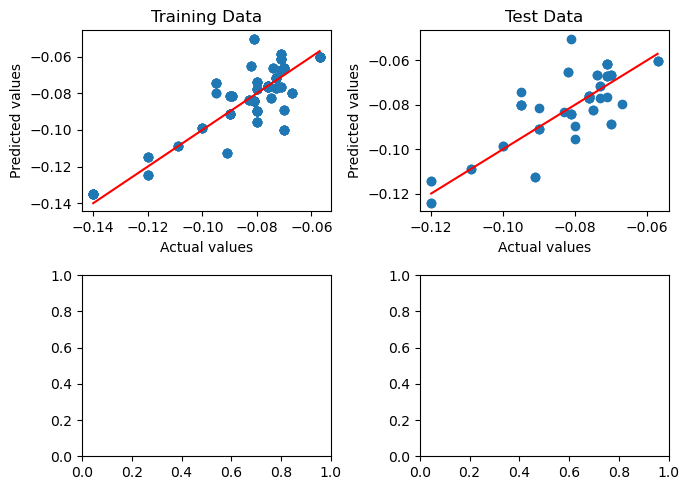

<Figure size 640x480 with 0 Axes>

[b] Epoch [1080/2000], Loss: 0.0001
Train R²:  0.70816
Test R² :  0.57910


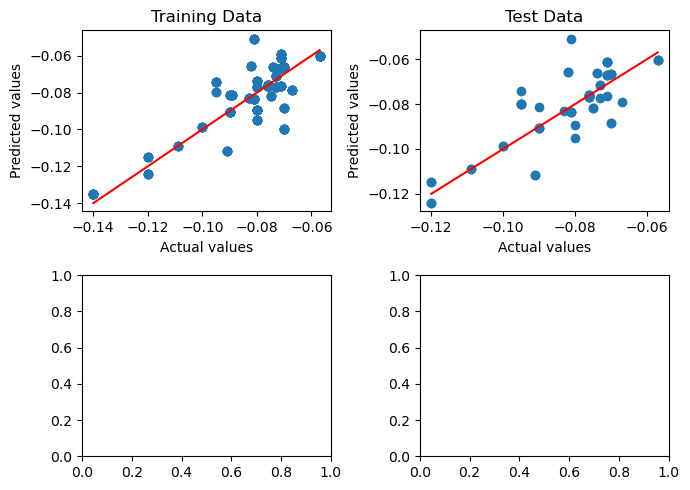

<Figure size 640x480 with 0 Axes>

[b] Epoch [1100/2000], Loss: 0.0001
Train R²:  0.72001
Test R² :  0.60503


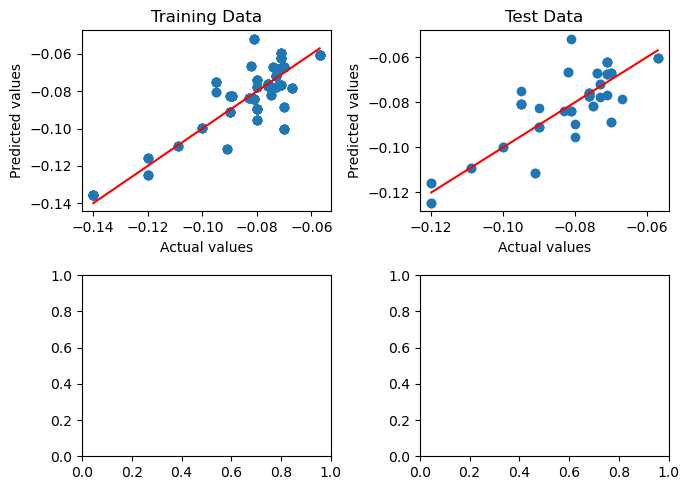

<Figure size 640x480 with 0 Axes>

[b] Epoch [1120/2000], Loss: 0.0001
Train R²:  0.73182
Test R² :  0.61861


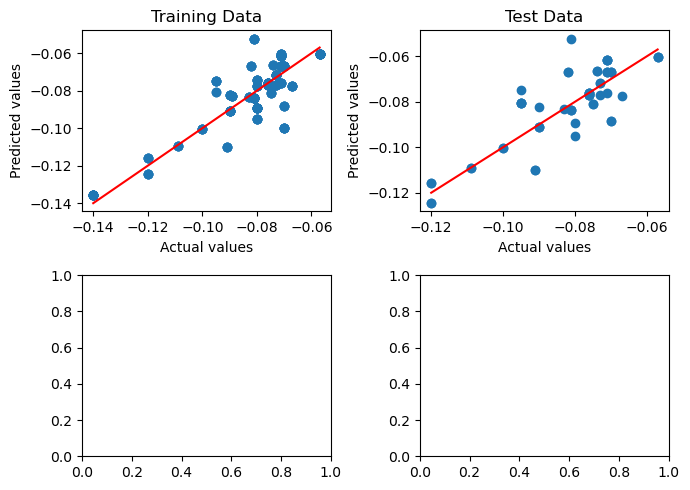

<Figure size 640x480 with 0 Axes>

[b] Epoch [1140/2000], Loss: 0.0001
Train R²:  0.74234
Test R² :  0.63997


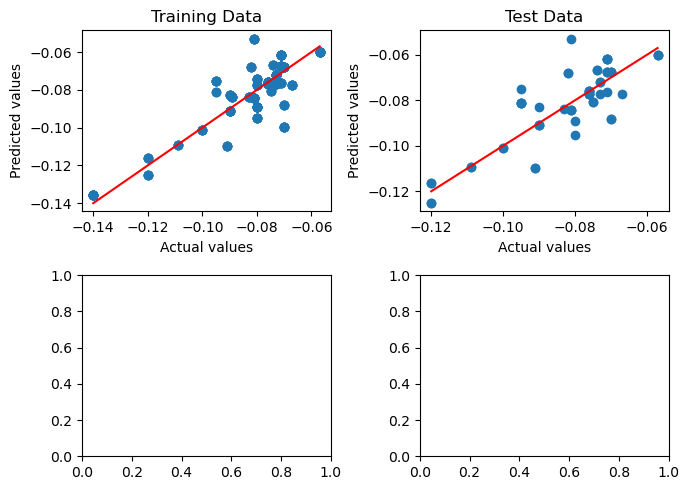

<Figure size 640x480 with 0 Axes>

[b] Epoch [1160/2000], Loss: 0.0001
Train R²:  0.75221
Test R² :  0.65796


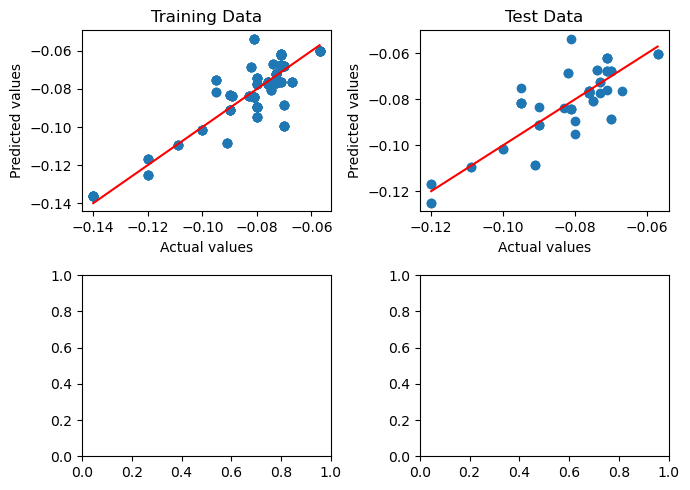

<Figure size 640x480 with 0 Axes>

[b] Epoch [1180/2000], Loss: 0.0001
Train R²:  0.76138
Test R² :  0.67421


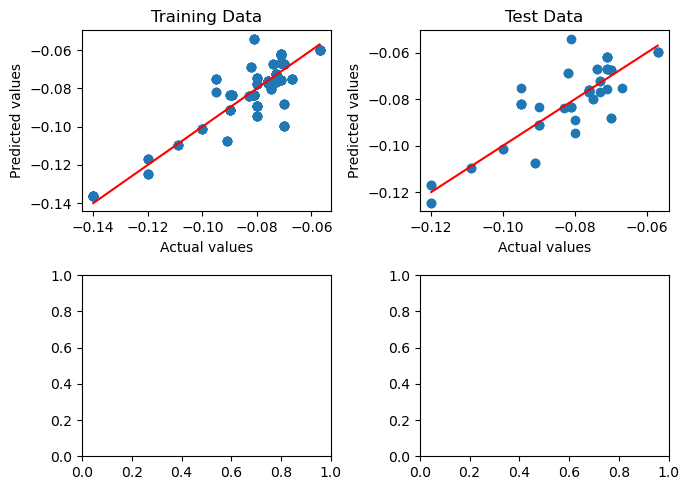

<Figure size 640x480 with 0 Axes>

[b] Epoch [1200/2000], Loss: 0.0001
Train R²:  0.77091
Test R² :  0.68572


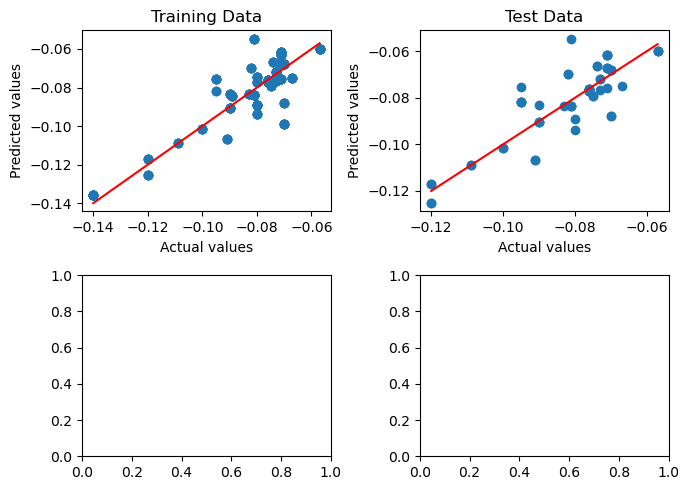

<Figure size 640x480 with 0 Axes>

[b] Epoch [1220/2000], Loss: 0.0001
Train R²:  0.77909
Test R² :  0.69991


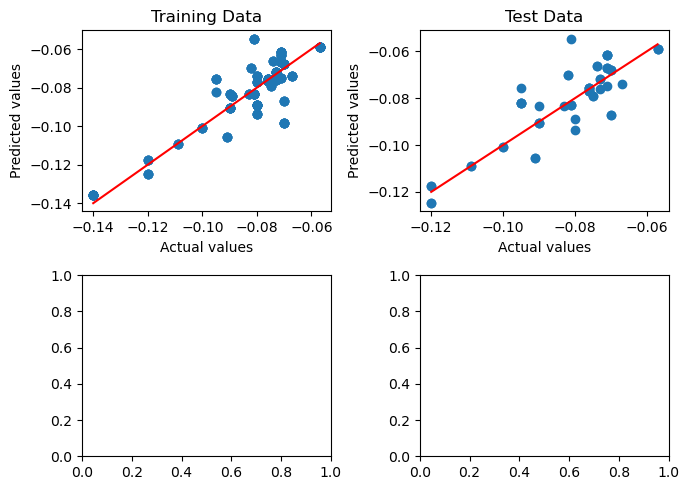

<Figure size 640x480 with 0 Axes>

[b] Epoch [1240/2000], Loss: 0.0001
Train R²:  0.78669
Test R² :  0.71456


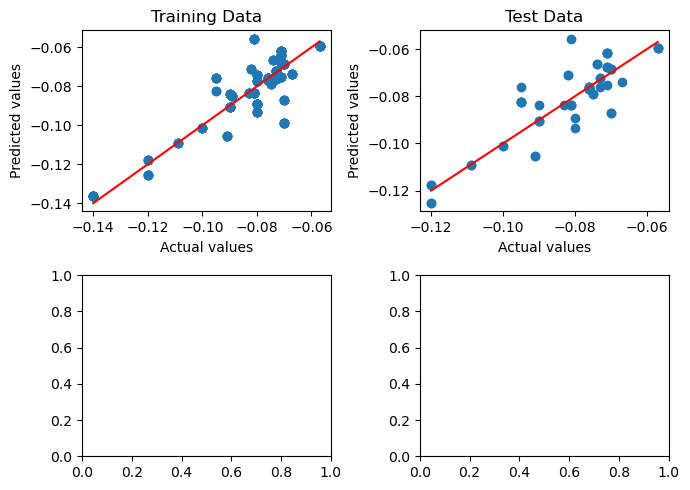

<Figure size 640x480 with 0 Axes>

[b] Epoch [1260/2000], Loss: 0.0001
Train R²:  0.79338
Test R² :  0.72891


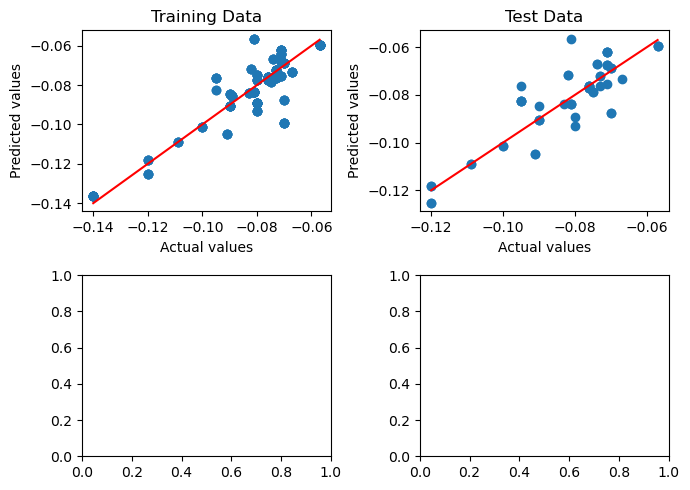

<Figure size 640x480 with 0 Axes>

[b] Epoch [1280/2000], Loss: 0.0001
Train R²:  0.80042
Test R² :  0.73495


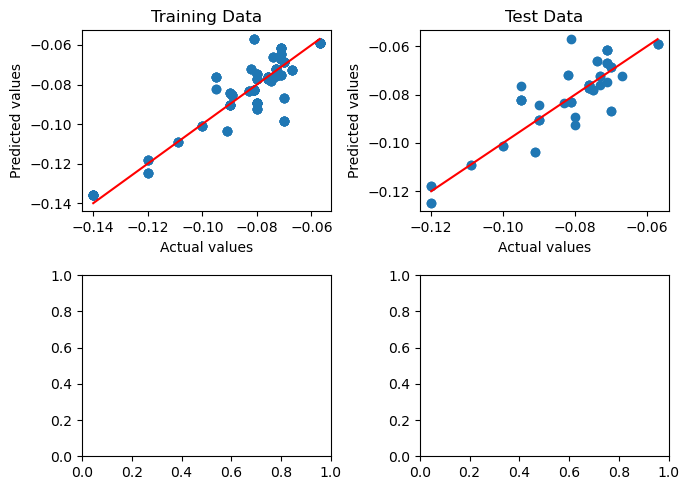

<Figure size 640x480 with 0 Axes>

[b] Epoch [1300/2000], Loss: 0.0001
Train R²:  0.80659
Test R² :  0.74409


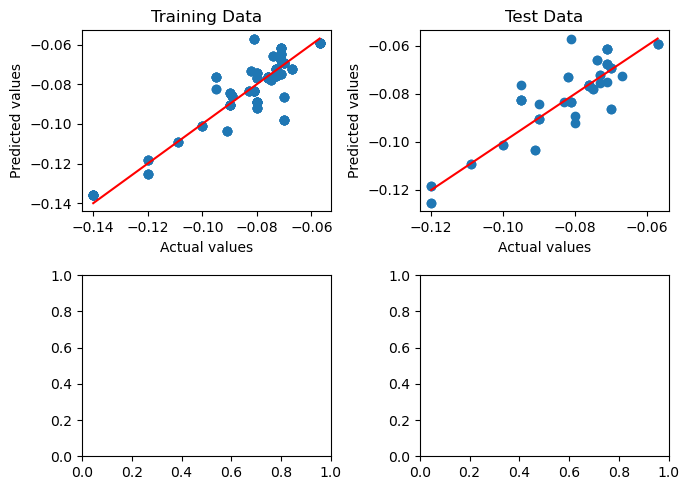

<Figure size 640x480 with 0 Axes>

[b] Epoch [1320/2000], Loss: 0.0001
Train R²:  0.81291
Test R² :  0.75640


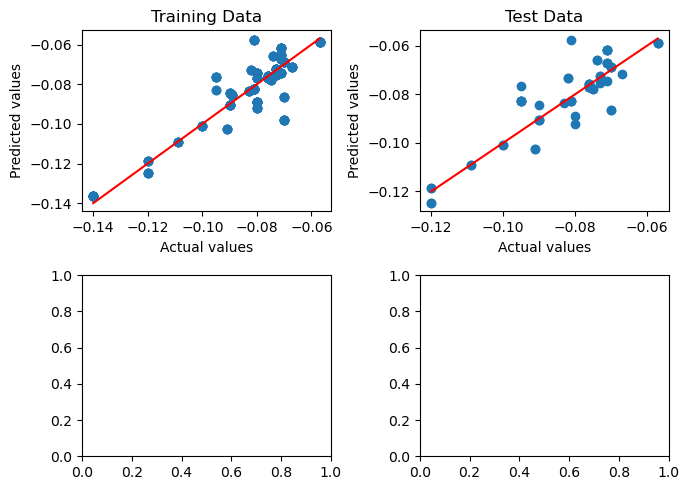

<Figure size 640x480 with 0 Axes>

[b] Epoch [1340/2000], Loss: 0.0001
Train R²:  0.81847
Test R² :  0.76436


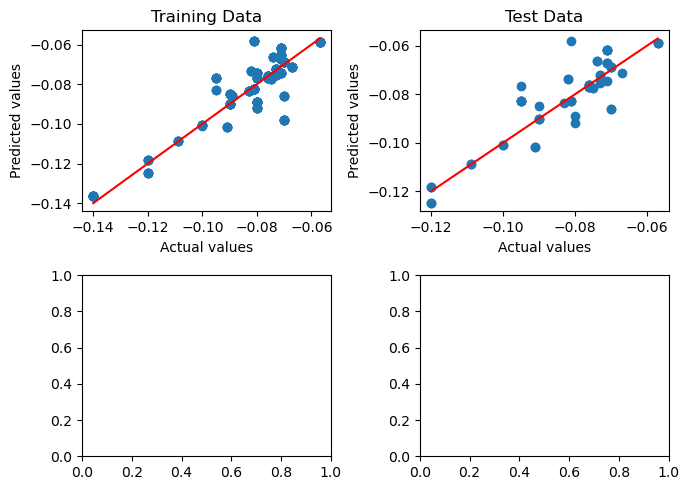

<Figure size 640x480 with 0 Axes>

[b] Epoch [1360/2000], Loss: 0.0001
Train R²:  0.82227
Test R² :  0.76970


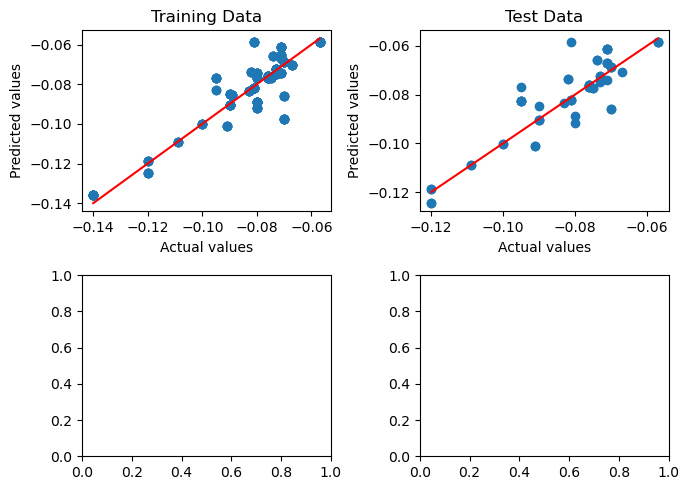

<Figure size 640x480 with 0 Axes>

[b] Epoch [1380/2000], Loss: 0.0001
Train R²:  0.82625
Test R² :  0.78226


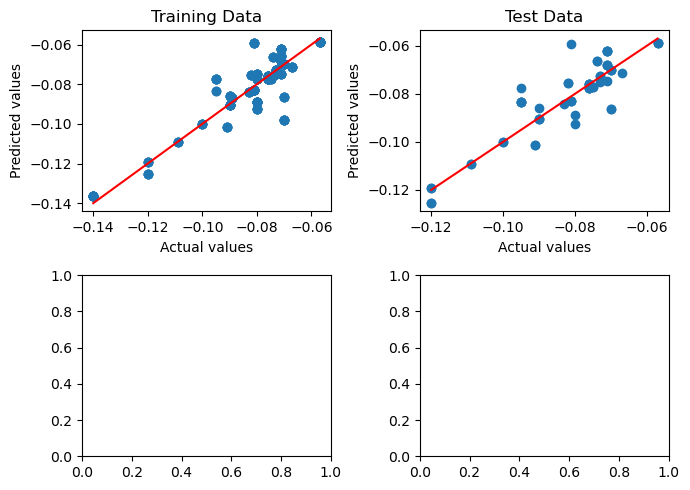

<Figure size 640x480 with 0 Axes>

[b] Epoch [1400/2000], Loss: 0.0001
Train R²:  0.82948
Test R² :  0.78096


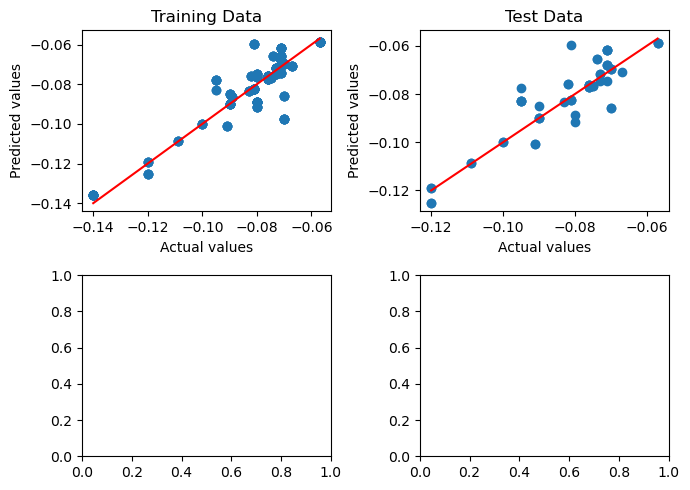

<Figure size 640x480 with 0 Axes>

[b] Epoch [1420/2000], Loss: 0.0001
Train R²:  0.83372
Test R² :  0.78784


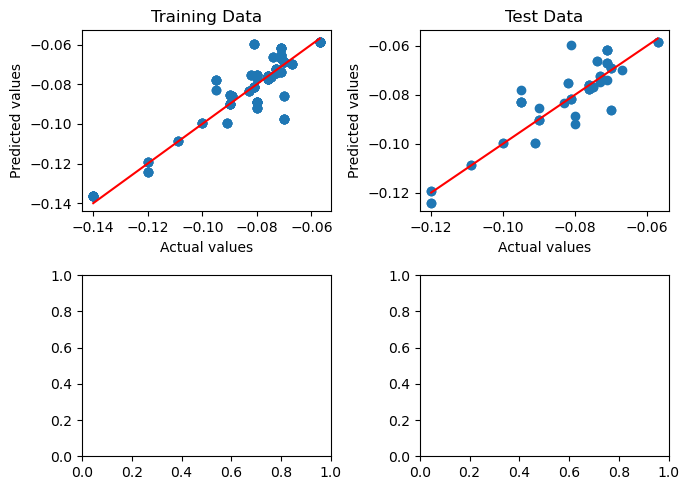

<Figure size 640x480 with 0 Axes>

[b] Epoch [1440/2000], Loss: 0.0001
Train R²:  0.83651
Test R² :  0.79333


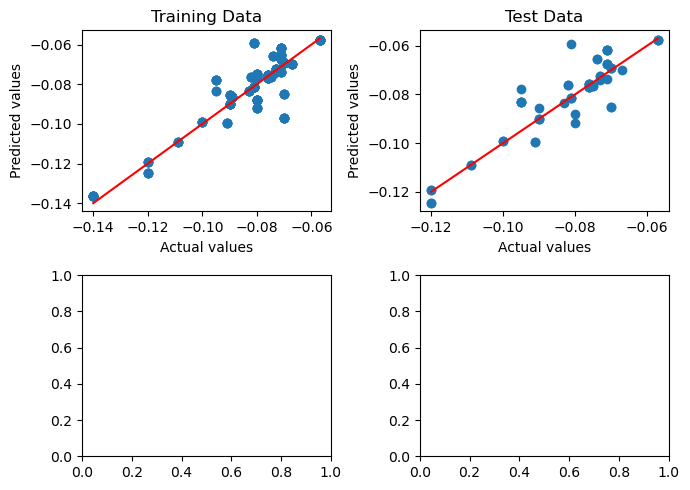

<Figure size 640x480 with 0 Axes>

[b] Epoch [1460/2000], Loss: 0.0001
Train R²:  0.84088
Test R² :  0.80126


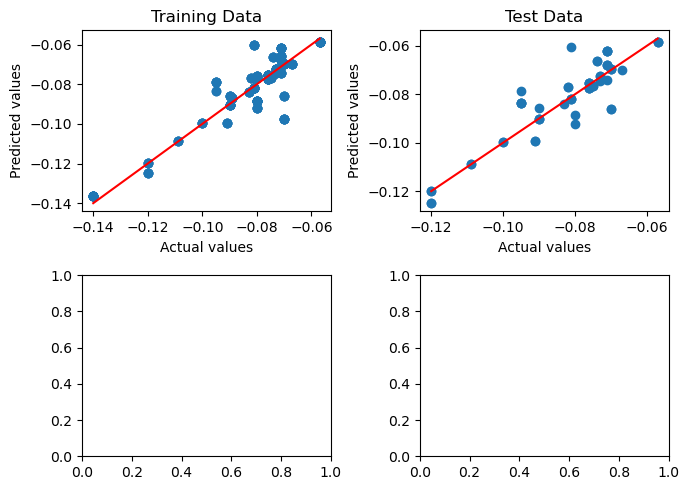

<Figure size 640x480 with 0 Axes>

[b] Epoch [1480/2000], Loss: 0.0001
Train R²:  0.84383
Test R² :  0.80457


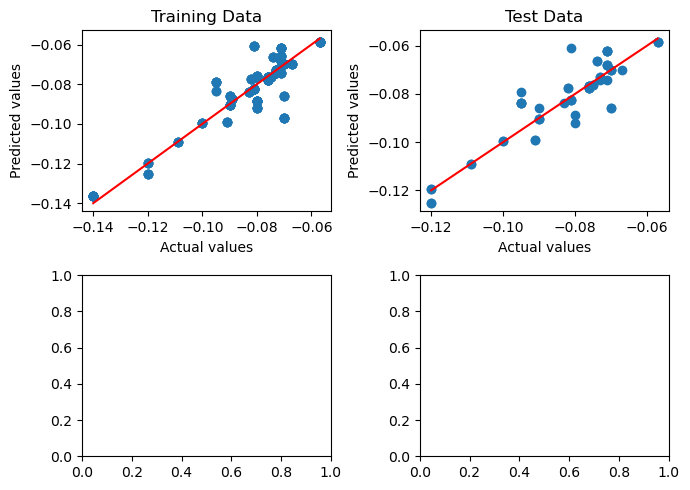

<Figure size 640x480 with 0 Axes>

[b] Epoch [1500/2000], Loss: 0.0001
Train R²:  0.84713
Test R² :  0.80671


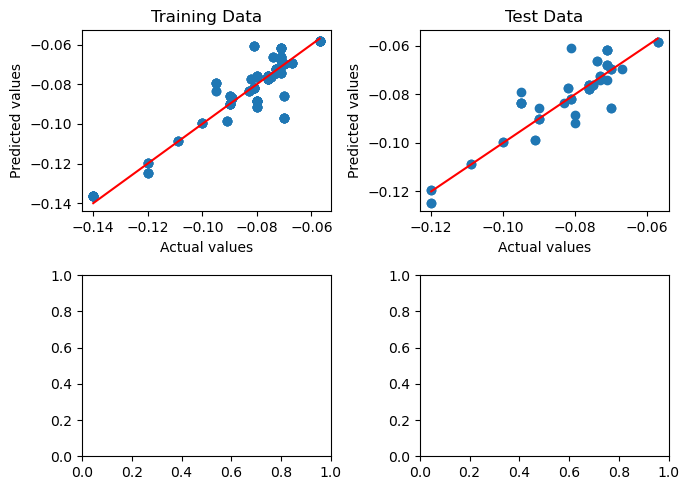

<Figure size 640x480 with 0 Axes>

[b] Epoch [1520/2000], Loss: 0.0001
Train R²:  0.84984
Test R² :  0.81072


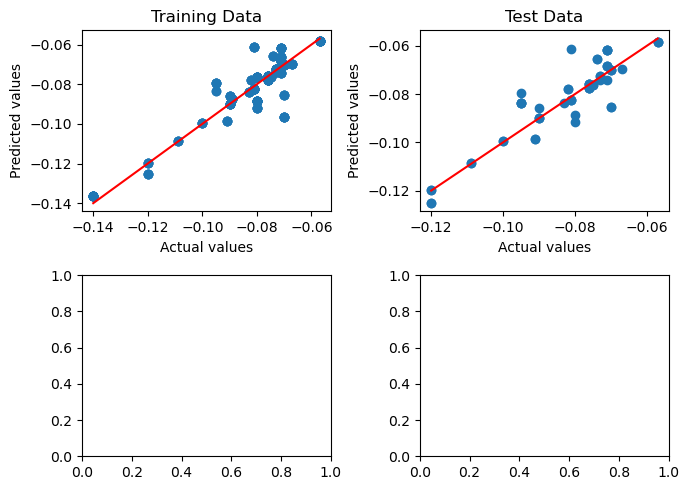

<Figure size 640x480 with 0 Axes>

[b] Epoch [1540/2000], Loss: 0.0001
Train R²:  0.85215
Test R² :  0.81413


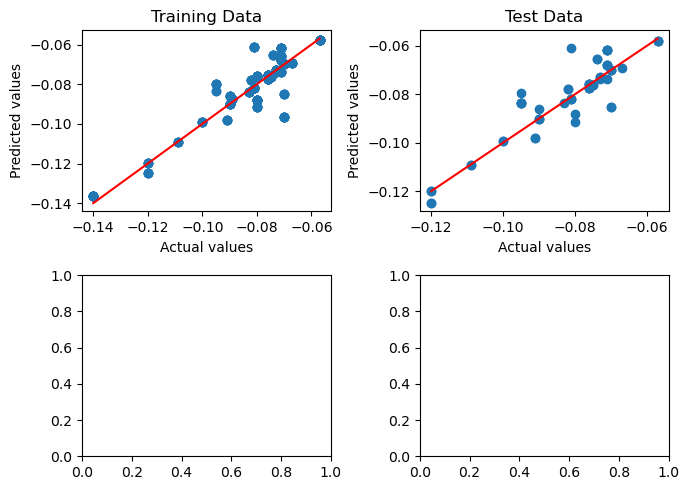

<Figure size 640x480 with 0 Axes>

[b] Epoch [1560/2000], Loss: 0.0000
Train R²:  0.85499
Test R² :  0.81993


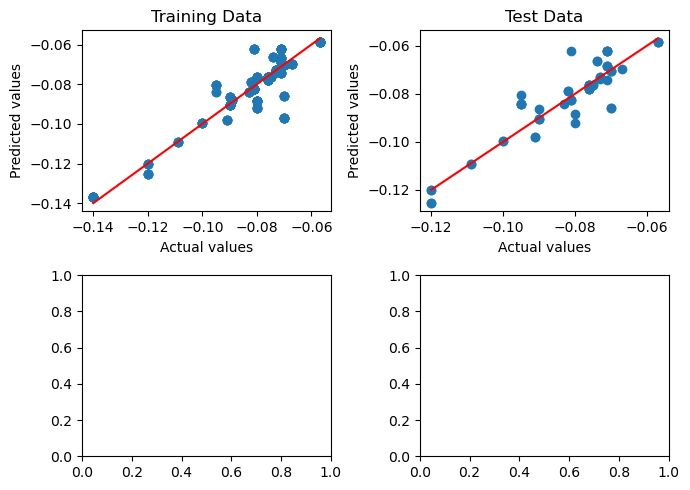

<Figure size 640x480 with 0 Axes>

[b] Epoch [1580/2000], Loss: 0.0000
Train R²:  0.85858
Test R² :  0.82131


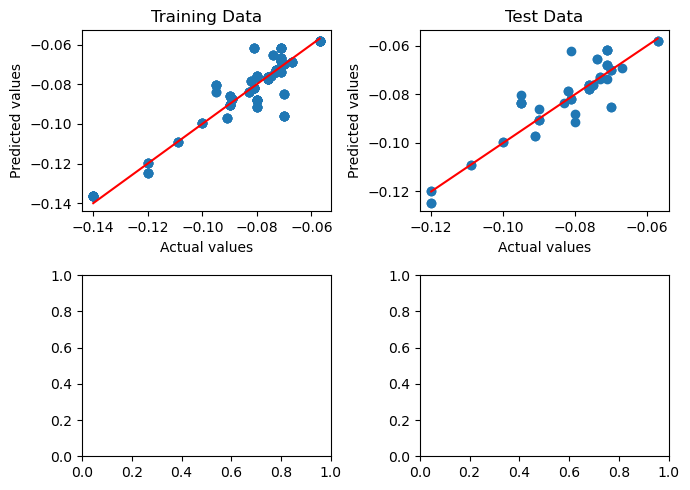

<Figure size 640x480 with 0 Axes>

[b] Epoch [1600/2000], Loss: 0.0000
Train R²:  0.86116
Test R² :  0.82129


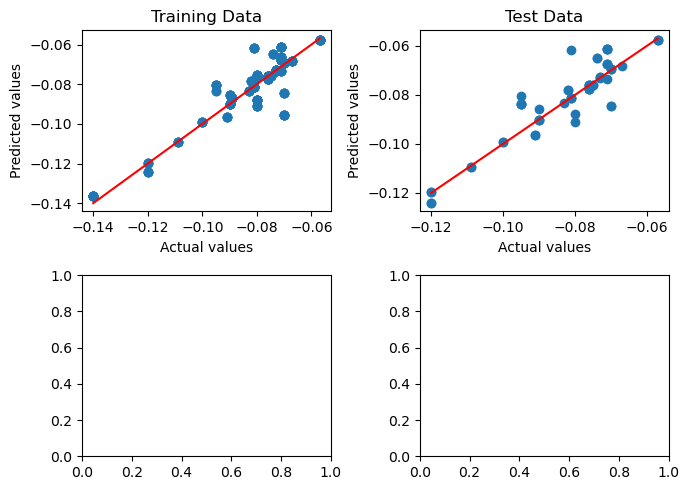

<Figure size 640x480 with 0 Axes>

[b] Epoch [1620/2000], Loss: 0.0000
Train R²:  0.86267
Test R² :  0.82806


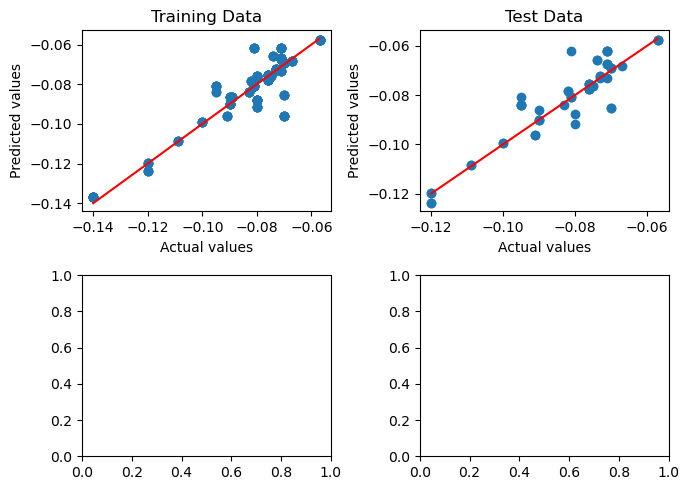

<Figure size 640x480 with 0 Axes>

[b] Epoch [1640/2000], Loss: 0.0000
Train R²:  0.86600
Test R² :  0.82823


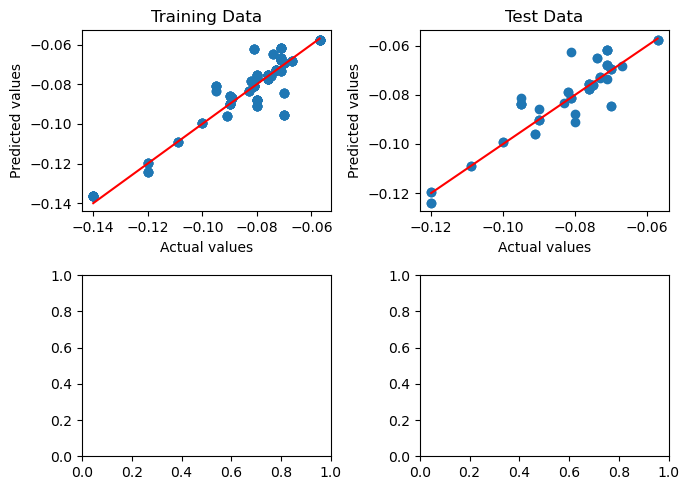

<Figure size 640x480 with 0 Axes>

[b] Epoch [1660/2000], Loss: 0.0000
Train R²:  0.86585
Test R² :  0.83459


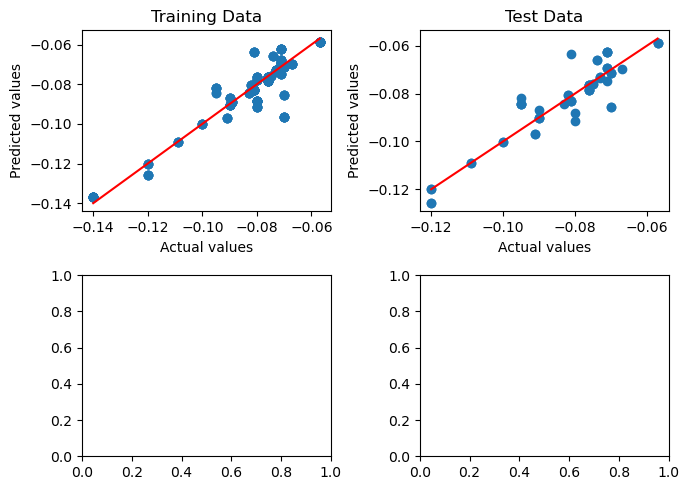

<Figure size 640x480 with 0 Axes>

[b] Epoch [1680/2000], Loss: 0.0000
Train R²:  0.86959
Test R² :  0.83396


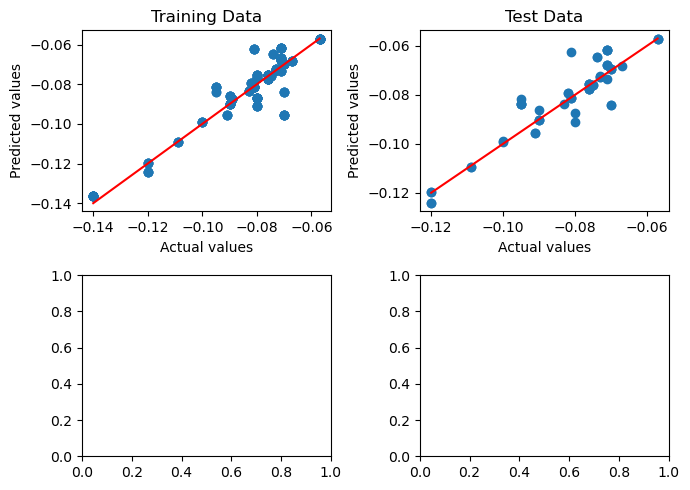

<Figure size 640x480 with 0 Axes>

[b] Epoch [1700/2000], Loss: 0.0000
Train R²:  0.87140
Test R² :  0.82833


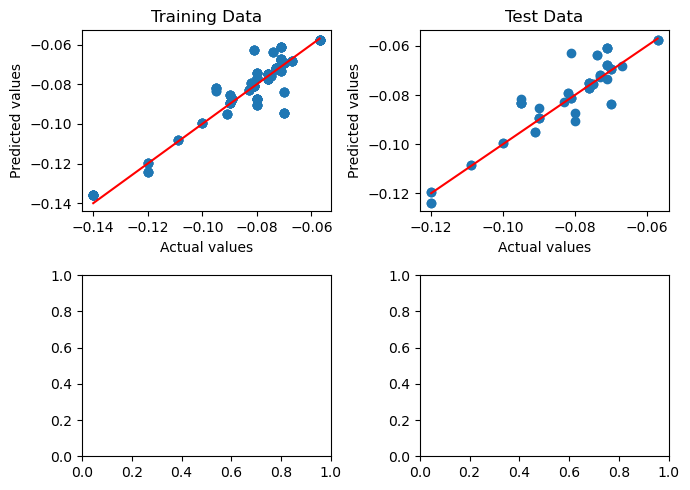

<Figure size 640x480 with 0 Axes>

[b] Epoch [1720/2000], Loss: 0.0000
Train R²:  0.87485
Test R² :  0.83888


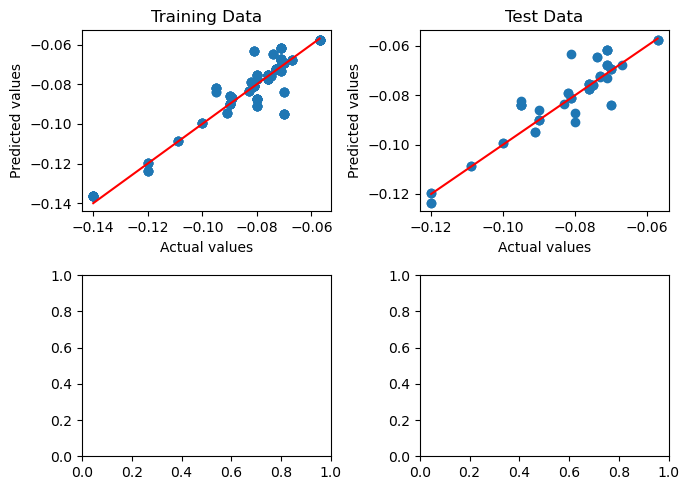

<Figure size 640x480 with 0 Axes>

[b] Epoch [1740/2000], Loss: 0.0000
Train R²:  0.87636
Test R² :  0.84420


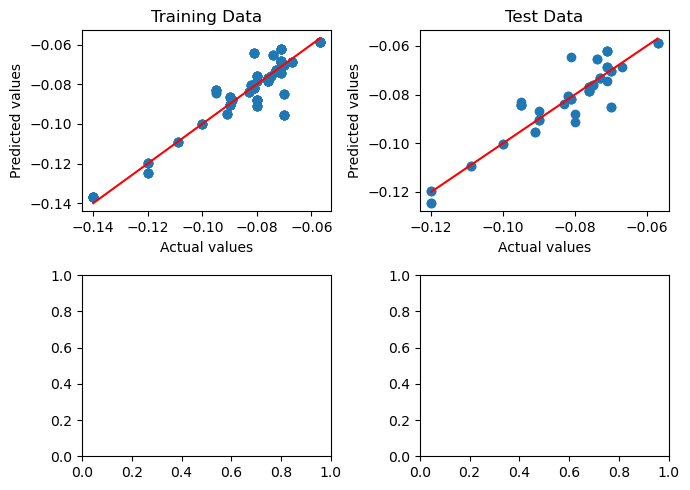

<Figure size 640x480 with 0 Axes>

[b] Epoch [1760/2000], Loss: 0.0000
Train R²:  0.87869
Test R² :  0.84235


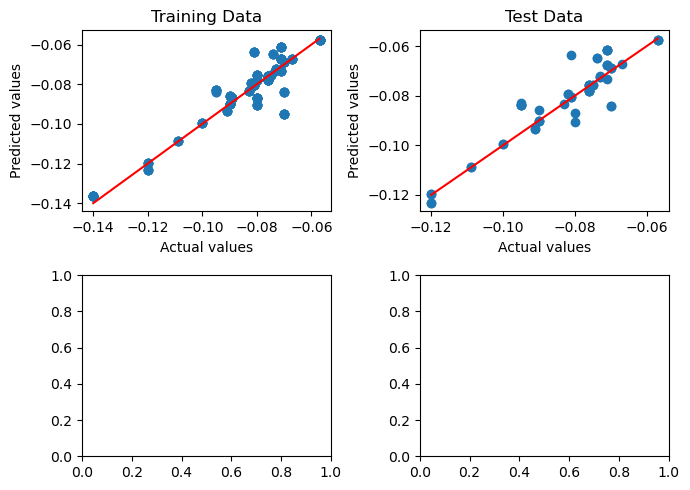

<Figure size 640x480 with 0 Axes>

[b] Epoch [1780/2000], Loss: 0.0000
Train R²:  0.88122
Test R² :  0.84982


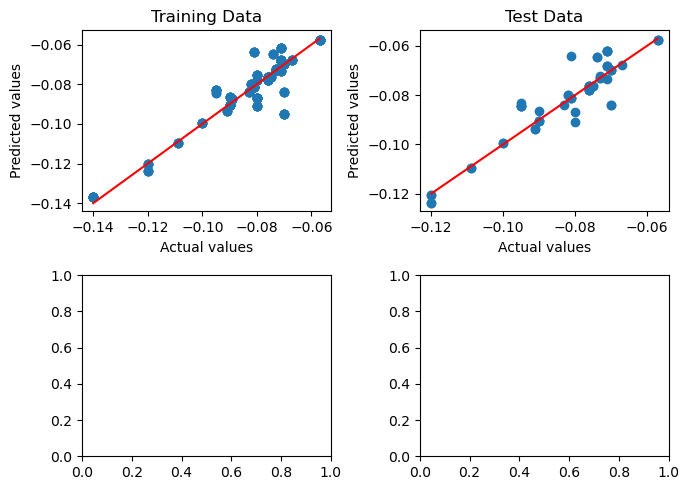

<Figure size 640x480 with 0 Axes>

[b] Epoch [1800/2000], Loss: 0.0000
Train R²:  0.88367
Test R² :  0.85194


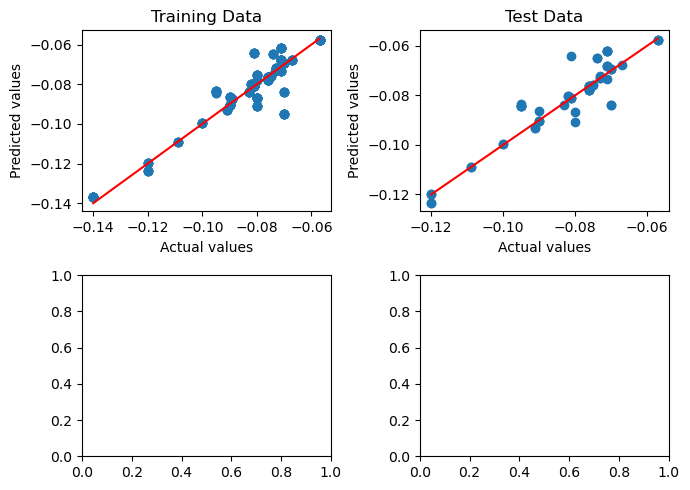

<Figure size 640x480 with 0 Axes>

[b] Epoch [1820/2000], Loss: 0.0000
Train R²:  0.88346
Test R² :  0.84840


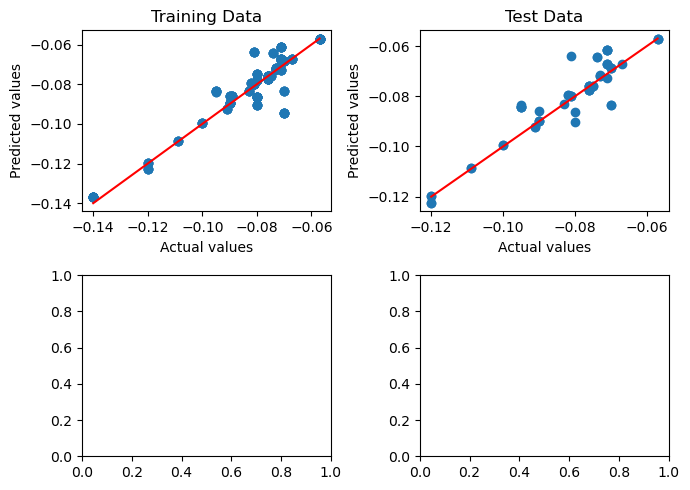

<Figure size 640x480 with 0 Axes>

[b] Epoch [1840/2000], Loss: 0.0000
Train R²:  0.88665
Test R² :  0.85101


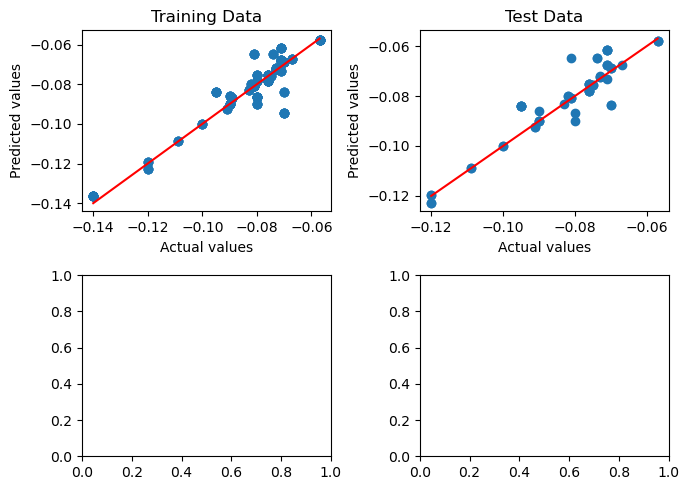

<Figure size 640x480 with 0 Axes>

[b] Epoch [1860/2000], Loss: 0.0000
Train R²:  0.88891
Test R² :  0.85551


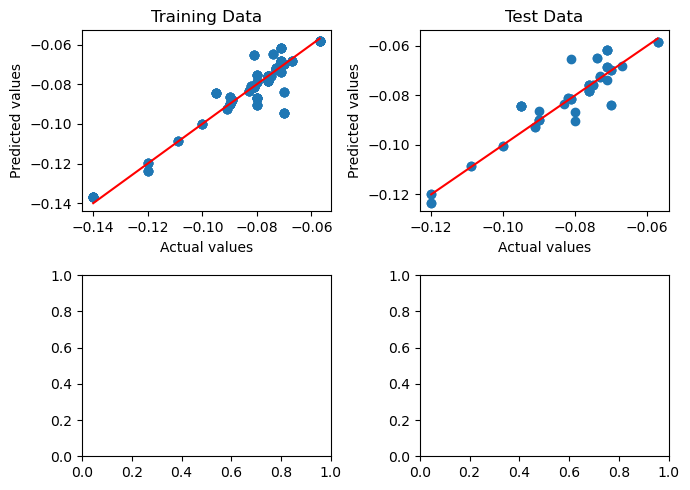

<Figure size 640x480 with 0 Axes>

[b] Epoch [1880/2000], Loss: 0.0000
Train R²:  0.88986
Test R² :  0.86085


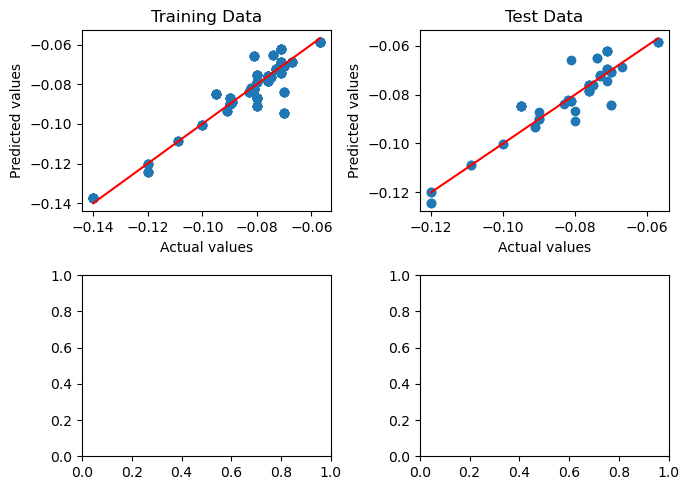

<Figure size 640x480 with 0 Axes>

[b] Epoch [1900/2000], Loss: 0.0000
Train R²:  0.89248
Test R² :  0.86338


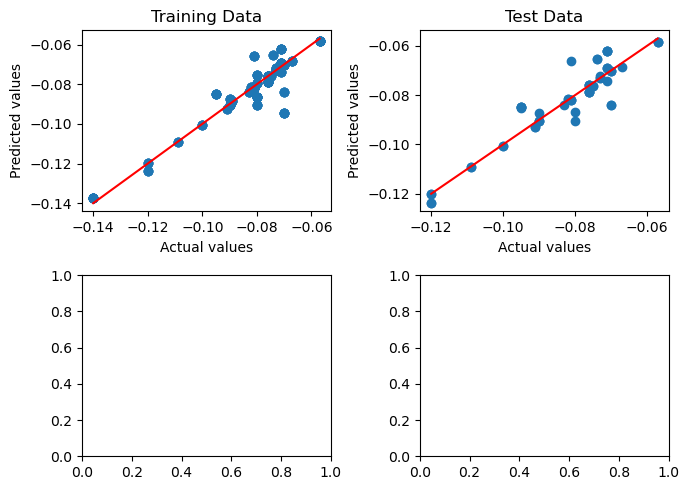

<Figure size 640x480 with 0 Axes>

[b] Epoch [1920/2000], Loss: 0.0000
Train R²:  0.89186
Test R² :  0.86013


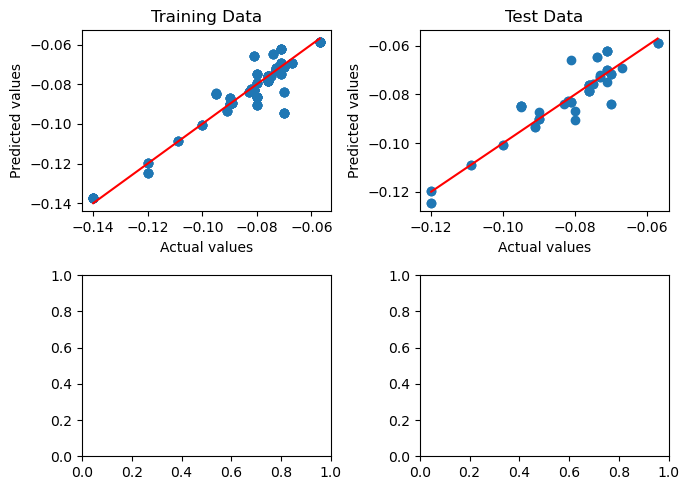

<Figure size 640x480 with 0 Axes>

[b] Epoch [1940/2000], Loss: 0.0000
Train R²:  0.89597
Test R² :  0.86709


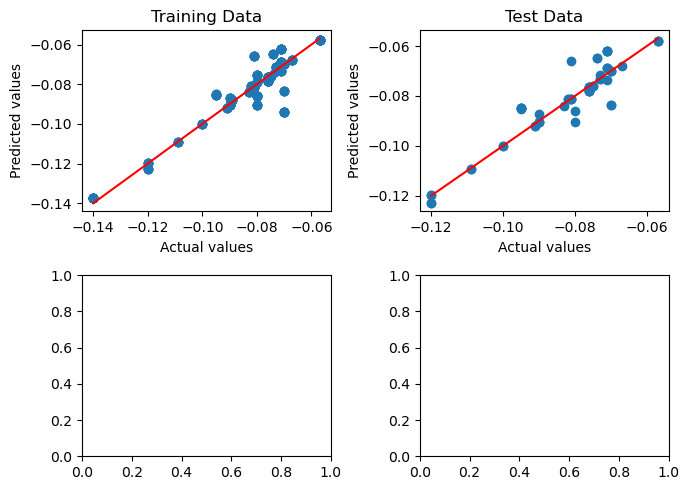

<Figure size 640x480 with 0 Axes>

[b] Epoch [1960/2000], Loss: 0.0000
Train R²:  0.89717
Test R² :  0.86558


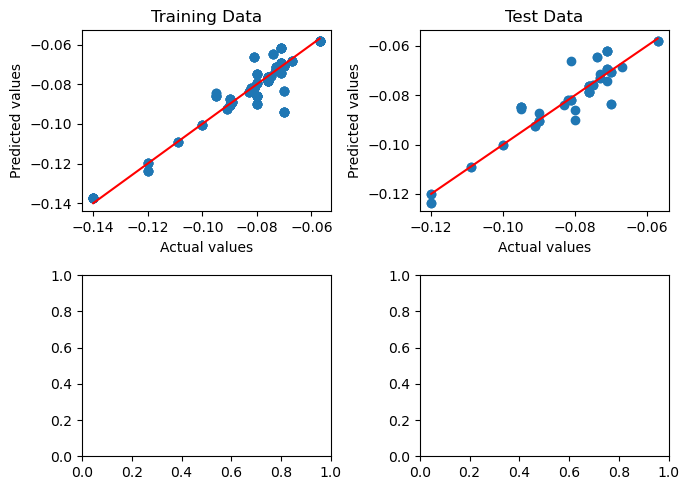

<Figure size 640x480 with 0 Axes>

[b] Epoch [1980/2000], Loss: 0.0000
Train R²:  0.89647
Test R² :  0.85517


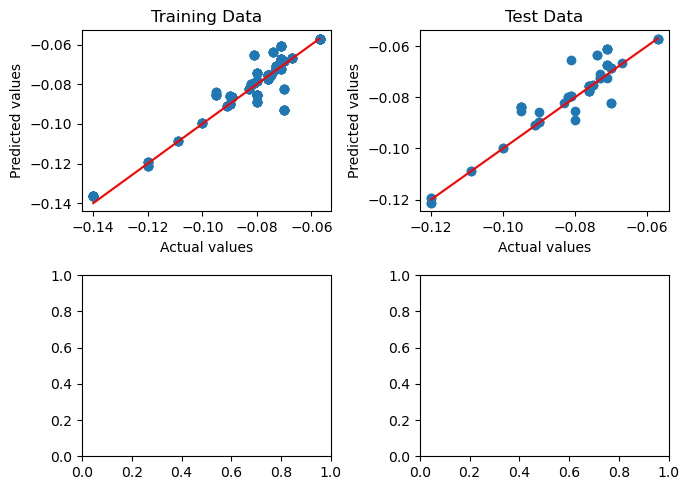

<Figure size 640x480 with 0 Axes>

[b] Epoch [2000/2000], Loss: 0.0000
Train R²:  0.90088
Test R² :  0.86642


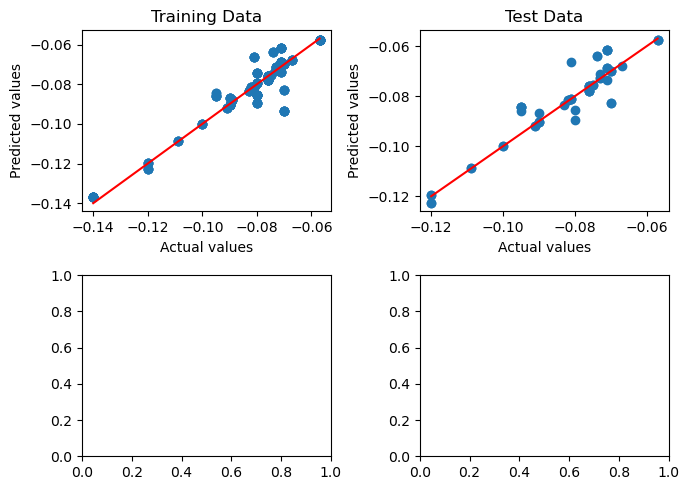

<Figure size 640x480 with 0 Axes>

In [13]:
GBR_NN(7)

[Epsilonf] Epoch [20/2000], Loss: 0.7269
Train R²:  -7.82395
Test R² :  -7.61568


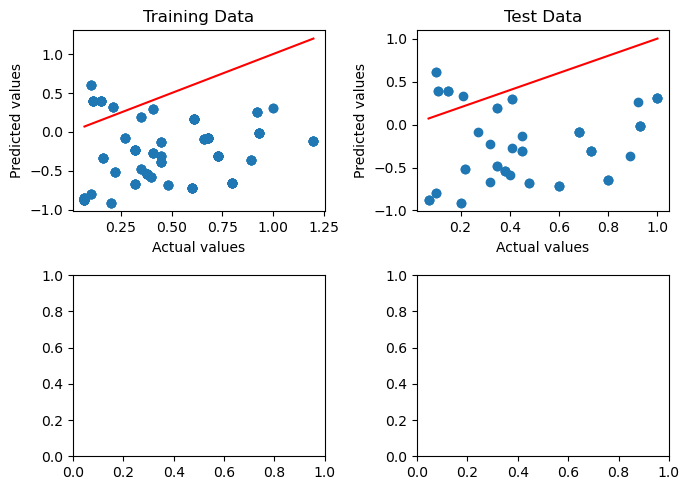

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [40/2000], Loss: 0.1423
Train R²:  -0.72713
Test R² :  -0.79325


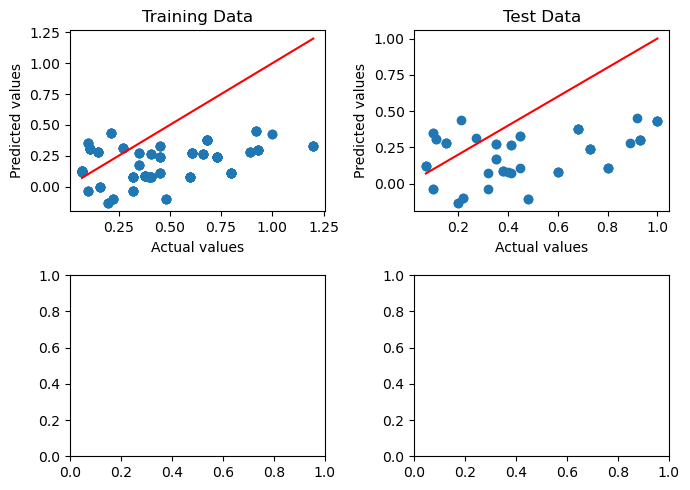

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [60/2000], Loss: 0.0666
Train R²:  0.19137
Test R² :  0.15792


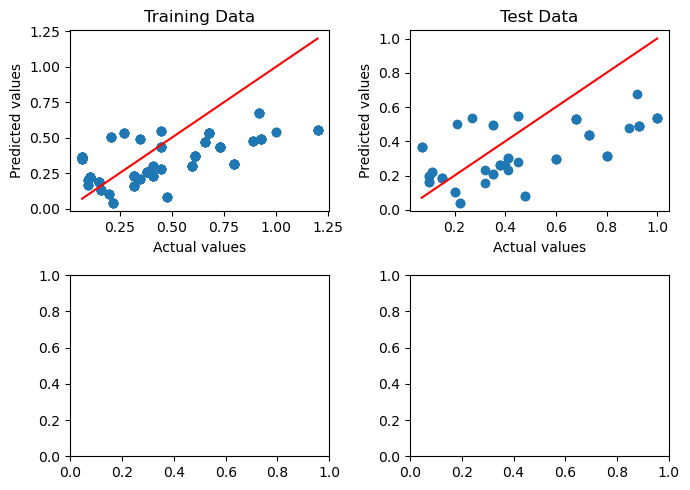

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [80/2000], Loss: 0.0506
Train R²:  0.38591
Test R² :  0.41293


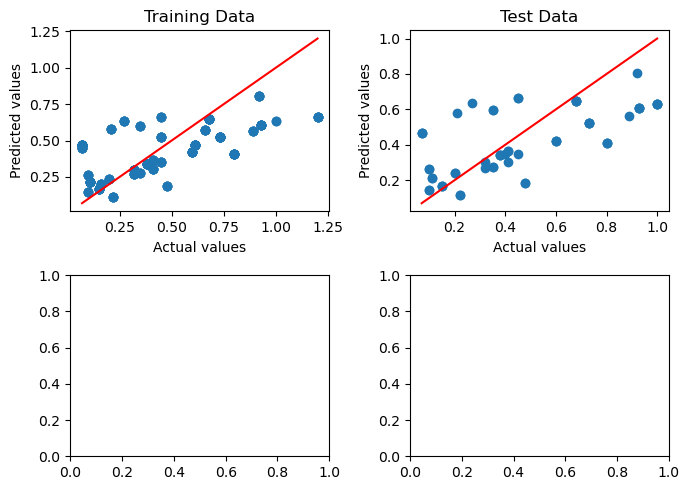

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [100/2000], Loss: 0.0452
Train R²:  0.45078
Test R² :  0.48167


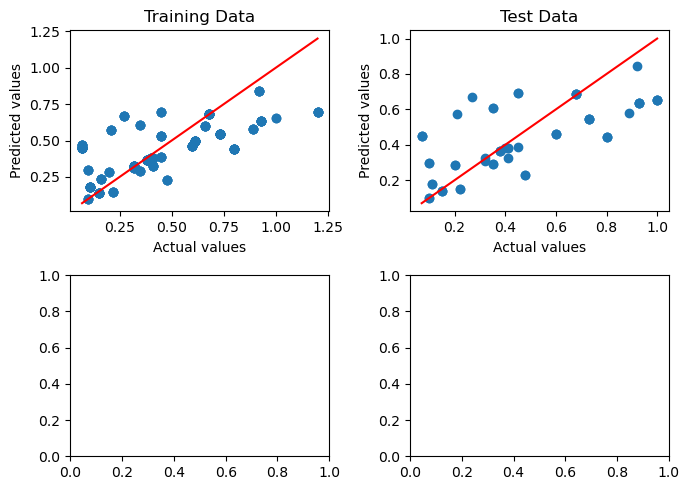

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [120/2000], Loss: 0.0410
Train R²:  0.50283
Test R² :  0.48623


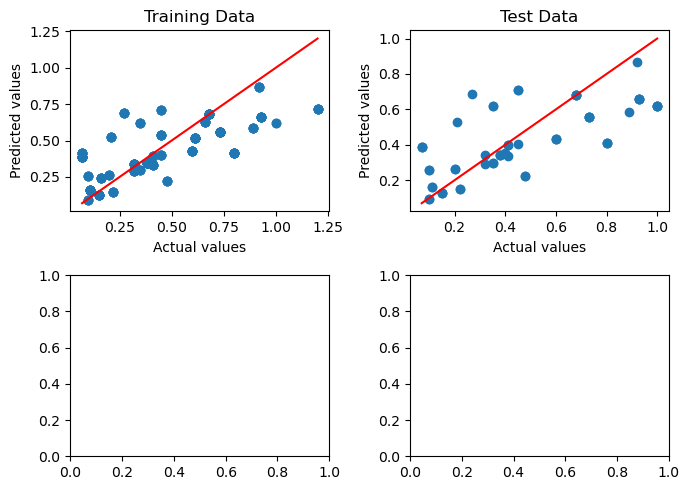

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [140/2000], Loss: 0.0374
Train R²:  0.54567
Test R² :  0.52114


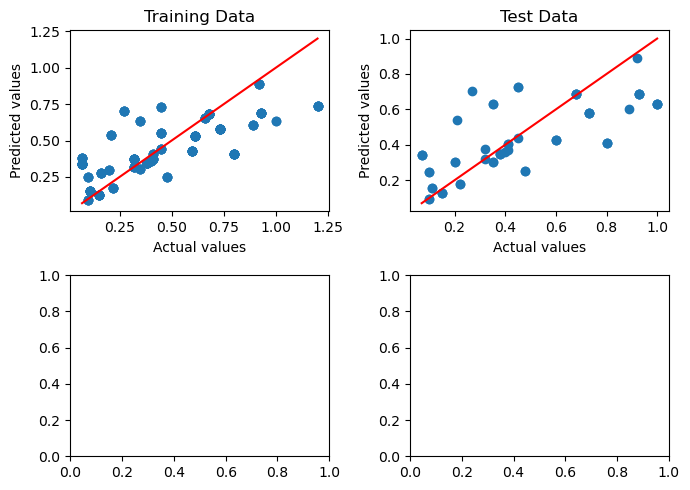

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [160/2000], Loss: 0.0357
Train R²:  0.56624
Test R² :  0.53662


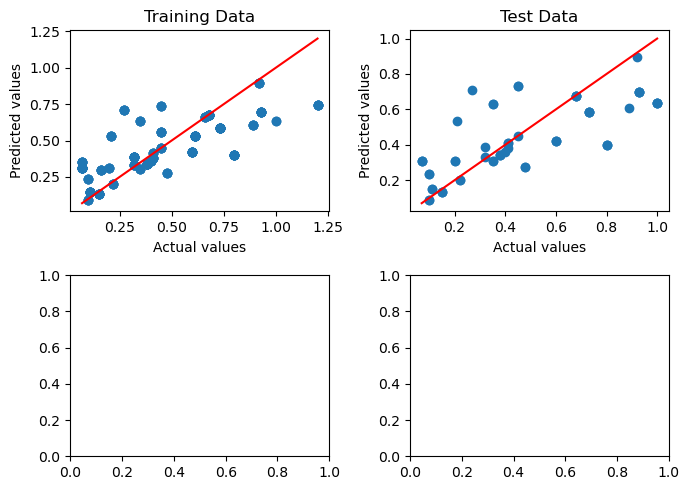

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [180/2000], Loss: 0.0345
Train R²:  0.58137
Test R² :  0.54405


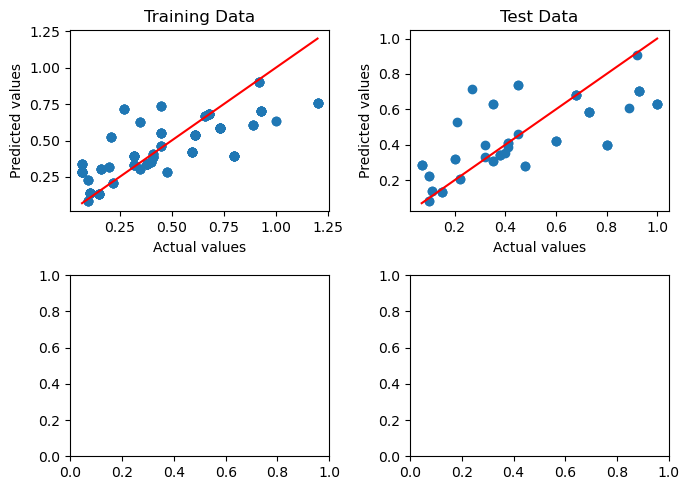

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [200/2000], Loss: 0.0335
Train R²:  0.59354
Test R² :  0.55678


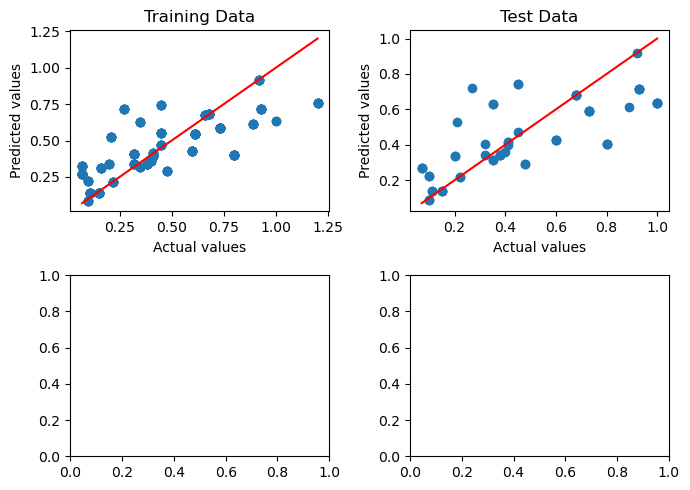

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [220/2000], Loss: 0.0327
Train R²:  0.60365
Test R² :  0.56203


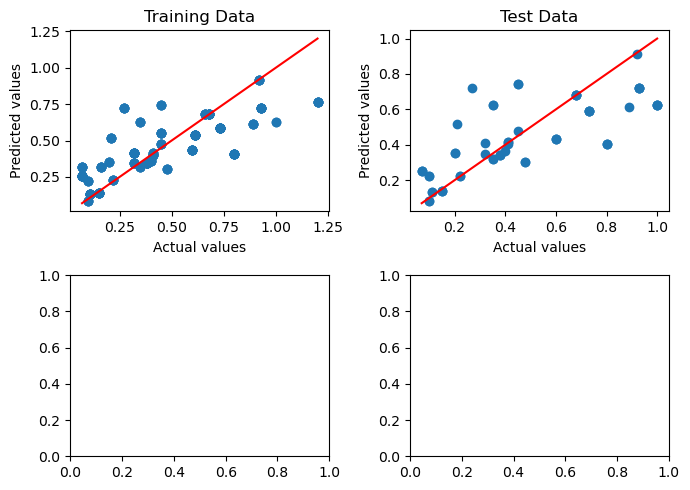

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [240/2000], Loss: 0.0319
Train R²:  0.61285
Test R² :  0.57003


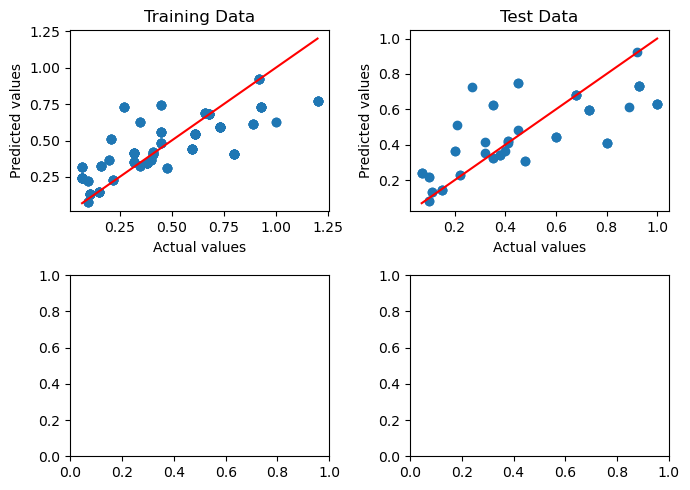

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [260/2000], Loss: 0.0312
Train R²:  0.62142
Test R² :  0.57319


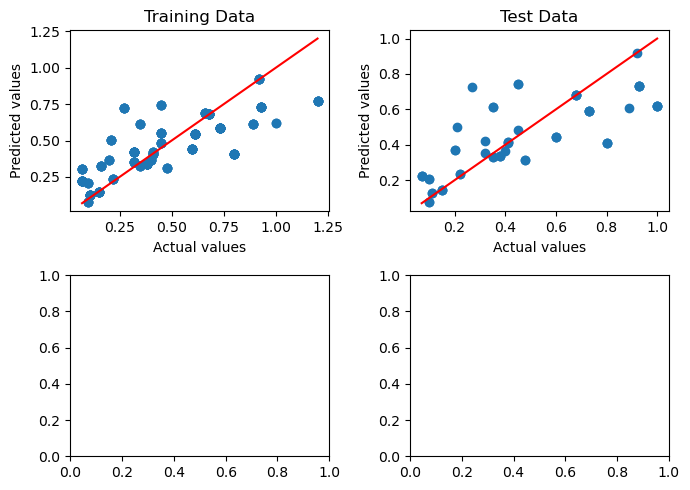

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [280/2000], Loss: 0.0305
Train R²:  0.62930
Test R² :  0.57957


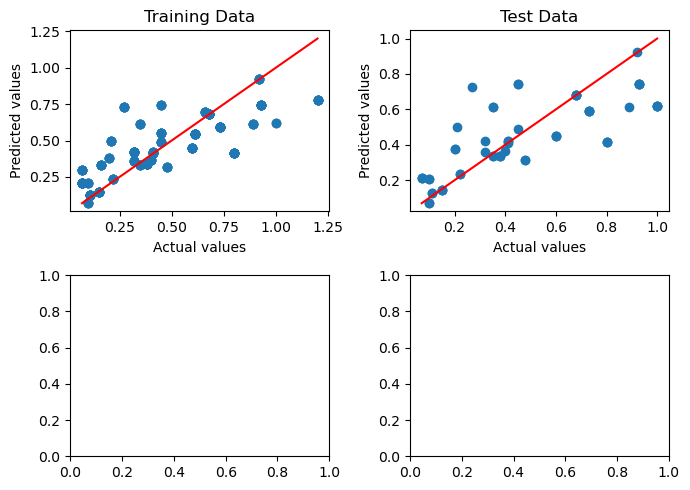

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [300/2000], Loss: 0.0299
Train R²:  0.63662
Test R² :  0.58536


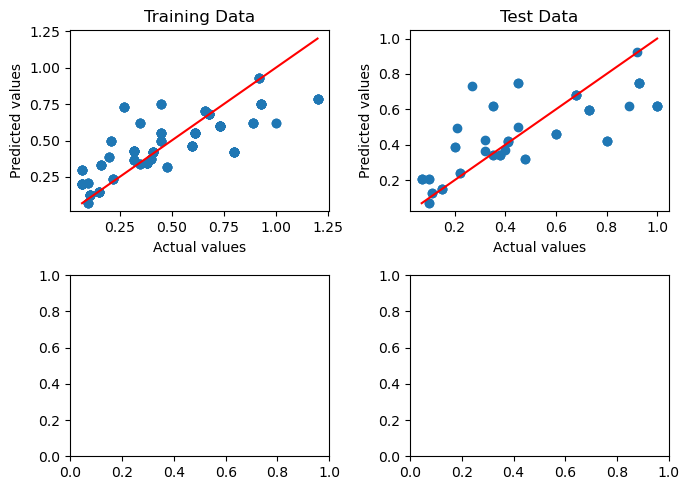

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [320/2000], Loss: 0.0294
Train R²:  0.64360
Test R² :  0.59150


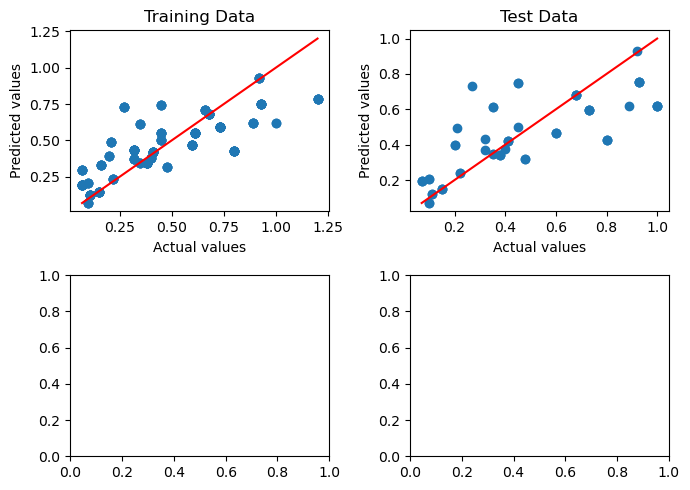

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [340/2000], Loss: 0.0288
Train R²:  0.65078
Test R² :  0.59508


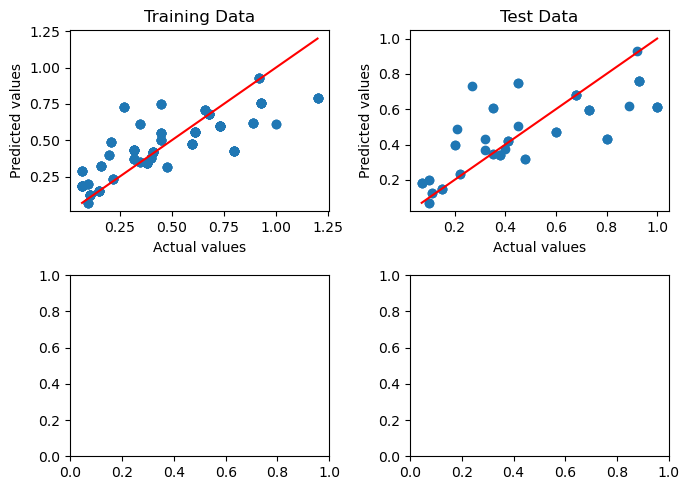

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [360/2000], Loss: 0.0281
Train R²:  0.65923
Test R² :  0.60177


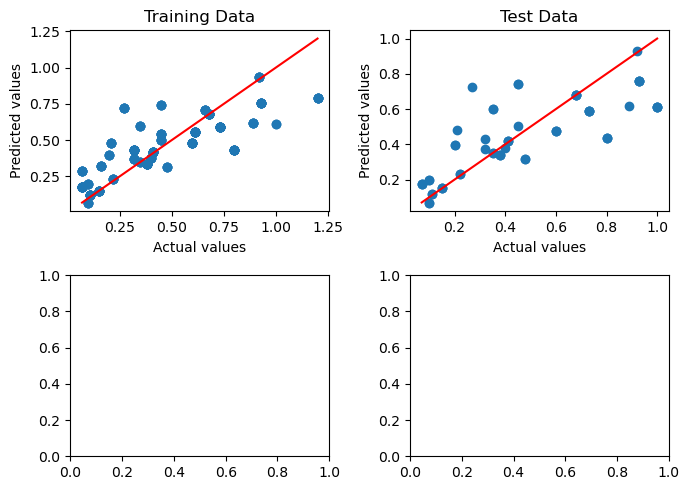

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [380/2000], Loss: 0.0268
Train R²:  0.67422
Test R² :  0.61428


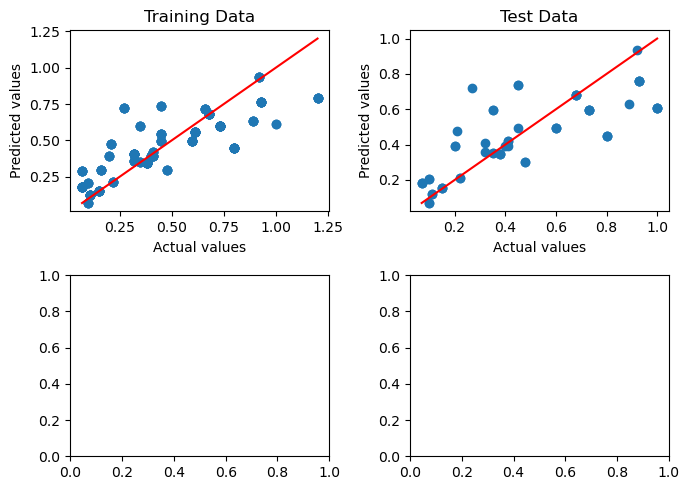

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [400/2000], Loss: 0.0256
Train R²:  0.68870
Test R² :  0.61566


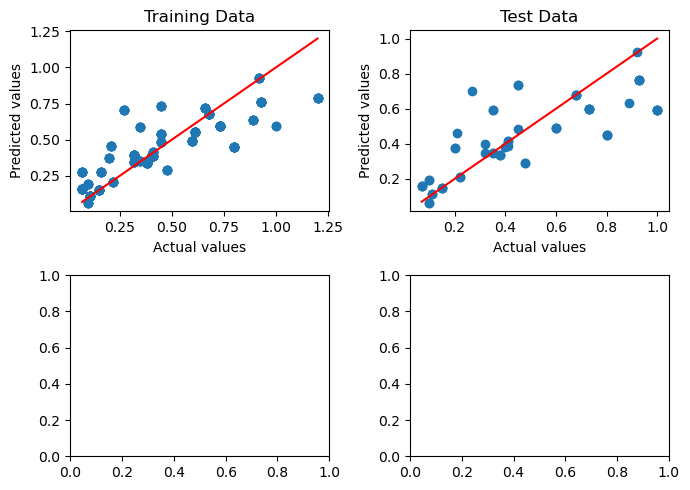

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [420/2000], Loss: 0.0245
Train R²:  0.70243
Test R² :  0.63338


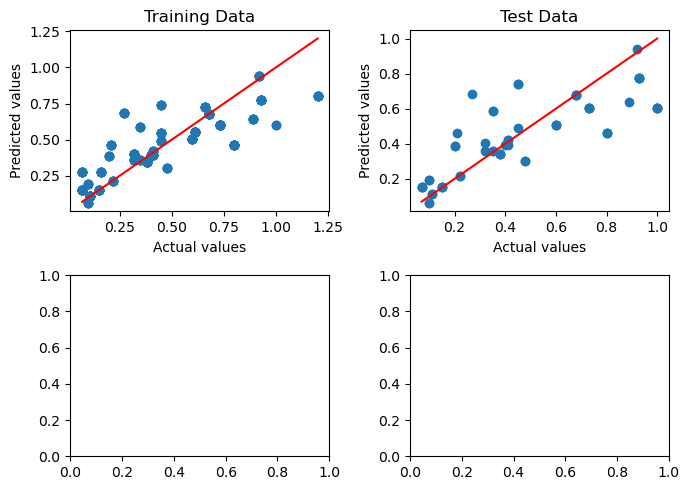

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [440/2000], Loss: 0.0237
Train R²:  0.71279
Test R² :  0.64206


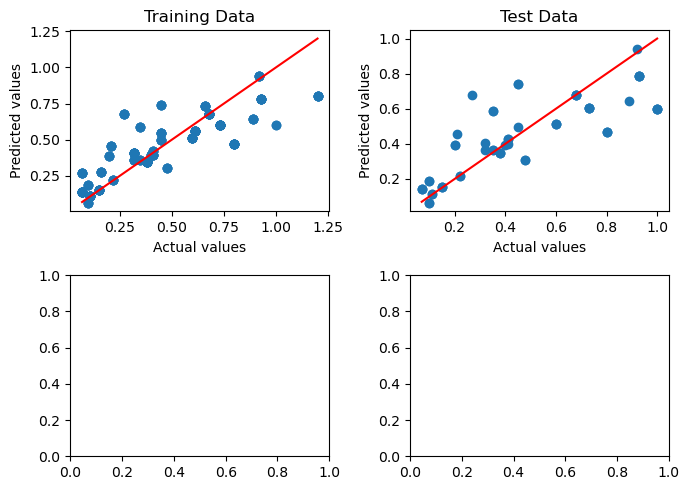

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [460/2000], Loss: 0.0229
Train R²:  0.72194
Test R² :  0.64942


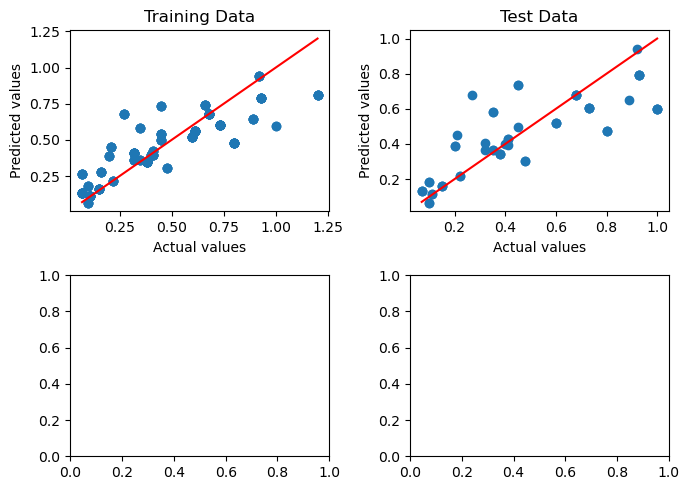

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [480/2000], Loss: 0.0221
Train R²:  0.73124
Test R² :  0.65725


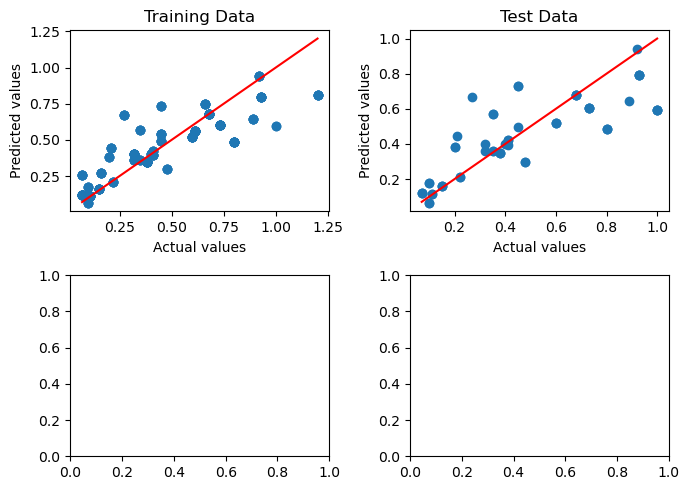

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [500/2000], Loss: 0.0215
Train R²:  0.73906
Test R² :  0.66364


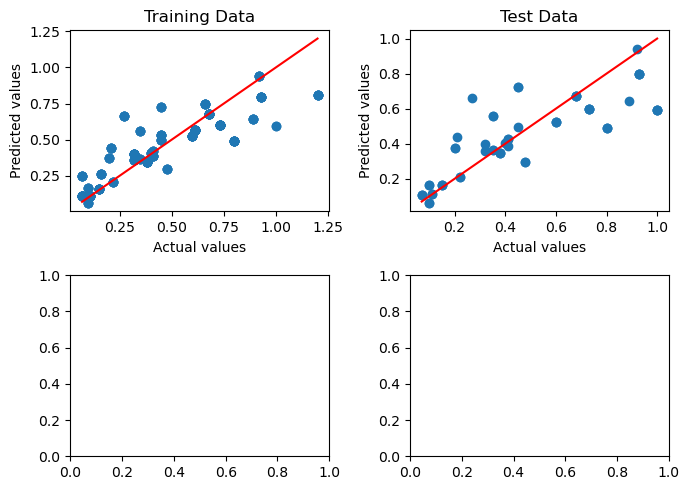

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [520/2000], Loss: 0.0208
Train R²:  0.74789
Test R² :  0.67090


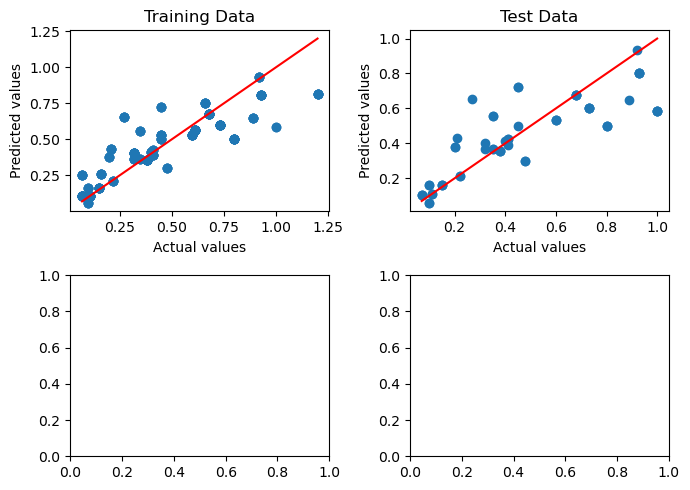

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [540/2000], Loss: 0.0200
Train R²:  0.75739
Test R² :  0.67922


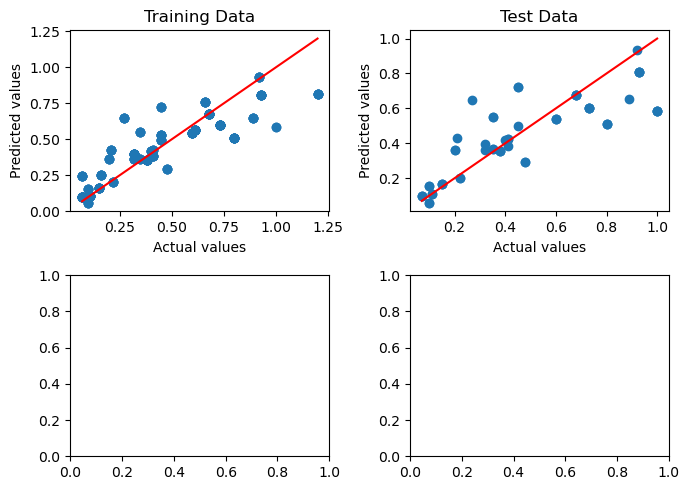

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [560/2000], Loss: 0.0193
Train R²:  0.76624
Test R² :  0.68986


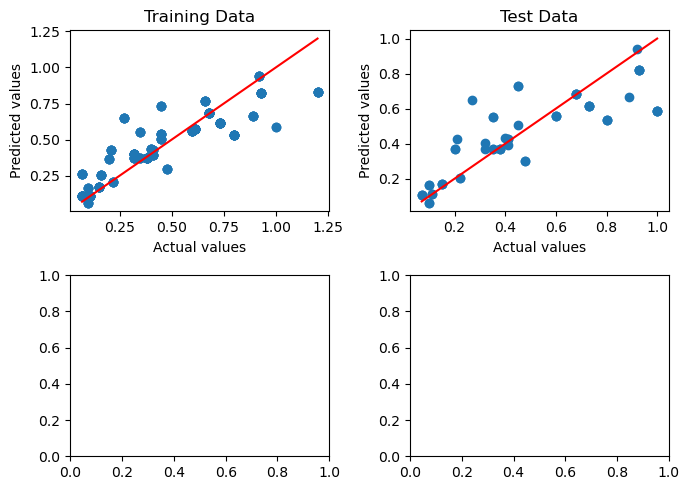

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [580/2000], Loss: 0.0186
Train R²:  0.77362
Test R² :  0.69719


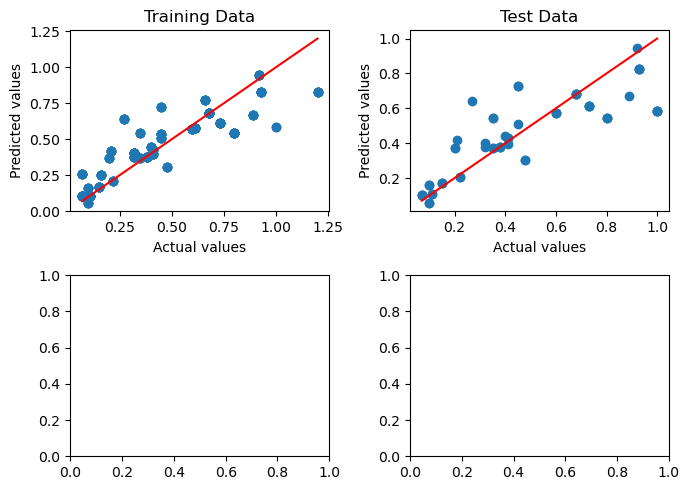

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [600/2000], Loss: 0.0180
Train R²:  0.78124
Test R² :  0.70151


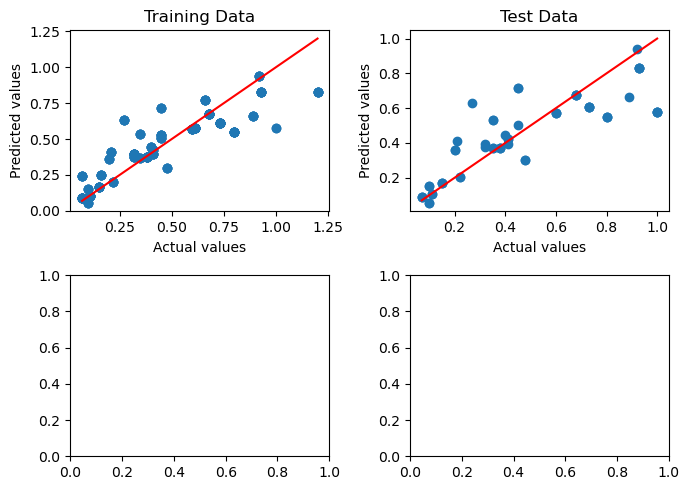

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [620/2000], Loss: 0.0174
Train R²:  0.78844
Test R² :  0.70379


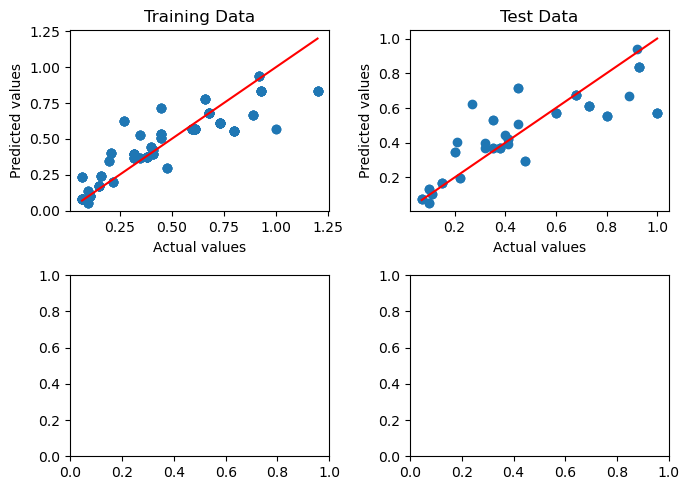

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [640/2000], Loss: 0.0169
Train R²:  0.79496
Test R² :  0.71610


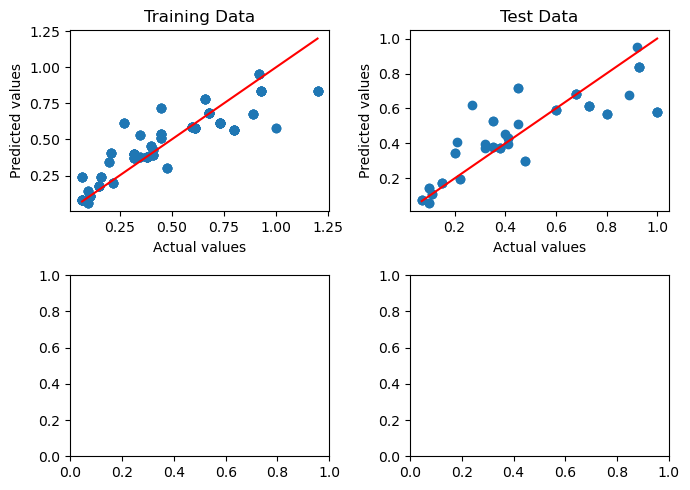

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [660/2000], Loss: 0.0164
Train R²:  0.80151
Test R² :  0.71832


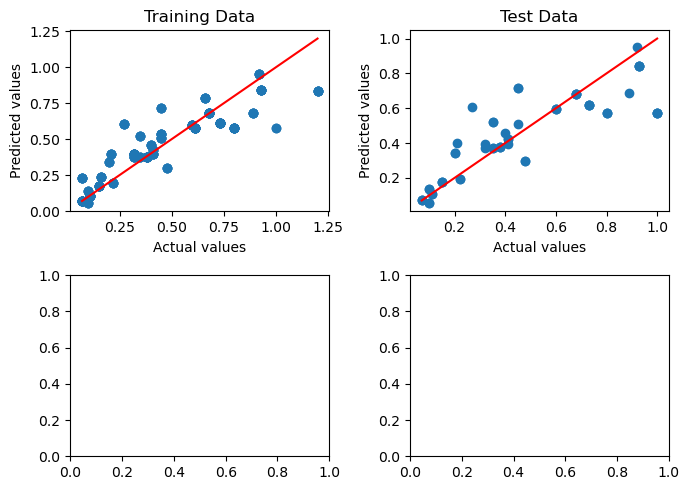

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [680/2000], Loss: 0.0158
Train R²:  0.80774
Test R² :  0.72524


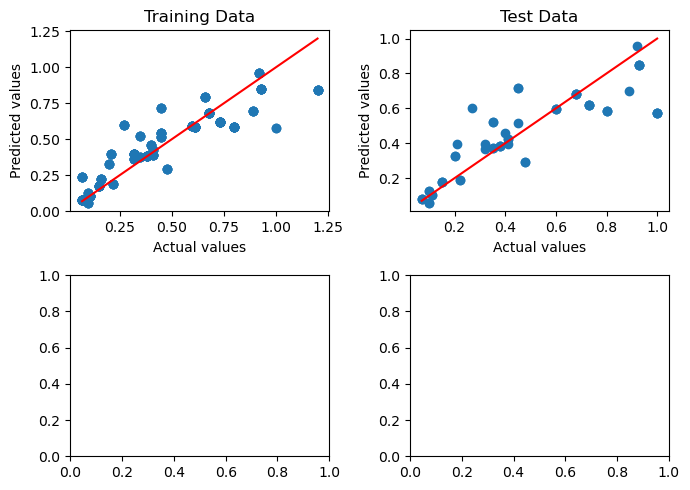

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [700/2000], Loss: 0.0154
Train R²:  0.81362
Test R² :  0.73184


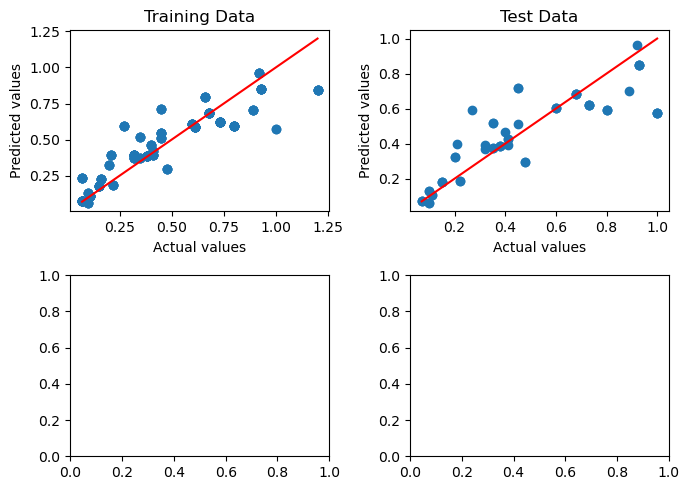

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [720/2000], Loss: 0.0148
Train R²:  0.81979
Test R² :  0.73390


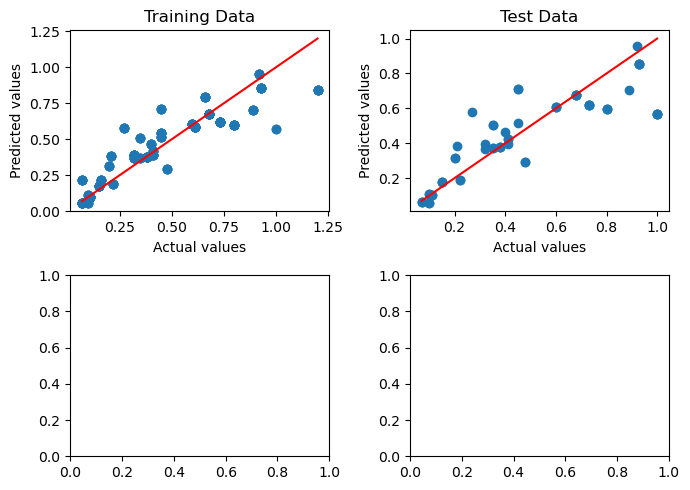

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [740/2000], Loss: 0.0144
Train R²:  0.82507
Test R² :  0.74223


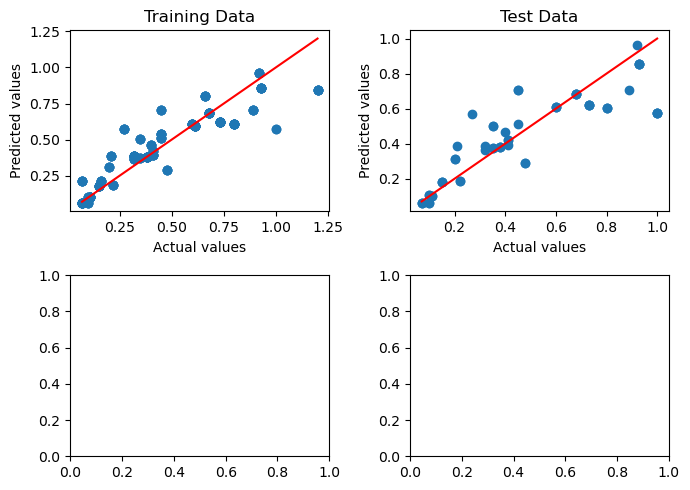

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [760/2000], Loss: 0.0140
Train R²:  0.83028
Test R² :  0.74223


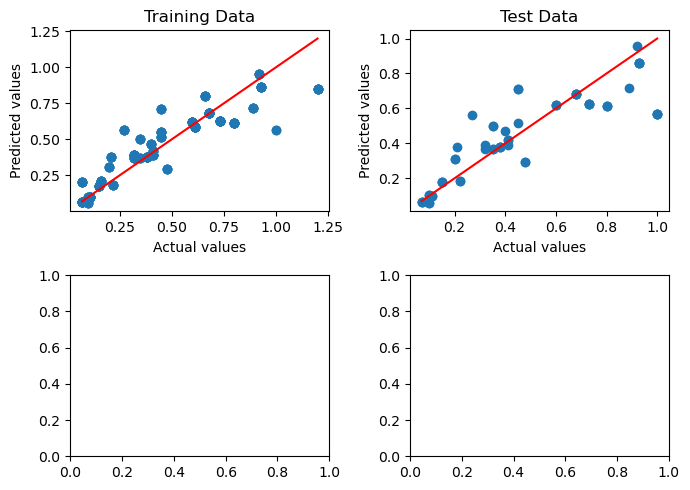

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [780/2000], Loss: 0.0136
Train R²:  0.83462
Test R² :  0.74658


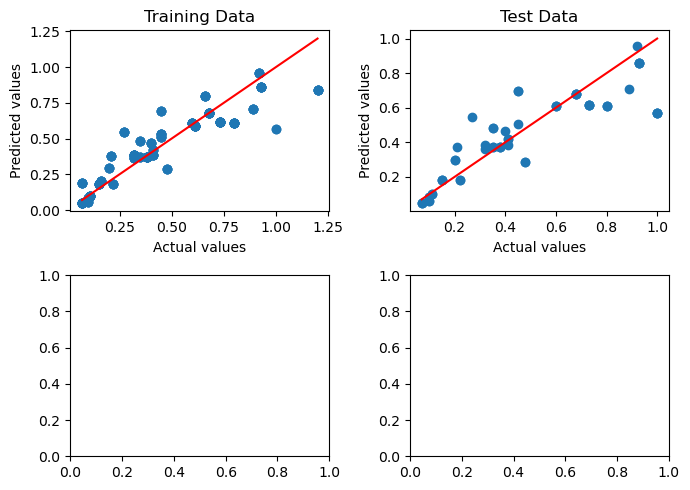

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [800/2000], Loss: 0.0132
Train R²:  0.83919
Test R² :  0.74889


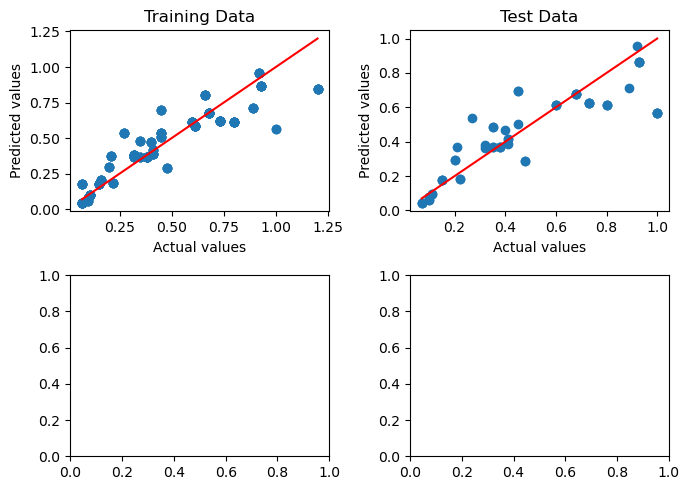

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [820/2000], Loss: 0.0127
Train R²:  0.84557
Test R² :  0.75873


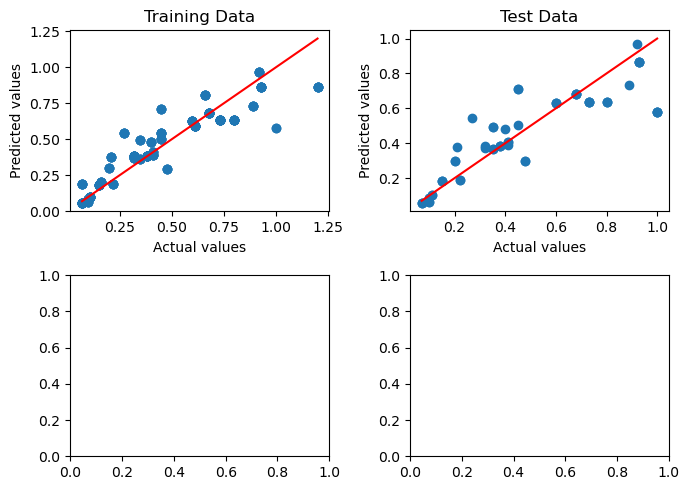

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [840/2000], Loss: 0.0123
Train R²:  0.85035
Test R² :  0.76219


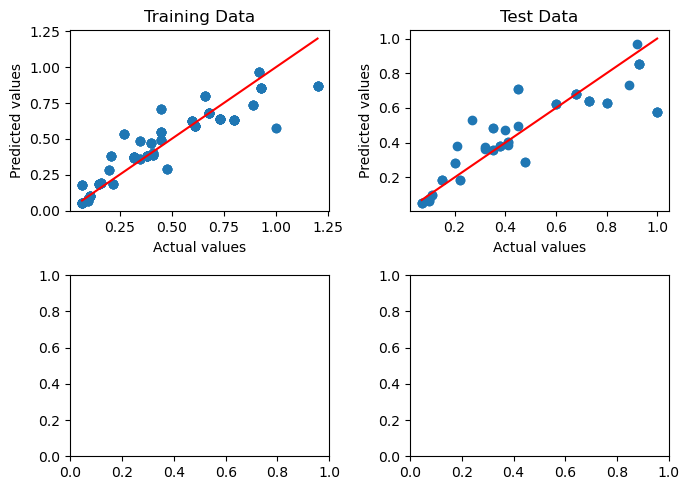

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [860/2000], Loss: 0.0120
Train R²:  0.85487
Test R² :  0.76679


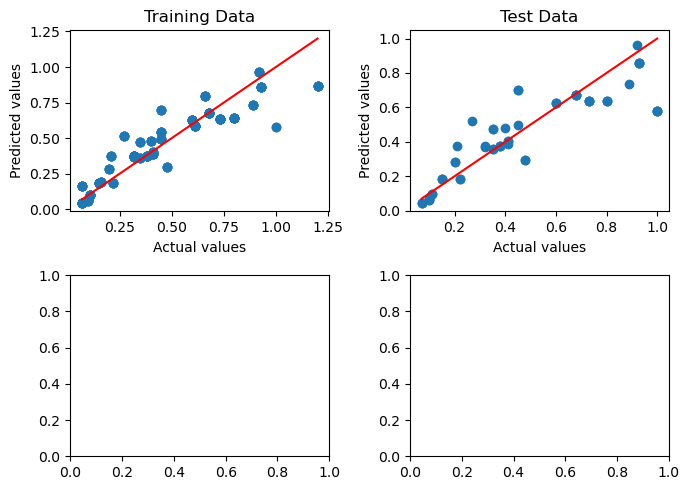

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [880/2000], Loss: 0.0116
Train R²:  0.85929
Test R² :  0.77542


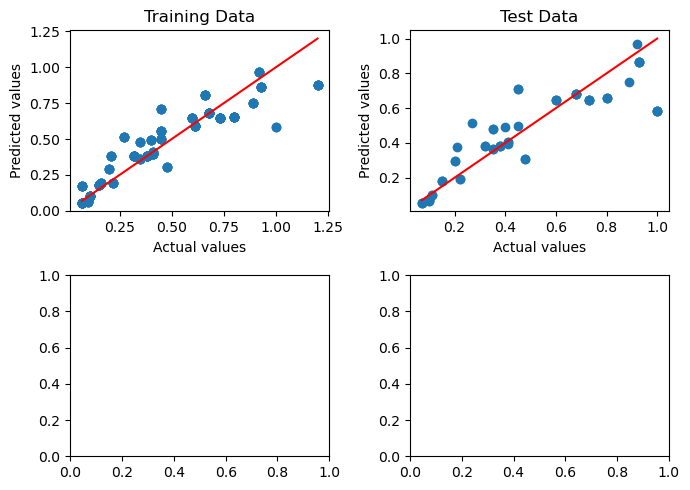

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [900/2000], Loss: 0.0113
Train R²:  0.86318
Test R² :  0.77885


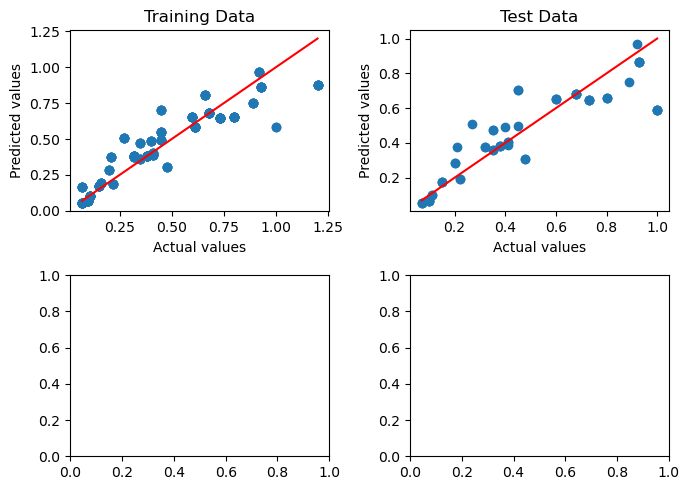

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [920/2000], Loss: 0.0110
Train R²:  0.86664
Test R² :  0.78400


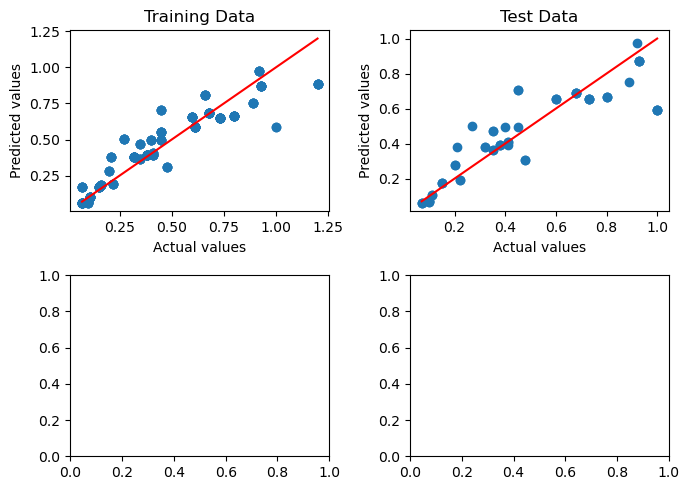

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [940/2000], Loss: 0.0107
Train R²:  0.86981
Test R² :  0.78385


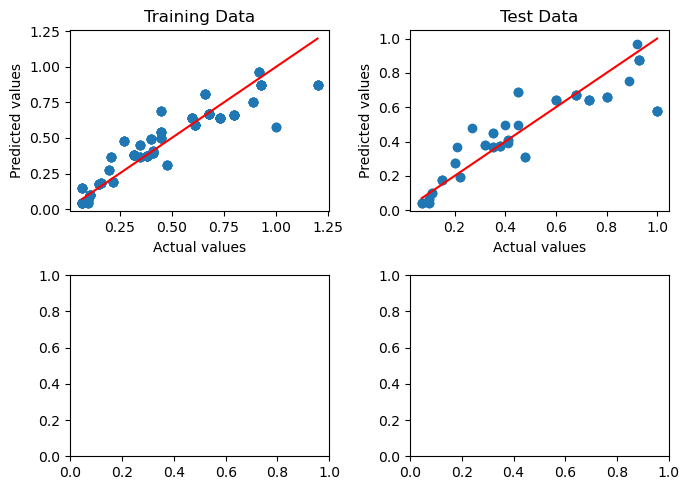

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [960/2000], Loss: 0.0104
Train R²:  0.87407
Test R² :  0.78626


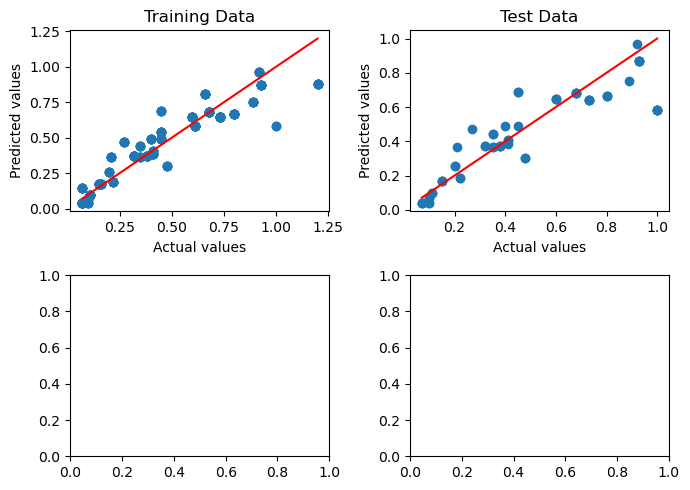

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [980/2000], Loss: 0.0102
Train R²:  0.87606
Test R² :  0.78947


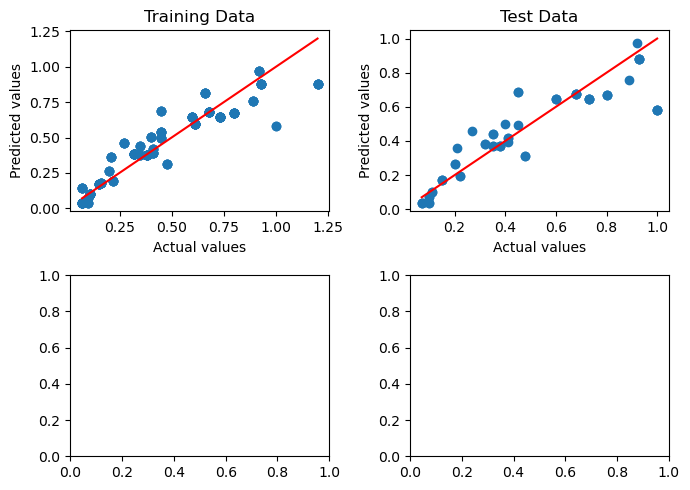

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1000/2000], Loss: 0.0100
Train R²:  0.87834
Test R² :  0.78712


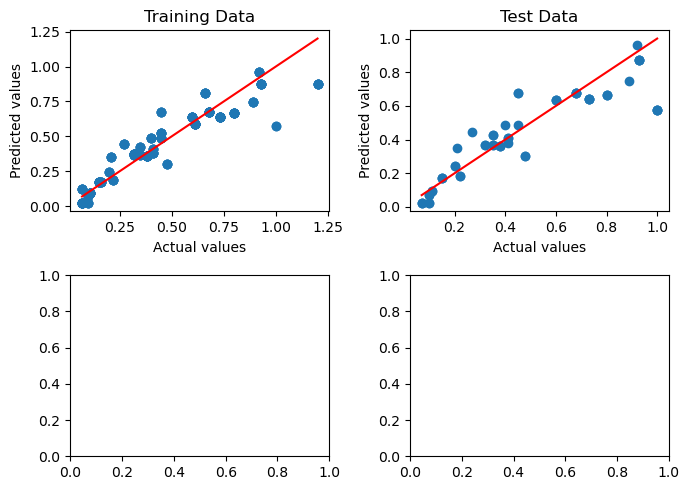

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1020/2000], Loss: 0.0096
Train R²:  0.88349
Test R² :  0.79643


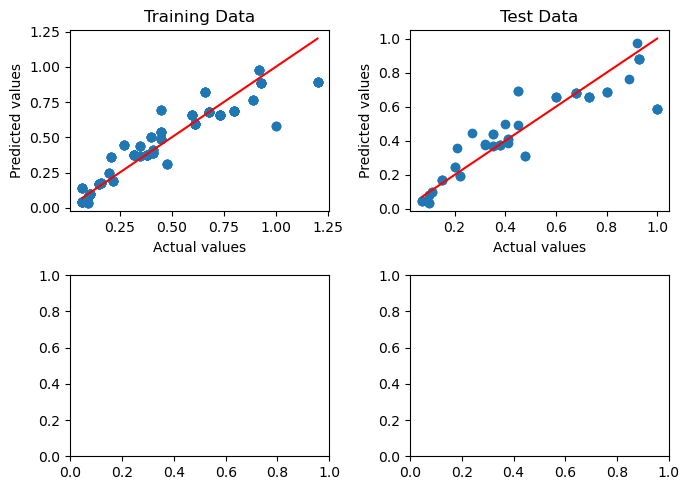

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1040/2000], Loss: 0.0094
Train R²:  0.88554
Test R² :  0.79728


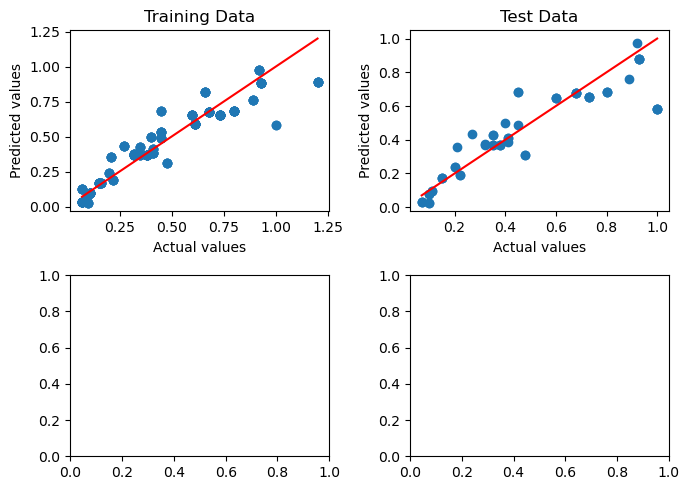

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1060/2000], Loss: 0.0092
Train R²:  0.88831
Test R² :  0.80212


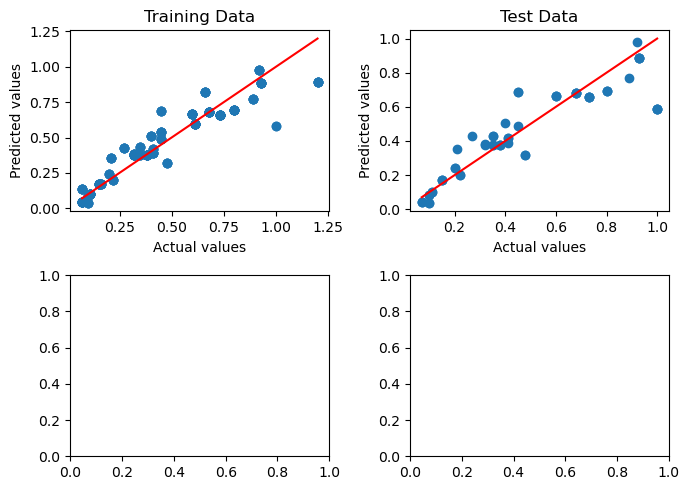

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1080/2000], Loss: 0.0094
Train R²:  0.88635
Test R² :  0.80178


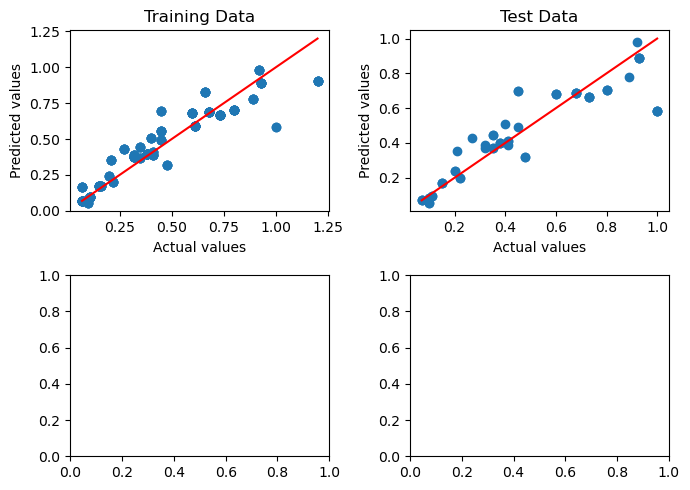

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1100/2000], Loss: 0.0089
Train R²:  0.89170
Test R² :  0.80084


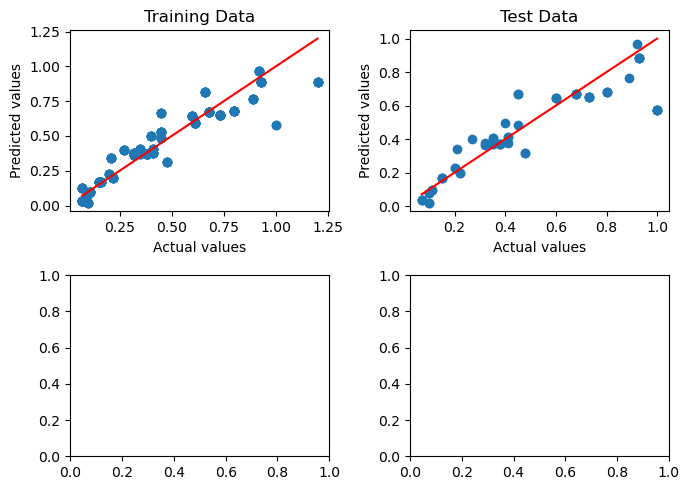

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1120/2000], Loss: 0.0087
Train R²:  0.89424
Test R² :  0.80615


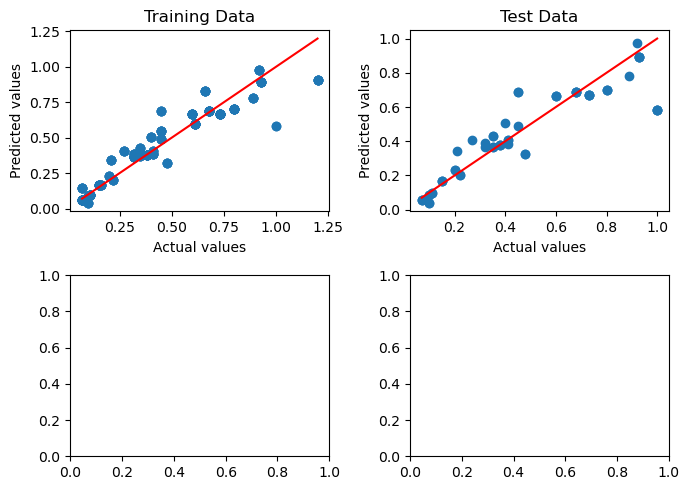

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1140/2000], Loss: 0.0084
Train R²:  0.89761
Test R² :  0.80766


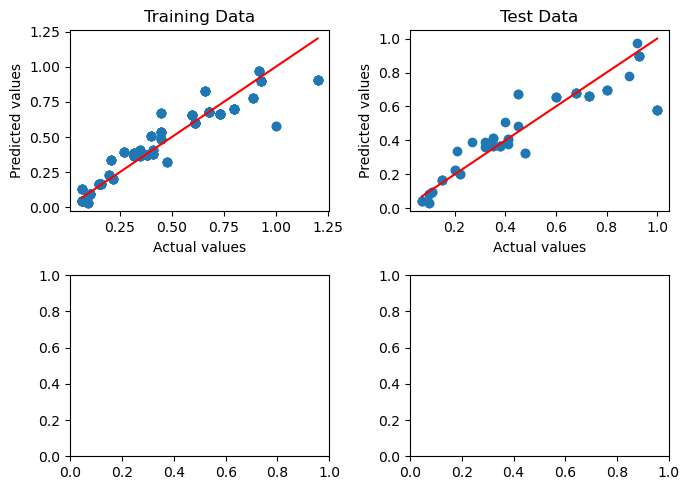

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1160/2000], Loss: 0.0085
Train R²:  0.89713
Test R² :  0.81137


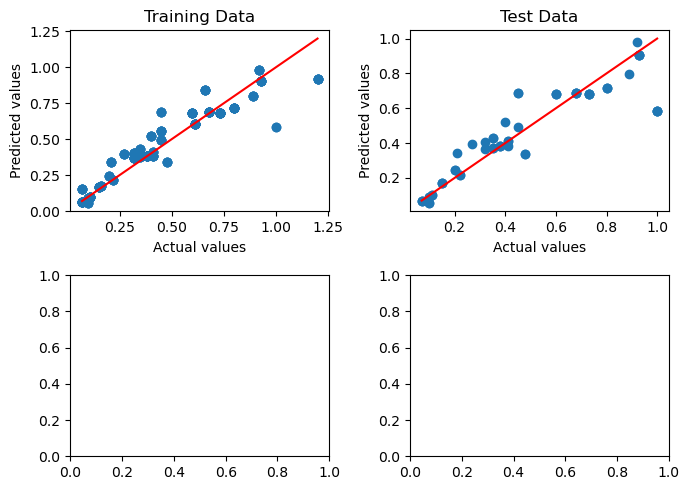

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1180/2000], Loss: 0.0083
Train R²:  0.89985
Test R² :  0.80862


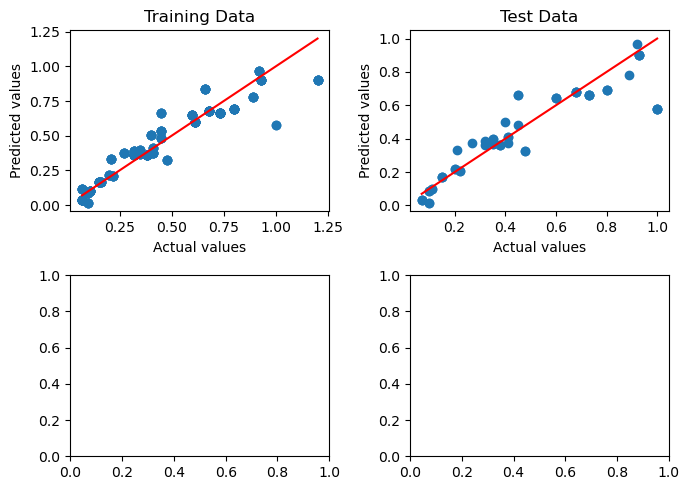

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1200/2000], Loss: 0.0081
Train R²:  0.90190
Test R² :  0.81238


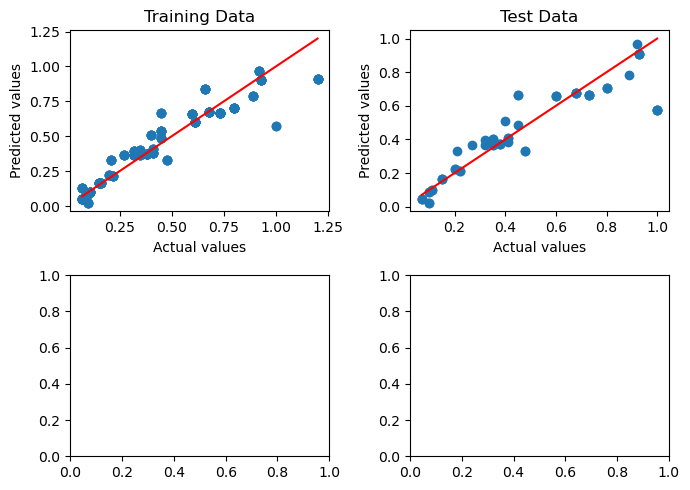

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1220/2000], Loss: 0.0079
Train R²:  0.90394
Test R² :  0.81021


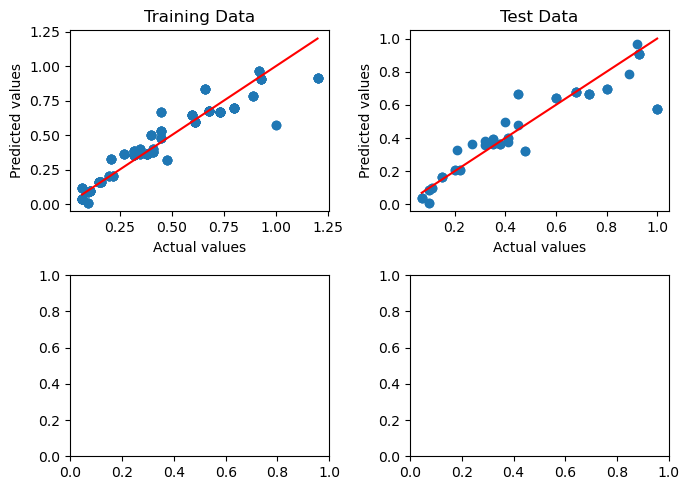

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1240/2000], Loss: 0.0078
Train R²:  0.90579
Test R² :  0.81789


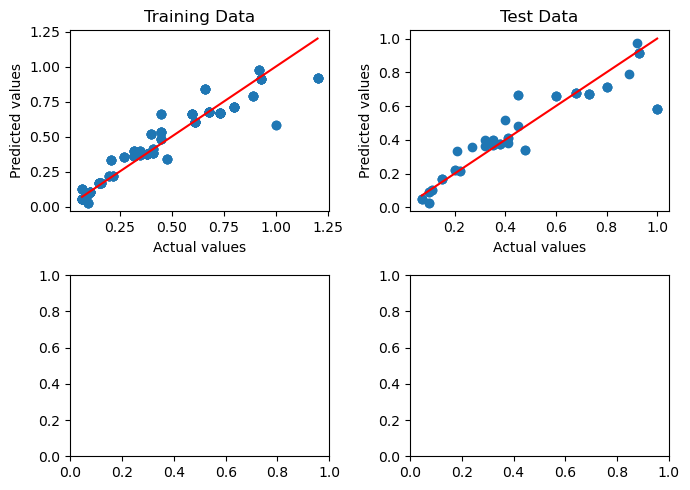

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1260/2000], Loss: 0.0076
Train R²:  0.90752
Test R² :  0.82031


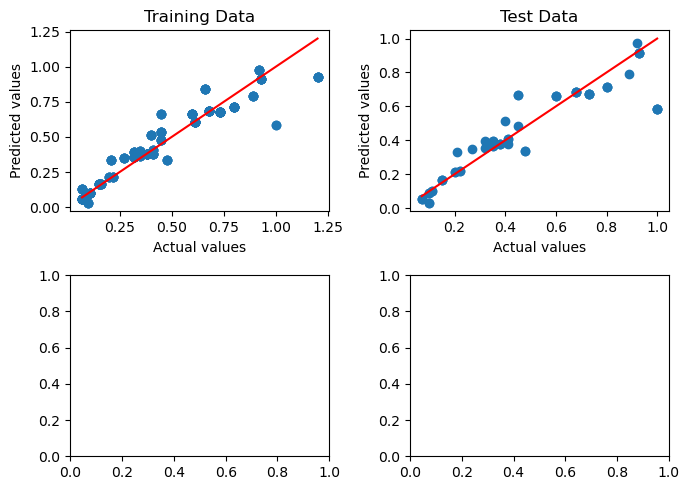

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1280/2000], Loss: 0.0075
Train R²:  0.90928
Test R² :  0.82119


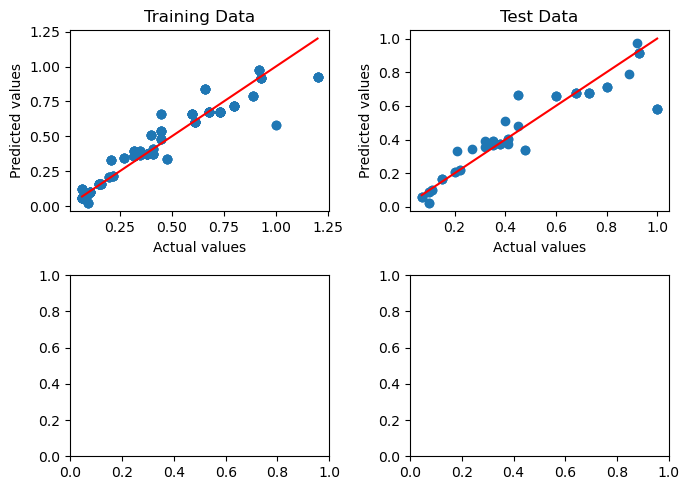

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1300/2000], Loss: 0.0075
Train R²:  0.90935
Test R² :  0.82381


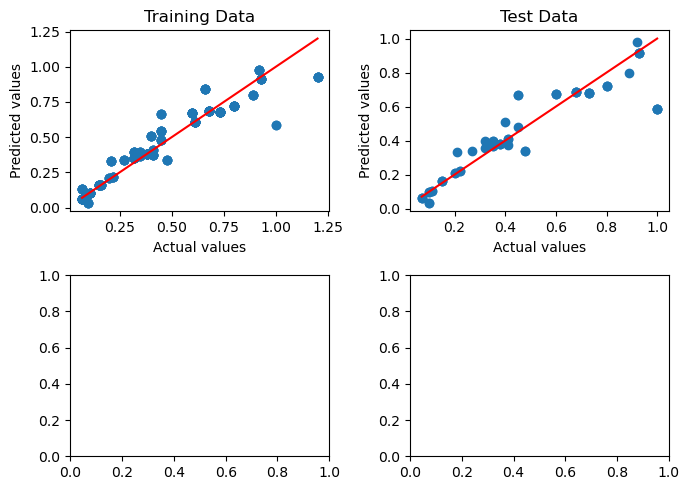

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1320/2000], Loss: 0.0074
Train R²:  0.91035
Test R² :  0.82138


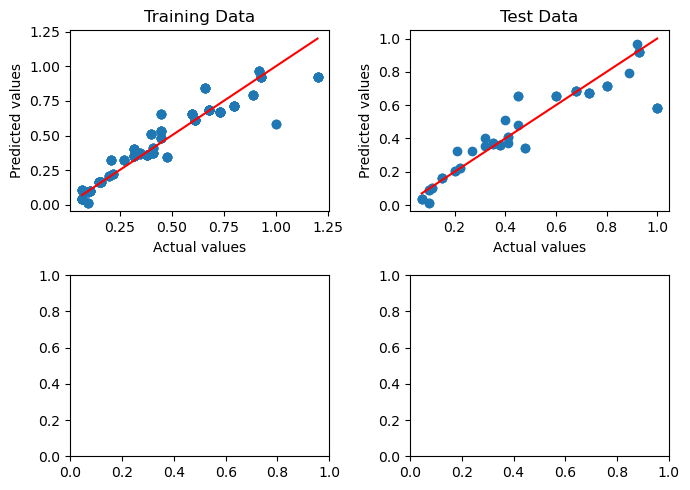

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1340/2000], Loss: 0.0072
Train R²:  0.91301
Test R² :  0.82736


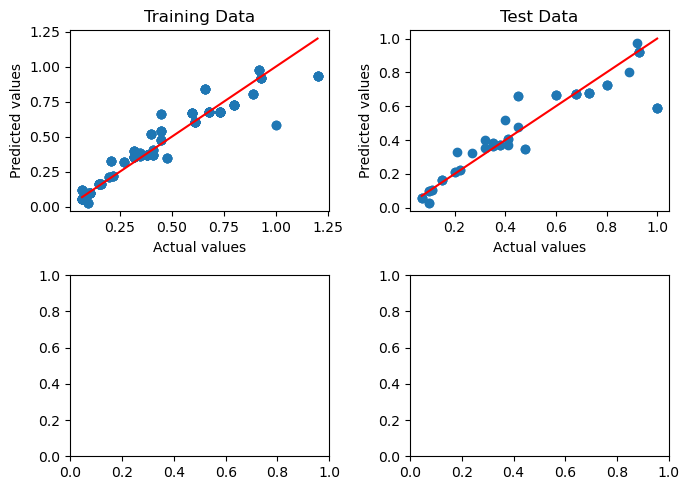

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1360/2000], Loss: 0.0071
Train R²:  0.91397
Test R² :  0.82242


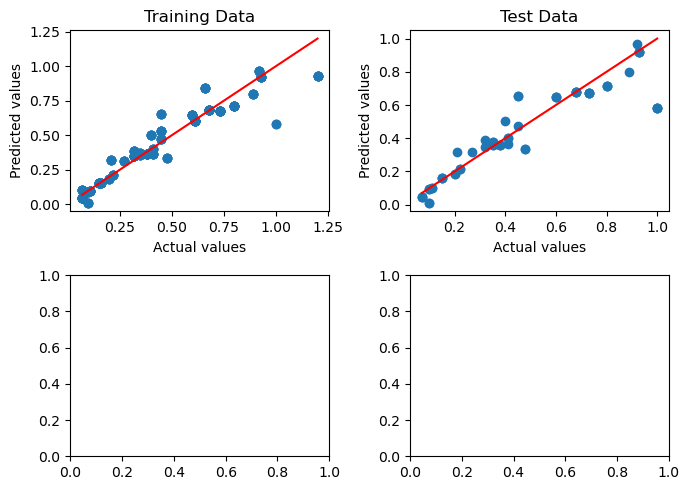

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1380/2000], Loss: 0.0070
Train R²:  0.91480
Test R² :  0.82499


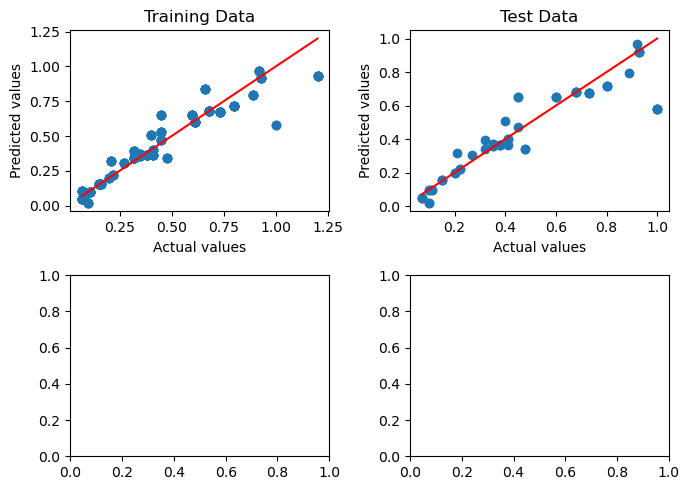

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1400/2000], Loss: 0.0069
Train R²:  0.91581
Test R² :  0.83002


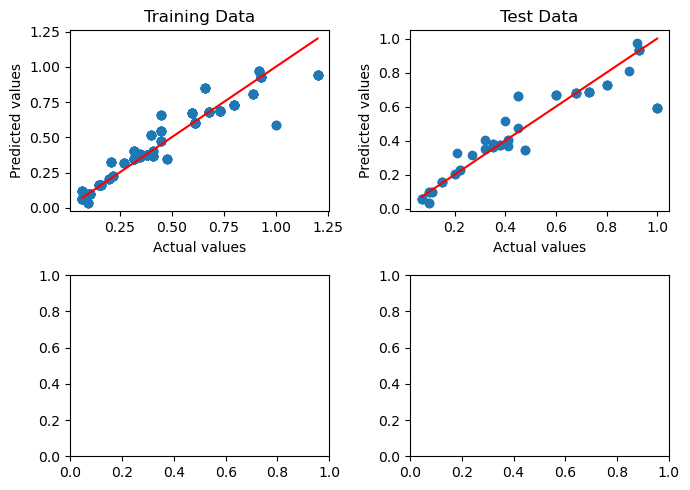

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1420/2000], Loss: 0.0070
Train R²:  0.91534
Test R² :  0.82646


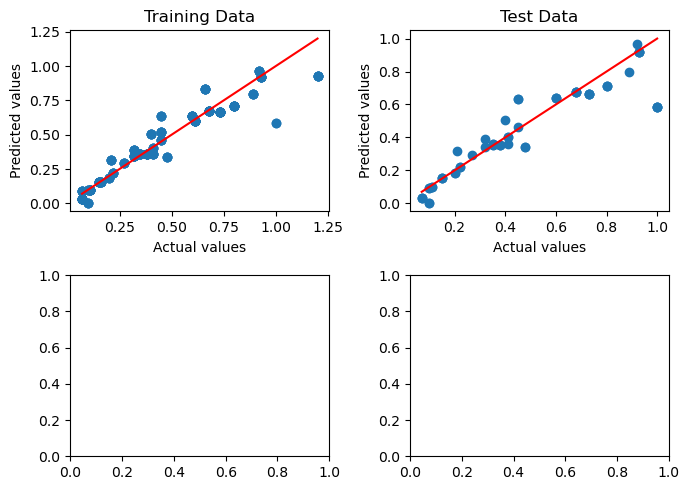

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1440/2000], Loss: 0.0067
Train R²:  0.91811
Test R² :  0.83124


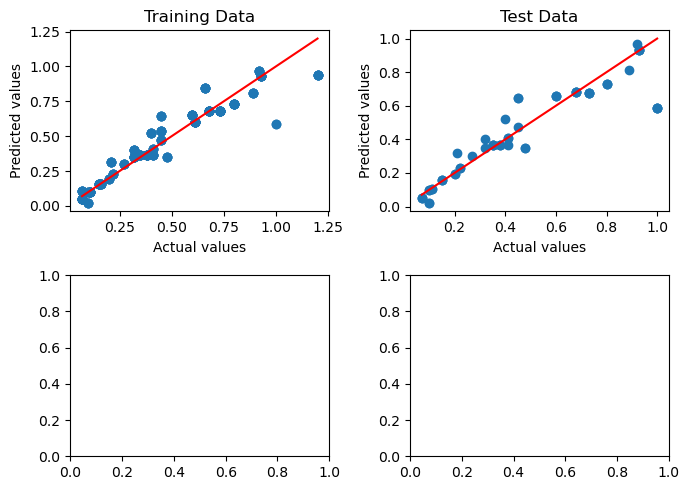

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1460/2000], Loss: 0.0067
Train R²:  0.91888
Test R² :  0.83484


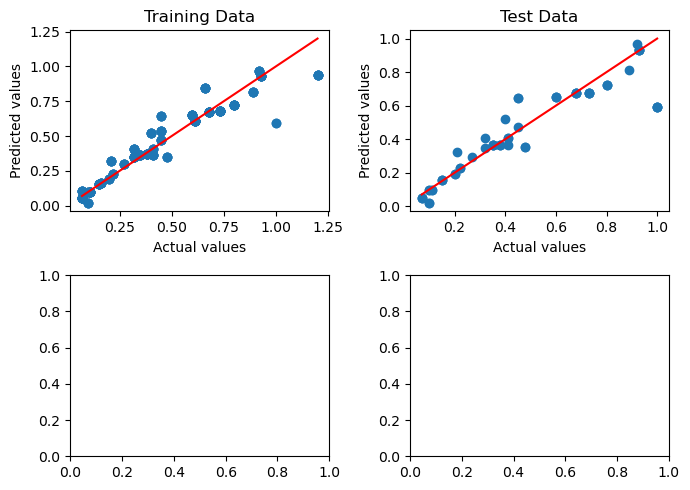

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1480/2000], Loss: 0.0067
Train R²:  0.91893
Test R² :  0.83881


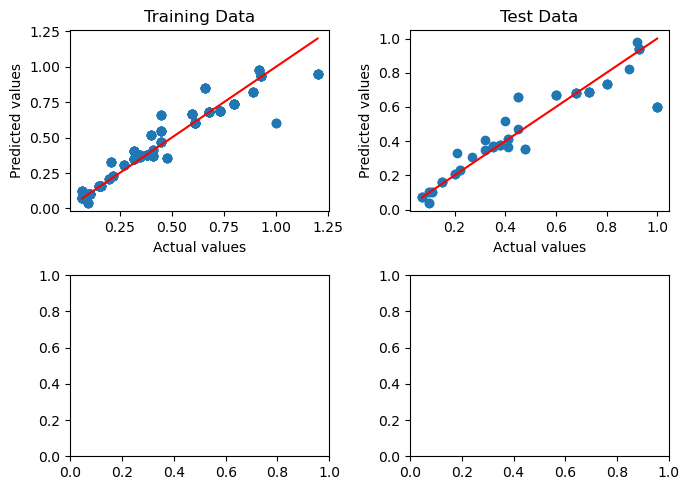

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1500/2000], Loss: 0.0070
Train R²:  0.91503
Test R² :  0.82182


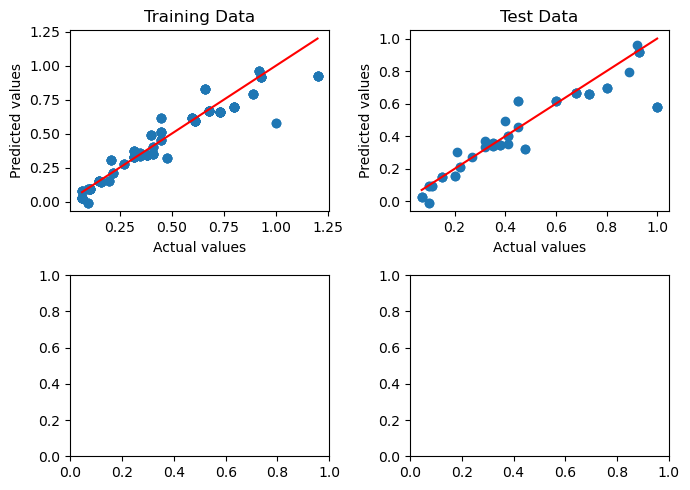

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1520/2000], Loss: 0.0065
Train R²:  0.92147
Test R² :  0.83931


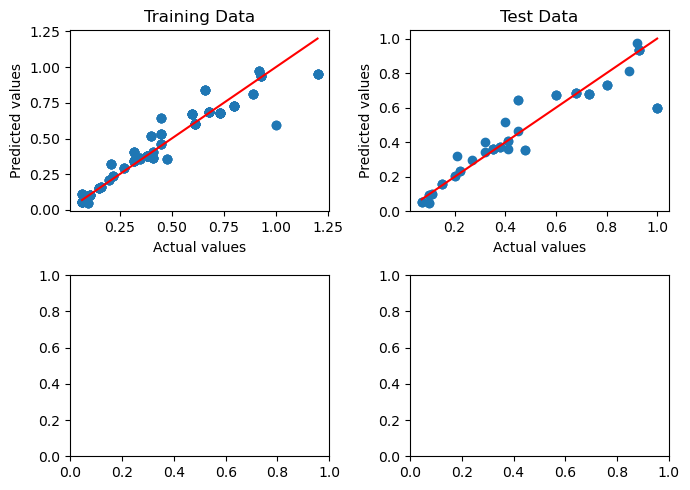

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1540/2000], Loss: 0.0064
Train R²:  0.92197
Test R² :  0.84271


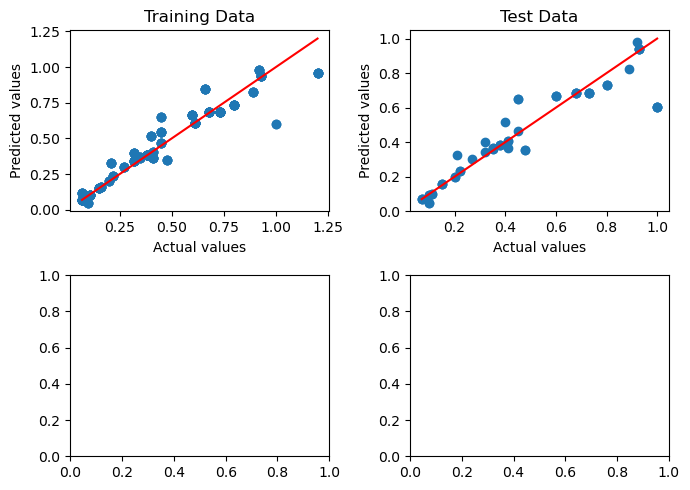

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1560/2000], Loss: 0.0070
Train R²:  0.91552
Test R² :  0.82373


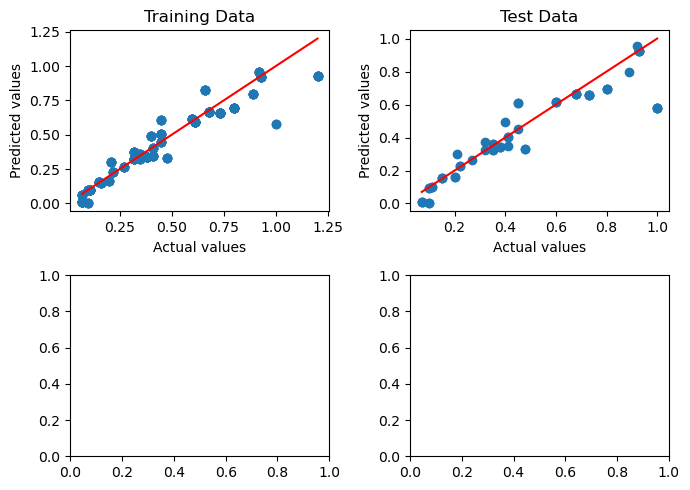

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1580/2000], Loss: 0.0062
Train R²:  0.92491
Test R² :  0.84239


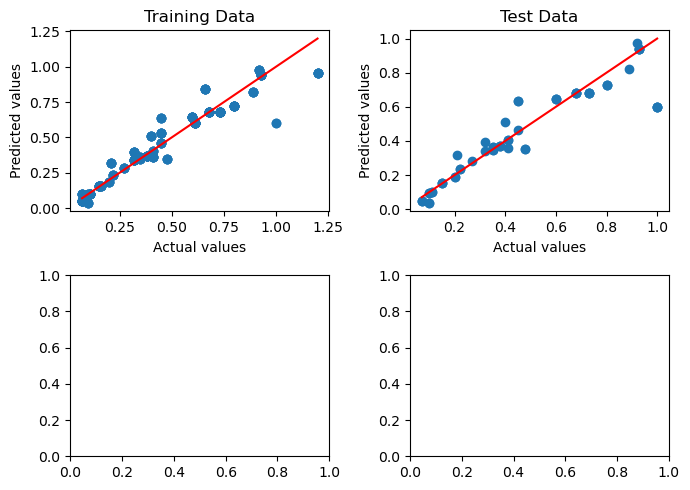

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1600/2000], Loss: 0.0067
Train R²:  0.91920
Test R² :  0.84689


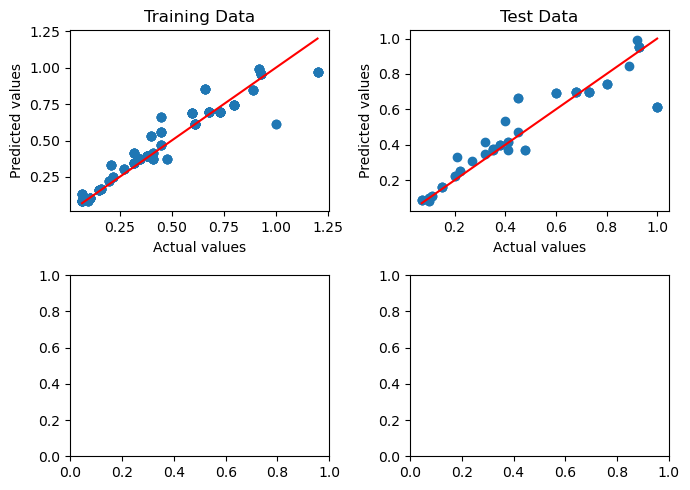

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1620/2000], Loss: 0.0061
Train R²:  0.92576
Test R² :  0.84234


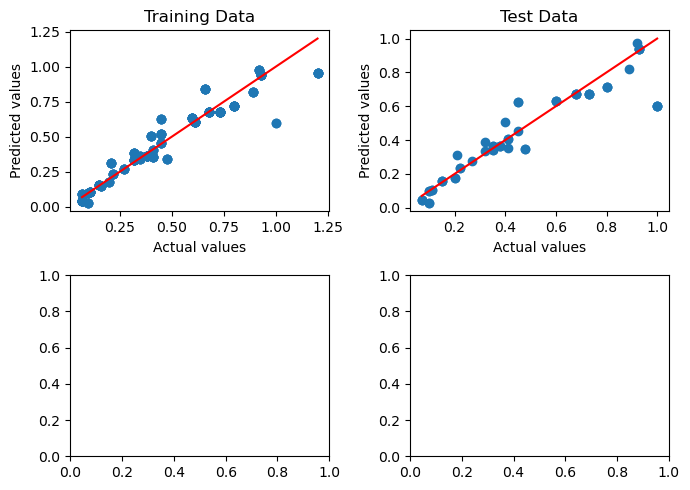

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1640/2000], Loss: 0.0060
Train R²:  0.92676
Test R² :  0.84676


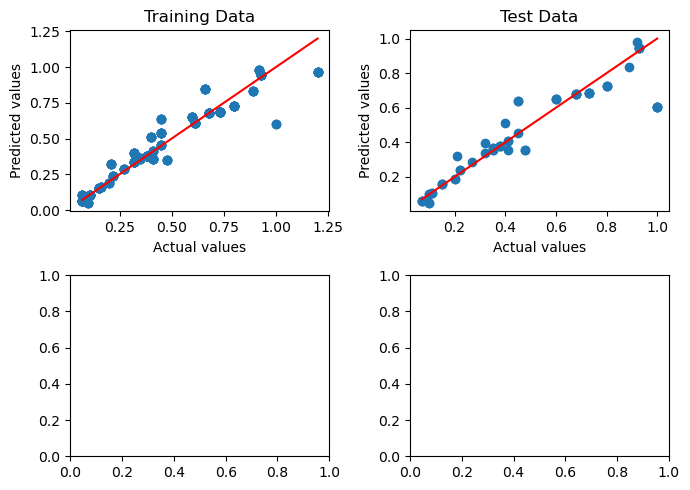

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1660/2000], Loss: 0.0060
Train R²:  0.92775
Test R² :  0.84315


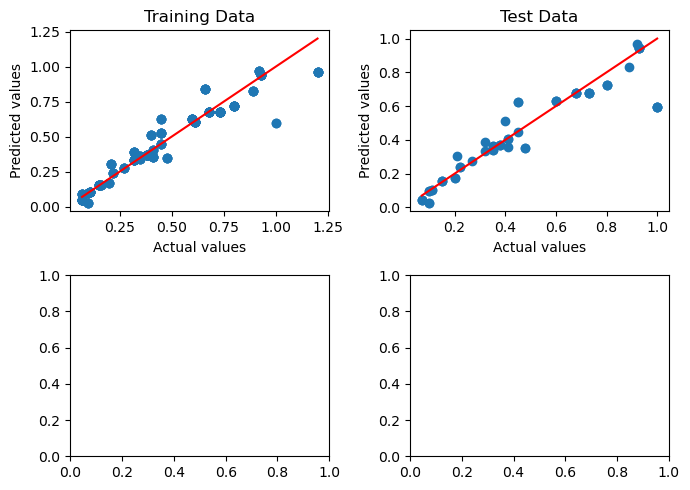

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1680/2000], Loss: 0.0060
Train R²:  0.92729
Test R² :  0.83989


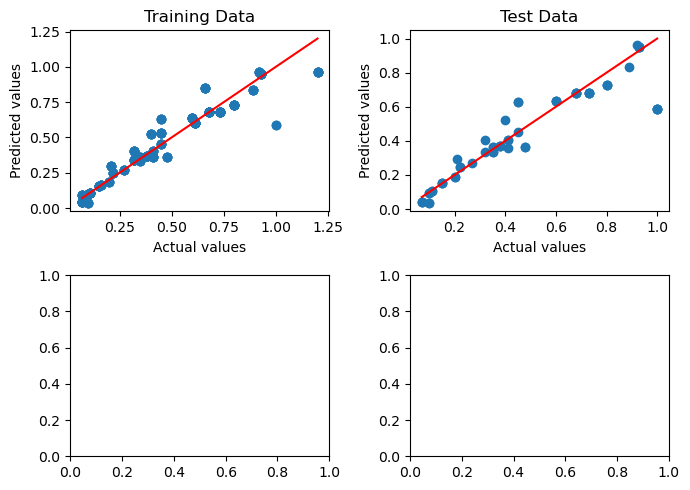

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1700/2000], Loss: 0.0058
Train R²:  0.93019
Test R² :  0.85018


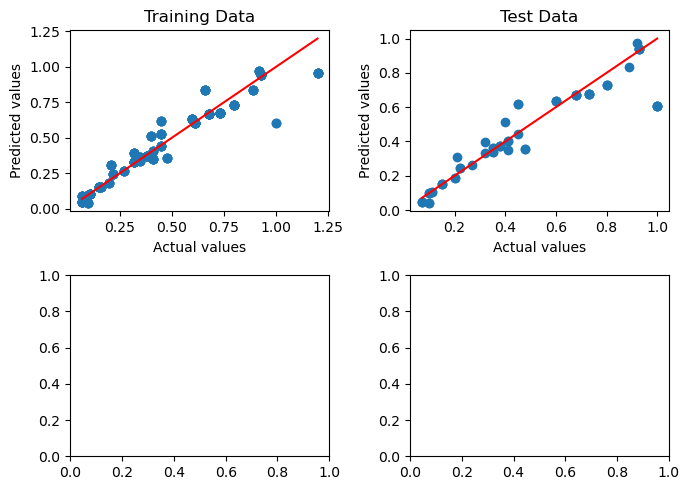

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1720/2000], Loss: 0.0057
Train R²:  0.93097
Test R² :  0.85337


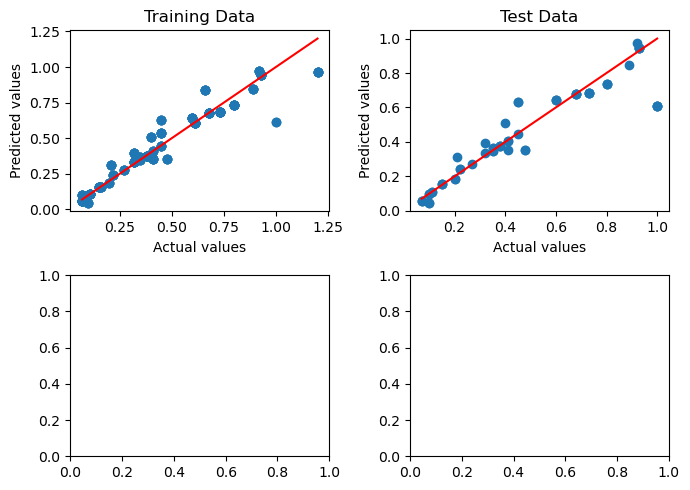

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1740/2000], Loss: 0.0057
Train R²:  0.93060
Test R² :  0.84867


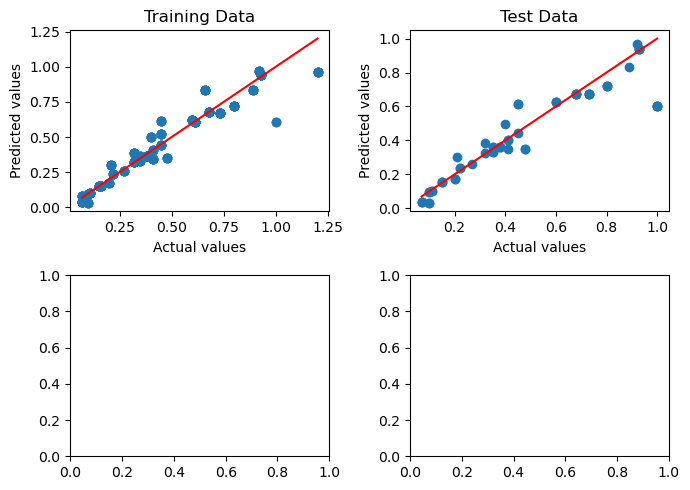

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1760/2000], Loss: 0.0055
Train R²:  0.93266
Test R² :  0.85557


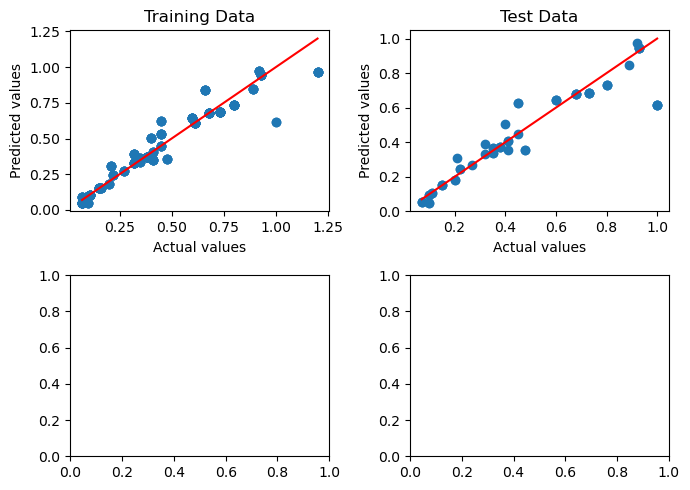

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1780/2000], Loss: 0.0055
Train R²:  0.93328
Test R² :  0.85511


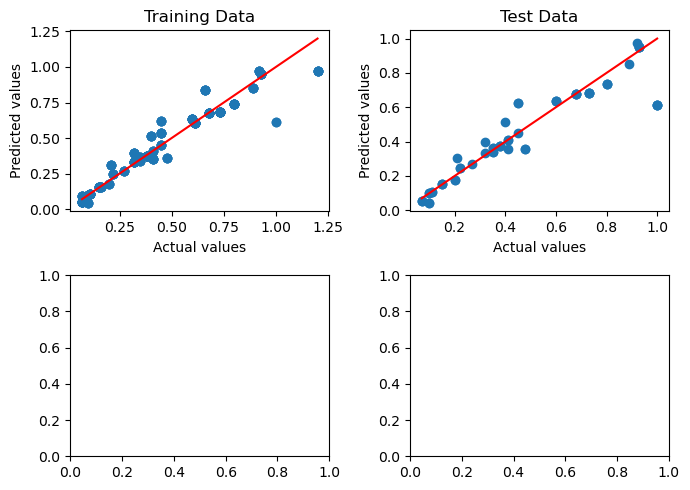

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1800/2000], Loss: 0.0055
Train R²:  0.93291
Test R² :  0.84878


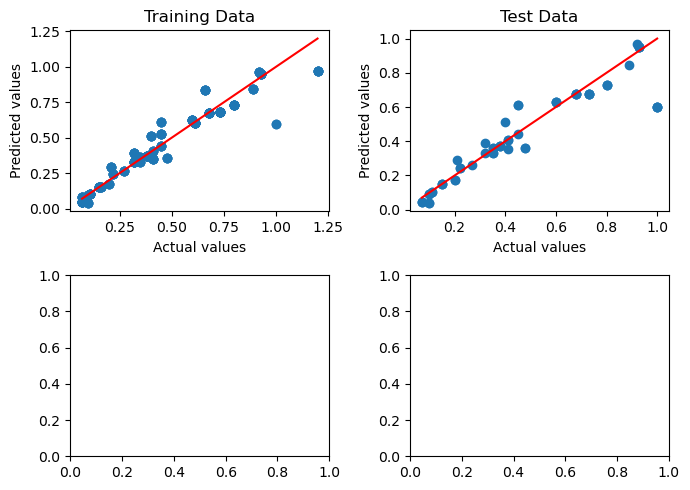

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1820/2000], Loss: 0.0055
Train R²:  0.93299
Test R² :  0.85069


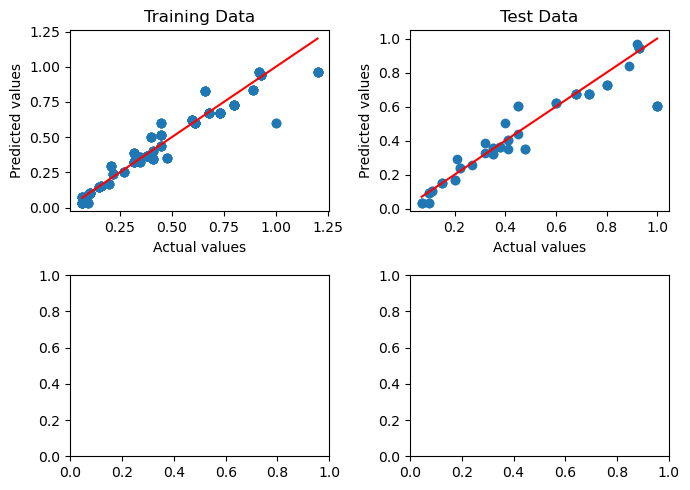

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1840/2000], Loss: 0.0054
Train R²:  0.93464
Test R² :  0.85912


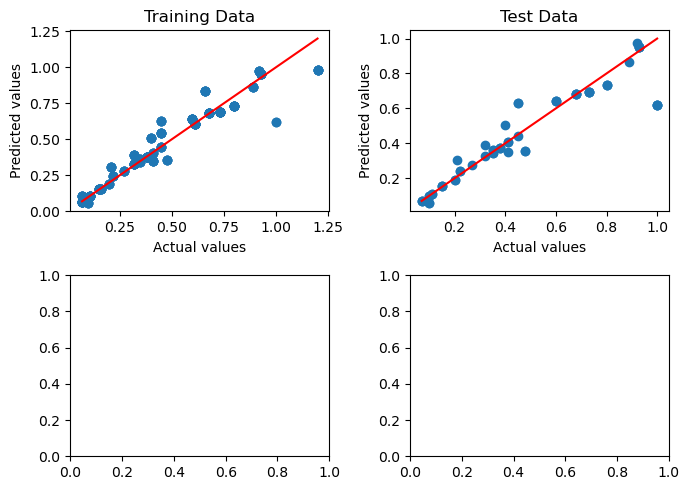

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1860/2000], Loss: 0.0055
Train R²:  0.93356
Test R² :  0.86226


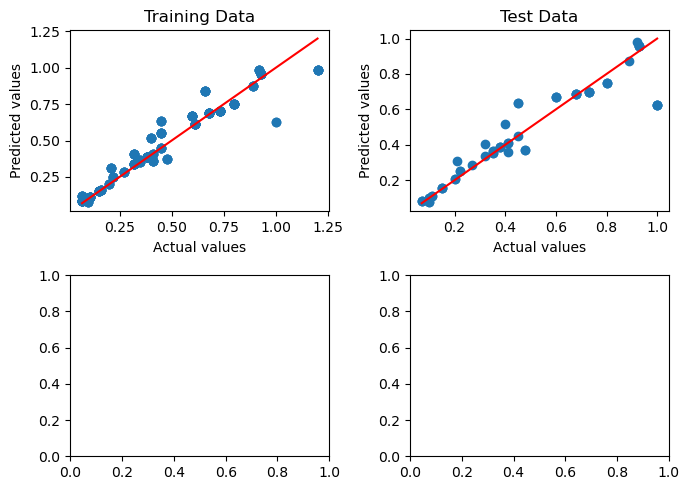

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1880/2000], Loss: 0.0053
Train R²:  0.93519
Test R² :  0.85493


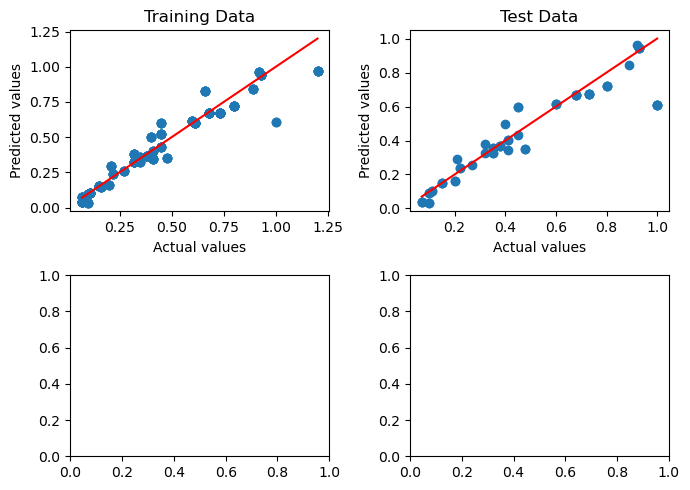

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1900/2000], Loss: 0.0051
Train R²:  0.93787
Test R² :  0.86206


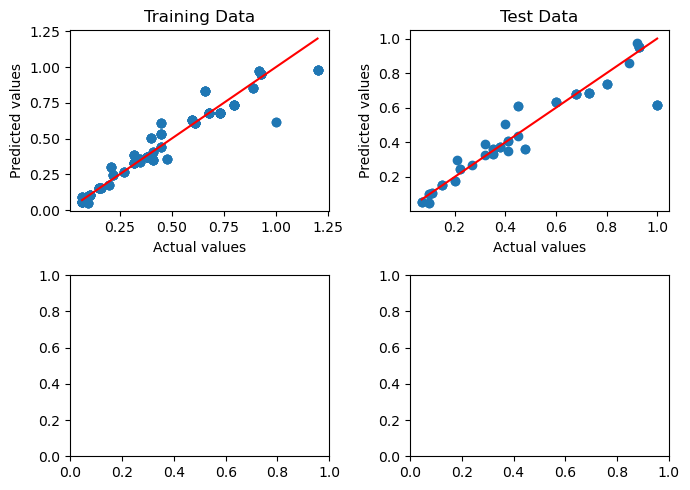

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1920/2000], Loss: 0.0051
Train R²:  0.93817
Test R² :  0.86071


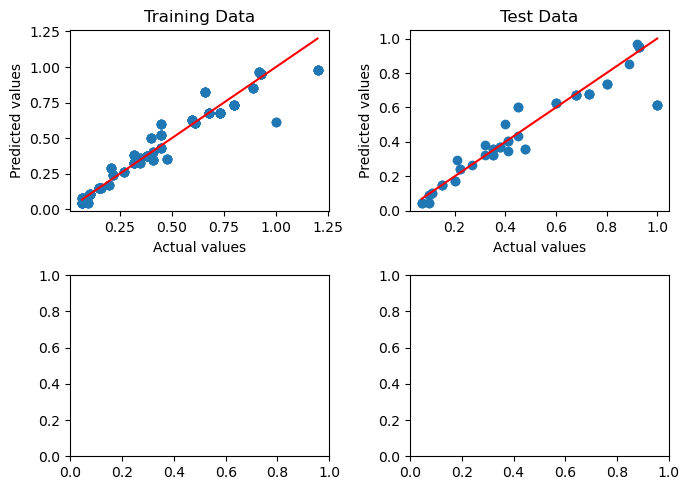

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1940/2000], Loss: 0.0050
Train R²:  0.93920
Test R² :  0.86792


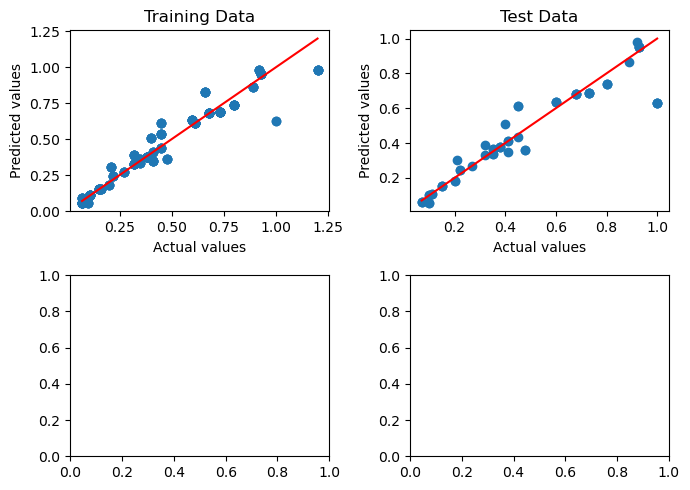

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1960/2000], Loss: 0.0051
Train R²:  0.93840
Test R² :  0.86749


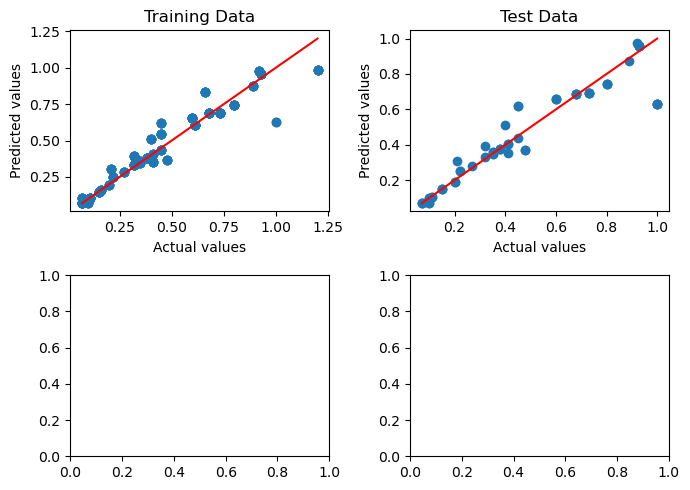

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [1980/2000], Loss: 0.0049
Train R²:  0.94060
Test R² :  0.87061


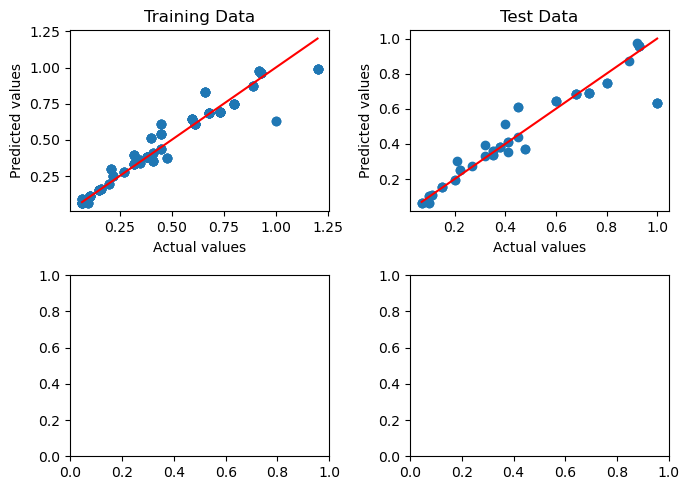

<Figure size 640x480 with 0 Axes>

[Epsilonf] Epoch [2000/2000], Loss: 0.0048
Train R²:  0.94113
Test R² :  0.87045


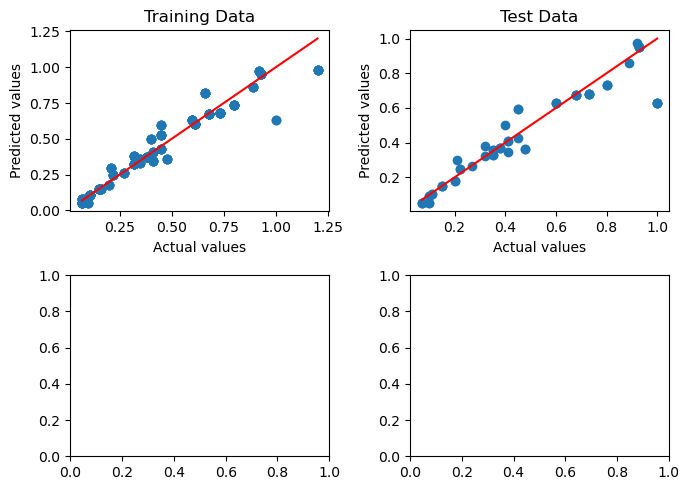

<Figure size 640x480 with 0 Axes>

In [14]:
GBR_NN(8)

[c] Epoch [20/2000], Loss: 0.0666
Train R²:  -729.56220
Test R² :  -659.48439


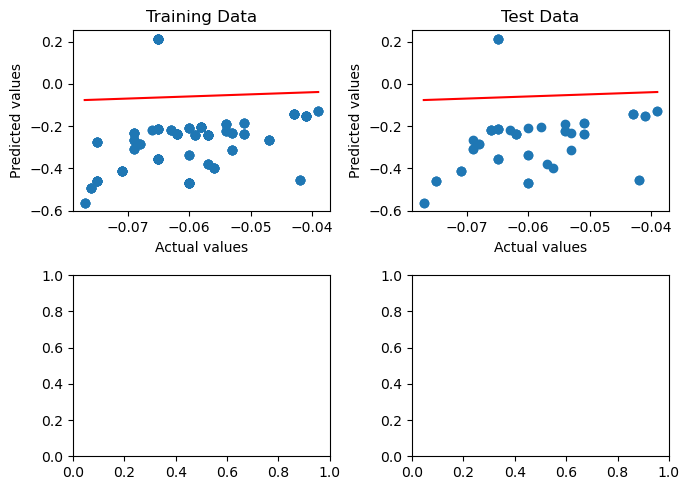

<Figure size 640x480 with 0 Axes>

[c] Epoch [40/2000], Loss: 0.0129
Train R²:  -140.53136
Test R² :  -119.46321


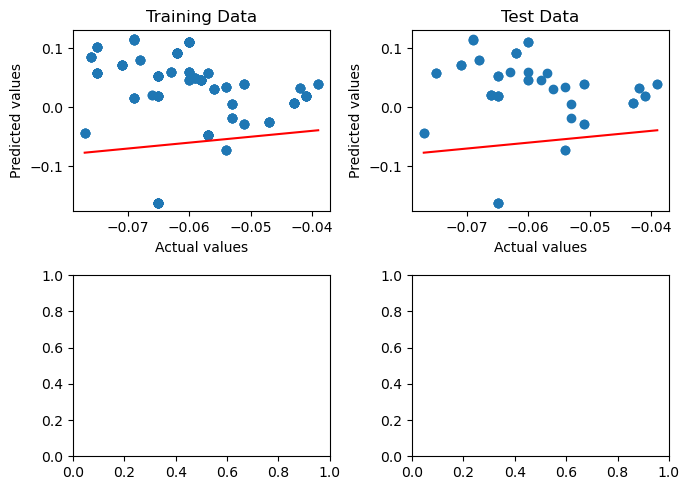

<Figure size 640x480 with 0 Axes>

[c] Epoch [60/2000], Loss: 0.0025
Train R²:  -26.04679
Test R² :  -23.33176


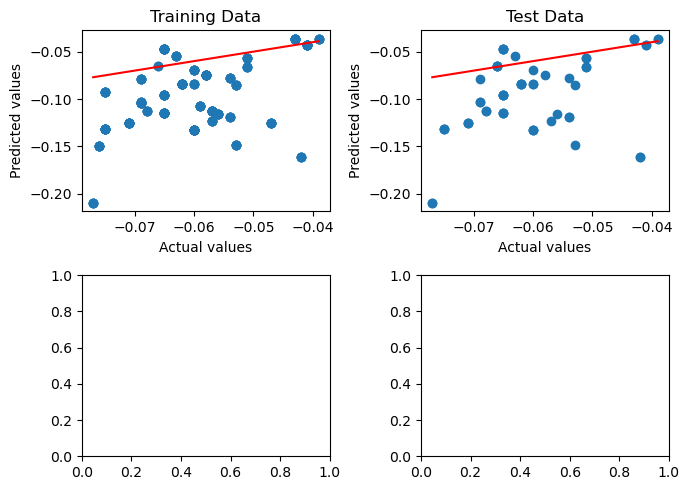

<Figure size 640x480 with 0 Axes>

[c] Epoch [80/2000], Loss: 0.0005
Train R²:  -3.99439
Test R² :  -4.19062


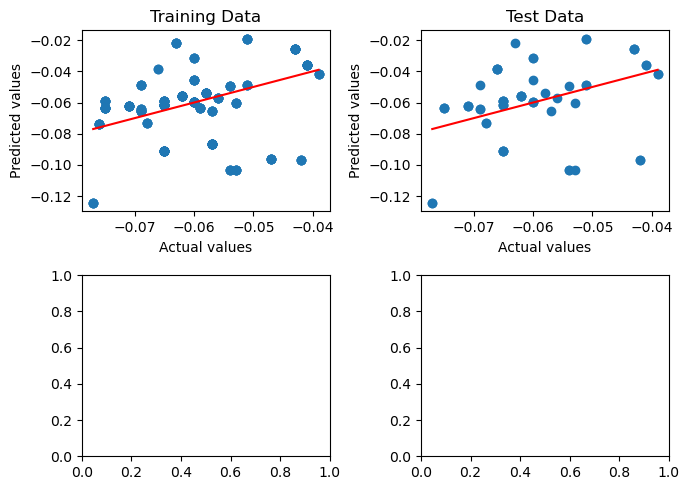

<Figure size 640x480 with 0 Axes>

[c] Epoch [100/2000], Loss: 0.0004
Train R²:  -2.96056
Test R² :  -3.37457


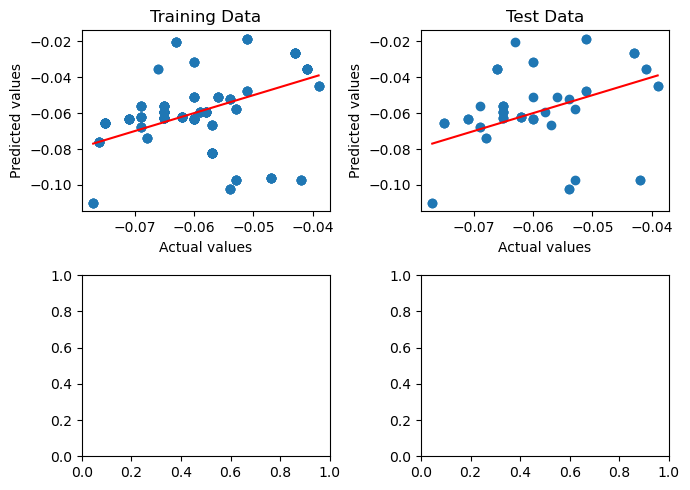

<Figure size 640x480 with 0 Axes>

[c] Epoch [120/2000], Loss: 0.0003
Train R²:  -2.62887
Test R² :  -3.01955


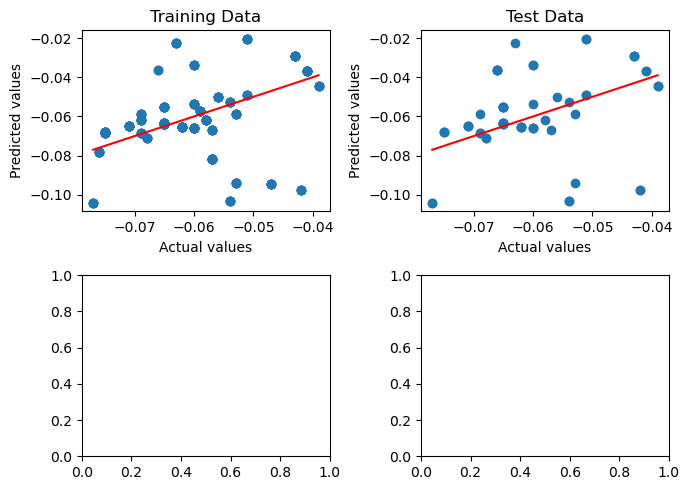

<Figure size 640x480 with 0 Axes>

[c] Epoch [140/2000], Loss: 0.0003
Train R²:  -2.29992
Test R² :  -2.77840


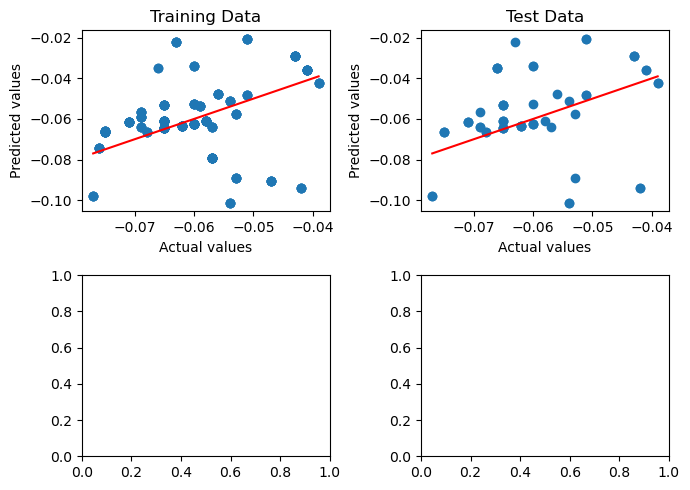

<Figure size 640x480 with 0 Axes>

[c] Epoch [160/2000], Loss: 0.0003
Train R²:  -2.05383
Test R² :  -2.52890


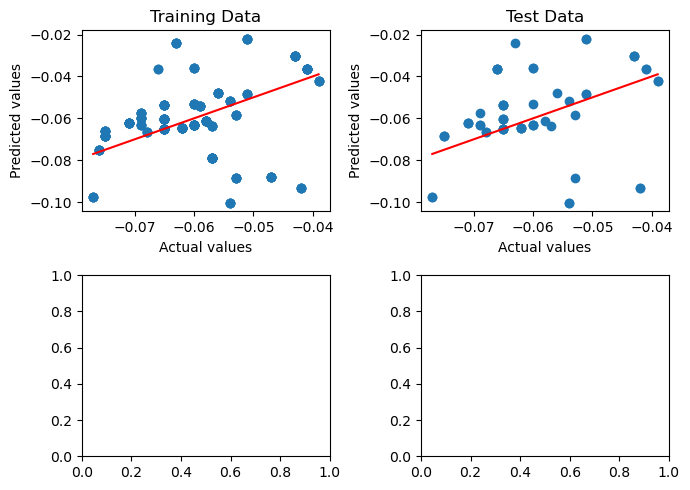

<Figure size 640x480 with 0 Axes>

[c] Epoch [180/2000], Loss: 0.0003
Train R²:  -1.82788
Test R² :  -2.36355


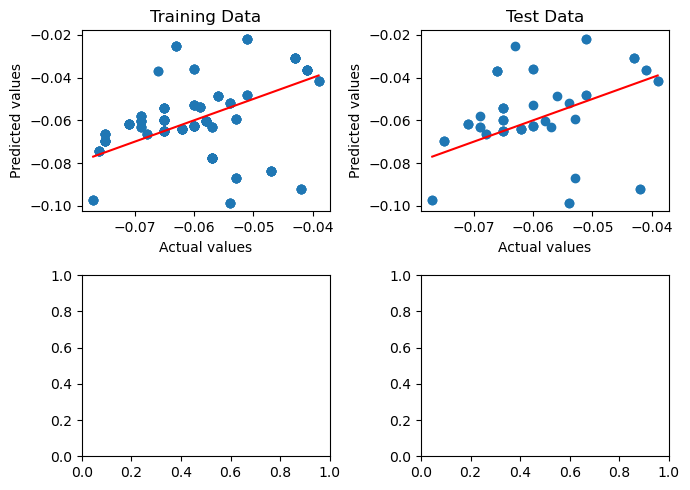

<Figure size 640x480 with 0 Axes>

[c] Epoch [200/2000], Loss: 0.0002
Train R²:  -1.64654
Test R² :  -2.20299


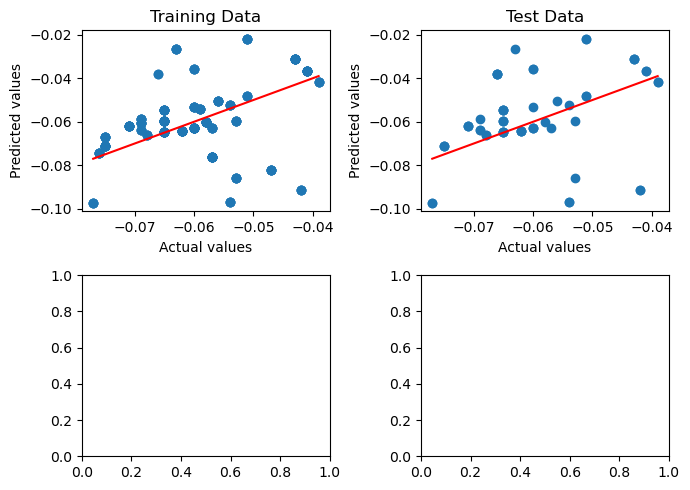

<Figure size 640x480 with 0 Axes>

[c] Epoch [220/2000], Loss: 0.0002
Train R²:  -1.48032
Test R² :  -2.03873


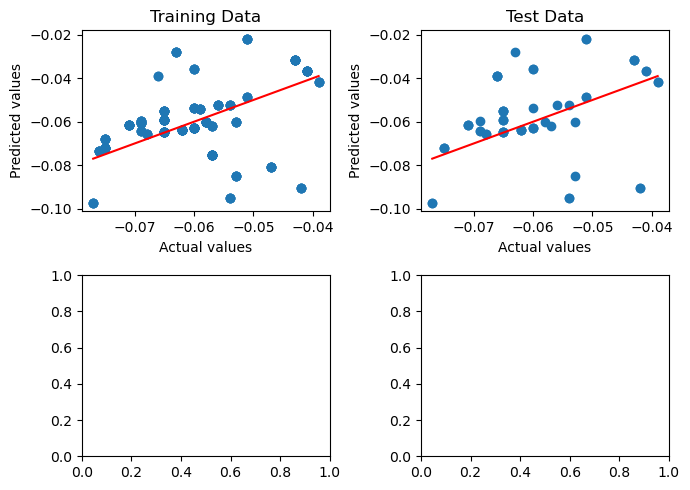

<Figure size 640x480 with 0 Axes>

[c] Epoch [240/2000], Loss: 0.0002
Train R²:  -1.32934
Test R² :  -1.88936


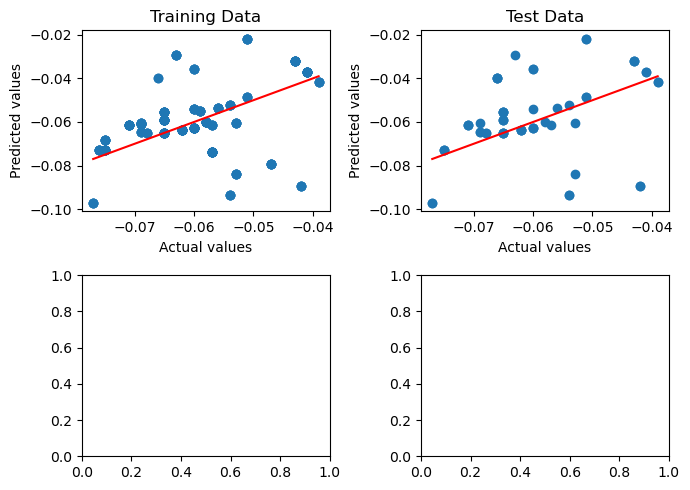

<Figure size 640x480 with 0 Axes>

[c] Epoch [260/2000], Loss: 0.0002
Train R²:  -1.19082
Test R² :  -1.74698


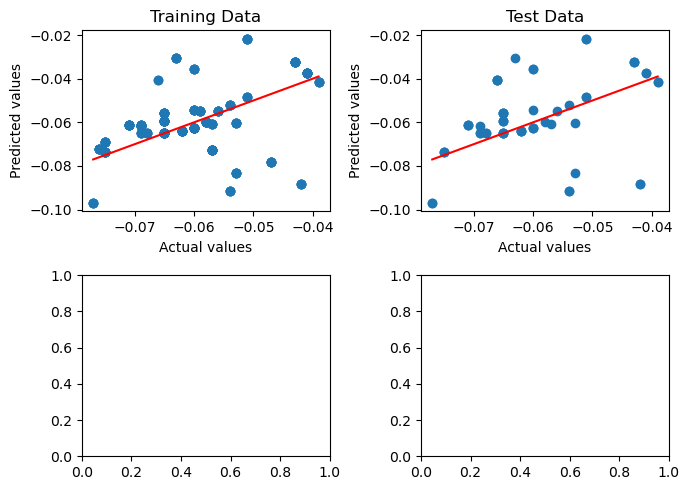

<Figure size 640x480 with 0 Axes>

[c] Epoch [280/2000], Loss: 0.0002
Train R²:  -1.06208
Test R² :  -1.60312


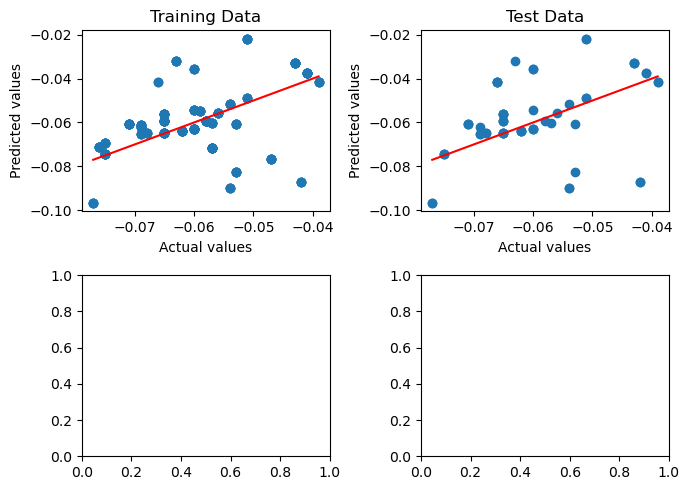

<Figure size 640x480 with 0 Axes>

[c] Epoch [300/2000], Loss: 0.0002
Train R²:  -0.94575
Test R² :  -1.46297


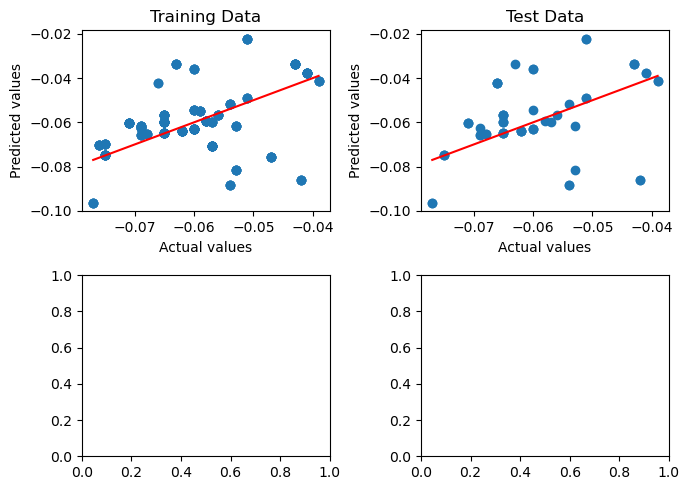

<Figure size 640x480 with 0 Axes>

[c] Epoch [320/2000], Loss: 0.0002
Train R²:  -0.81176
Test R² :  -1.31689


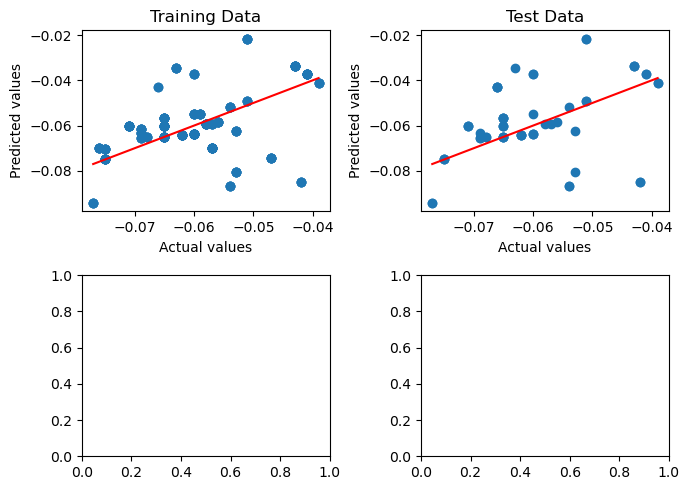

<Figure size 640x480 with 0 Axes>

[c] Epoch [340/2000], Loss: 0.0002
Train R²:  -0.68794
Test R² :  -1.17191


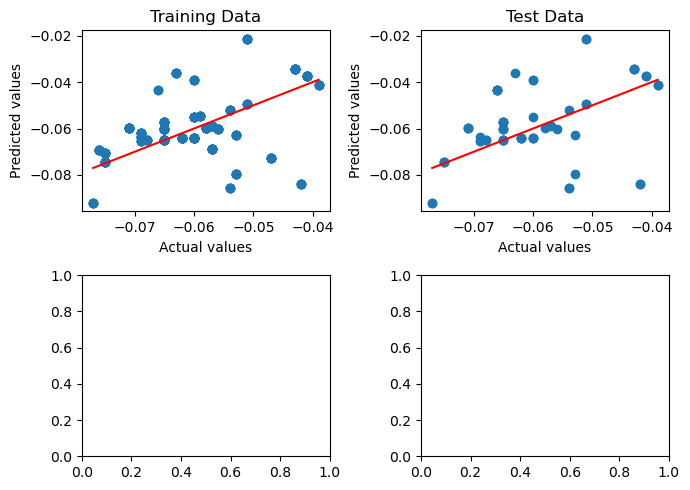

<Figure size 640x480 with 0 Axes>

[c] Epoch [360/2000], Loss: 0.0001
Train R²:  -0.57783
Test R² :  -1.04458


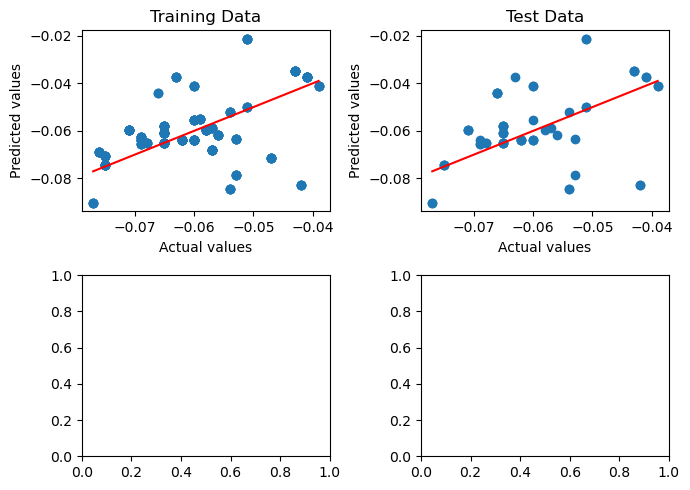

<Figure size 640x480 with 0 Axes>

[c] Epoch [380/2000], Loss: 0.0001
Train R²:  -0.48025
Test R² :  -0.92814


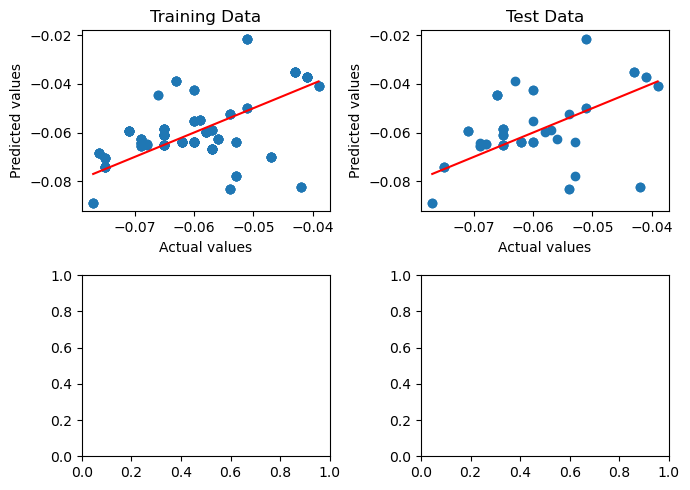

<Figure size 640x480 with 0 Axes>

[c] Epoch [400/2000], Loss: 0.0001
Train R²:  -0.39238
Test R² :  -0.82072


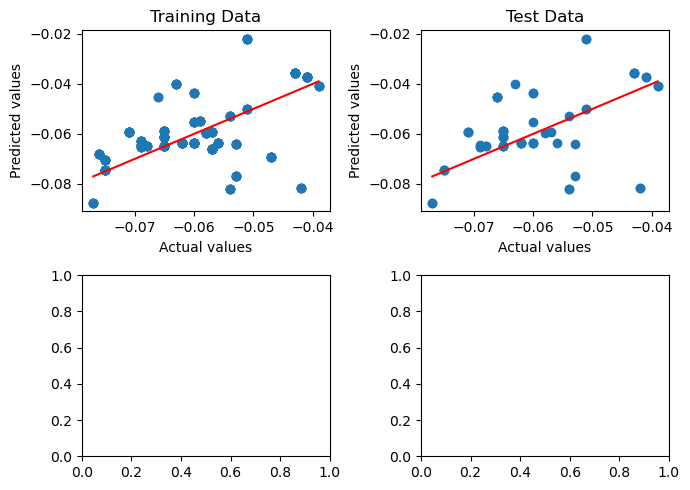

<Figure size 640x480 with 0 Axes>

[c] Epoch [420/2000], Loss: 0.0001
Train R²:  -0.29727
Test R² :  -0.69639


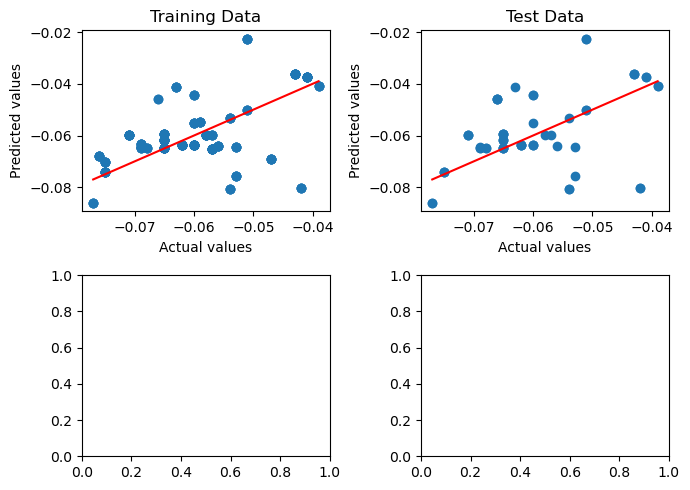

<Figure size 640x480 with 0 Axes>

[c] Epoch [440/2000], Loss: 0.0001
Train R²:  -0.19937
Test R² :  -0.56215


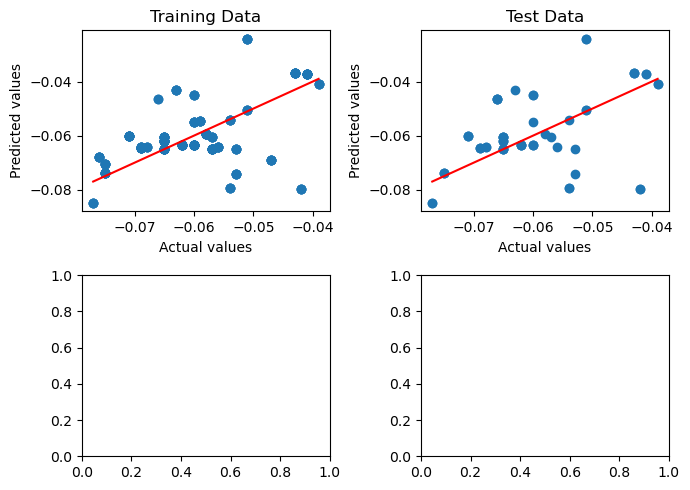

<Figure size 640x480 with 0 Axes>

[c] Epoch [460/2000], Loss: 0.0001
Train R²:  -0.11871
Test R² :  -0.45202


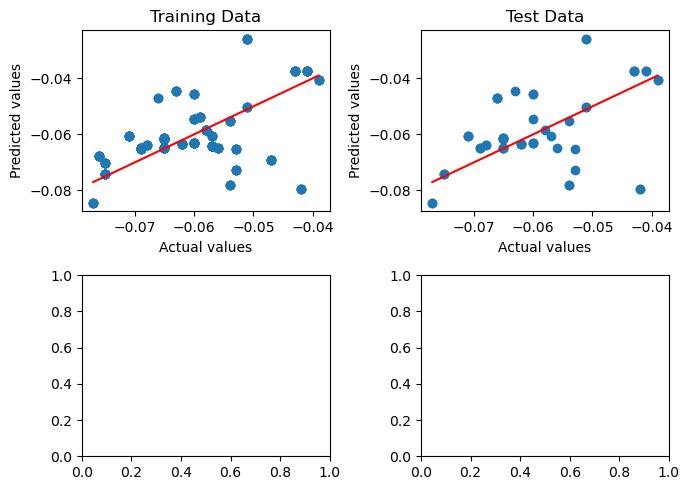

<Figure size 640x480 with 0 Axes>

[c] Epoch [480/2000], Loss: 0.0001
Train R²:  -0.06223
Test R² :  -0.39747


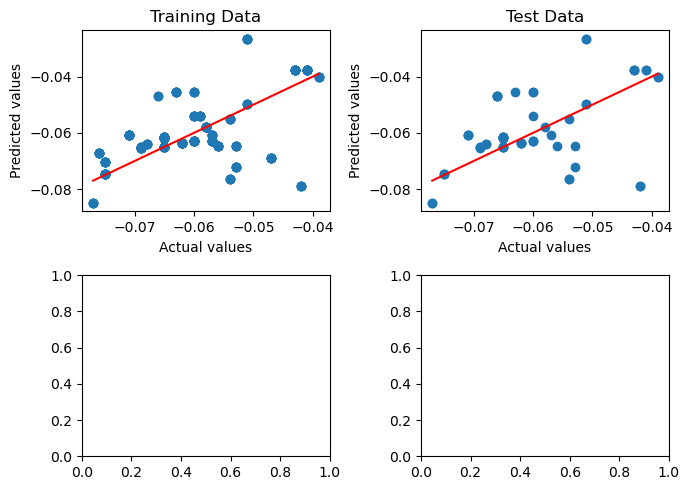

<Figure size 640x480 with 0 Axes>

[c] Epoch [500/2000], Loss: 0.0001
Train R²:  -0.01093
Test R² :  -0.33231


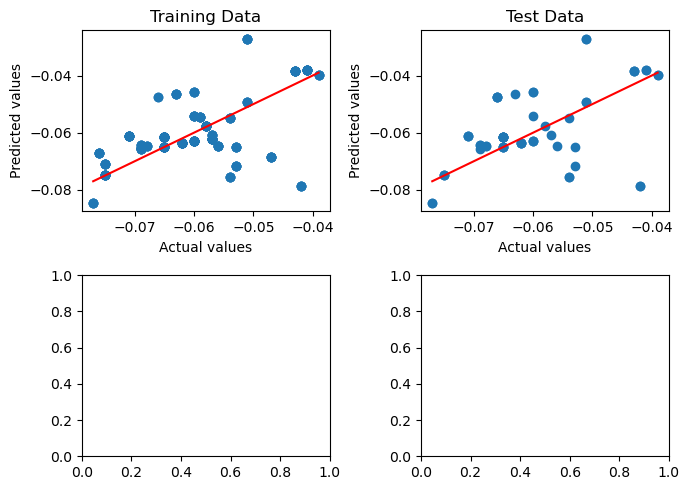

<Figure size 640x480 with 0 Axes>

[c] Epoch [520/2000], Loss: 0.0001
Train R²:  0.03512
Test R² :  -0.27610


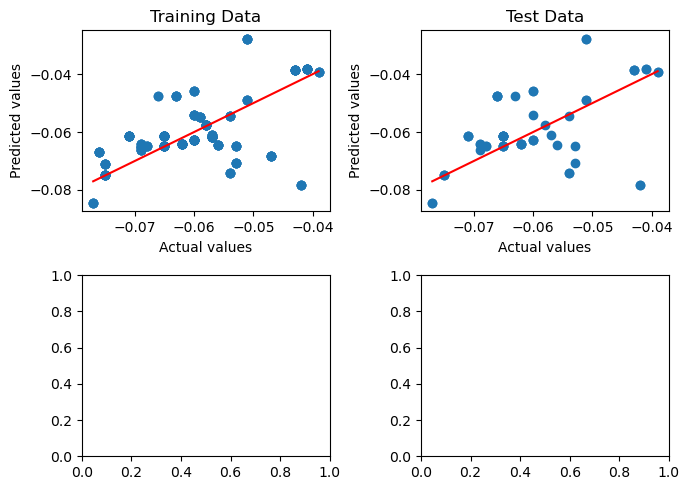

<Figure size 640x480 with 0 Axes>

[c] Epoch [540/2000], Loss: 0.0001
Train R²:  0.07753
Test R² :  -0.22297


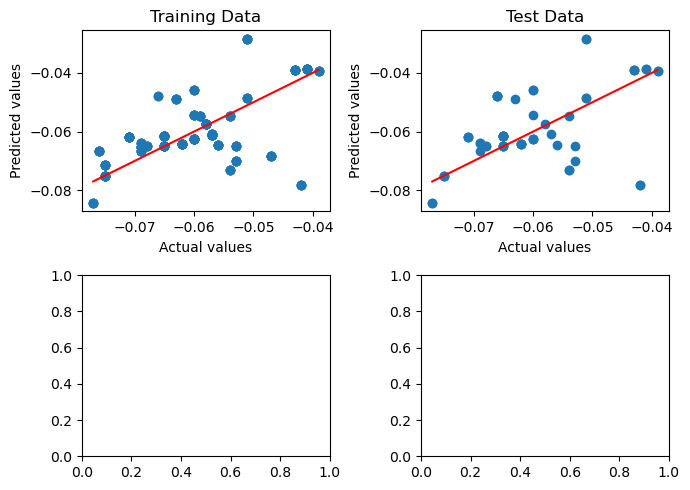

<Figure size 640x480 with 0 Axes>

[c] Epoch [560/2000], Loss: 0.0001
Train R²:  0.11660
Test R² :  -0.17543


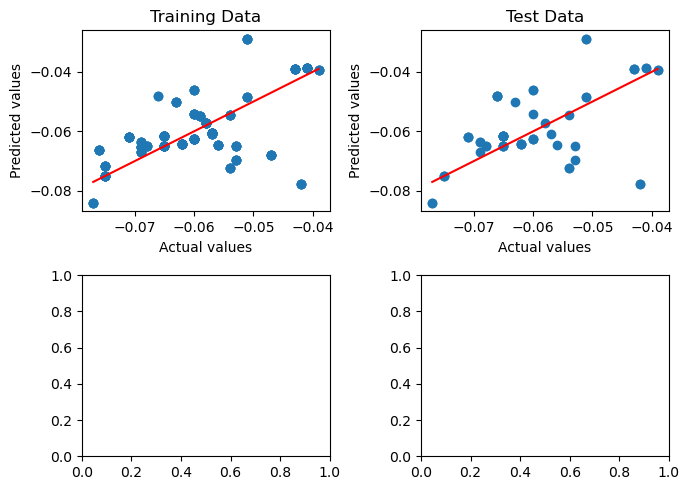

<Figure size 640x480 with 0 Axes>

[c] Epoch [580/2000], Loss: 0.0001
Train R²:  0.15368
Test R² :  -0.13084


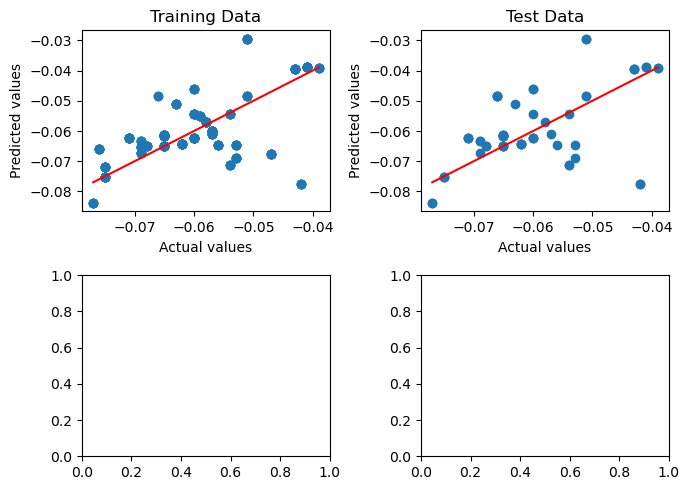

<Figure size 640x480 with 0 Axes>

[c] Epoch [600/2000], Loss: 0.0001
Train R²:  0.18878
Test R² :  -0.08905


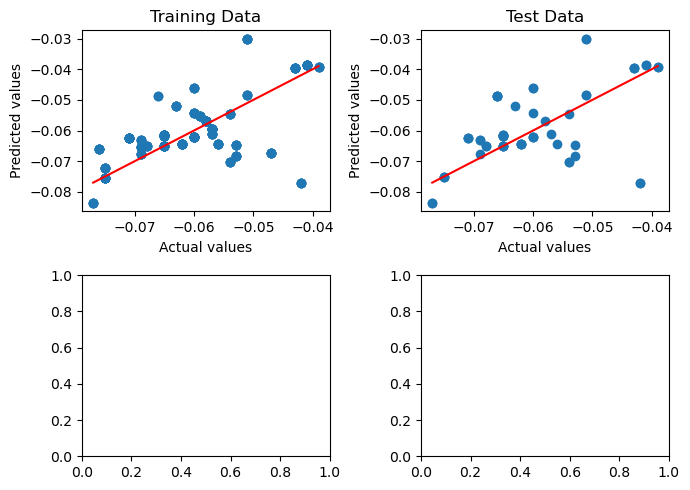

<Figure size 640x480 with 0 Axes>

[c] Epoch [620/2000], Loss: 0.0001
Train R²:  0.22151
Test R² :  -0.04985


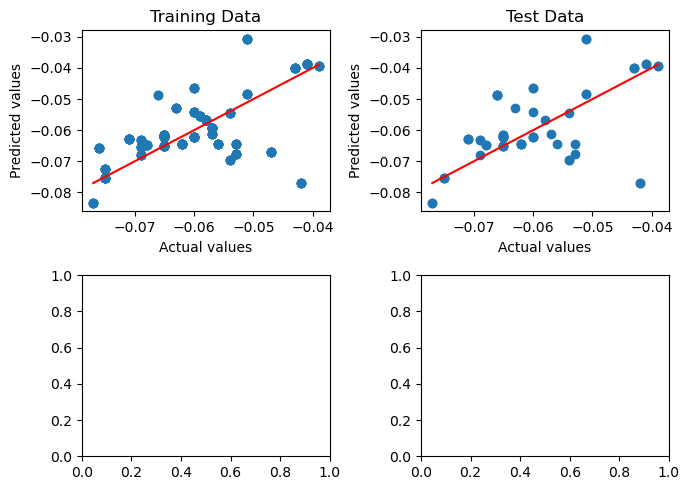

<Figure size 640x480 with 0 Axes>

[c] Epoch [640/2000], Loss: 0.0001
Train R²:  0.25220
Test R² :  -0.01334


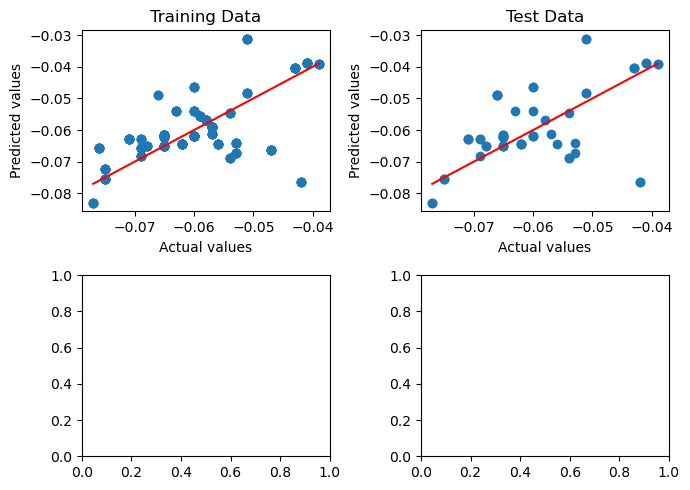

<Figure size 640x480 with 0 Axes>

[c] Epoch [660/2000], Loss: 0.0001
Train R²:  0.28123
Test R² :  0.02066


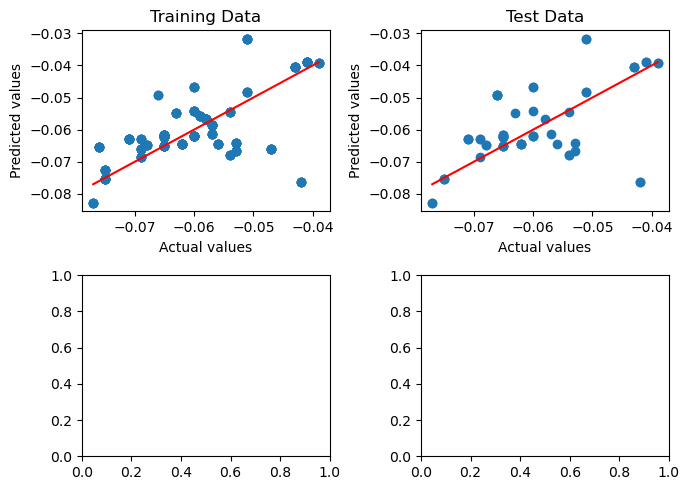

<Figure size 640x480 with 0 Axes>

[c] Epoch [680/2000], Loss: 0.0001
Train R²:  0.30873
Test R² :  0.05361


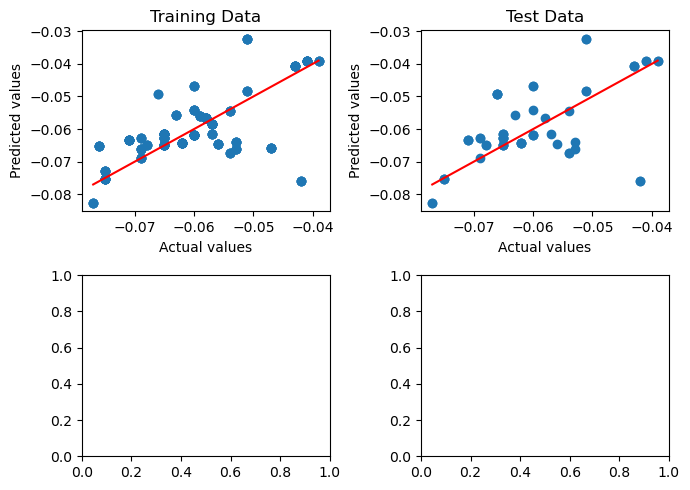

<Figure size 640x480 with 0 Axes>

[c] Epoch [700/2000], Loss: 0.0001
Train R²:  0.33932
Test R² :  0.08923


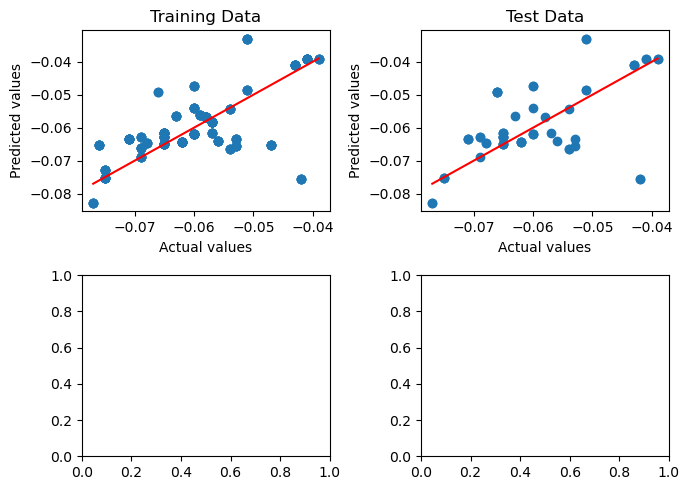

<Figure size 640x480 with 0 Axes>

[c] Epoch [720/2000], Loss: 0.0001
Train R²:  0.36853
Test R² :  0.12293


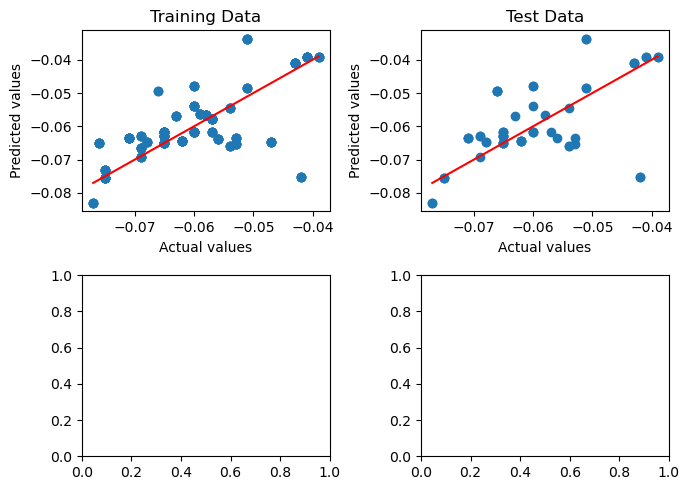

<Figure size 640x480 with 0 Axes>

[c] Epoch [740/2000], Loss: 0.0001
Train R²:  0.39588
Test R² :  0.15302


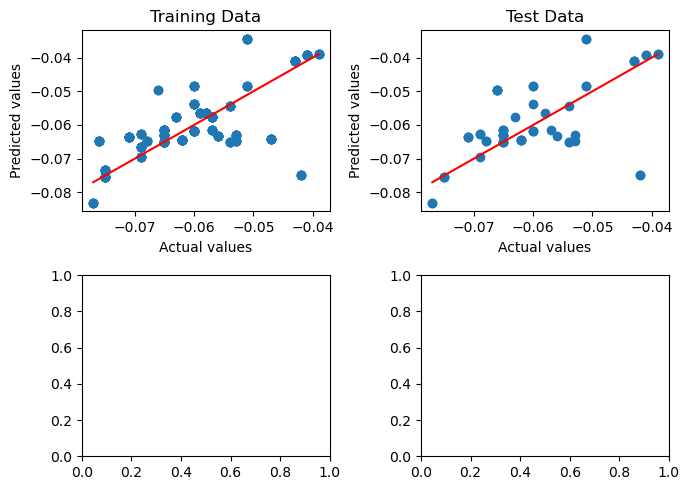

<Figure size 640x480 with 0 Axes>

[c] Epoch [760/2000], Loss: 0.0001
Train R²:  0.42076
Test R² :  0.18206


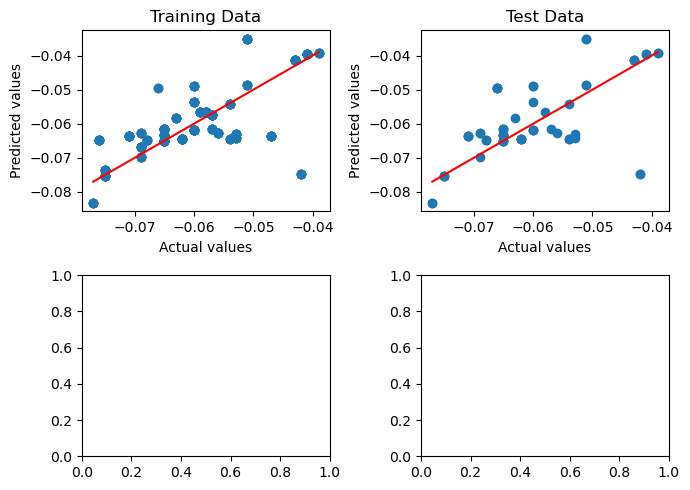

<Figure size 640x480 with 0 Axes>

[c] Epoch [780/2000], Loss: 0.0001
Train R²:  0.44460
Test R² :  0.20798


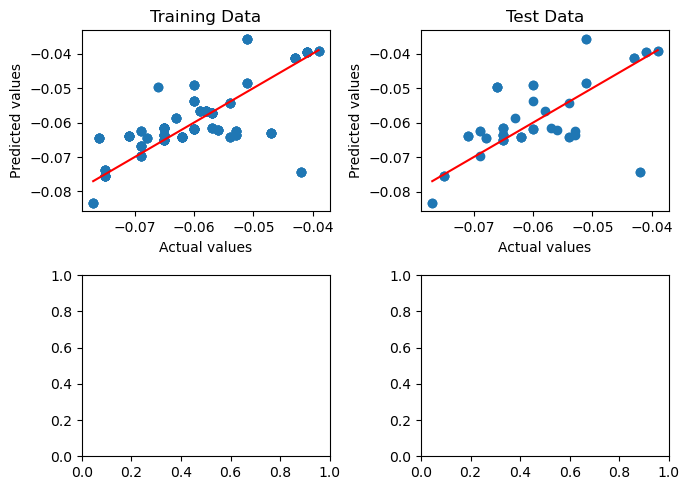

<Figure size 640x480 with 0 Axes>

[c] Epoch [800/2000], Loss: 0.0000
Train R²:  0.46657
Test R² :  0.23269


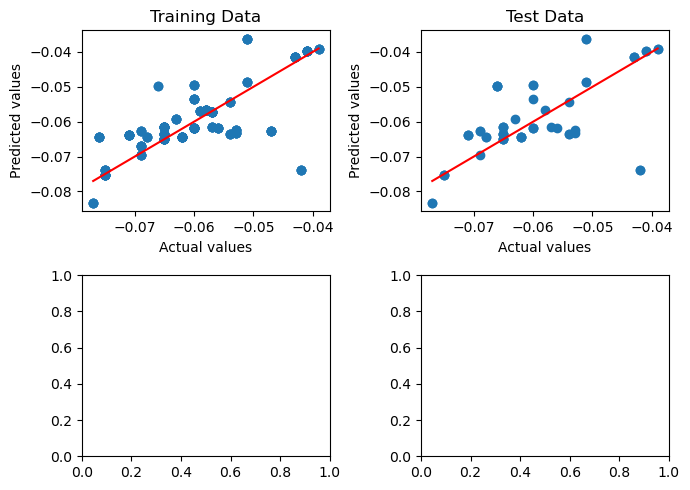

<Figure size 640x480 with 0 Axes>

[c] Epoch [820/2000], Loss: 0.0000
Train R²:  0.48719
Test R² :  0.25633


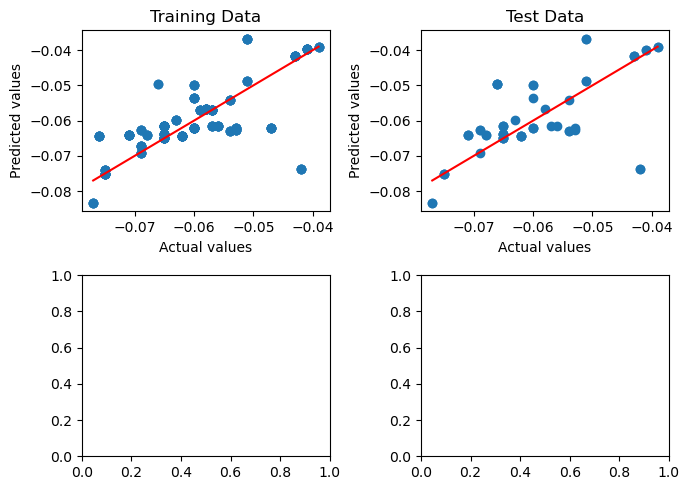

<Figure size 640x480 with 0 Axes>

[c] Epoch [840/2000], Loss: 0.0000
Train R²:  0.50654
Test R² :  0.27919


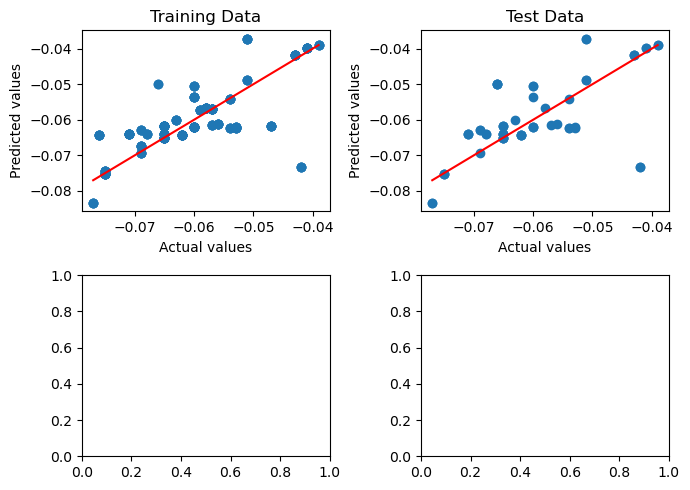

<Figure size 640x480 with 0 Axes>

[c] Epoch [860/2000], Loss: 0.0000
Train R²:  0.52444
Test R² :  0.30052


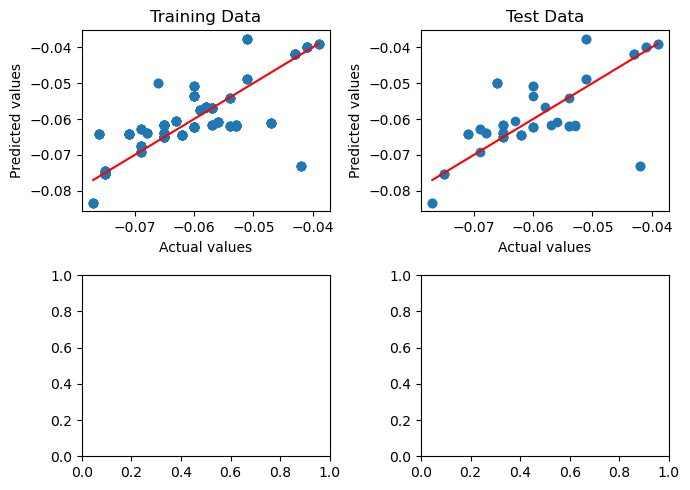

<Figure size 640x480 with 0 Axes>

[c] Epoch [880/2000], Loss: 0.0000
Train R²:  0.54134
Test R² :  0.32066


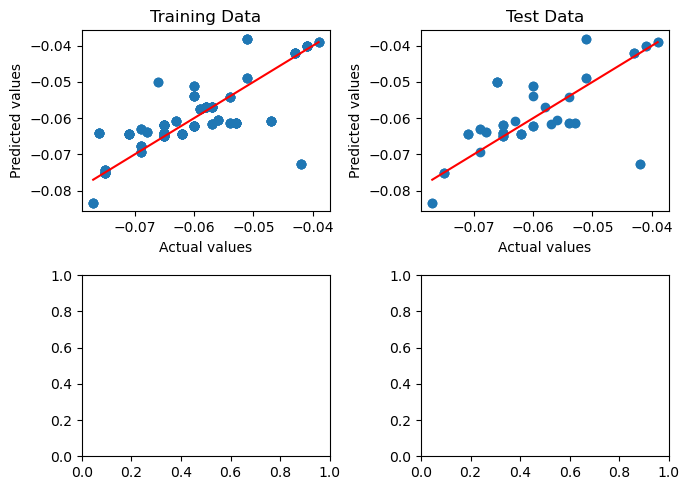

<Figure size 640x480 with 0 Axes>

[c] Epoch [900/2000], Loss: 0.0000
Train R²:  0.55726
Test R² :  0.34071


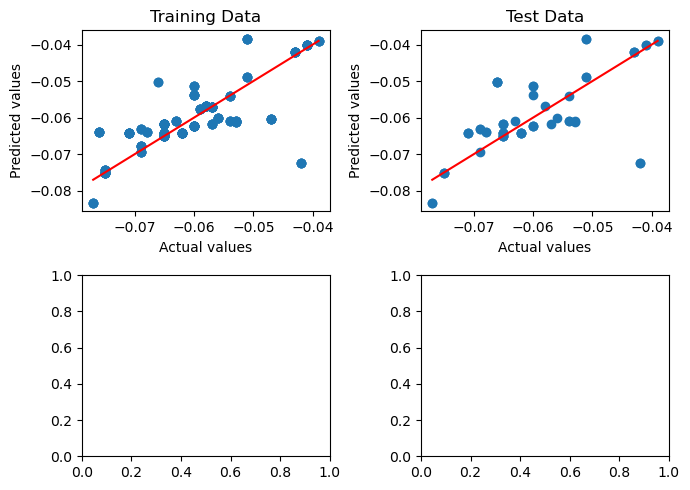

<Figure size 640x480 with 0 Axes>

[c] Epoch [920/2000], Loss: 0.0000
Train R²:  0.57237
Test R² :  0.35916


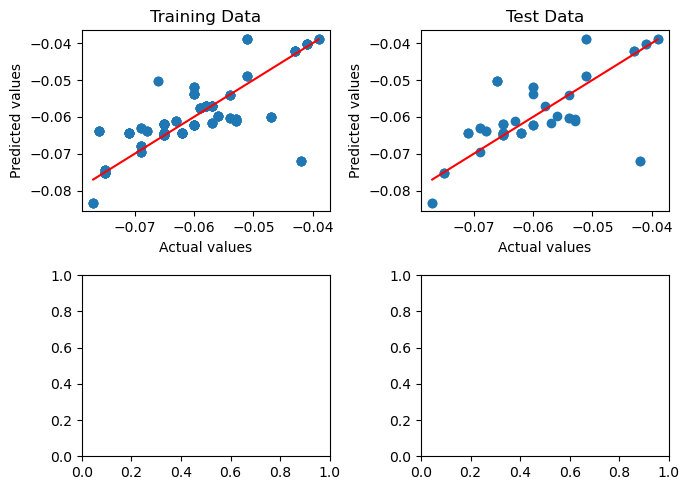

<Figure size 640x480 with 0 Axes>

[c] Epoch [940/2000], Loss: 0.0000
Train R²:  0.58569
Test R² :  0.37595


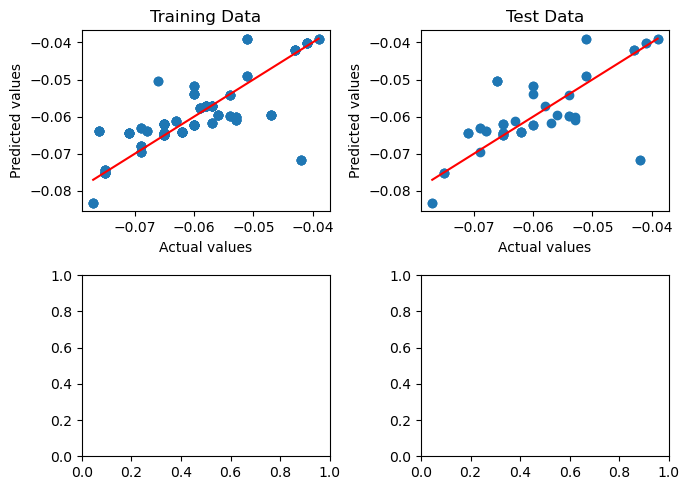

<Figure size 640x480 with 0 Axes>

[c] Epoch [960/2000], Loss: 0.0000
Train R²:  0.59728
Test R² :  0.39038


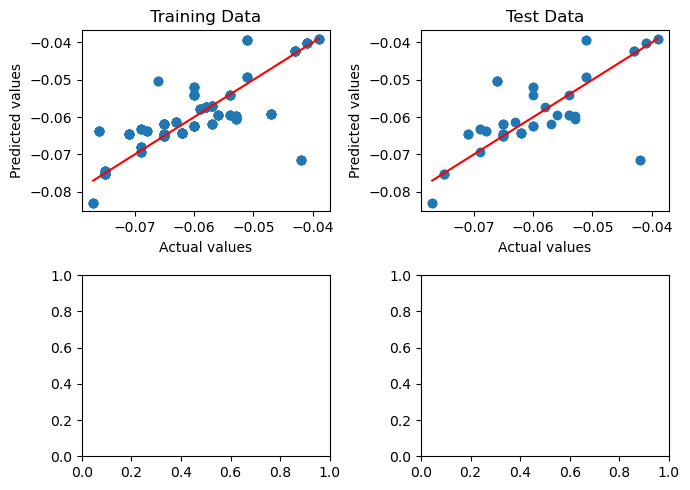

<Figure size 640x480 with 0 Axes>

[c] Epoch [980/2000], Loss: 0.0000
Train R²:  0.60820
Test R² :  0.40520


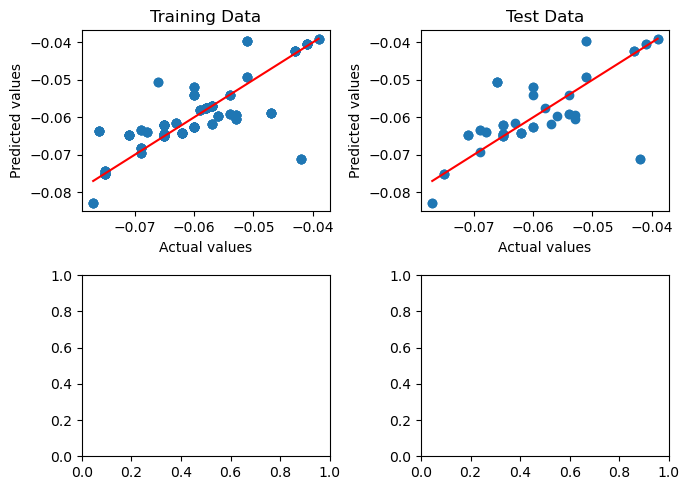

<Figure size 640x480 with 0 Axes>

[c] Epoch [1000/2000], Loss: 0.0000
Train R²:  0.61840
Test R² :  0.41959


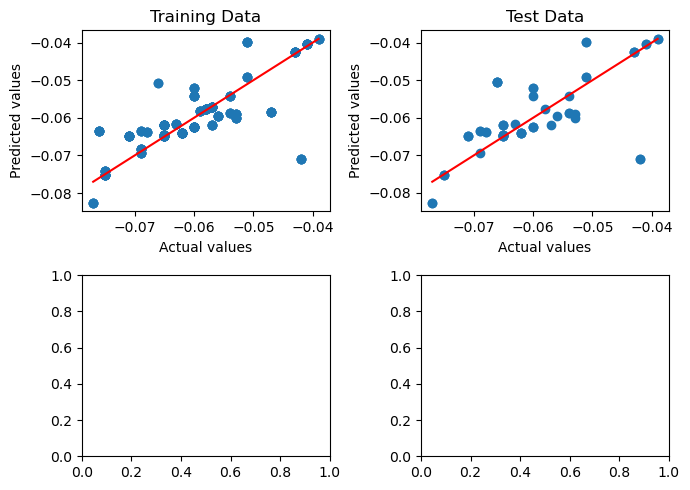

<Figure size 640x480 with 0 Axes>

[c] Epoch [1020/2000], Loss: 0.0000
Train R²:  0.62814
Test R² :  0.43264


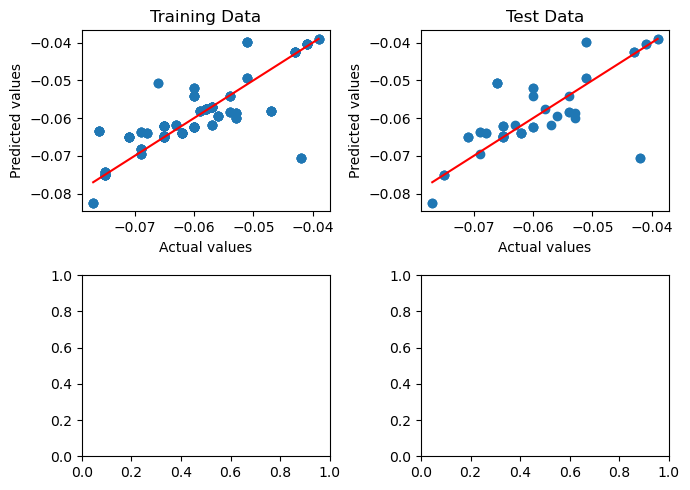

<Figure size 640x480 with 0 Axes>

[c] Epoch [1040/2000], Loss: 0.0000
Train R²:  0.63738
Test R² :  0.44714


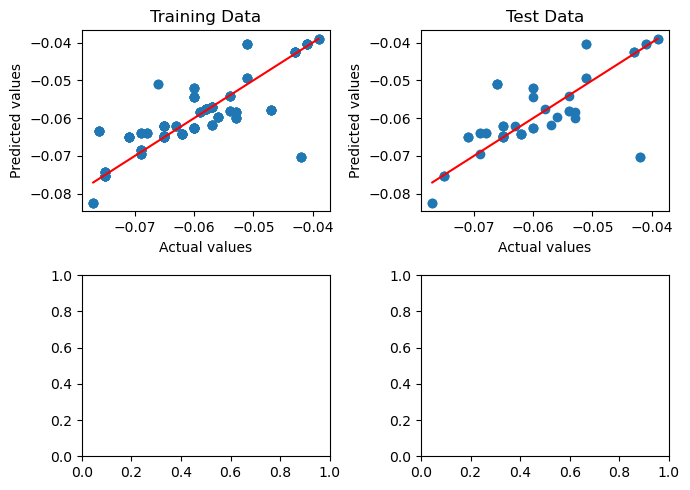

<Figure size 640x480 with 0 Axes>

[c] Epoch [1060/2000], Loss: 0.0000
Train R²:  0.64622
Test R² :  0.45941


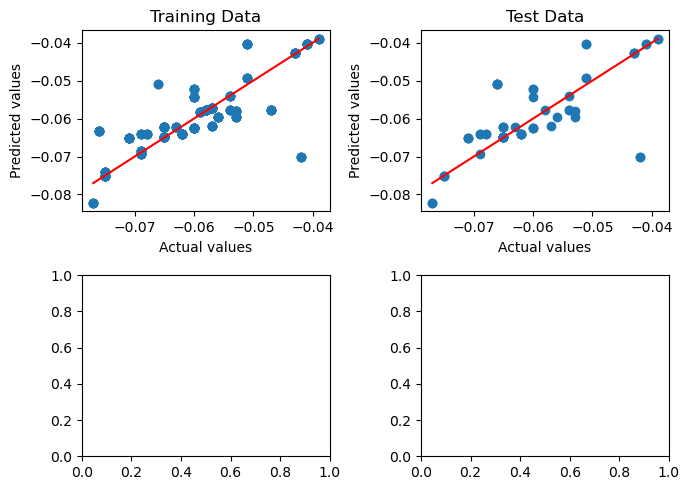

<Figure size 640x480 with 0 Axes>

[c] Epoch [1080/2000], Loss: 0.0000
Train R²:  0.65466
Test R² :  0.47059


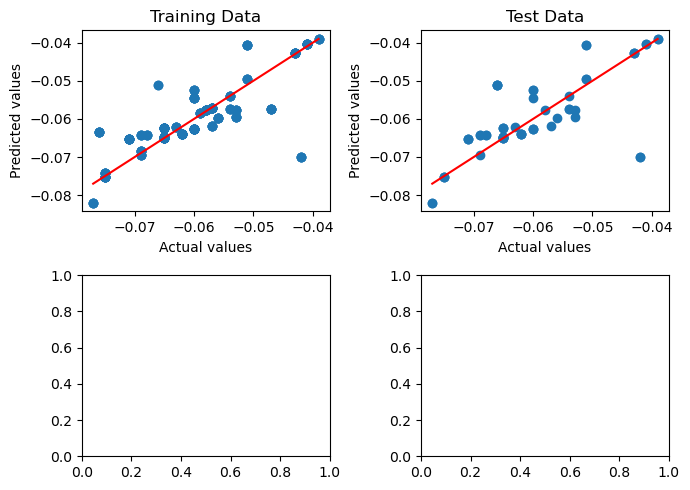

<Figure size 640x480 with 0 Axes>

[c] Epoch [1100/2000], Loss: 0.0000
Train R²:  0.66276
Test R² :  0.48379


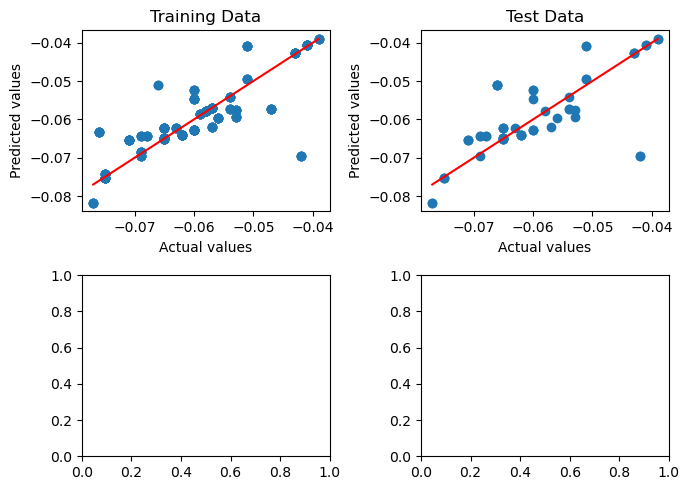

<Figure size 640x480 with 0 Axes>

[c] Epoch [1120/2000], Loss: 0.0000
Train R²:  0.67059
Test R² :  0.49660


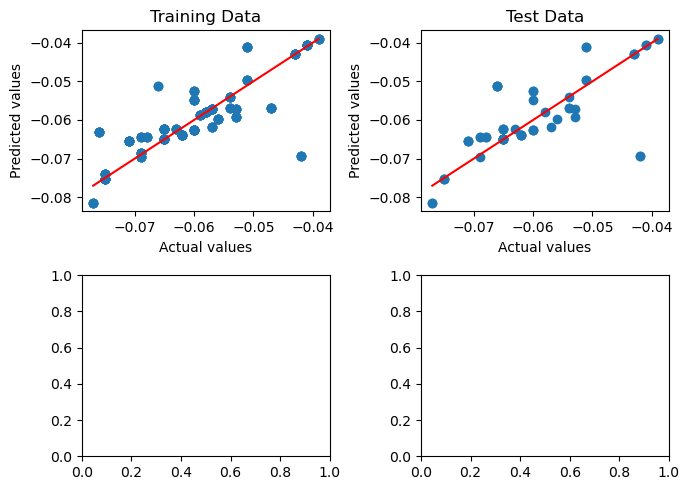

<Figure size 640x480 with 0 Axes>

[c] Epoch [1140/2000], Loss: 0.0000
Train R²:  0.67706
Test R² :  0.50765


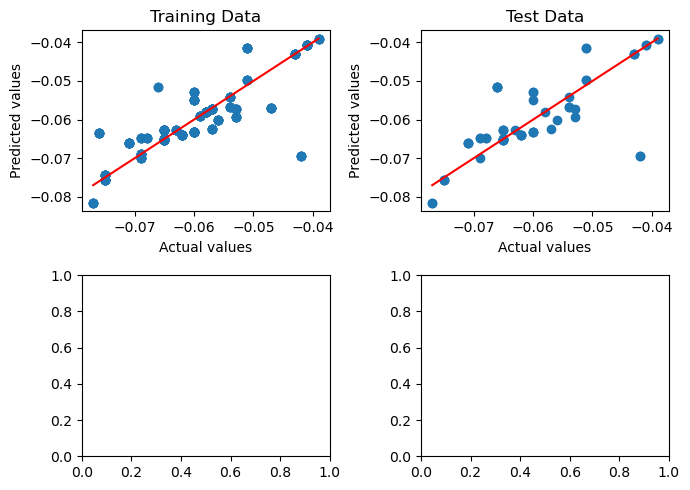

<Figure size 640x480 with 0 Axes>

[c] Epoch [1160/2000], Loss: 0.0003
Train R²:  -2.51754
Test R² :  -2.26010


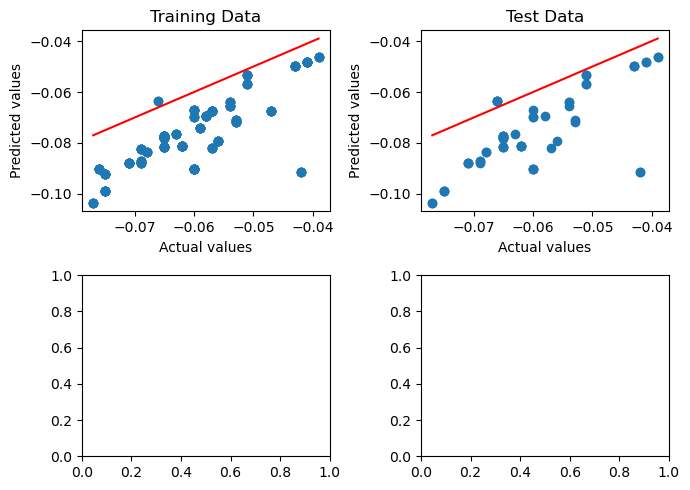

<Figure size 640x480 with 0 Axes>

[c] Epoch [1180/2000], Loss: 0.0104
Train R²:  -112.90419
Test R² :  -96.59817


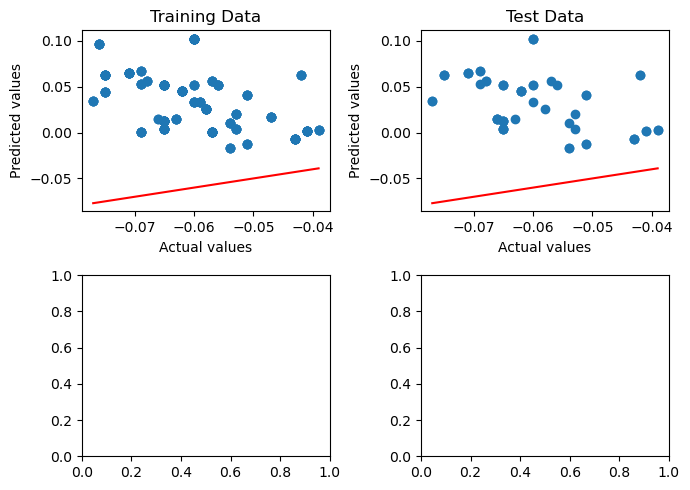

<Figure size 640x480 with 0 Axes>

[c] Epoch [1200/2000], Loss: 0.0011
Train R²:  -11.50080
Test R² :  -10.10949


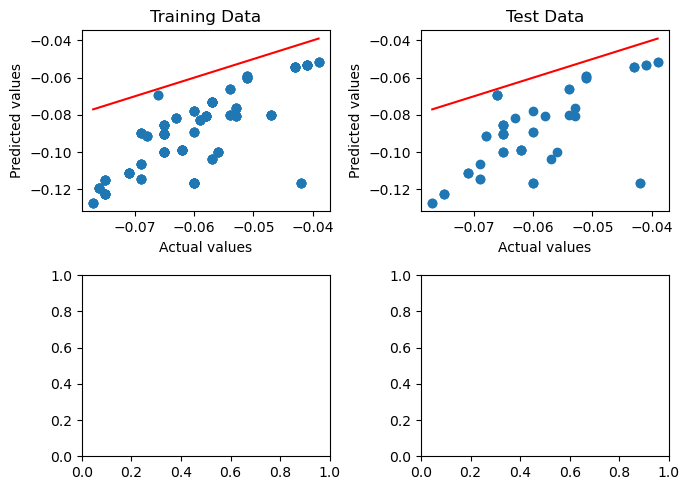

<Figure size 640x480 with 0 Axes>

[c] Epoch [1220/2000], Loss: 0.0001
Train R²:  0.24459
Test R² :  0.10312


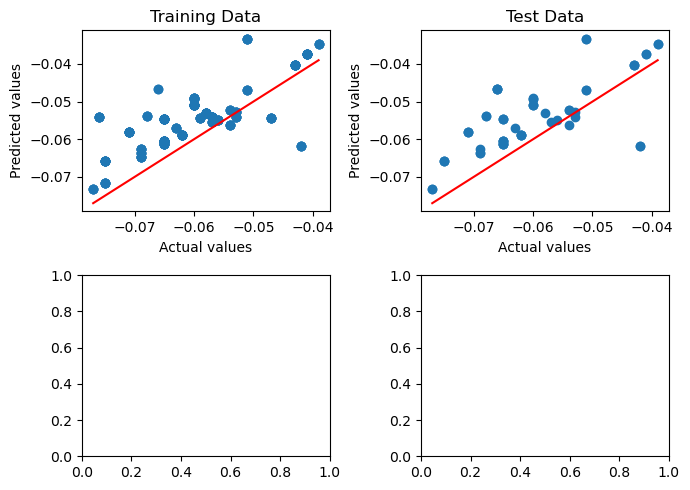

<Figure size 640x480 with 0 Axes>

[c] Epoch [1240/2000], Loss: 0.0001
Train R²:  0.35206
Test R² :  0.24462


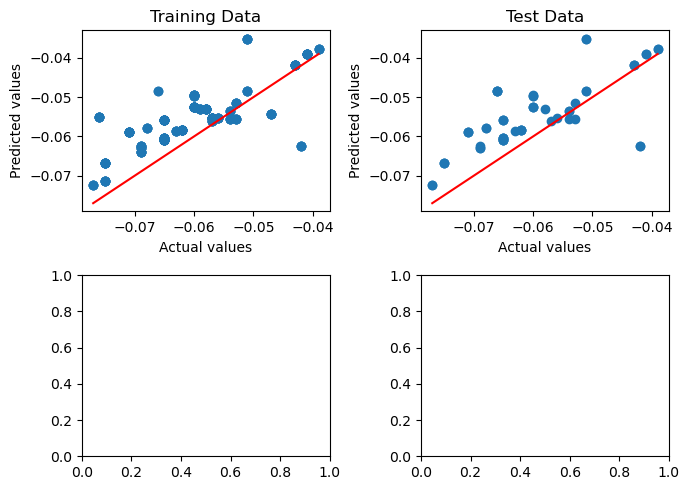

<Figure size 640x480 with 0 Axes>

[c] Epoch [1260/2000], Loss: 0.0000
Train R²:  0.64792
Test R² :  0.50071


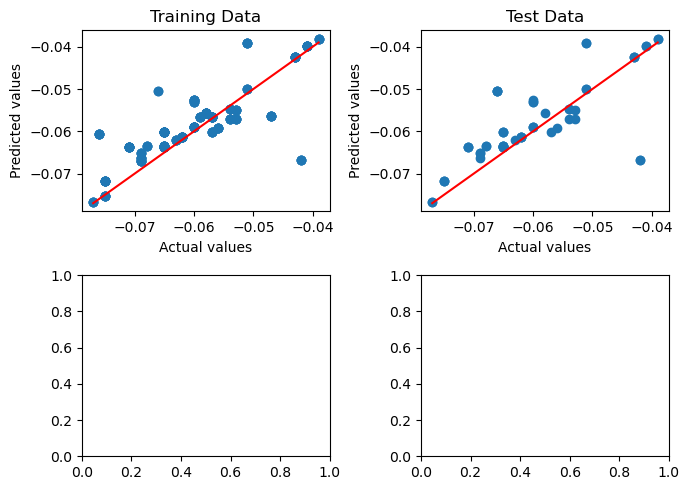

<Figure size 640x480 with 0 Axes>

[c] Epoch [1280/2000], Loss: 0.0000
Train R²:  0.68538
Test R² :  0.53687


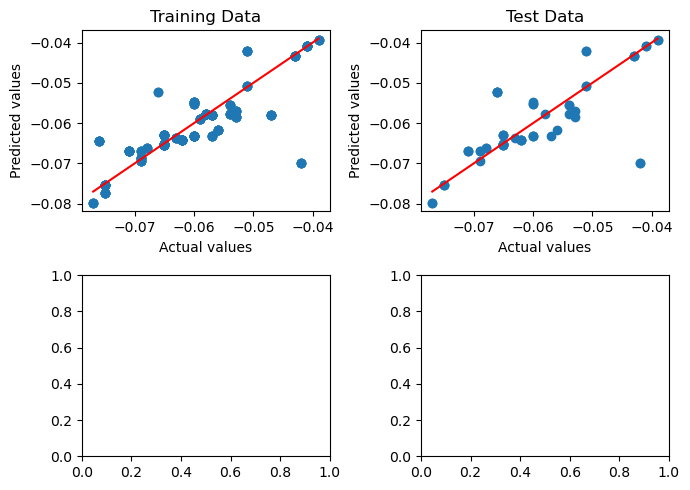

<Figure size 640x480 with 0 Axes>

[c] Epoch [1300/2000], Loss: 0.0002
Train R²:  -1.31333
Test R² :  -1.18304


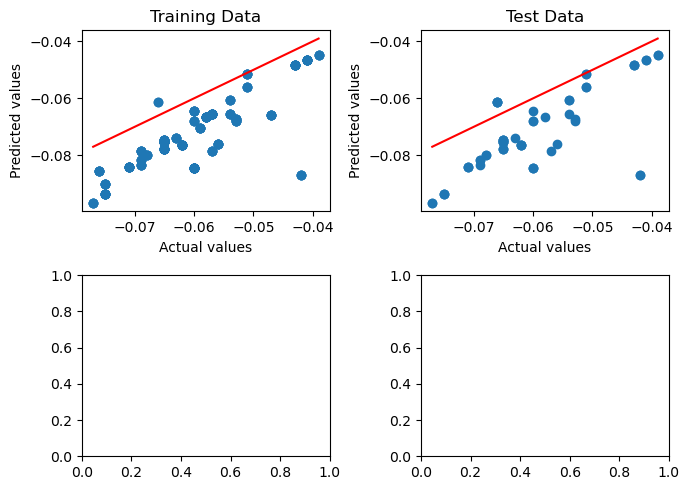

<Figure size 640x480 with 0 Axes>

[c] Epoch [1320/2000], Loss: 0.0070
Train R²:  -76.12542
Test R² :  -65.77733


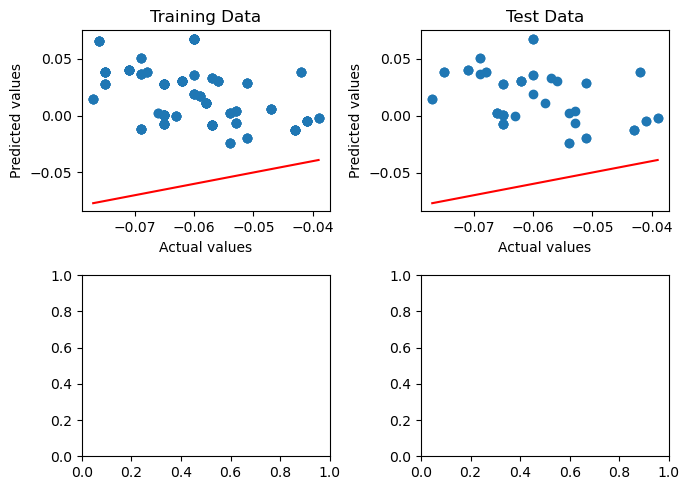

<Figure size 640x480 with 0 Axes>

[c] Epoch [1340/2000], Loss: 0.0023
Train R²:  -24.41005
Test R² :  -20.97831


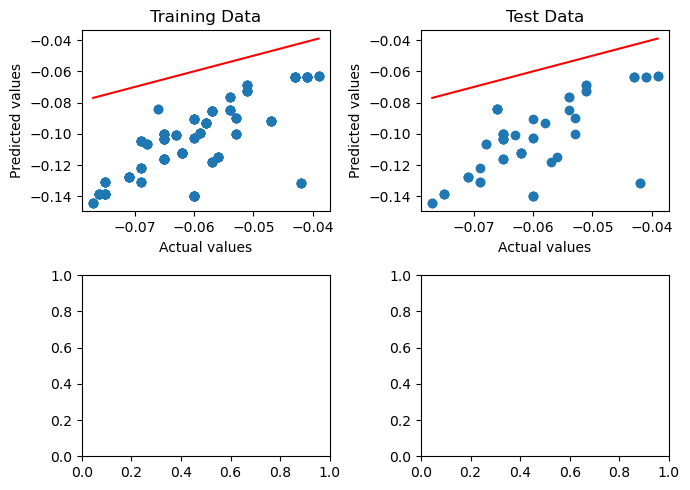

<Figure size 640x480 with 0 Axes>

[c] Epoch [1360/2000], Loss: 0.0001
Train R²:  0.32916
Test R² :  0.22108


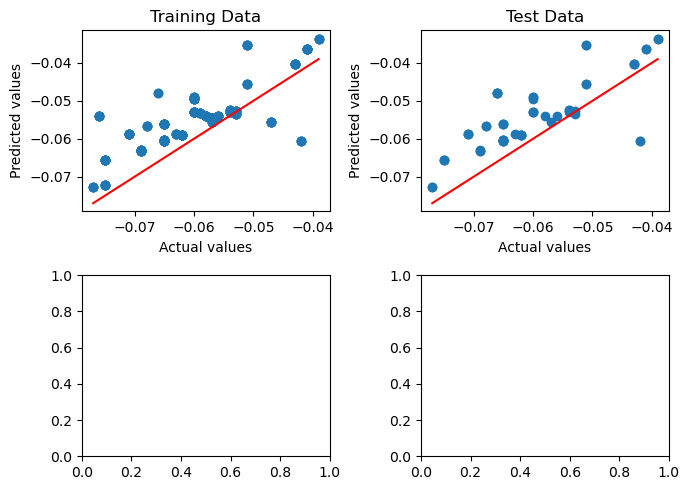

<Figure size 640x480 with 0 Axes>

[c] Epoch [1380/2000], Loss: 0.0000
Train R²:  0.68168
Test R² :  0.54739


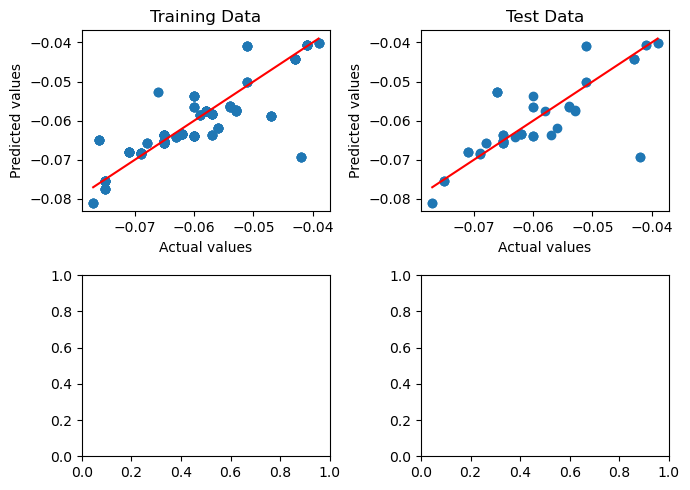

<Figure size 640x480 with 0 Axes>

[c] Epoch [1400/2000], Loss: 0.0000
Train R²:  0.65285
Test R² :  0.53381


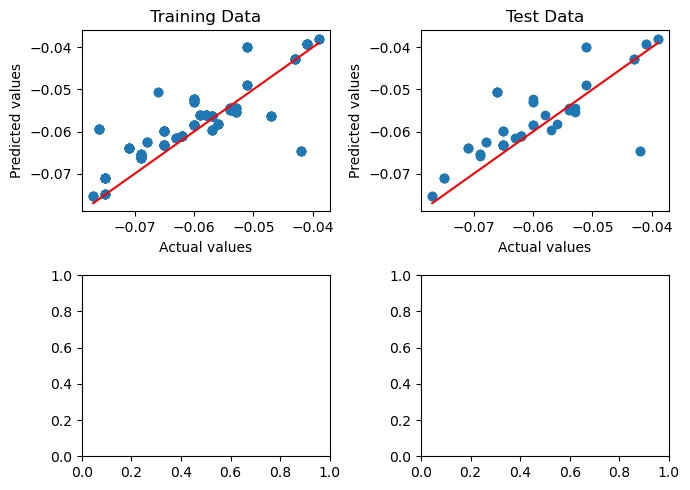

<Figure size 640x480 with 0 Axes>

[c] Epoch [1420/2000], Loss: 0.0000
Train R²:  0.71704
Test R² :  0.59841


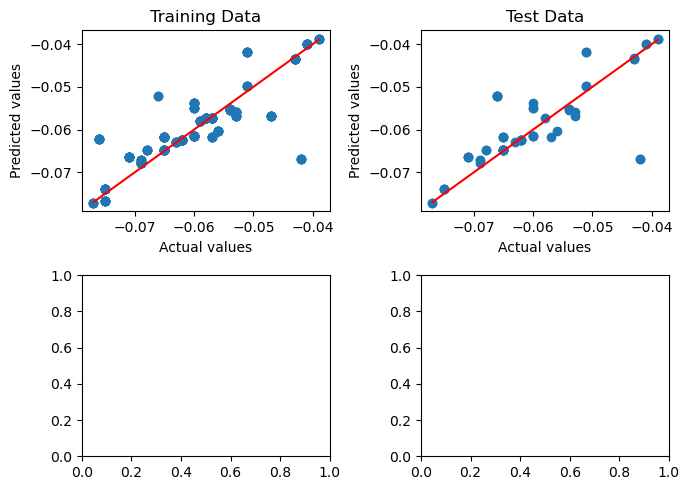

<Figure size 640x480 with 0 Axes>

[c] Epoch [1440/2000], Loss: 0.0000
Train R²:  0.72592
Test R² :  0.60929


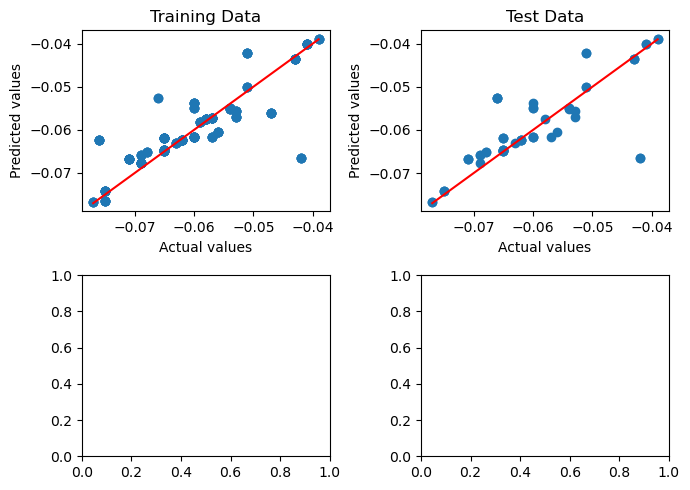

<Figure size 640x480 with 0 Axes>

[c] Epoch [1460/2000], Loss: 0.0000
Train R²:  0.73338
Test R² :  0.62003


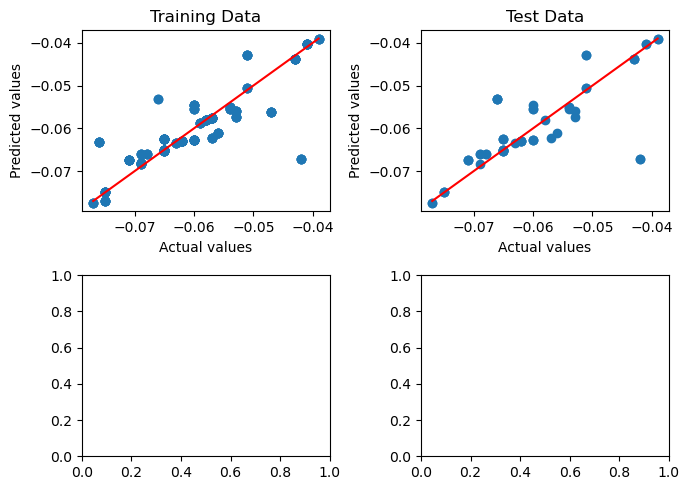

<Figure size 640x480 with 0 Axes>

[c] Epoch [1480/2000], Loss: 0.0000
Train R²:  0.61787
Test R² :  0.52408


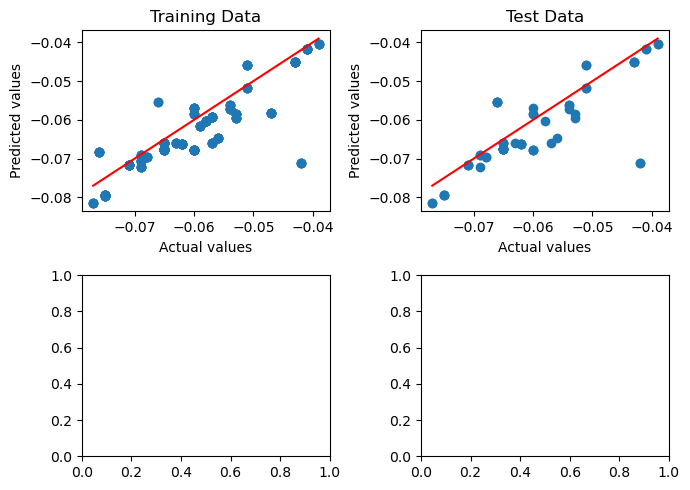

<Figure size 640x480 with 0 Axes>

[c] Epoch [1500/2000], Loss: 0.0537
Train R²:  -588.51546
Test R² :  -510.85542


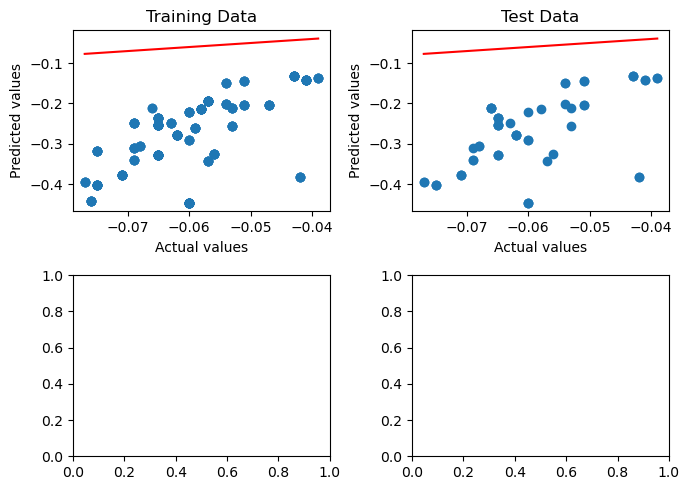

<Figure size 640x480 with 0 Axes>

[c] Epoch [1520/2000], Loss: 0.0010
Train R²:  -9.56954
Test R² :  -8.42043


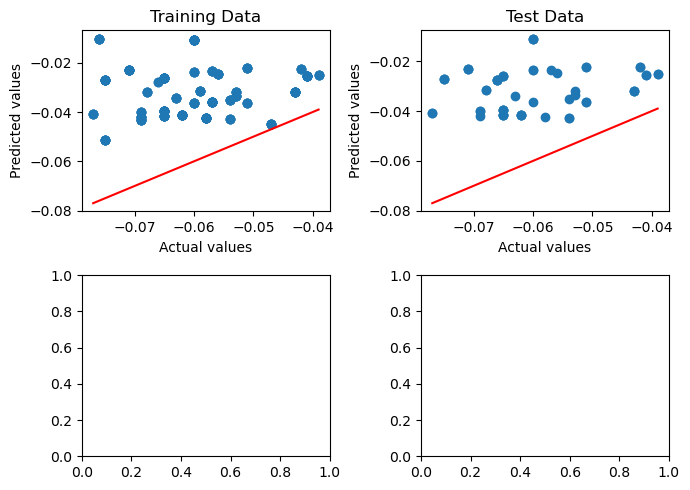

<Figure size 640x480 with 0 Axes>

[c] Epoch [1540/2000], Loss: 0.0005
Train R²:  -4.10003
Test R² :  -3.61040


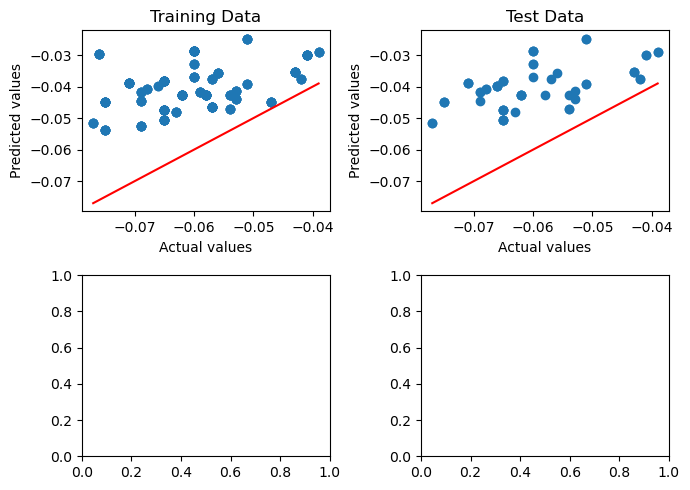

<Figure size 640x480 with 0 Axes>

[c] Epoch [1560/2000], Loss: 0.0001
Train R²:  -0.05165
Test R² :  -0.04584


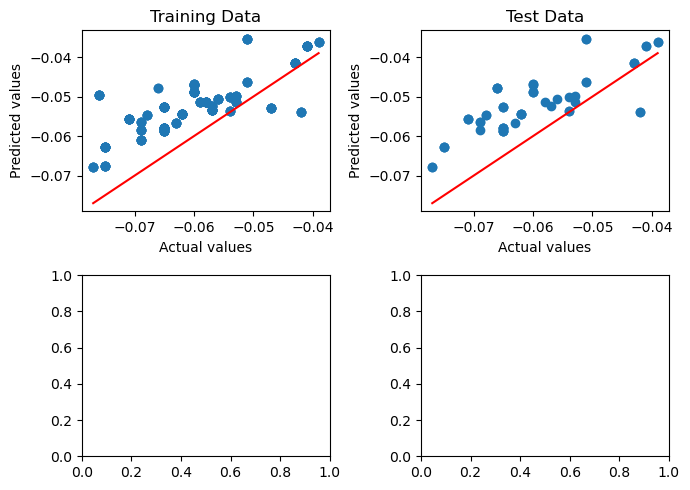

<Figure size 640x480 with 0 Axes>

[c] Epoch [1580/2000], Loss: 0.0000
Train R²:  0.66683
Test R² :  0.59702


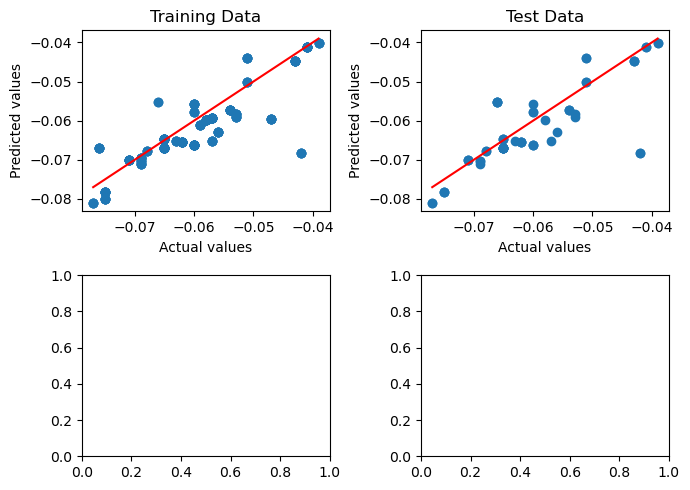

<Figure size 640x480 with 0 Axes>

[c] Epoch [1600/2000], Loss: 0.0000
Train R²:  0.74135
Test R² :  0.65836


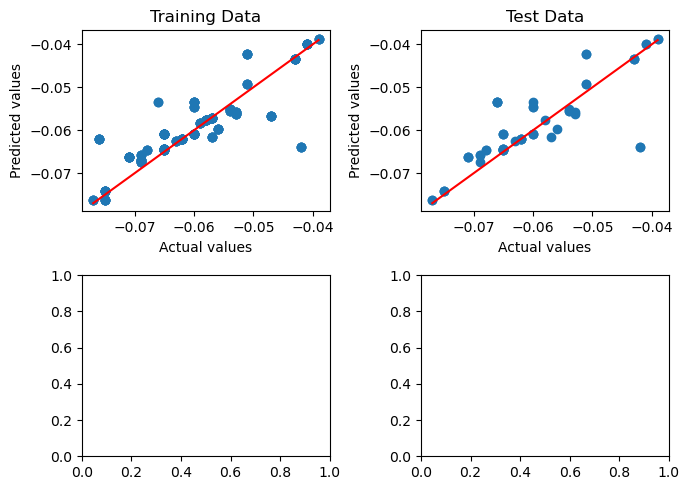

<Figure size 640x480 with 0 Axes>

[c] Epoch [1620/2000], Loss: 0.0000
Train R²:  0.75502
Test R² :  0.67388


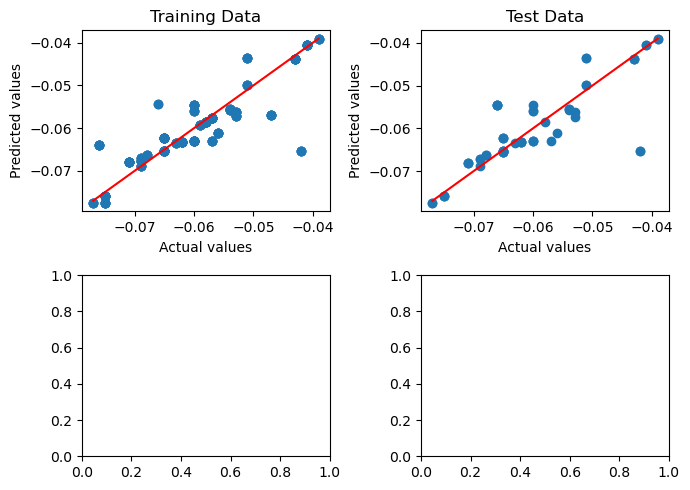

<Figure size 640x480 with 0 Axes>

[c] Epoch [1640/2000], Loss: 0.0000
Train R²:  0.76533
Test R² :  0.68370


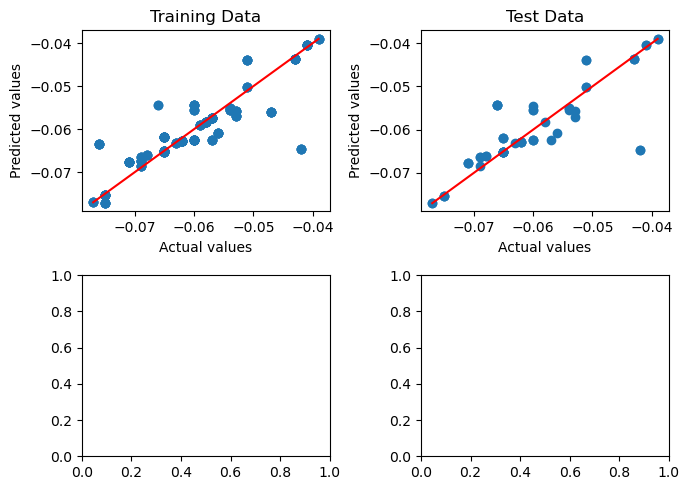

<Figure size 640x480 with 0 Axes>

[c] Epoch [1660/2000], Loss: 0.0000
Train R²:  0.77069
Test R² :  0.68817


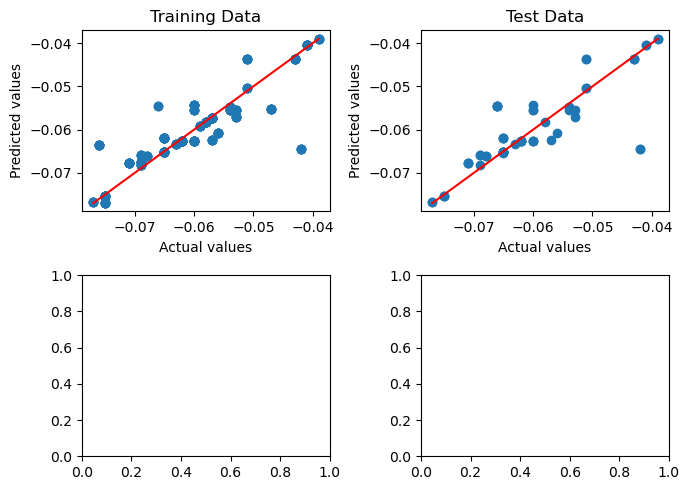

<Figure size 640x480 with 0 Axes>

[c] Epoch [1680/2000], Loss: 0.0000
Train R²:  0.77518
Test R² :  0.69494


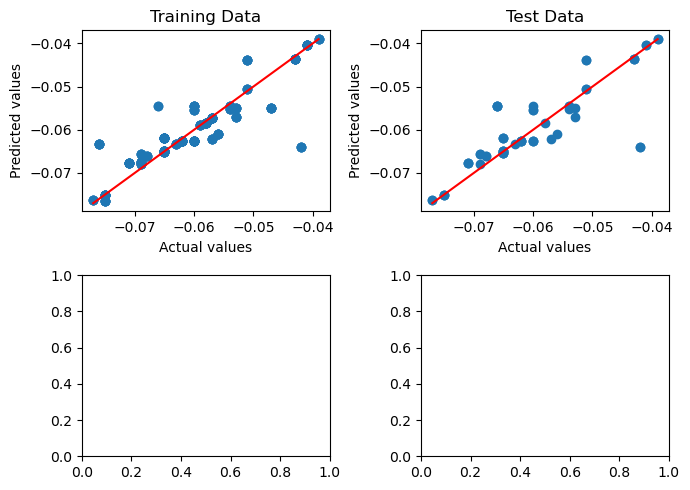

<Figure size 640x480 with 0 Axes>

[c] Epoch [1700/2000], Loss: 0.0000
Train R²:  0.77860
Test R² :  0.70021


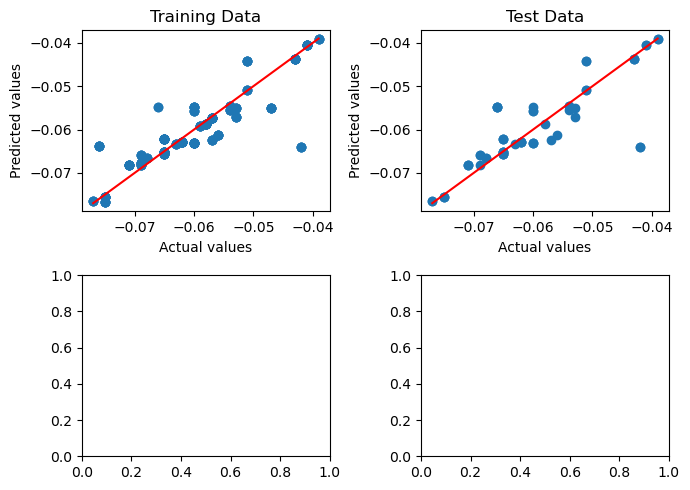

<Figure size 640x480 with 0 Axes>

[c] Epoch [1720/2000], Loss: 0.0002
Train R²:  -1.26152
Test R² :  -1.07499


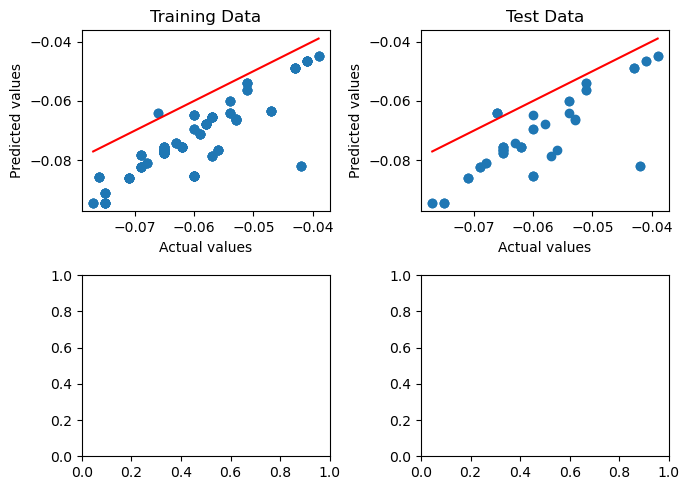

<Figure size 640x480 with 0 Axes>

[c] Epoch [1740/2000], Loss: 0.0266
Train R²:  -291.44756
Test R² :  -251.53212


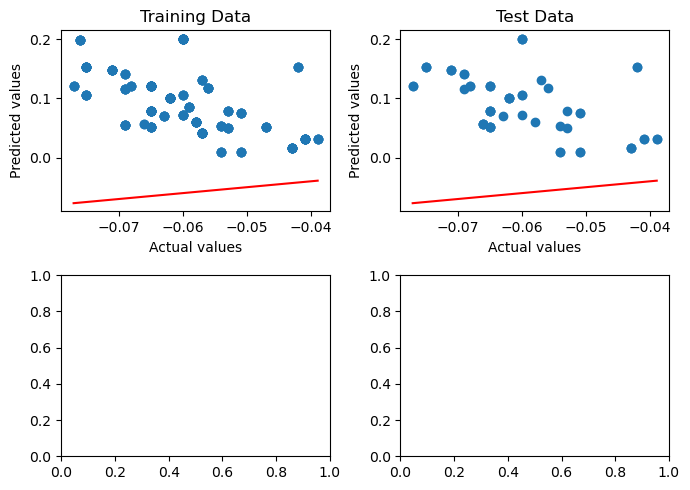

<Figure size 640x480 with 0 Axes>

[c] Epoch [1760/2000], Loss: 0.0030
Train R²:  -31.56764
Test R² :  -27.61672


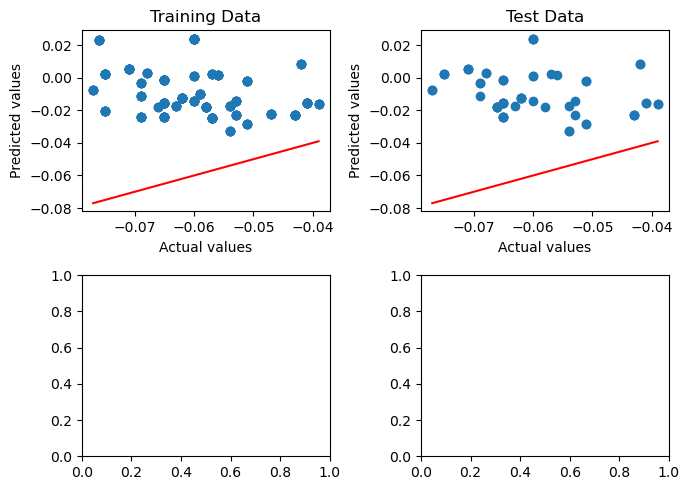

<Figure size 640x480 with 0 Axes>

[c] Epoch [1780/2000], Loss: 0.0004
Train R²:  -3.31020
Test R² :  -2.90357


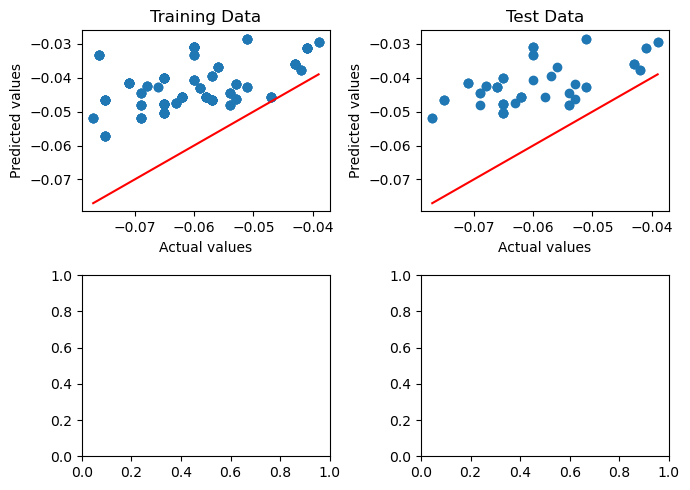

<Figure size 640x480 with 0 Axes>

[c] Epoch [1800/2000], Loss: 0.0001
Train R²:  0.25494
Test R² :  0.24671


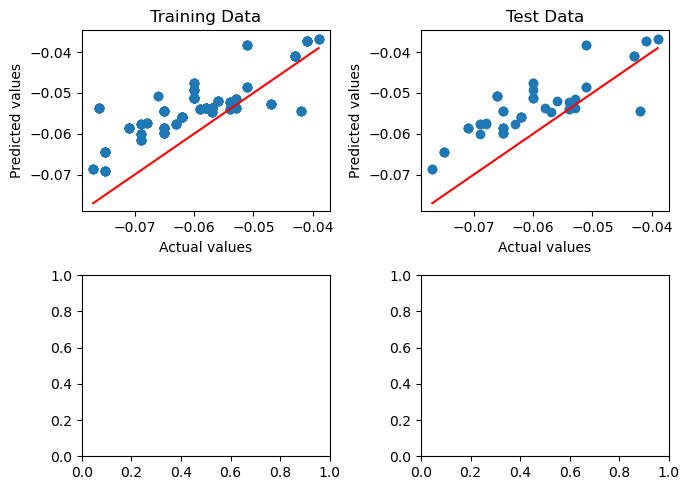

<Figure size 640x480 with 0 Axes>

[c] Epoch [1820/2000], Loss: 0.0000
Train R²:  0.77485
Test R² :  0.70711


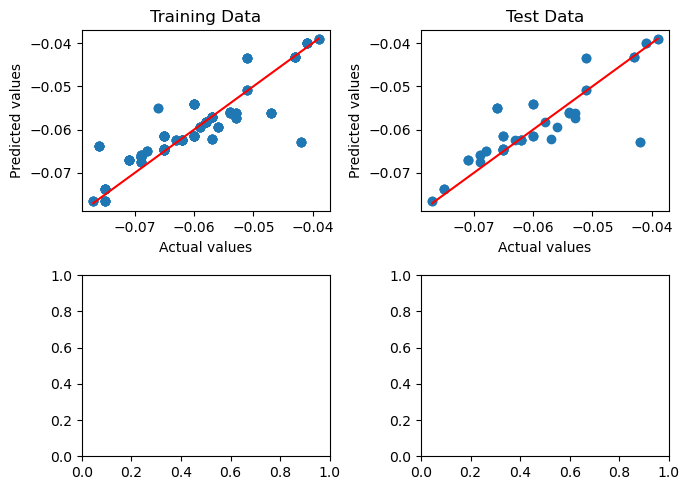

<Figure size 640x480 with 0 Axes>

[c] Epoch [1840/2000], Loss: 0.0000
Train R²:  0.77698
Test R² :  0.70886


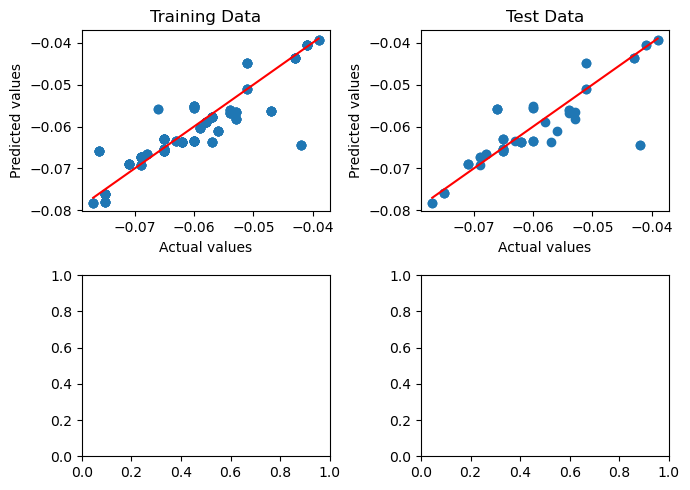

<Figure size 640x480 with 0 Axes>

[c] Epoch [1860/2000], Loss: 0.0000
Train R²:  0.79029
Test R² :  0.71819


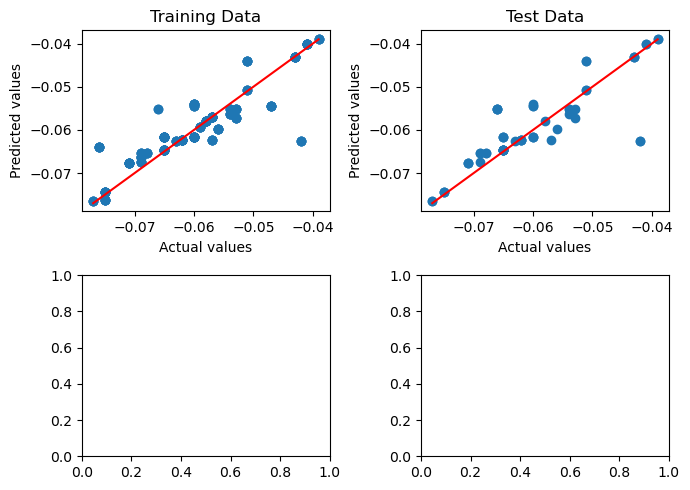

<Figure size 640x480 with 0 Axes>

[c] Epoch [1880/2000], Loss: 0.0000
Train R²:  0.79627
Test R² :  0.72696


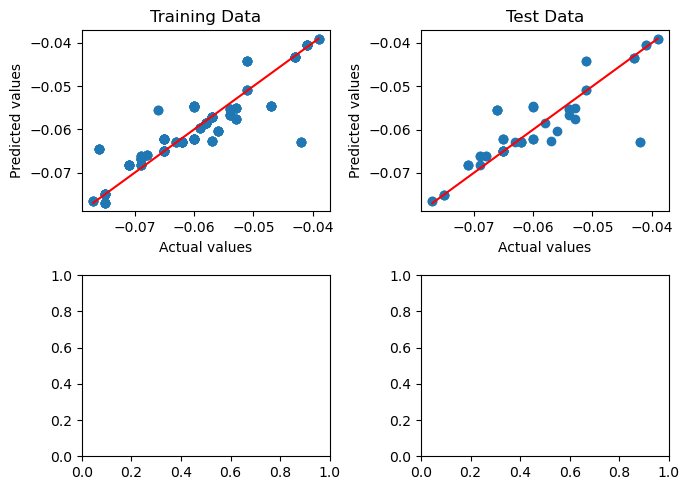

<Figure size 640x480 with 0 Axes>

[c] Epoch [1900/2000], Loss: 0.0000
Train R²:  0.79966
Test R² :  0.73313


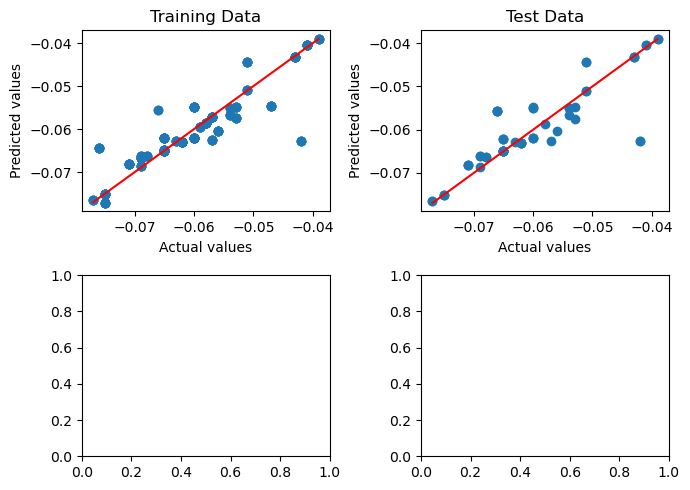

<Figure size 640x480 with 0 Axes>

[c] Epoch [1920/2000], Loss: 0.0000
Train R²:  0.80252
Test R² :  0.73855


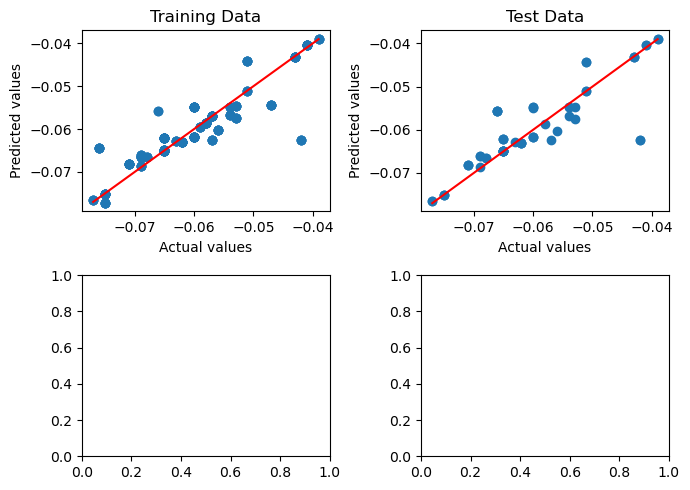

<Figure size 640x480 with 0 Axes>

[c] Epoch [1940/2000], Loss: 0.0000
Train R²:  0.80514
Test R² :  0.74255


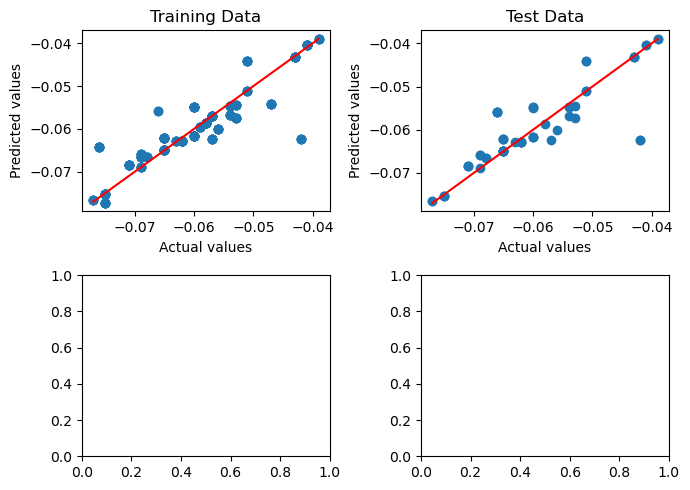

<Figure size 640x480 with 0 Axes>

[c] Epoch [1960/2000], Loss: 0.0000
Train R²:  0.80743
Test R² :  0.74618


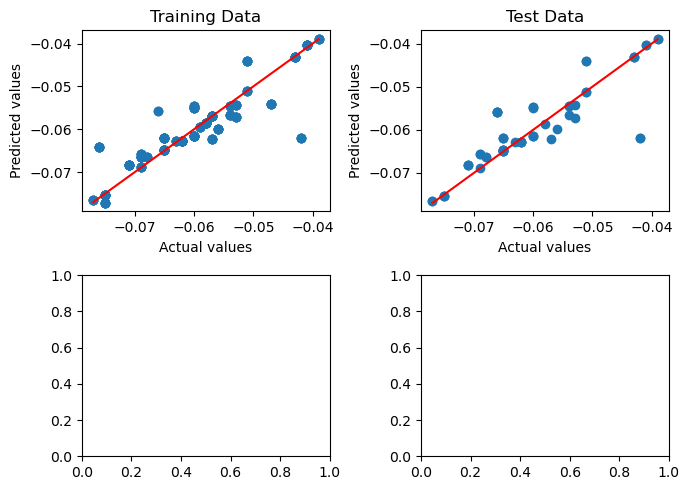

<Figure size 640x480 with 0 Axes>

[c] Epoch [1980/2000], Loss: 0.0000
Train R²:  0.64844
Test R² :  0.61129


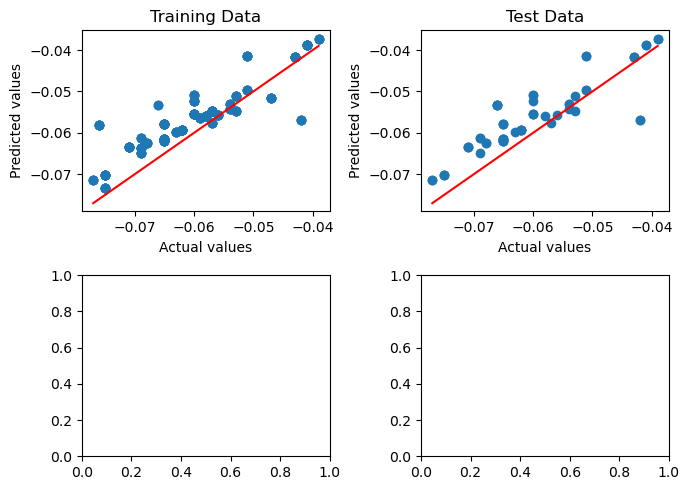

<Figure size 640x480 with 0 Axes>

[c] Epoch [2000/2000], Loss: 0.0322
Train R²:  -352.83203
Test R² :  -304.63468


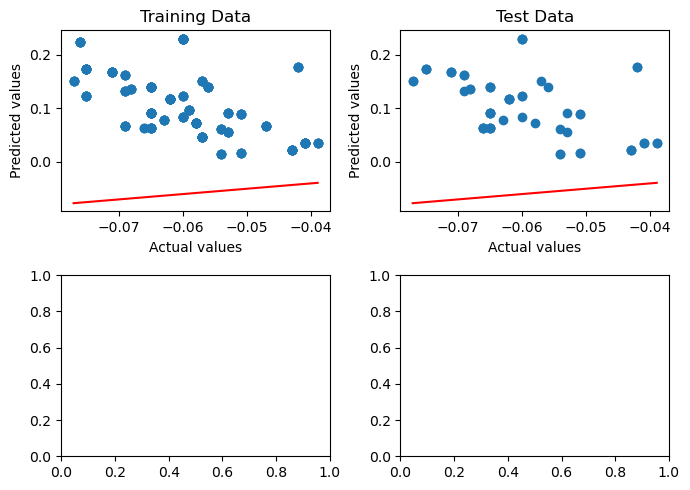

<Figure size 640x480 with 0 Axes>

In [15]:
GBR_NN(9)

---

# Pure DNN Model

### Auto Function

In [ ]:
def DNN(variable, test_s):
    
    # 1. Prepare the data
    df_x = pd.read_excel(root,usecols=[0,1,2,3,4])
    df_y = pd.read_excel(root,usecols=[variable])
    
    X_train, X_test, y_train, y_test = train_test_split(df_x, df_y, test_size = test_s, random_state = 42)
    
    y_train = np.array(y_train,dtype = np.float32).ravel()
    y_test = np.array(y_test,dtype = np.float32).ravel()
    
    X_train = np.array(X_train)
    X_test = np.array(X_test)
    
    # Convert data to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)
    
    class RegressionNN(nn.Module):
        def __init__(self, input_size):
            super(RegressionNN, self).__init__()
            self.fc1 = nn.Linear(input_size, 64)
            self.fc2 = nn.Linear(64, 128)
            self.fc3 = nn.Linear(128, 256)
            self.fc4 = nn.Linear(256, 128)
            self.fc5 = nn.Linear(128, 64)
            self.fc6 = nn.Linear(64, 1)
       
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = torch.relu(self.fc3(x))
            x = torch.relu(self.fc4(x))
            x = torch.relu(self.fc5(x))
            x = self.fc6(x)
            return x
    
    # Create the neural network
    input_size = X_train.shape[1]
    model = RegressionNN(input_size)
    
    # 4. Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.0001)

    # Regularization parameters
    lambda_l1 = 0   # L1 penalty strength
    lambda_l2 = 0   # L2 penalty strength

    # L2 can also be directly included in the optimizer as weight_decay
    optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=lambda_l2)
    
    plt.ion()
    
    # 5. Train the Neural Network
    n_epochs = 2000 # Default 1000
    for epoch in range(n_epochs):
        model.train()
       
        # Forward pass
        y_train_pred = model(X_train_tensor)
        y_test_pred  = model(X_test_tensor)
        loss = criterion(y_train_pred, y_train_tensor)

        # Add L1 Regularization
        l1_norm = sum(param.abs().sum() for param in model.parameters())
        loss += lambda_l1 * l1_norm
       
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        var_train = r2_score(y_train_tensor.data.numpy(), y_train_pred.detach().numpy())
        var_test  = r2_score(y_test_tensor.data.numpy(), y_test_pred.detach().numpy())

        if (epoch + 1) % 20 == 0:
            print(f'Epoch [{epoch+1}/{n_epochs}], Loss: {loss.item():.4f}')
            print("Train R^2: ", var_train)
            print("Test  R^2: ", var_test)
    
            fig, axes = plt.subplots(2, 2, figsize = (7, 5))
            axes[0, 0].scatter(y_train_tensor, y_train_pred.detach().numpy())
            axes[0, 0].plot([min(y_train_tensor.data.numpy()), max(y_train_tensor.data.numpy())],[min(y_train_tensor.data.numpy()), max(y_train_tensor.data.numpy())], color = 'r')
            axes[0, 0].set_title("Training Data")
            axes[0, 0].set_xlabel("Actual values")
            axes[0, 0].set_ylabel("Predicted values")
    
            axes[0, 1].scatter(y_test_tensor, y_test_pred.detach().numpy())
            axes[0, 1].plot([min(y_test_tensor.data.numpy()), max(y_test_tensor.data.numpy())],[min(y_test_tensor.data.numpy()), max(y_test_tensor.data.numpy())], color = 'r')
            axes[0, 1].set_title("Test Data")
            axes[0, 1].set_xlabel("Actual values")
            axes[0, 1].set_ylabel("Predicted values")
    
            axes[1, 0].plot(y_train_tensor.data.numpy().squeeze()*10,'tab:orange', label = 'real')
            axes[1, 0].plot(y_train_pred.detach().numpy()*10,'tab:green',label = 'pred')
            axes[1, 0].set_xlabel("Sample Number")
            axes[1, 0].set_ylabel("Fatigue Constant Value")
            axes[1, 0].legend()
    
            axes[1, 1].plot(y_test_tensor.data.numpy().squeeze()*10, 'tab:orange',label = 'real')
            axes[1, 1].plot(y_test_pred.detach().numpy()*10,'tab:green',label = 'pred')
            axes[1, 1].set_xlabel("Sample Number")
            axes[1, 1].set_ylabel("Fatigue Constant Value")
            axes[1, 1].legend()

            plt.tight_layout()
    
            plt.draw();plt.pause(0.05)
    
    plt.ioff()
    plt.show()
    
    # 6. Evaluate the model on the test data
    model.eval()
    with torch.no_grad():
        test_predictions = model(X_test_tensor)
        test_loss = mean_squared_error(y_test_tensor.numpy(), test_predictions.numpy())
        print(f'Test MSE: {test_loss:.4f}')

### Manual Code

In [ ]:
def DNN(variable, test_s, rand_s):
    # 1. Prepare the data
    df_x = pd.read_excel(root,usecols=[0,1,2,3])
    df_y = pd.read_excel(root,usecols=[variable])
    
    X_train, X_test, y_train, y_test = train_test_split(df_x, df_y, test_size = test_s, random_state = rand_s)
    
    y_train = np.array(y_train,dtype = np.float32).ravel()
    y_test = np.array(y_test,dtype = np.float32).ravel()
    
    X_train = np.array(X_train)
    X_test = np.array(X_test)
    
    # Convert data to PyTorch tensors
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float32).unsqueeze(1)
    
    class RegressionNN(nn.Module):
        def __init__(self, input_size):
            super(RegressionNN, self).__init__()
            self.fc1 = nn.Linear(input_size, 64)
            self.fc2 = nn.Linear(64, 128)
            self.fc3 = nn.Linear(128, 256)
            self.fc4 = nn.Linear(256, 128)
            self.fc5 = nn.Linear(128, 64)
            self.fc6 = nn.Linear(64, 1)
       
        def forward(self, x):
            x = torch.relu(self.fc1(x))
            x = torch.relu(self.fc2(x))
            x = torch.relu(self.fc3(x))
            x = torch.relu(self.fc4(x))
            x = torch.relu(self.fc5(x))
            x = self.fc6(x)
            return x
    
    # Create the neural network
    input_size = X_train.shape[1]
    model = RegressionNN(input_size)
    
    # 4. Define loss function and optimizer
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.0001)
    
    plt.ion()
    
    # 5. Train the Neural Network
    n_epochs = 2000 # Default 1000
    for epoch in range(n_epochs):
        model.train()
       
        # Forward pass
        y_train_pred = model(X_train_tensor)
        y_test_pred  = model(X_test_tensor)
        loss = criterion(y_train_pred, y_train_tensor)
       
        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        var_train = r2_score(y_train_tensor.data.numpy(), y_train_pred.detach().numpy())
        var_test  = r2_score(y_test_tensor.data.numpy(), y_test_pred.detach().numpy())
       
        if (epoch+1) % 20 == 0: # Default 10
            print(f'Epoch [{epoch+1}/{n_epochs}], Loss: {loss.item():.4f}')
            print("Train R^2: ", var_train)
            print("Test  R^2: ", var_test)
    
            fig, axes = plt.subplots(2, 2, figsize = (7, 7))
            axes[0, 0].scatter(y_train_tensor, y_train_pred.detach().numpy())
            axes[0, 0].plot([min(y_train_tensor.data.numpy()), max(y_train_tensor.data.numpy())],[min(y_train_tensor.data.numpy()), max(y_train_tensor.data.numpy())], color = 'r')
            axes[0, 0].set_title("Training Data")
            axes[0, 0].set_xlabel("Actual values")
            axes[0, 0].set_ylabel("Predicted values")
    
            axes[0, 1].scatter(y_test_tensor, y_test_pred.detach().numpy())
            axes[0, 1].plot([min(y_test_tensor.data.numpy()), max(y_test_tensor.data.numpy())],[min(y_test_tensor.data.numpy()), max(y_test_tensor.data.numpy())], color = 'r')
            axes[0, 1].set_title("Test Data")
            axes[0, 1].set_xlabel("Actual values")
            axes[0, 1].set_ylabel("Predicted values")
    
            axes[1, 0].plot(y_train_tensor.data.numpy().squeeze()*10,'tab:orange', label = 'real')
            axes[1, 0].plot(y_train_pred.detach().numpy()*10,'tab:green',label = 'pred')
    
            axes[1, 1].plot(y_test_tensor.data.numpy().squeeze()*10, 'tab:orange',label = 'real')
            axes[1, 1].plot(y_test_pred.detach().numpy()*10,'tab:green',label = 'pred')
    
            plt.draw();plt.pause(0.05)
    
    plt.ioff()
    plt.show()
    
    # 6. Evaluate the model on the test data
    model.eval()
    with torch.no_grad():
        test_predictions = model(X_test_tensor)
        test_loss = mean_squared_error(y_test_tensor.numpy(), test_predictions.numpy())
        print(f'Test MSE: {test_loss:.4f}')

## Variable Testing

In [ ]:
DNN(5, 0.2)

In [ ]:
DNN(6, 0.2)

---

# Pure GBR

In [ ]:
def GBR(variable, test_s):

    # Prepare the data
    df_x = pd.read_excel(root,usecols=[0,1,2,3])
    df_y = pd.read_excel(root,usecols=[variable])
    
    X_train, X_test, y_train, y_test = train_test_split(df_x, df_y, test_size = test_s, random_state = 42)
    
    y_train = np.array(y_train,dtype = np.float32).ravel()
    y_test = np.array(y_test,dtype = np.float32).ravel()
    
    # Train the Gradient Boosting Regressor #Original: 10000, 0.01, 2, tol 1e-5
    gbr = GradientBoostingRegressor(n_estimators = 10000, learning_rate = 0.01, max_depth = 2, random_state = 42, tol = 1e-6)
    gbr.fit(X_train, y_train)
    
    # Get the predictions from Gradient Boosting Regressor
    y_train_pred = gbr.predict(X_train)
    y_test_pred = gbr.predict(X_test)

    # R2 Scores
    var_train = r2_score(y_train, y_train_pred)
    var_test  = r2_score(y_test, y_test_pred)

    print("Train R^2: ", var_train)
    print("Test  R^2: ", var_test)

    fig, axes = plt.subplots(2, 2, figsize = (7,5))
    axes[0, 0].scatter(y_train, y_train_pred)
    axes[0, 0].plot([min(y_train), max(y_train)],[min(y_train), max(y_train)], color = 'r')
    axes[0, 0].set_title("Training Data")
    axes[0, 0].set_xlabel("Actual values")
    axes[0, 0].set_ylabel("Predicted values")

    axes[0, 1].scatter(y_test, y_test_pred)
    axes[0, 1].plot([min(y_test), max(y_test)],[min(y_test), max(y_test)], color = 'r')
    axes[0, 1].set_title("Test Data")
    axes[0, 1].set_xlabel("Actual values")
    axes[0, 1].set_ylabel("Predicted values")

    axes[1, 0].plot(y_train,'tab:orange', label = 'real')
    axes[1, 0].plot(y_train_pred,'tab:green',label = 'pred')
    axes[1, 0].set_xlabel("Sample Number")
    axes[1, 0].set_ylabel("Fatigue Constant Value")
    axes[1, 0].legend()

    axes[1, 1].plot(y_test, 'tab:orange',label = 'real')
    axes[1, 1].plot(y_test_pred,'tab:green',label = 'pred')
    axes[1, 1].set_xlabel("Sample Number")
    axes[1, 1].set_ylabel("Fatigue Constant Value")
    axes[1, 1].legend()

In [ ]:
GBR(4,0.2)

In [ ]:
GBR(5,0.2)